# Interference from Drone Electronics and Communication

In [2]:
import os
import pandas as pd
import matplotlib.pyplot as plt

def voltage_to_dbm(voltage):
    if voltage > 2:
        return (2.0 / -0.025) + 20.0  # -60 dB
    elif voltage < 0.5:
        return (0.5 / -0.025) + 20.0  # 0 dB
    else:
        return (voltage / -0.025) + 20.0
def make_plot(raw_files: list, processed_files: list,titles_raw:list=[],titles_processed:list=[]):
    # Dictionary to store averages
    average_dbm_per_file = {}
    average_median_dbm_per_file = {}

    # Create subplots
    fig, axes = plt.subplots(3, 2, figsize=(16, 12)) # Increased height slightly for labels
    # fig.suptitle("Sensor Data Comparison", fontsize=16)

    # --- Process and plot raw data ---
    if not raw_files:
        print("Warning: No raw files provided.")
        # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
        for j in range(2):
           axes[0, j].set_visible(False)
    num_raw_plots = min(len(raw_files), 2) # Ensure we don't try to plot more than 2 raw files if only 2 columns
    for i in range(num_raw_plots):
        file = raw_files[i]
        df = pd.read_csv(file)
        filename = os.path.basename(file).replace(".csv", "")
        custom_param = filename.split("_")[-1]
        if(len(titles_raw)>0):
            custom_param = titles_raw[i]
        if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
            df["dBm"] = df["Value"].apply(voltage_to_dbm)
            # Use scatter for raw data points instead of line with '.' marker
            axes[0, i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1) # s=1 for small points
            axes[0, i].set_title(f"Raw Data - {custom_param}")
            axes[0, i].set_xlabel("Elapsed Time (s)")
            axes[0, i].set_ylabel("Power level (dBm)")
            # axes[0, i].set_ylim(-60, -15) # Set common ylim later
            axes[0, i].grid(True)
        else:
             print(f"Warning: Columns 'Elapsed Time (s)' or 'Value' not found in {file}")
             axes[0, i].set_title(f"Raw Data - {custom_param} (Error)")


    # --- Process and plot processed data ---
    if not processed_files:
        print("Warning: No processed files provided.")
        # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
        for j in range(2):
           axes[1, j].set_visible(False)
           axes[2, j].set_visible(False)

    for i,file in enumerate(processed_files):
        try:
            df = pd.read_csv(file)
            filename = os.path.basename(file)
            custom_param = filename.split("_")[-1].replace(".csv", "")
            if(len(titles_processed)>0):
                custom_param = titles_processed[i]
            if {"Average", "Median"}.issubset(df.columns):
                # Calculate overall average/median for the summary plots later
                # Using .mean() on the columns assumes each row in the processed file
                # represents a window/segment. If the processed file *already* contains
                # the single overall average/median, this calculation might be wrong.
                # Assuming the former (multiple rows per file):
                file_avg_average = df["Average"].mean()
                file_avg_median = df["Median"].mean()
                
                # Check for NaN/infinite values which can cause issues
                if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                     average_dbm_per_file[custom_param] = file_avg_average
                     average_median_dbm_per_file[custom_param] = file_avg_median
                else:
                    print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                    continue # Skip plotting this file if averages are invalid

                # Plot the time series (or index series) of Average and Median
                # Assuming the index represents time or sequence if no specific time column exists
                axes[1, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
                axes[1, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

            else:
                print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
                # Potentially disable the plot for this file if columns are missing

        except Exception as e:
            print(f"Error processing file {file}: {e}")
            continue # Skip to the next file if reading/processing fails


    # Titles and legends for processed data plots
    axes[1, 0].set_title("Windowed Average (dBm)")
    axes[1, 1].set_title("Windowed Median (dBm)")
    axes[1, 0].set_xlabel("Time (s)") # Or Time if applicable
    axes[1, 1].set_xlabel("Time (s)") # Or Time if applicable
    axes[1, 0].set_ylabel("Power level (dBm)")
    axes[1, 1].set_ylabel("Power level (dBm)")
    if processed_files: # Only add legend if there's data
        axes[1, 0].legend()
        axes[1, 1].legend()
    axes[1, 0].grid(True)
    axes[1, 1].grid(True)


    # --- Plot average of "Average" per file ---
    # Get the file names (categories) and values for the plot
    avg_file_names = list(average_dbm_per_file.keys())
    avg_values = list(average_dbm_per_file.values())

    axes[2, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
    # Add text labels above markers
    for file_name, avg_value in average_dbm_per_file.items():
        axes[2, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                         ha='center',    # Horizontal alignment
                         va='bottom',    # Vertical alignment
                         fontsize=9)     # Adjust font size as needed

    axes[2, 0].set_title("Overall Average of 'Average' per File (dBm)")
    axes[2, 0].set_xlabel("Custom Parameter (from filename)")
    axes[2, 0].set_ylabel("Power level (dBm)")
    axes[2, 0].tick_params(axis='x', rotation=45)
    axes[2, 0].grid(True)


    # --- Plot average of "Median" per file ---
     # Get the file names (categories) and values for the plot
    med_file_names = list(average_median_dbm_per_file.keys())
    med_values = list(average_median_dbm_per_file.values())

    axes[2, 1].scatter(med_file_names, med_values, color="g", marker="s")
    # Add text labels above markers
    for file_name, avg_value in average_median_dbm_per_file.items():
        axes[2, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                         ha='center',    # Horizontal alignment
                         va='bottom',    # Vertical alignment
                         fontsize=9)     # Adjust font size as needed

    axes[2, 1].set_title("Overall Average of 'Median' per File (dBm)")
    axes[2, 1].set_xlabel("Custom Parameter (from filename)")
    axes[2, 1].set_ylabel("Power level (dBm)")
    axes[2, 1].tick_params(axis='x', rotation=45)
    axes[2, 1].grid(True)

    # Set common y-limits for all plots for better comparison
    common_ylim = (-65, -15)
    for i in range(3):
        for j in range(2):
            if axes[i,j].has_data(): # Only set ylim if plot has data
                axes[i,j].set_ylim(common_ylim)

    # Adjust layout and show plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
    plt.show()

Drone powered on

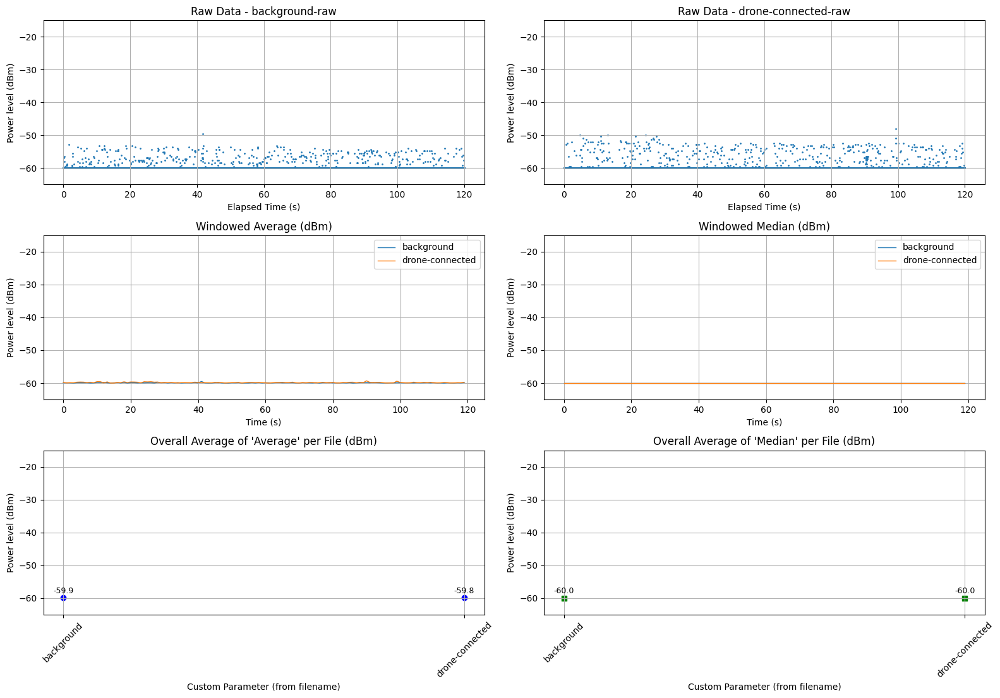

In [57]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-19-04_background-raw.csv",
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv"
]
make_plot(raw_files,processed_files)


To quantify the Baseline measurement: Measuring the background signal without any active drone components a measurement was conducted of 2 minutes, the raw values can be seen in subplot a and as we can observe, measured data is -60 and -50 dbm. When averaged in bins of 1 second it becomes cleared that on average and median shows us -60 dbm. Now to see the influence of Drone powered on: Evaluating the effect of the battery and electronics.as can be observed in subplot b, the signal is higher when looking at the raw data but after averaging this effect disappears and the Average and median are same to the backgound noise. So we can conclude that the battery and other drone electronics have no influence on the drone.

Motor interference

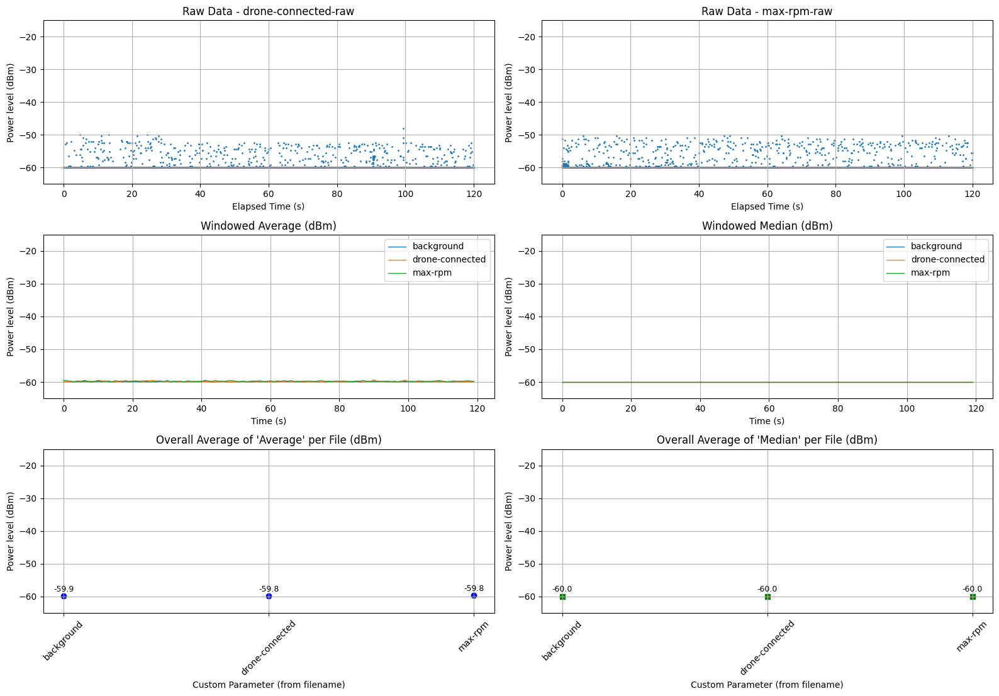

In [58]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv",
    "raw-data\\2025-03-05_17-34-12_max-rpm-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-34-12_max-rpm.csv"
]
make_plot(raw_files,processed_files)



Now Motor interference: Measuring the signal when motors are spinning at maximum RPM to assess the
impact of the electromagnetic field induced by the motors. In the raw data we can see that It has a small effect on the measured signal, however this is again only in the sparse portion of the signal and most of the measured values remain -60 dbm. Also the averages and the medians are similar to the background and drone connected scenarios. So the conculsion that can be made from this is that the electromagnetic field induced by the motors has an effect but this effect is negligible when averaged oud over each second.

Propeller vibration analysis

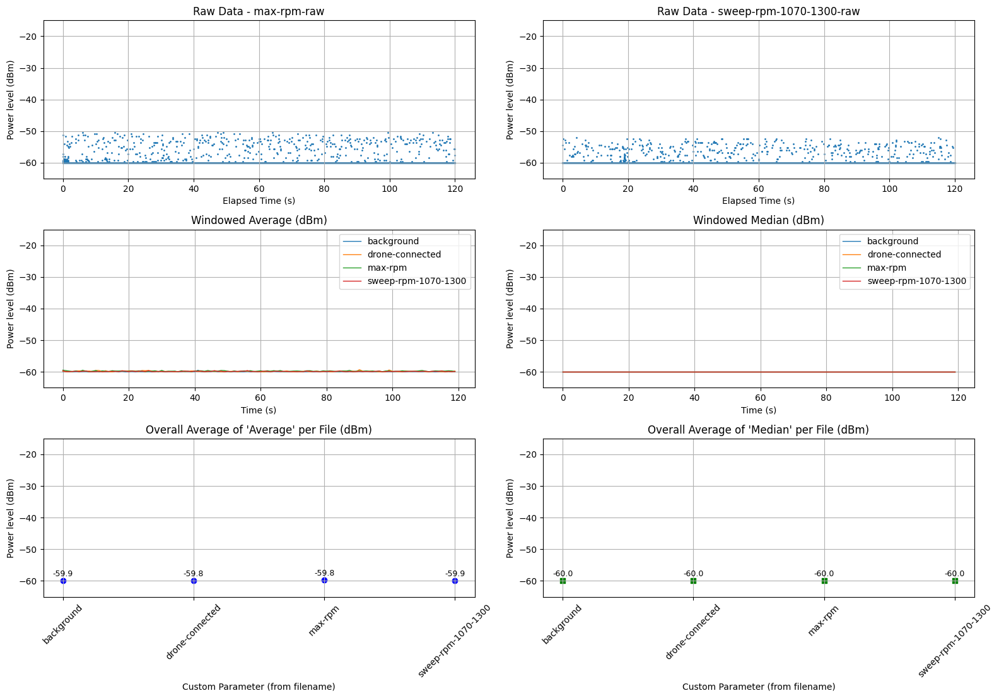

In [59]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-34-12_max-rpm-raw.csv",
    "raw-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300-raw.csv"

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-34-12_max-rpm.csv",
    "processed-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300.csv"
]
make_plot(raw_files,processed_files)



Propeller vibration analysis: Conducting a PWM sweep from 1070 to 1300 (right before hover) to analyze
potential vibration effects. As seen in the raw plots there is no difference betweeen drone powered scenraio and the this scenario. We also see that the signal is stationary, showing that event at 1300PWM there is no influence of the propellors on the mesured value. Simlarly the average and Mdian values are around -60 dbm concluding that this is also has no influence on the measurements.

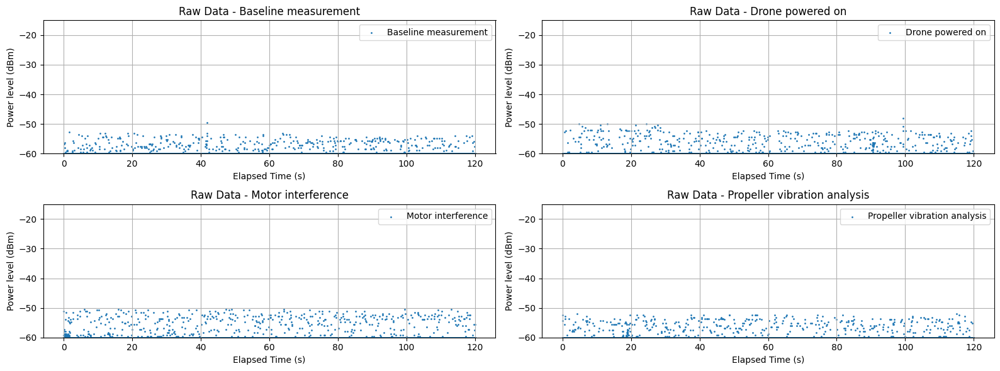

In [60]:
raw_files = [
    "raw-data\\2025-03-05_17-19-04_background-raw.csv",
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv",
    "raw-data\\2025-03-05_17-34-12_max-rpm-raw.csv",
    "raw-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300-raw.csv"
]

titles=["Baseline measurement","Drone powered on","Motor interference","Propeller vibration analysis"]
# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 6))  # Reduced height to fit single row
# fig.suptitle("Raw Data Comparison", fontsize=16)
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]
    custom_param=titles[i]
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1) # s=1 for small points
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("Power level (dBm)")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

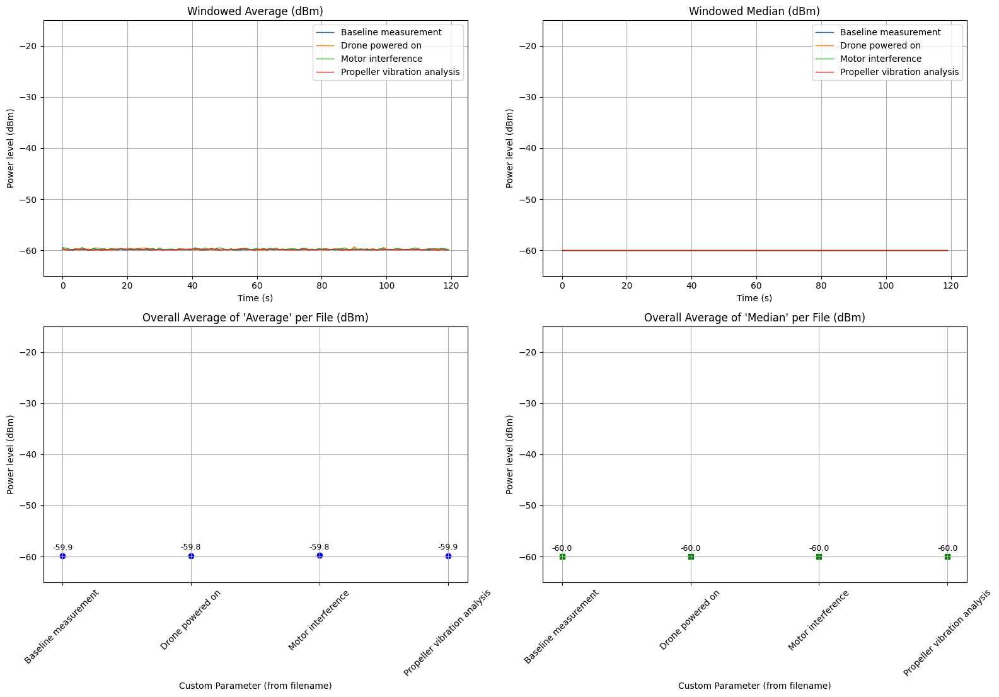

In [61]:
processed_files = [
"processed-data\\2025-03-05_17-19-04_background.csv",
"processed-data\\2025-03-05_17-23-07_drone-connected.csv",
"processed-data\\2025-03-05_17-34-12_max-rpm.csv",
"processed-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300.csv"
]# Dictionary to store averages

titles=["Baseline measurement","Drone powered on","Motor interference","Propeller vibration analysis"]

average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels
# fig.suptitle("Sensor Data Comparison", fontsize=16)


for i,file in enumerate(processed_files):
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")
        custom_param = titles[i]
        
        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 1].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 0].set_ylabel("Power level (dBm)")
axes[0, 1].set_ylabel("Power level (dBm)")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("Power level (dBm)")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("Power level (dBm)")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()

RC connection

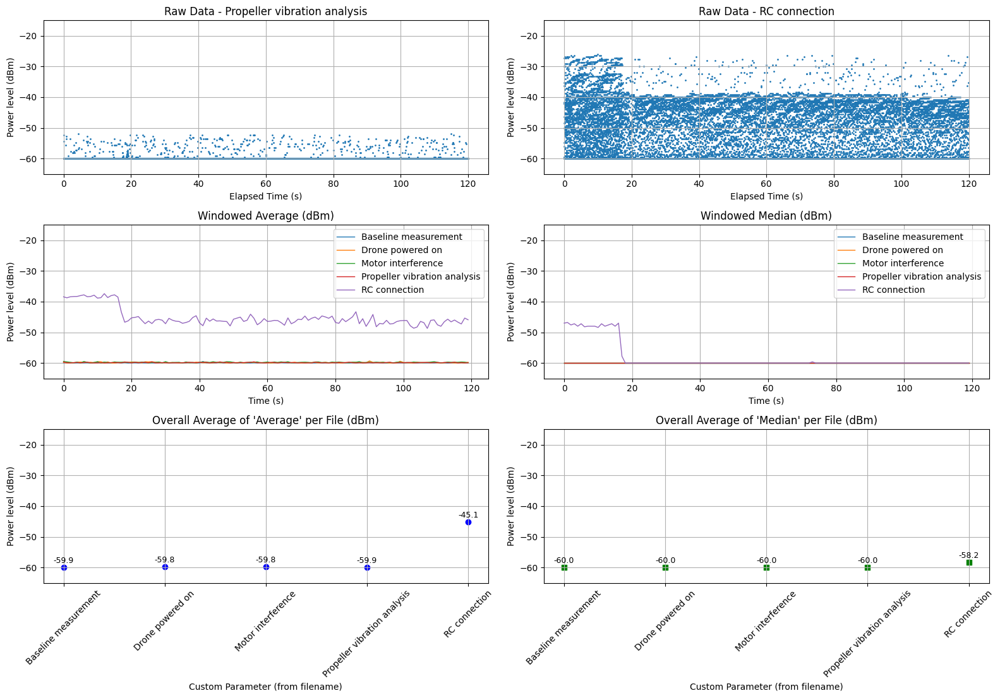

In [62]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300-raw.csv",
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-34-12_max-rpm.csv",
    "processed-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv"
]
titles_raw=["Propeller vibration analysis","RC connection"]
titles_processed=["Baseline measurement","Drone powered on","Motor interference","Propeller vibration analysis","RC connection"]

make_plot(raw_files,processed_files,titles_raw,titles_processed)


With the rc we can observe a startup effect. The duration of this statup effect is around 20 seconds as seen in the fig below showing 3 independent measurments. After the startup effect the Average is around -45 dbm and the median is -60 dbm. When using the median we can successfully suppress the effect of the rc controller. however, when using the average this rc effect can not be ignored.

In [63]:
df=pd.read_csv("raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv")
df["dBm"] = df["Value"].apply(voltage_to_dbm)
df["Second"] = (df["Elapsed Time (s)"]*10).astype(float).astype(int)

# Group by second and calculate statistics
aggregated_df = df.groupby("Second").agg(
    Average=("dBm", "mean"),  # Take the mean in dBm
    Min=("dBm", "min"),
    Max=("dBm", "max"),
    Median=("dBm", "median")
).reset_index()
aggregated_df.Max

0      -27.2
1      -30.0
2      -26.8
3      -29.2
4      -30.0
        ... 
1195   -36.4
1196   -44.0
1197   -41.2
1198   -40.8
1199   -35.2
Name: Max, Length: 1200, dtype: float64

this startup effect was measured 3 times

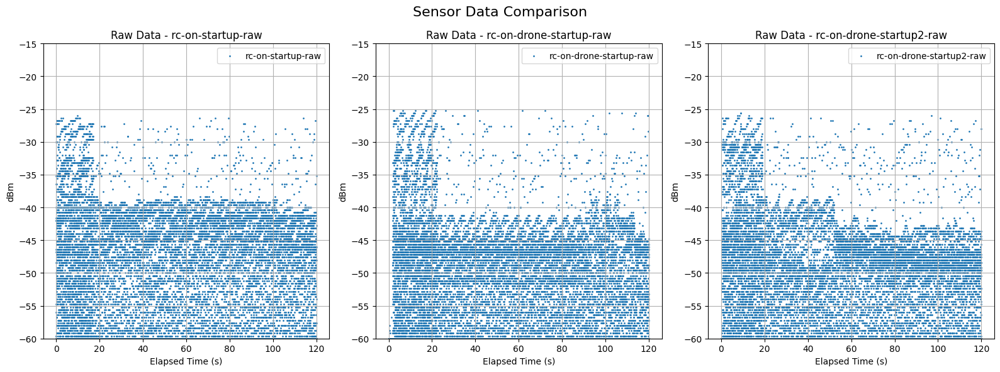

In [64]:

raw_files = [
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    "raw-data\\2025-03-05_18-23-15_rc-on-drone-startup-raw.csv",
    "raw-data\\2025-03-05_18-46-40_rc-on-drone-startup2-raw.csv",
]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1) # s=1 for small points
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

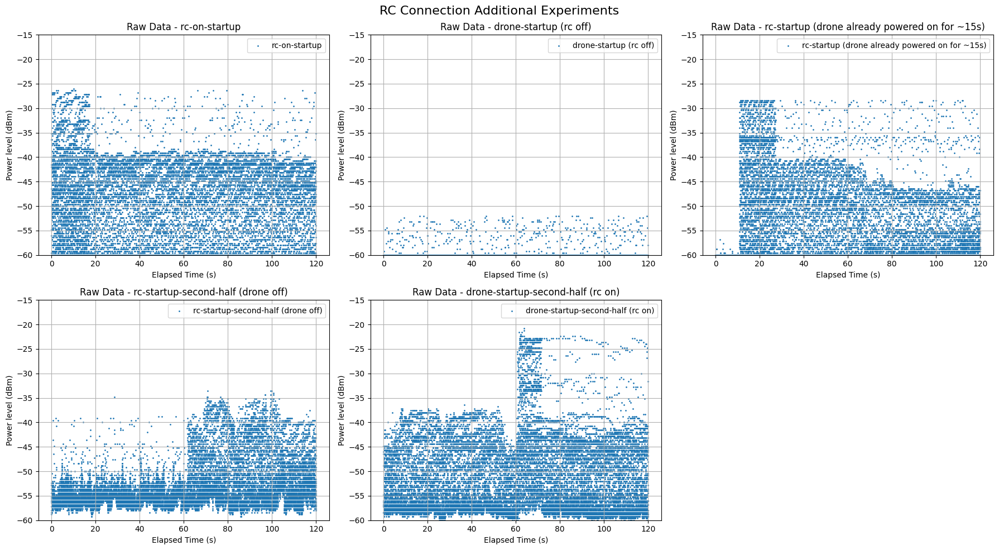

In [65]:
raw_files = [
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    "raw-data\\2025-03-05_18-42-32_drone-connected-startup-raw.csv",
    # "raw-data\\2025-03-05_18-13-10_rc-on-controller-startup-raw.csv",
    "raw-data\\2025-03-31_13-41-28_rc-startup-drone-already-powered-raw.csv",
    "raw-data\\2025-03-05_18-47-01_drone-off-rc-on-second-half-raw.csv",
    "raw-data\\2025-03-05_19-02-28_rc-on-drone-on-second-half-raw.csv"
]

labels=["rc-on-startup",
        "drone-startup (rc off)",
        # "rc-startup (drone already powered on for ~30s)",
        "rc-startup (drone already powered on for ~15s)",
        "rc-startup-second-half (drone off)",
        "drone-startup-second-half (rc on)"
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("RC Connection Additional Experiments", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=labels[i], s=1)
        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("Power level (dBm)")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


to further investigate the cause of this startup effect and when this specifically occurs and also the sparse piques above -40 dbm, different experiments were conducted were conducted. In the previous scenario the drone and rc were powered on simultaneously right before starting the measurments. To distinguish weather this comes from the drone or from the controller, or from the interaction between them.

the experiments contained only drone, only rc, drone powered before rc is powered and drone powered after rc is powered.

First a measurement was conducted right after the drone startup while the rc is powered off so the drone only scenario. As can be seen in figure X this startup effect does not happen at the startup of the drone. And the measured signal is similar to the background noise as discussed in the previous section.

The rc only scenario can be seen in figure X, here we can also observe no startup behavior.

Then a measurement was conducted with the drone already powered on for ~30s and the rc powered on 10 seconds after starting measurements. The raw data is shown in figure X and a startup behaviour can be observed, also we can observe the piques.

next, a scenario was measured where the rc was powered on and the drone was powered on after 60 seconds. Here The startup behaviour is very visible and also the piques

This indicates that this startup effect is a sort of handshake protocol we can observe in the signal. The piques only apprear in situations when the drone and rc are both powered and lead to a conclusion that this happens because of communication. Is the startup effect really a startup effect? 

Now to reduce the influence of the RC We already observed that it has an effect on the average but not on the median. As an extra experiment measurements were conducted with the rc controller as far as possible but still connected to the receiver trying a real life scenario. 

extra experiment see when startup happens every time rc connects or only first power cycle?


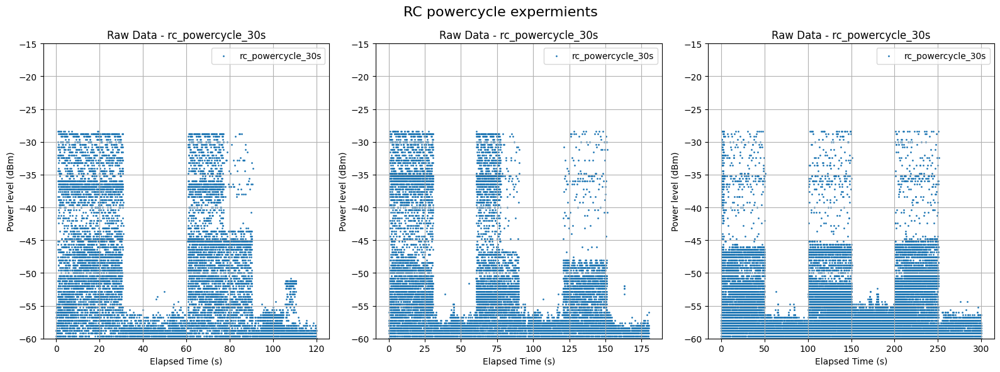

In [66]:

raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_18-23-15_rc-on-drone-startup-raw.csv",
    "raw-data\\2025-03-31_13-57-07_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave-raw.csv",
    "raw-data\\2025-03-31_14-02-15_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave2-raw.csv",
    "raw-data\\2025-03-31_14-08-41_drone-already-on-and-powercycled-rc-on-and-of-50s-interleave3-raw.csv"
]
titles=["rc_powercycle_30s","rc_powercycle_30s","rc_powercycle_30s"]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
fig.suptitle("RC powercycle expermients", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]
    custom_param = titles[i]
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("Power level (dBm)")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

extra ecperiments where remore controller was powered and shutdown in intervals of30 seconds. Here we can observe that the startup behaviour is not as predictive or consistent as the 20seconds  thought befire. In the last measurments notices signal strength indicator on the remote controller. leading to extra measurment. The moment singal strength appears on the controller, the startup effect disappears indicating this is the cause of the effect. In further meeasurments, in the beginning of the measurements 

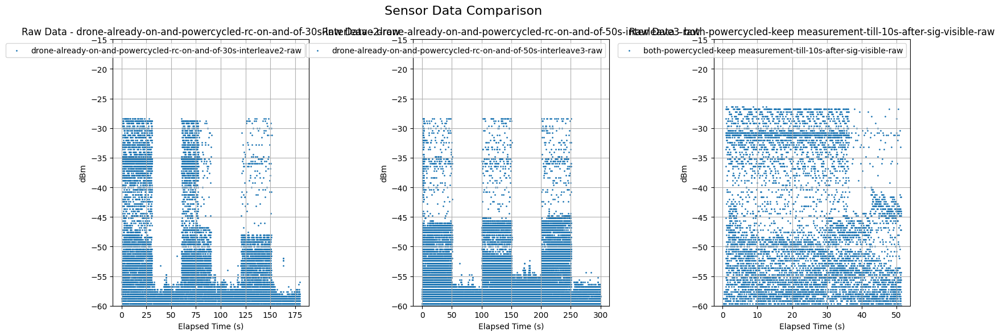

In [67]:

raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_18-23-15_rc-on-drone-startup-raw.csv",
    # "raw-data\\2025-03-31_13-57-07_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave-raw.csv",
    "raw-data\\2025-03-31_14-02-15_drone-already-on-and-powercycled-rc-on-and-of-30s-interleave2-raw.csv",
    "raw-data\\2025-03-31_14-08-41_drone-already-on-and-powercycled-rc-on-and-of-50s-interleave3-raw.csv",
    "raw-data\\2025-03-31_14-16-18_both-powercycled-keep measurement-till-10s-after-sig-visible-raw.csv"
]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

the handshake is not a real handshake but a signal that is visible while the rc and drone are measurin signal quality, the moment sig is visible this startup signal disappears.

So in further tests will be conducted after sig value hhas appeared.

A new question also arised what if you send signal with your controller. To conduct this experiment was conducted where the first 60 seconds the controller did not send any data. Then after 60 seconds, the throttle was raised gradually from 0 to max constantly sending out higher throttle values.

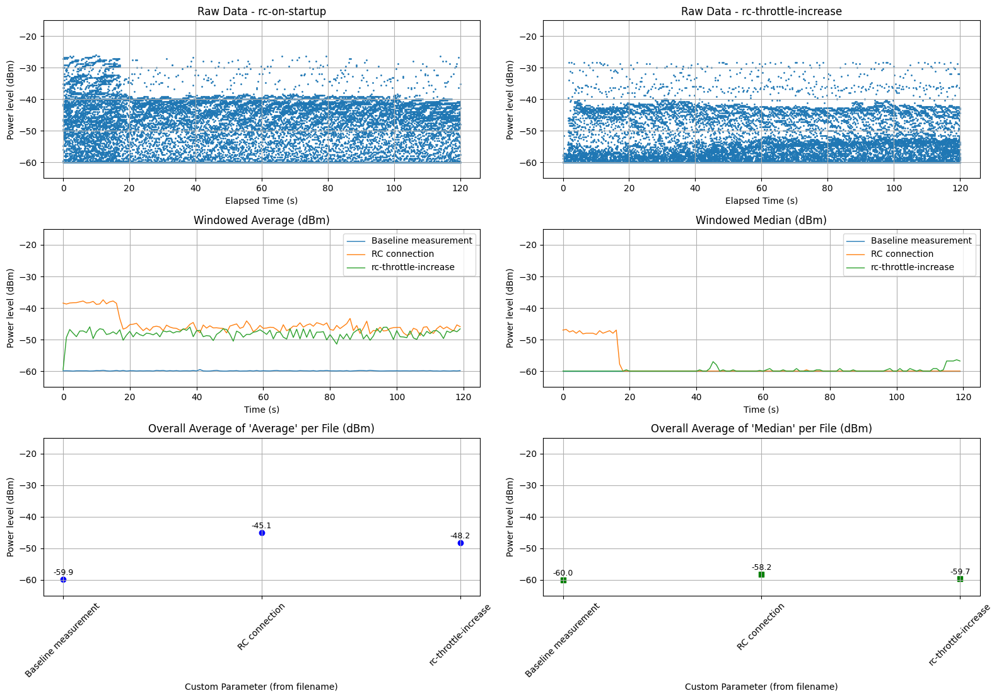

In [68]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-raw.csv",
    "raw-data\\2025-03-31_13-51-10_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-2-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv",
    # "processed-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm.csv",
    "processed-data\\2025-03-31_13-51-10_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-2.csv"

]
make_plot(raw_files,processed_files,["rc-on-startup","rc-throttle-increase"],["Baseline measurement","RC connection","rc-throttle-increase"])



As shown in Figure X the signal is stationary and no effect of the throttle or rc sending thrittle values can be observed.

now see if we can see any difference in signal between 3m and far away

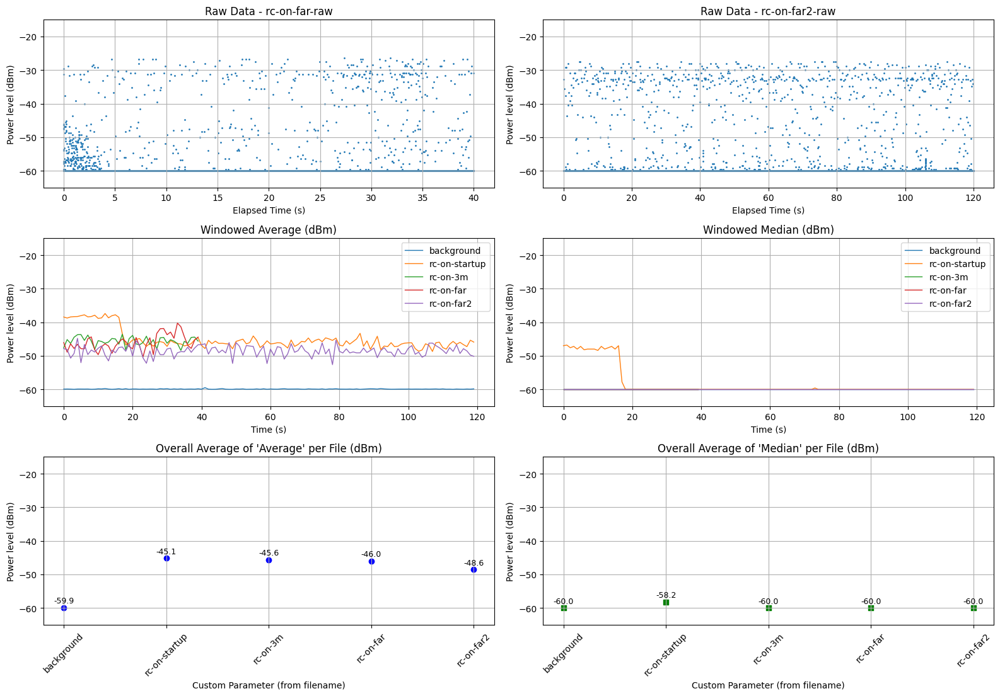

In [69]:

# Raw data files
raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-raw.csv",
    # "raw-data\\2025-03-31_14-50-59_rc-on-3m-raw.csv",
    "raw-data\\2025-03-31_14-51-44_rc-on-far-raw.csv",
    "raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv"

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv",
    "processed-data\\2025-03-31_14-50-59_rc-on-3m.csv",
    "processed-data\\2025-03-31_14-51-44_rc-on-far.csv",
    "processed-data\\2025-03-31_15-09-30_rc-on-far2.csv"
]
make_plot(raw_files,processed_files)



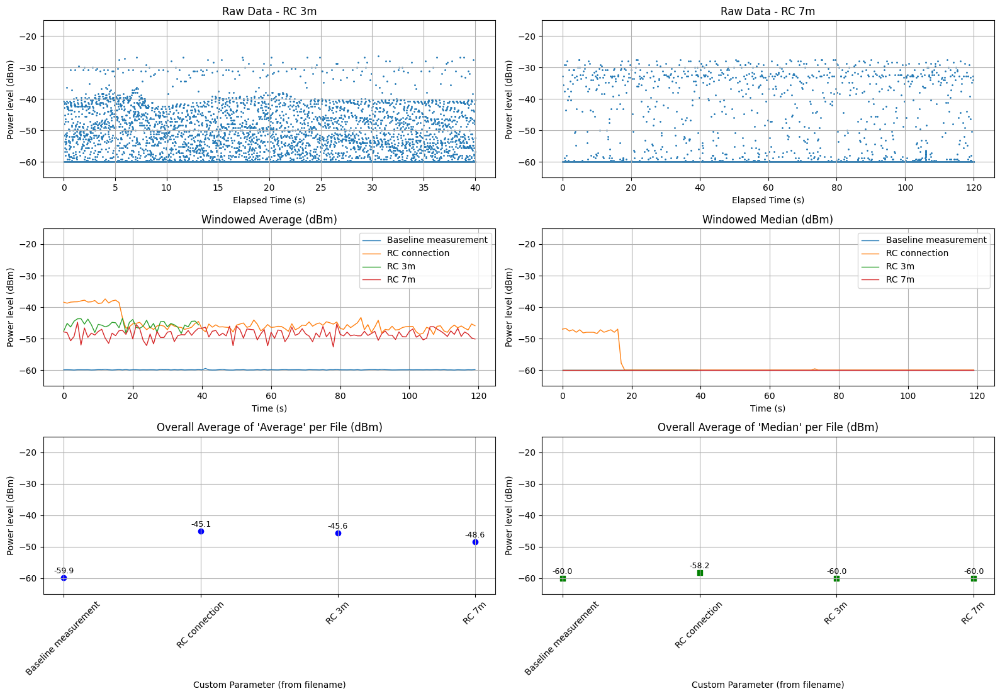

In [70]:

# Raw data files
raw_files = [
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv",
    # "raw-data\\2025-03-05_19-21-25_rc-on-drone-on-startup-and-controller-signal-second-half-lower-to-higher-rpm-raw.csv",
    "raw-data\\2025-03-31_14-50-59_rc-on-3m-raw.csv",
    # "raw-data\\2025-03-31_14-51-44_rc-on-far-raw.csv",
    "raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv"

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-31-05_rc-on-startup.csv",
    "processed-data\\2025-03-31_14-50-59_rc-on-3m.csv",
    # "processed-data\\2025-03-31_14-51-44_rc-on-far.csv",
    "processed-data\\2025-03-31_15-09-30_rc-on-far2.csv"
]
make_plot(raw_files,processed_files,["RC 3m","RC 7m"],["Baseline measurement","RC connection","RC 3m","RC 7m"]
)



conclusie hier is dat afstand van rc niet echt boeit voor average zolang singaal boven 5 is. We zien een verschil in de ruwe data maar de afstand heeft geen invloed op de mediaan of de average.


telemetry

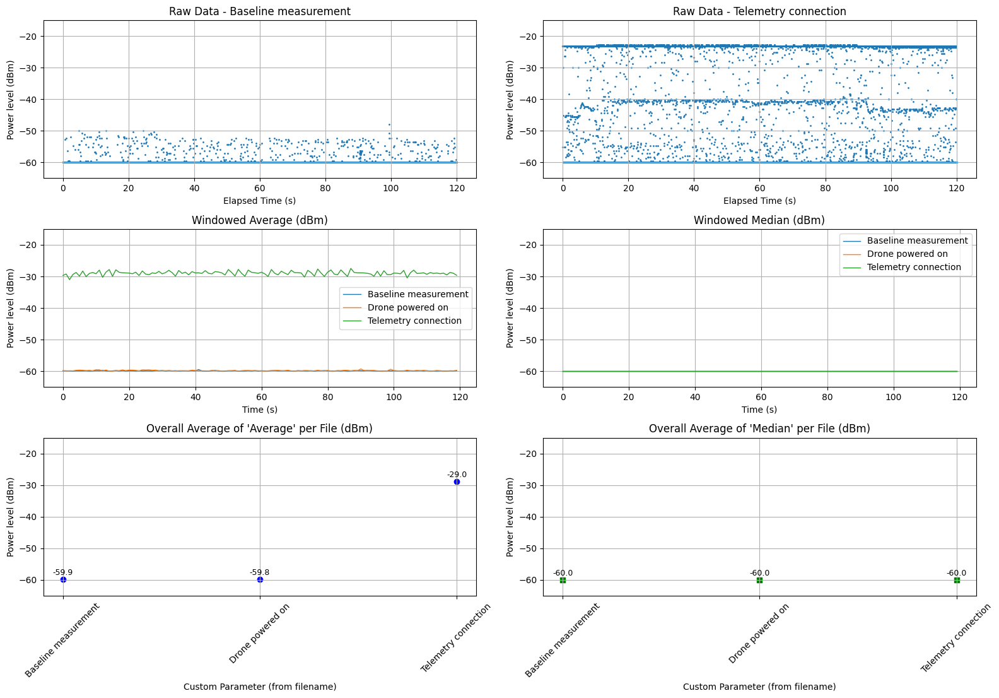

In [71]:

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv",
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-28-07_telem-on.csv"
]
make_plot(raw_files,processed_files,
          ["Baseline measurement","Telemetry connection"],
          ["Baseline measurement","Drone powered on","Telemetry connection"]
)

Looking at the raw data 2 lines can be observed, one at -40 dbm, one at -24dbm.
It is also shown that the telemetry has no influence on the Median but it does affect the average.

different experiments to see if the effect of the telemetry radio could be reduced.
first an experiment where telemtry radio is connected to the drone, then later the other telemetry radio is connected to the laptop, and finally a connection is made with the ground control station. We can observe that the line at -40 dbm only appears once the second tememetry radio is connected.


the second experiment there is no telemetry radio connected to the drone. here we can observe that only the smaller line is visible affirming that this line at -40dbm appears because of the other telemetry radio plugged in on the laptop.
So an third experiment was conducted with the second telemtry radio but at a distance of 3 m
Here we can see a decrease of telemetry signal received by the broadand probe.

To see what the effect would be in a realistic scenario where the drone pilot would be far away a measurement was conducted with only the drone telemetry radio. Here it was observed that the 2nd line was gone, confirming our hypthesis. However, when looking at the average singal values it was similar to the first experiment where the other line was measured at -40dbm. There was only a slight decrease from -29 dbm to -31.3 dbm

Concluding that telemtry does affect the measured average but not the median. Even when neglecting the effect of the second telemetry radio has no effect on the measured average values. However, the median is not affected.

todo look at 1 second and conclude why telemetry has no effect on median, do similar for rc


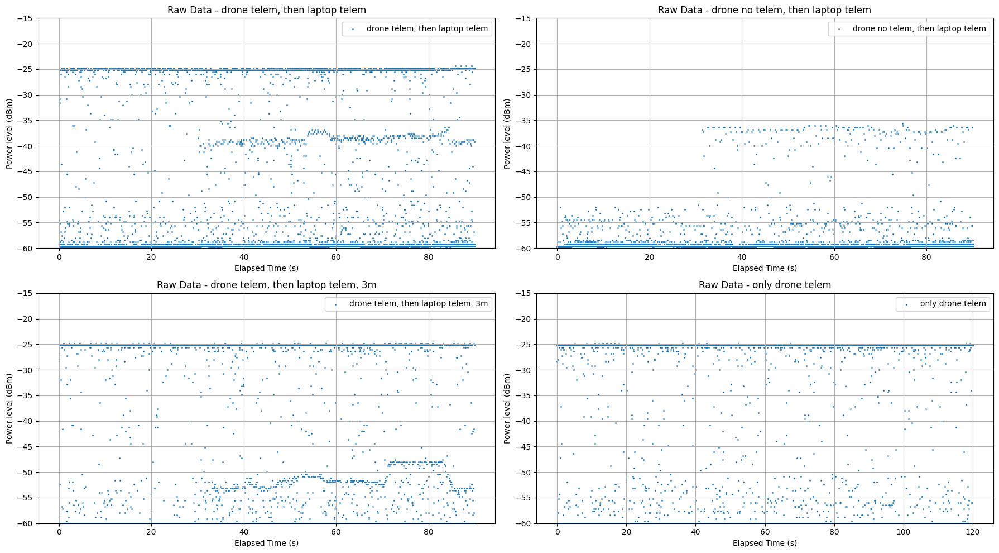

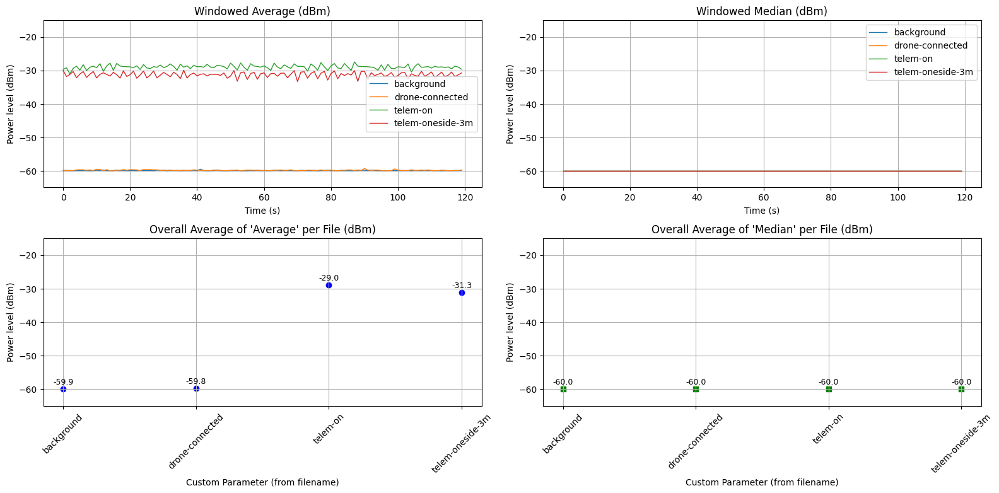

In [72]:
raw_files = [
    "raw-data\\2025-03-29_16-25-54_telem-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv",
    "raw-data\\2025-03-29_16-33-08_telem-not-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv",
    "raw-data\\2025-03-29_16-44-05_telem-oneside-then-connect-laptop-finally-connect-mp-3m-raw.csv",
    "raw-data\\2025-03-29_16-58-00_telem-oneside-3m-raw.csv"
]

labels=["drone telem, then laptop telem",
        "drone no telem, then laptop telem",
        "drone telem, then laptop telem, 3m",
        "only drone telem",
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 2, figsize=(18, 10))  

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=labels[i], s=1)
        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("Power level (dBm)")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# # Hide any unused subplot (last subplot in row 2)
# axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()

# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-23-07_drone-connected-raw.csv",
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-28-07_telem-on.csv",
    # "processed-data\\2025-03-29_16-25-54_telem-oneside-then-connect-laptop-finally-connect-mp-1m.csv",
    # "processed-data\\2025-03-29_16-33-08_telem-not-oneside-then-connect-laptop-finally-connect-mp-1m.csv",
    # "processed-data\\2025-03-29_16-44-05_telem-oneside-then-connect-laptop-finally-connect-mp-3m.csv",
    "processed-data\\2025-03-29_16-58-00_telem-oneside-3m.csv"
]
make_plot([],processed_files)

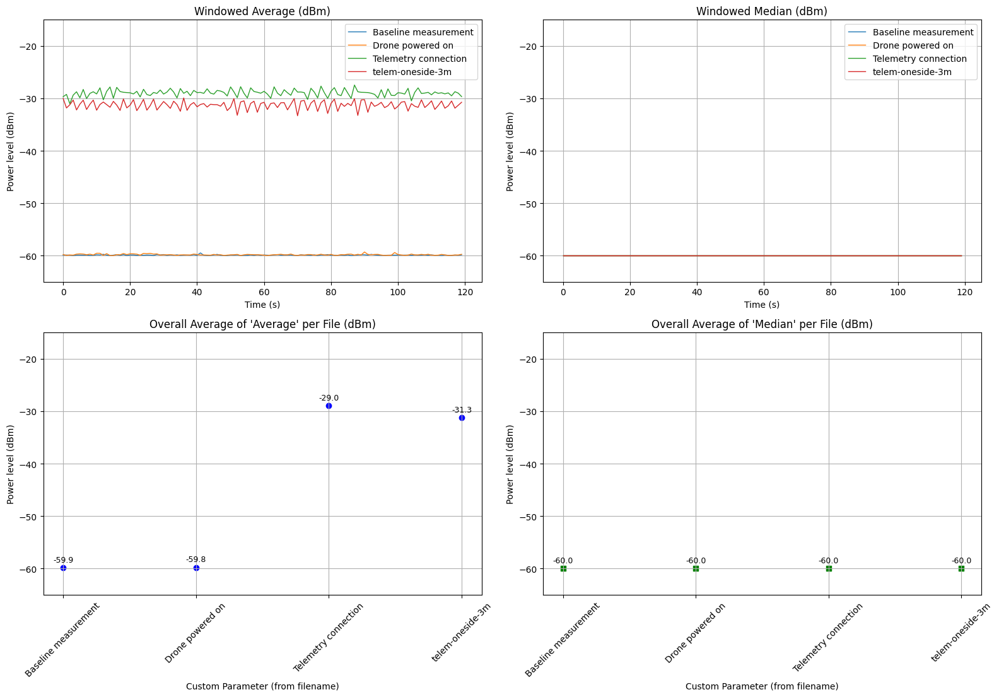

In [73]:
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-28-07_telem-on.csv",
    # "processed-data\\2025-03-29_16-25-54_telem-oneside-then-connect-laptop-finally-connect-mp-1m.csv",
    # "processed-data\\2025-03-29_16-33-08_telem-not-oneside-then-connect-laptop-finally-connect-mp-1m.csv",
    # "processed-data\\2025-03-29_16-44-05_telem-oneside-then-connect-laptop-finally-connect-mp-3m.csv",
    "processed-data\\2025-03-29_16-58-00_telem-oneside-3m.csv"
]

titles=["Baseline measurement","Drone powered on","Telemetry connection","telem-oneside-3m"]
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels


for i,file in enumerate(processed_files):
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")
        custom_param = titles[i]
        
        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 1].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 0].set_ylabel("Power level (dBm)")
axes[0, 1].set_ylabel("Power level (dBm)")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("Power level (dBm)")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("Power level (dBm)")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()

telem orientatie

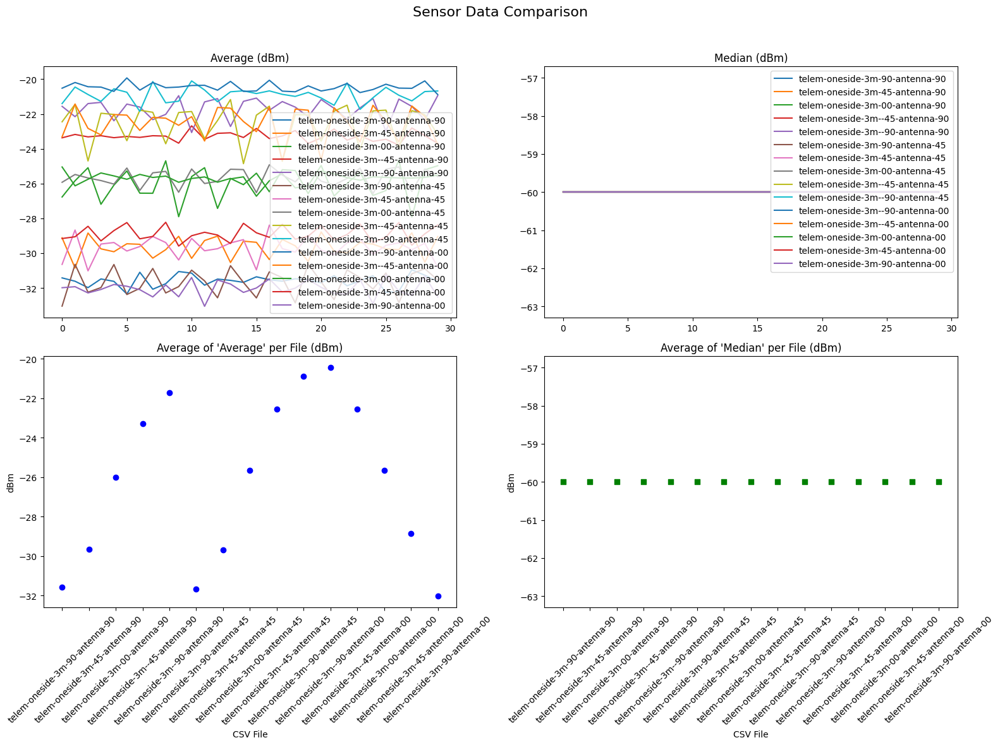

In [74]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    "processed-data\\2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90.csv",
    "processed-data\\2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90.csv",
    "processed-data\\2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90.csv",
    "processed-data\\2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90.csv",
    "processed-data\\2025-03-29_17-12-21_telem-oneside-3m-90-antenna-45.csv",
    "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    "processed-data\\2025-03-29_17-14-26_telem-oneside-3m-00-antenna-45.csv",
    "processed-data\\2025-03-29_17-15-23_telem-oneside-3m--45-antenna-45.csv",
    "processed-data\\2025-03-29_17-16-19_telem-oneside-3m--90-antenna-45.csv",
    "processed-data\\2025-03-29_17-17-13_telem-oneside-3m--90-antenna-00.csv",
    "processed-data\\2025-03-29_17-18-00_telem-oneside-3m--45-antenna-00.csv",
    "processed-data\\2025-03-29_17-19-26_telem-oneside-3m-00-antenna-00.csv",
    "processed-data\\2025-03-29_17-20-40_telem-oneside-3m-45-antenna-00.csv",
    "processed-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00.csv",
    # "processed-data\\2025-03-31_12-32-05_telem-oneside-3m-90-antenna--45.csv",
    # "processed-data\\2025-03-31_12-33-10_telem-oneside-3m-45-antenna--45.csv",
    # "processed-data\\2025-03-31_12-37-43_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-42-38_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-45-12_telem-oneside-3m-45-antenna-00.csv"
    # "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv"
]


# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)


# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[0, 0].plot(df["Average"], label=custom_param)
        axes[0, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[0, 0].set_title("Average (dBm)")
        axes[0, 1].set_title("Median (dBm)")
        axes[0, 0].legend()
        axes[0, 1].legend()
        # for i in range(3):
        #     for j in range(2):
        #         axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].scatter(file_name, avg_value, color="b", marker="o")
axes[1, 0].set_title("Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("CSV File")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].scatter(file_name, avg_value, color="g", marker="s")
axes[1, 1].set_title("Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("CSV File")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



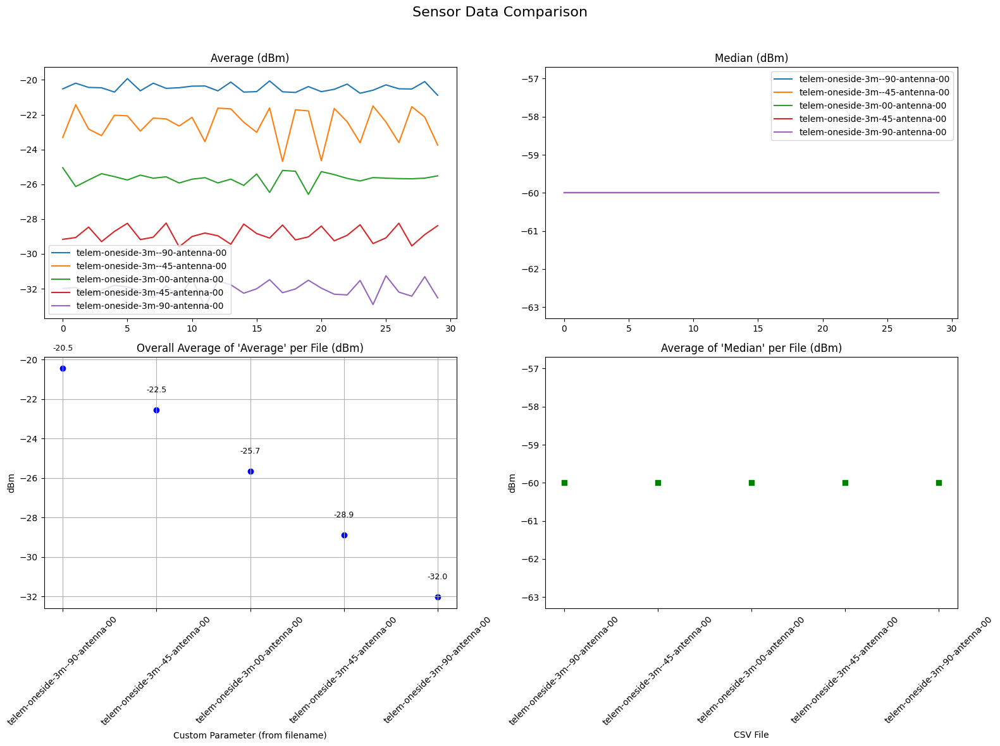

In [75]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    # "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90.csv",
    # "processed-data\\2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90.csv",
    # "processed-data\\2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90.csv",
    # "processed-data\\2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-12-21_telem-oneside-3m-90-antenna-45.csv",
    # "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    # "processed-data\\2025-03-29_17-14-26_telem-oneside-3m-00-antenna-45.csv",
    # "processed-data\\2025-03-29_17-15-23_telem-oneside-3m--45-antenna-45.csv",
    # "processed-data\\2025-03-29_17-16-19_telem-oneside-3m--90-antenna-45.csv",
    "processed-data\\2025-03-29_17-17-13_telem-oneside-3m--90-antenna-00.csv",
    "processed-data\\2025-03-29_17-18-00_telem-oneside-3m--45-antenna-00.csv",
    "processed-data\\2025-03-29_17-19-26_telem-oneside-3m-00-antenna-00.csv",
    "processed-data\\2025-03-29_17-20-40_telem-oneside-3m-45-antenna-00.csv",
    "processed-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00.csv",
    # "processed-data\\2025-03-31_12-32-05_telem-oneside-3m-90-antenna--45.csv",
    # "processed-data\\2025-03-31_12-33-10_telem-oneside-3m-45-antenna--45.csv",
    # "processed-data\\2025-03-31_12-37-43_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-42-38_telem-oneside-3m-45-antenna-00.csv",
    # "processed-data\\2025-03-31_12-45-12_telem-oneside-3m-45-antenna-00.csv"
    # "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv"
]


# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)


# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[0, 0].plot(df["Average"], label=custom_param)
        axes[0, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[0, 0].set_title("Average (dBm)")
        axes[0, 1].set_title("Median (dBm)")
        axes[0, 0].legend()
        axes[0, 1].legend()
        # for i in range(3):
        #     for j in range(2):
        #         axes[i,j].set_ylim([-65, -15])
                

avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# # Plot average of "Average" per file
# for file_name, avg_value in average_dbm_per_file.items():
#     axes[1, 0].scatter(file_name, avg_value, color="b", marker="o")
# axes[1, 0].set_title("Average of 'Average' per File (dBm)")
# axes[1, 0].set_xlabel("CSV File")
# axes[1, 0].set_ylabel("dBm")
# axes[1, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].scatter(file_name, avg_value, color="g", marker="s")
axes[1, 1].set_title("Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("CSV File")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



To try an reduce the impact of the telemetry, different orientations were tested 90, 45 0 -45 and -90 and for each telemetry orientation 3 sensor orientations were tested, 90 45 00. 
We can observe that the orientation of the sensor doesn't really matter that much but the orientation of the telemetry antenna has the greatest impact on the measured signal. The telemetry has least effect when the antenna is 90degrees up and the sensor is flat. conclusion by flying with the correct orientation of the radios, the measured interference can be reduced by 12 dbm. approximately 8x times reduction.

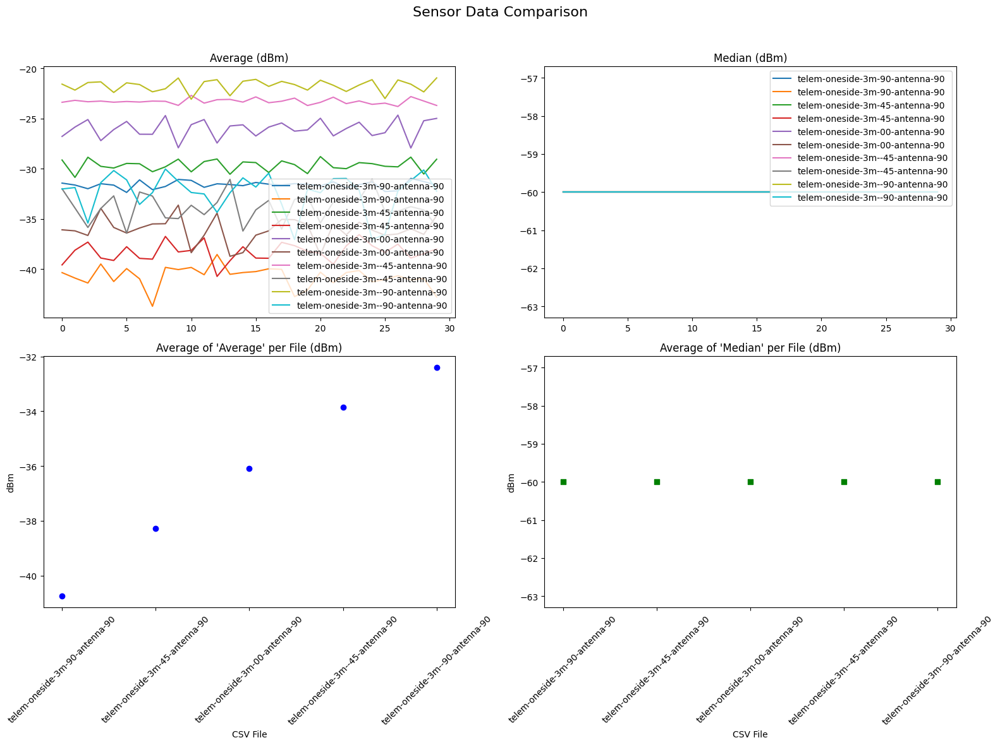

In [76]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    "processed-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90.csv",
    "processed-data\\2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90.csv",
    "processed-data\\2025-03-31_12-49-41_telem-oneside-3m-45-antenna-90.csv",
    "processed-data\\2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90.csv",
    "processed-data\\2025-03-31_12-50-31_telem-oneside-3m-00-antenna-90.csv",
    "processed-data\\2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90.csv",
    "processed-data\\2025-03-31_12-51-37_telem-oneside-3m--45-antenna-90.csv",
    "processed-data\\2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90.csv",
    "processed-data\\2025-03-31_13-01-22_telem-oneside-3m--90-antenna-90.csv",
    # "processed-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90.csv",
    # "processed-data\\2025-03-31_12-49-41_telem-oneside-3m-45-antenna-90.csv",
    # "processed-data\\2025-03-31_12-50-31_telem-oneside-3m-00-antenna-90.csv",
    # "processed-data\\2025-03-31_12-51-37_telem-oneside-3m--45-antenna-90.csv",
    # "processed-data\\2025-03-31_13-01-22_telem-oneside-3m--90-antenna-90.csv",
    # "processed-data\\2025-03-31_12-57-45_telem-oneside-3m-90-antenna-45.csv",
    # "processed-data\\2025-03-31_12-58-30_telem-oneside-3m-90-antenna-00.csv",
    # "processed-data\\2025-03-31_12-59-10_telem-oneside-3m-90-antenna--45.csv",
    # "processed-data\\2025-03-31_13-00-16_telem-oneside-3m-90-antenna--90.csv",
]


# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)


# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[0, 0].plot(df["Average"], label=custom_param)
        axes[0, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[0, 0].set_title("Average (dBm)")
        axes[0, 1].set_title("Median (dBm)")
        axes[0, 0].legend()
        axes[0, 1].legend()
        # for i in range(3):
        #     for j in range(2):
        #         axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].scatter(file_name, avg_value, color="b", marker="o")
axes[1, 0].set_title("Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("CSV File")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].scatter(file_name, avg_value, color="g", marker="s")
axes[1, 1].set_title("Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("CSV File")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()



redoing experiments changes absolute measured values but relative values stay the same

In [77]:
average_dbm_per_file

{'telem-oneside-3m-90-antenna-90': np.float64(-40.748803919749086),
 'telem-oneside-3m-45-antenna-90': np.float64(-38.2788338255229),
 'telem-oneside-3m-00-antenna-90': np.float64(-36.09404214116727),
 'telem-oneside-3m--45-antenna-90': np.float64(-33.851063000811365),
 'telem-oneside-3m--90-antenna-90': np.float64(-32.4070171315922)}

telem orientation final


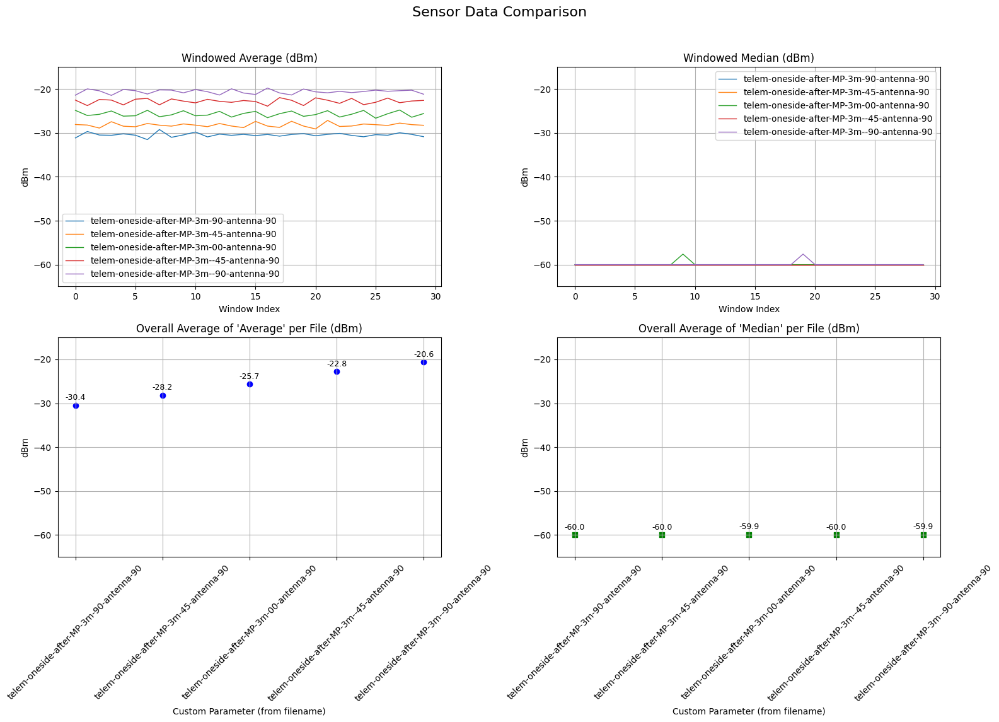

In [78]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    "processed-data\\2025-04-01_17-32-53_telem-oneside-after-MP-3m-45-antenna-90.csv",
    "processed-data\\2025-04-01_17-35-02_telem-oneside-after-MP-3m-00-antenna-90.csv",
    "processed-data\\2025-04-01_17-36-23_telem-oneside-after-MP-3m--45-antenna-90.csv",
    "processed-data\\2025-04-01_17-37-13_telem-oneside-after-MP-3m--90-antenna-90.csv",
    # "processed-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-39-41_telem-oneside-after-MP-3m-00-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m--45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-48-07_telem-oneside-after-MP-3m--90-antenna-45.csv",
    # "processed-data\\2025-04-01_17-49-10_telem-oneside-after-MP-3m-90-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-16_telem-oneside-after-MP-3m-45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-56_telem-oneside-after-MP-3m-00-antenna-00.csv",
    # "processed-data\\2025-04-01_17-51-50_telem-oneside-after-MP-3m--45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-52-46_telem-oneside-after-MP-3m--90-antenna-00.csv",
    # "processed-data\\2025-04-01_17-53-50_telem-oneside-after-MP-3m-90-antenna--45.csv",
    # "processed-data\\2025-04-01_17-54-59_telem-oneside-after-MP-3m-45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-55-44_telem-oneside-after-MP-3m-00-antenna--45.csv",
    # "processed-data\\2025-04-01_17-56-34_telem-oneside-after-MP-3m--45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-57-18_telem-oneside-after-MP-3m--90-antenna--45.csv",
    # "processed-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90.csv",
    # "processed-data\\2025-04-01_17-59-19_telem-oneside-after-MP-3m-45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-00-15_telem-oneside-after-MP-3m-00-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-10_telem-oneside-after-MP-3m--45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-53_telem-oneside-after-MP-3m--45-antenna--90.csv",
]

# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels
fig.suptitle("Sensor Data Comparison", fontsize=16)

# --- Process and plot processed data ---
if not processed_files:
    print("Warning: No processed files provided.")
    # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
    for j in range(2):
        axes[1, j].set_visible(False)
        axes[2, j].set_visible(False)

for file in processed_files:
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")

        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Window Index") # Or Time if applicable
axes[0, 1].set_xlabel("Window Index") # Or Time if applicable
axes[0, 0].set_ylabel("dBm")
axes[0, 1].set_ylabel("dBm")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("dBm")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("dBm")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\1865684231.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20' if len(unique_orientations) > 10 else 'tab10') # Choose based on number


Error: File not found processed-data\2025-04-01_17-40-50_telem-oneside-after-MP-3m-45-antenna-45.csv


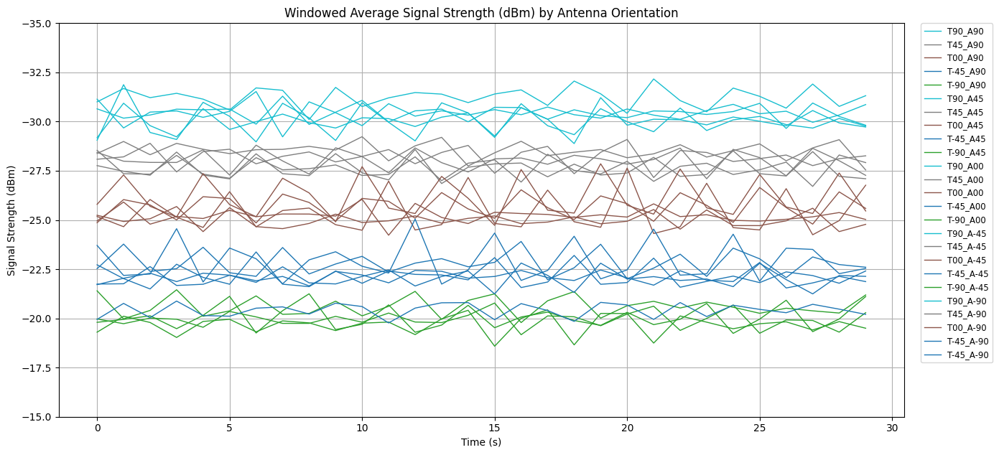

In [79]:

# Processed data files
processed_files = [
    "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    "processed-data\\2025-04-01_17-32-53_telem-oneside-after-MP-3m-45-antenna-90.csv",
    "processed-data\\2025-04-01_17-35-02_telem-oneside-after-MP-3m-00-antenna-90.csv",
    "processed-data\\2025-04-01_17-36-23_telem-oneside-after-MP-3m--45-antenna-90.csv",
    "processed-data\\2025-04-01_17-37-13_telem-oneside-after-MP-3m--90-antenna-90.csv",
    "processed-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45.csv",
    "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv",
    "processed-data\\2025-04-01_17-39-41_telem-oneside-after-MP-3m-00-antenna-45.csv",
    "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m--45-antenna-45.csv",
    "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m-45-antenna-45.csv",
    "processed-data\\2025-04-01_17-48-07_telem-oneside-after-MP-3m--90-antenna-45.csv",
    "processed-data\\2025-04-01_17-49-10_telem-oneside-after-MP-3m-90-antenna-00.csv",
    "processed-data\\2025-04-01_17-50-16_telem-oneside-after-MP-3m-45-antenna-00.csv",
    "processed-data\\2025-04-01_17-50-56_telem-oneside-after-MP-3m-00-antenna-00.csv",
    "processed-data\\2025-04-01_17-51-50_telem-oneside-after-MP-3m--45-antenna-00.csv",
    "processed-data\\2025-04-01_17-52-46_telem-oneside-after-MP-3m--90-antenna-00.csv",
    "processed-data\\2025-04-01_17-53-50_telem-oneside-after-MP-3m-90-antenna--45.csv",
    "processed-data\\2025-04-01_17-54-59_telem-oneside-after-MP-3m-45-antenna--45.csv",
    "processed-data\\2025-04-01_17-55-44_telem-oneside-after-MP-3m-00-antenna--45.csv",
    "processed-data\\2025-04-01_17-56-34_telem-oneside-after-MP-3m--45-antenna--45.csv",
    "processed-data\\2025-04-01_17-57-18_telem-oneside-after-MP-3m--90-antenna--45.csv",
    "processed-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90.csv",
    "processed-data\\2025-04-01_17-59-19_telem-oneside-after-MP-3m-45-antenna--90.csv",
    "processed-data\\2025-04-01_18-00-15_telem-oneside-after-MP-3m-00-antenna--90.csv",
    "processed-data\\2025-04-01_18-01-10_telem-oneside-after-MP-3m--45-antenna--90.csv",
    "processed-data\\2025-04-01_18-01-53_telem-oneside-after-MP-3m--45-antenna--90.csv",
]
# --- Pre-calculate colors based on antenna orientation ---
antenna_orientations = set()
orientation_parts = {} # Store parts for label generation later

for file_path in processed_files:
    filename = os.path.basename(file_path)
    parts = filename.replace(".csv", "").split("3m")
    # Assuming format ..._telemOrientation_antenna-Orientation.csv
    telem_orient = parts[-1][1:parts[-1].index("antenna")-1] # e.g., '90', '45', '00', '-45', '-90'
    antenna_orient = parts[-1][parts[-1].index("antenna")+8:] # e.g., 'antenna-90'
    antenna_orientations.add(antenna_orient)
    orientation_parts[filename] = (telem_orient, antenna_orient)
    
import matplotlib.cm as cm # Import colormaps
import numpy as np
# Create a color map
unique_orientations = sorted(list(antenna_orientations))
# Use a colormap like 'tab10' or 'tab20' for distinct categorical colors
# cmap = cm.get_cmap('tab10', len(unique_orientations)) # Older Matplotlib
cmap = cm.get_cmap('tab20' if len(unique_orientations) > 10 else 'tab10') # Choose based on number
colors = cmap(np.linspace(0, 1, len(unique_orientations)))
color_map = {orient: color for orient, color in zip(unique_orientations, colors)}
# Add a fallback color for unknown orientations
color_map["unknown"] = 'grey'
# --- End Color Calculation ---


# --- Create Figure and Axes BEFORE the loop ---
fig, ax = plt.subplots(figsize=(14, 7)) # Adjust size as needed

# Check if there are any files to process
if not processed_files:
    print("No processed CSV files to plot.")
else:
    for file in processed_files:
        filename = os.path.basename(file)
        try:
            df = pd.read_csv(file)

            # Get pre-parsed orientations and determine color
            telem_orient, antenna_orient = orientation_parts.get(filename, (filename.replace(".csv",""), "unknown"))
            plot_color = color_map.get(telem_orient, 'grey') # Use grey if somehow missed

            if {"Average"}.issubset(df.columns): # Only need Average now
                # --- Plot on the Axes object 'ax' using the assigned color ---
                # Create a more descriptive label
                label = f"T{telem_orient}_A{antenna_orient}" # e.g., "T90_90 Avg"
                ax.plot(df.index, df["Average"], label=label, linewidth=1, color=plot_color)

            else:
                print(f"Warning: Column 'Average' not found in {filename}")

        except FileNotFoundError:
             print(f"Error: File not found {file}")
             continue # Skip to the next file
        except pd.errors.EmptyDataError:
            print(f"Warning: File is empty {filename}")
            continue # Skip empty files
        except Exception as e:
            print(f"Error processing file {filename}: {e}")
            continue # Skip to the next file if reading/processing fails


    # --- Configure the plot using 'ax' AFTER the loop ---
    ax.set_title("Windowed Average Signal Strength (dBm) by Antenna Orientation")
    ax.set_xlabel("Time (s)") # Changed label
    ax.set_ylabel("Signal Strength (dBm)")

    # Get handles and labels to check if anything was plotted
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        # Place legend outside the plot if it gets too crowded
        # Adjust bbox_to_anchor (x, y) location and loc parameter as needed.
        # (1.02, 1) means slightly to the right (1.02*width) and aligned top (1*height)
        ax.legend(fontsize='small', loc='upper left', bbox_to_anchor=(1.02, 1.0), borderaxespad=0.)
    else:
         print("No data was plotted.")

    ax.grid(True)
    ax.set_ylim([-15,-35])

    # Adjust layout and show plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect top value slightly if title is still cut off
    plt.show()


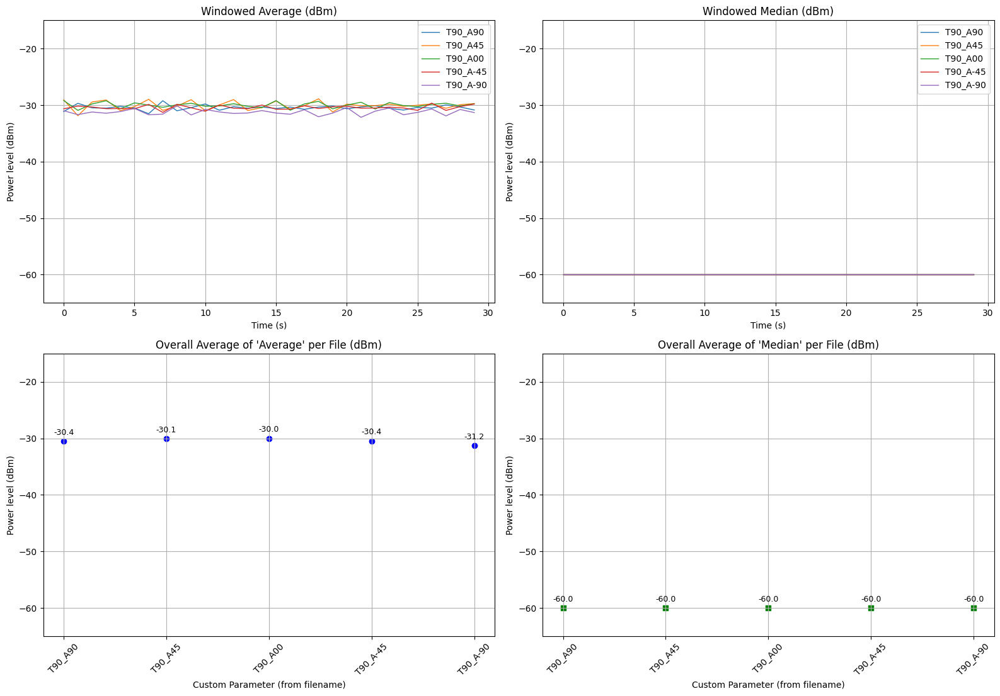

In [80]:
# Raw data files
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv"
]

# Processed data files
processed_files = [
    "processed-data\\2025-04-01_17-32-07_telem-oneside-after-MP-3m-90-antenna-90.csv",
    # "processed-data\\2025-04-01_17-32-53_telem-oneside-after-MP-3m-45-antenna-90.csv",
    # "processed-data\\2025-04-01_17-35-02_telem-oneside-after-MP-3m-00-antenna-90.csv",
    # "processed-data\\2025-04-01_17-36-23_telem-oneside-after-MP-3m--45-antenna-90.csv",
    # "processed-data\\2025-04-01_17-37-13_telem-oneside-after-MP-3m--90-antenna-90.csv",
    "processed-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45.csv",
    # "processed-data\\2025-04-01_17-38-58_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-39-41_telem-oneside-after-MP-3m-00-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m--45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-40-50_telem-oneside-after-MP-3m-45-antenna-45.csv",
    # "processed-data\\2025-04-01_17-48-07_telem-oneside-after-MP-3m--90-antenna-45.csv",
    "processed-data\\2025-04-01_17-49-10_telem-oneside-after-MP-3m-90-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-16_telem-oneside-after-MP-3m-45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-50-56_telem-oneside-after-MP-3m-00-antenna-00.csv",
    # "processed-data\\2025-04-01_17-51-50_telem-oneside-after-MP-3m--45-antenna-00.csv",
    # "processed-data\\2025-04-01_17-52-46_telem-oneside-after-MP-3m--90-antenna-00.csv",
    "processed-data\\2025-04-01_17-53-50_telem-oneside-after-MP-3m-90-antenna--45.csv",
    # "processed-data\\2025-04-01_17-54-59_telem-oneside-after-MP-3m-45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-55-44_telem-oneside-after-MP-3m-00-antenna--45.csv",
    # "processed-data\\2025-04-01_17-56-34_telem-oneside-after-MP-3m--45-antenna--45.csv",
    # "processed-data\\2025-04-01_17-57-18_telem-oneside-after-MP-3m--90-antenna--45.csv",
    "processed-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90.csv",
    # "processed-data\\2025-04-01_17-59-19_telem-oneside-after-MP-3m-45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-00-15_telem-oneside-after-MP-3m-00-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-10_telem-oneside-after-MP-3m--45-antenna--90.csv",
    # "processed-data\\2025-04-01_18-01-53_telem-oneside-after-MP-3m--45-antenna--90.csv",
]

# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

antenna_orientations = set()
orientation_parts = {} # Store parts for label generation later

for file_path in processed_files:
    filename = os.path.basename(file_path)
    parts = filename.replace(".csv", "").split("3m")
    # Assuming format ..._telemOrientation_antenna-Orientation.csv
    telem_orient = parts[-1][1:parts[-1].index("antenna")-1] # e.g., '90', '45', '00', '-45', '-90'
    antenna_orient = parts[-1][parts[-1].index("antenna")+8:] # e.g., 'antenna-90'
    antenna_orientations.add(antenna_orient)
    orientation_parts[filename] = (telem_orient, antenna_orient)

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels
# fig.suptitle("Sensor Data Comparison", fontsize=16)

# --- Process and plot processed data ---
if not processed_files:
    print("Warning: No processed files provided.")
    # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
    for j in range(2):
        axes[1, j].set_visible(False)
        axes[2, j].set_visible(False)

for file in processed_files:
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")
        telem_orient, antenna_orient = orientation_parts.get(filename, (filename.replace(".csv",""), "unknown"))
        custom_param = f"T{telem_orient}_A{antenna_orient}" # e.g., "T90_90 Avg"


        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 1].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 0].set_ylabel("Power level (dBm)")
axes[0, 1].set_ylabel("Power level (dBm)")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("Power level (dBm)")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("Power level (dBm)")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(0,2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()


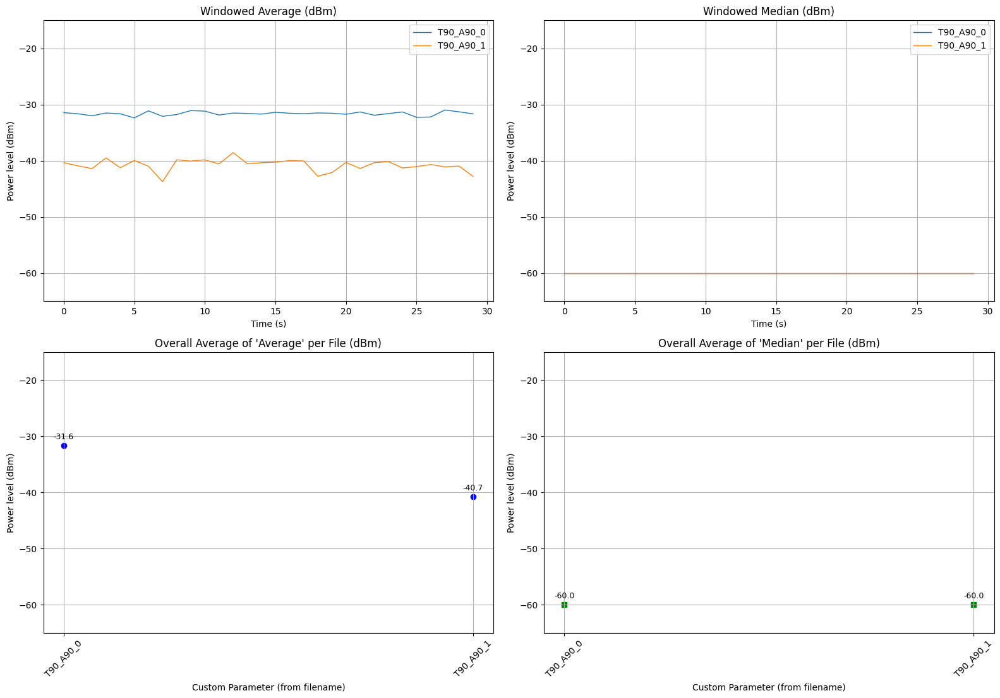

In [81]:


# Processed data files
processed_files = [
    "processed-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90.csv",
    "processed-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90.csv",
]

# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

antenna_orientations = set()
orientation_parts = {} # Store parts for label generation later

for file_path in processed_files:
    filename = os.path.basename(file_path)
    parts = filename.replace(".csv", "").split("3m")
    # Assuming format ..._telemOrientation_antenna-Orientation.csv
    telem_orient = parts[-1][1:parts[-1].index("antenna")-1] # e.g., '90', '45', '00', '-45', '-90'
    antenna_orient = parts[-1][parts[-1].index("antenna")+8:] # e.g., 'antenna-90'
    antenna_orientations.add(antenna_orient)
    orientation_parts[filename] = (telem_orient, antenna_orient)

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels
# fig.suptitle("Telemetry state comparison", fontsize=16)

# --- Process and plot processed data ---
if not processed_files:
    print("Warning: No processed files provided.")
    # Potentially hide or disable axes[1,:] and axes[2,:] if no processed data
    for j in range(2):
        axes[1, j].set_visible(False)
        axes[2, j].set_visible(False)

for i,file in enumerate(processed_files):
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")
        telem_orient, antenna_orient = orientation_parts.get(filename, (filename.replace(".csv",""), "unknown"))
        custom_param = f"T{telem_orient}_A{antenna_orient}_{i}" # e.g., "T90_90 Avg"


        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 1].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 0].set_ylabel("Power level (dBm)")
axes[0, 1].set_ylabel("Power level (dBm)")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("Power level (dBm)")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("Power level (dBm)")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(0,2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3910804558.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


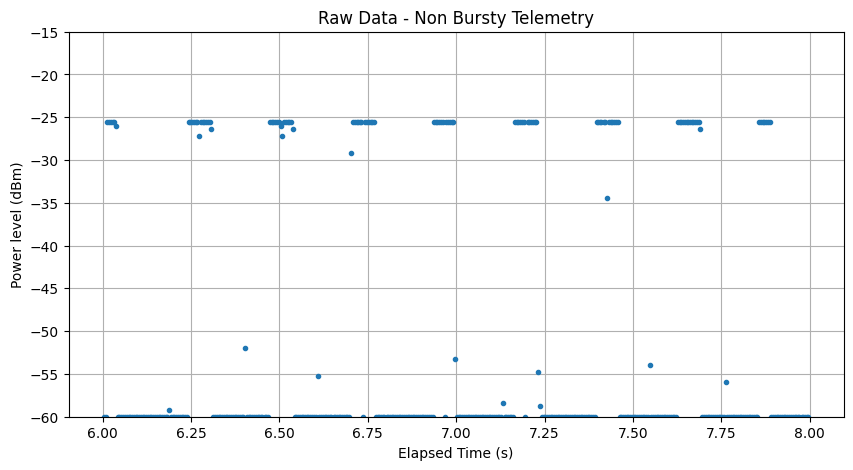

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3910804558.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


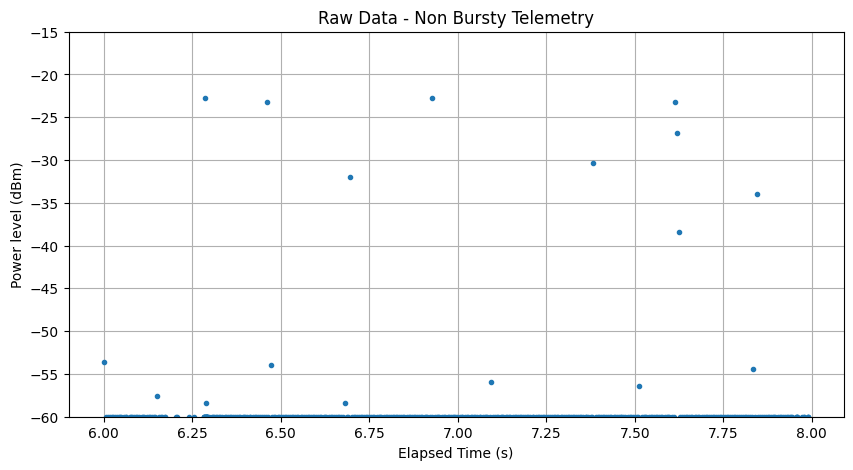

In [82]:
raw_files = [
    "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    "raw-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90-raw.csv",
]
for file in raw_files:
        
    df = pd.read_csv(file)
    i=6
    # Select only data where "Second" == 90
    df_filtered = df[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+2)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_telem", linewidth=0.5)
    plt.title(f"Raw Data - {"Non Bursty Telemetry"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("Power level (dBm)")
    plt.ylim(-60, -15)  
    plt.grid(True)
    # plt.legend()


    plt.show()

noisy look at zoomed data

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3285800757.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


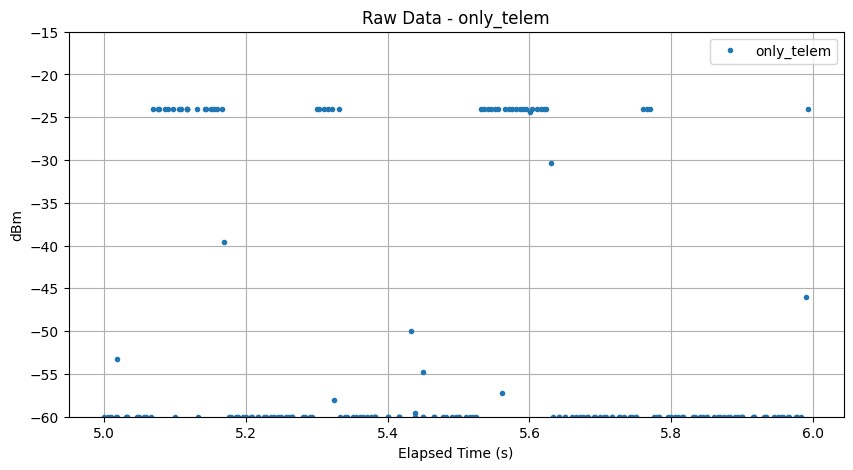

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3285800757.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


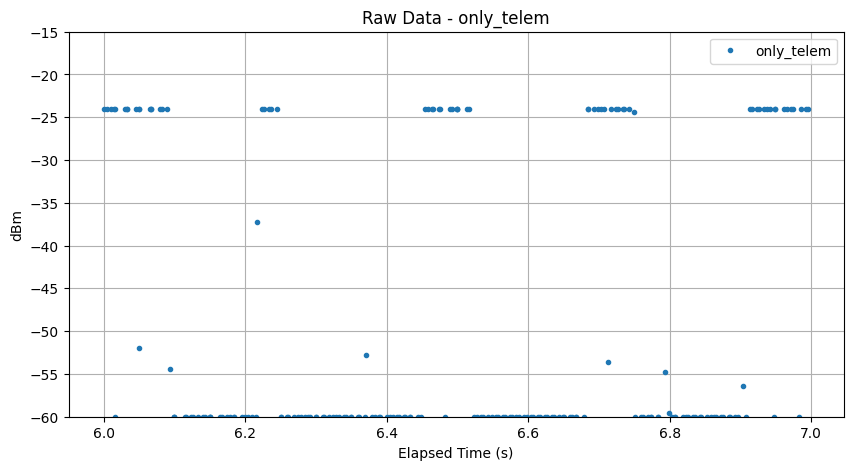

In [83]:

df = pd.read_csv("raw-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45-raw.csv")

# Select only data where "Second" == 90
for i in range(5,7):
    df_filtered = df[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_telem", linewidth=0.5)
    plt.title(f"Raw Data - {"only_telem"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, -15)  
    plt.grid(True)
    plt.legend()


    plt.show()


nieut echt vaste periode?
probeer eens periode te vinden

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\4089418235.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


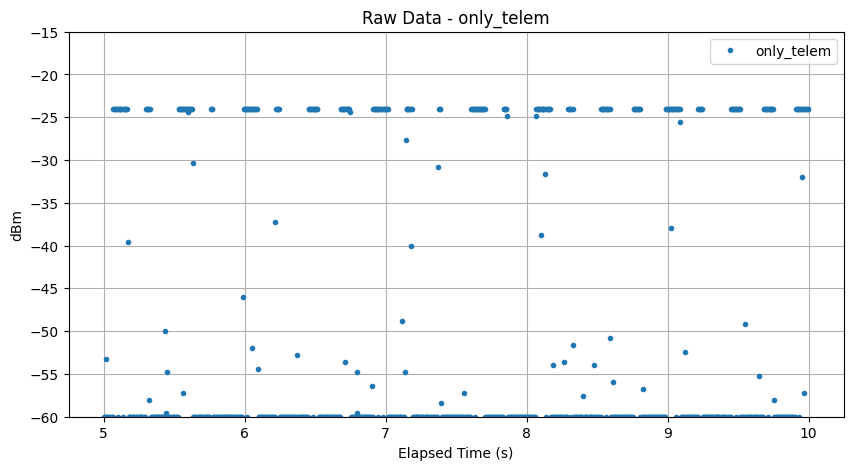

In [84]:

df = pd.read_csv("raw-data\\2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 5) & (df["Elapsed Time (s)"] < 10)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_telem", linewidth=0.5)
plt.title(f"Raw Data - {"only_telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


try to find freq

Found 199 points above -25.0 dBm.
Grouped into 18 distinct burst events.


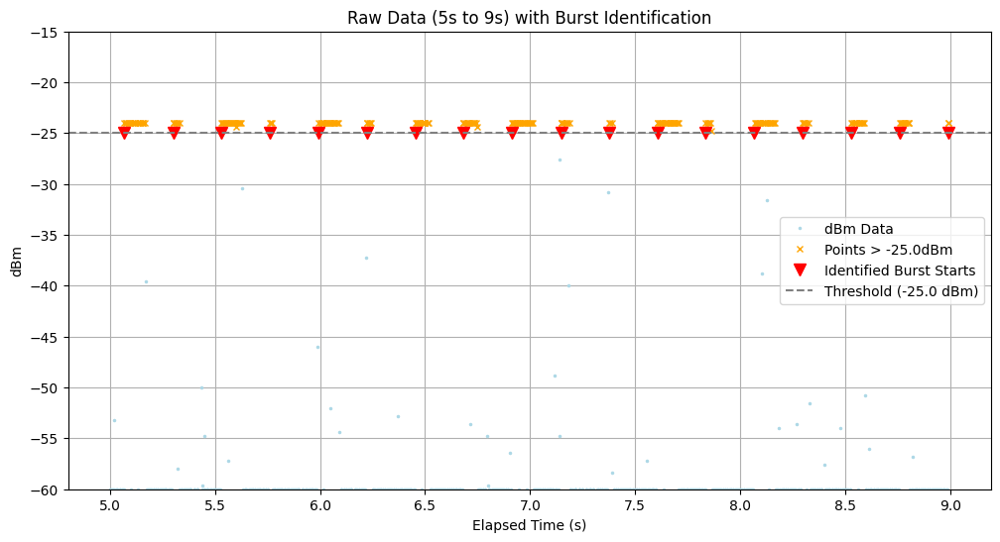


Analyzing 17 intervals between distinct bursts...

--- Inter-Burst Interval Statistics (between burst starts) ---
Mean:   0.2306 s
Median: 0.2300 s
Std Dev:0.0017 s
Min:    0.2290 s
Max:    0.2350 s


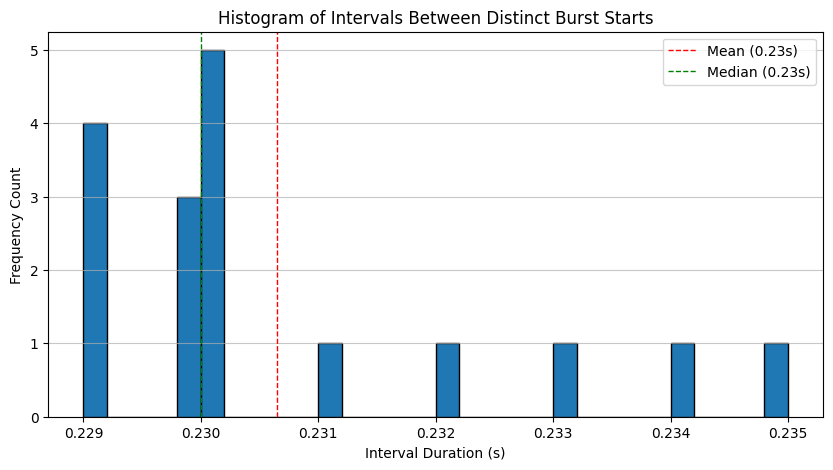


--- Lomb-Scargle Periodogram (using Burst Start Times) ---
Peak detected at Frequency: 17.3520 Hz
Corresponding Period:     0.0576 s


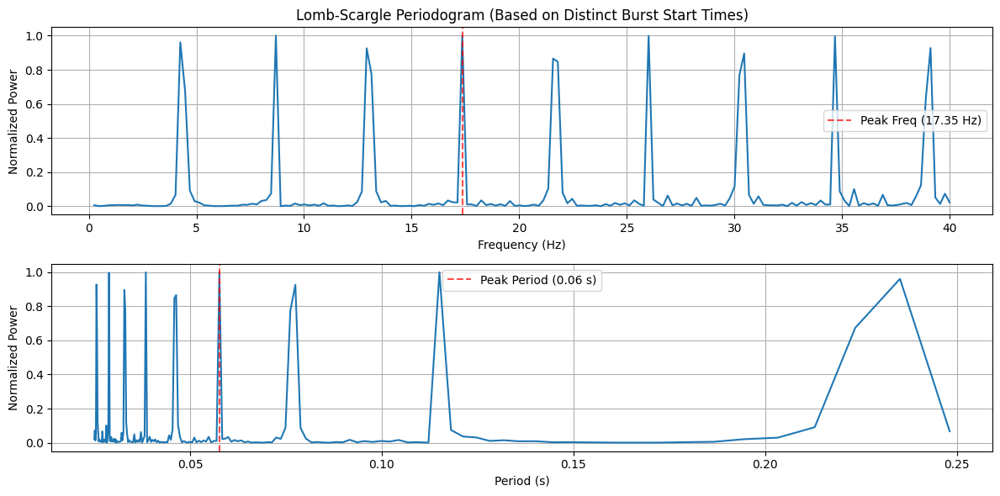

In [3]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import lombscargle

# --- Your existing code ---
def voltage_to_dbm(voltage):
    # (Same function as before)
    if voltage > 2.0:
        voltage = 2.0
    elif voltage < 0.5:
        voltage = 0.5
    return (voltage / -0.025) + 20.0

# Load data
try:
    df = pd.read_csv("raw-data/2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45-raw.csv")
except FileNotFoundError:
    print("Error: CSV file not found. Please check the path.")
    exit()
    
if not {"Elapsed Time (s)", "Value"}.issubset(df.columns):
    print("Error: Required columns 'Elapsed Time (s)' or 'Value' not found in CSV.")
    exit()

# Select the time window
start_time = 5
end_time = 9
df_filtered = df[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()

# Calculate dBm
df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# --- Frequency Analysis ---

threshold_dbm = -25.0
min_inter_sample_gap = 0.05 # Minimum time gap to consider points part of the same burst

# 1. Identify *all* points above threshold
burst_points = df_filtered[df_filtered["dBm"] > threshold_dbm]
all_burst_times = burst_points["Elapsed Time (s)"].values # Get as numpy array

if len(all_burst_times) == 0:
    print(f"No points found above {threshold_dbm} dBm in the time window.")
    exit()

# 2. Identify DISTINCT Burst Event Start Times
burst_start_times = []
if len(all_burst_times) > 0:
    burst_start_times.append(all_burst_times[0]) # The first point always starts a burst
    # Check subsequent points
    for i in range(1, len(all_burst_times)):
        # If the gap to the previous point is LARGER than the threshold, it's a new burst
        if (all_burst_times[i] - all_burst_times[i-1]) > min_inter_sample_gap + 1e-9: # Add small epsilon for float comparison
            burst_start_times.append(all_burst_times[i])

burst_start_times = np.array(burst_start_times) # Convert to numpy array

print(f"Found {len(all_burst_times)} points above {threshold_dbm} dBm.")
print(f"Grouped into {len(burst_start_times)} distinct burst events.")


# --- Plot Data with Identified Burst Starts ---
plt.figure(figsize=(12, 6))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="dBm Data", color='lightblue', markersize=3)
plt.plot(burst_points["Elapsed Time (s)"], burst_points["dBm"], "x", color='orange', markersize=5, label=f'Points > {threshold_dbm}dBm')
plt.plot(burst_start_times, np.full(burst_start_times.shape, threshold_dbm), 'rv', markersize=8, label='Identified Burst Starts') # Plot starts near threshold
plt.axhline(threshold_dbm, color='grey', linestyle='--', label=f'Threshold ({threshold_dbm} dBm)')
plt.title(f"Raw Data ({start_time}s to {end_time}s) with Burst Identification")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)
plt.grid(True)
plt.legend()
plt.show()


# --- Proceed with analysis ONLY if we have multiple distinct bursts ---
if len(burst_start_times) < 2:
    print(f"Not enough distinct burst events ({len(burst_start_times)}) identified to analyze frequency.")
else:
    # 3. Calculate Inter-Burst Intervals (time difference between START of bursts)
    inter_burst_intervals = np.diff(burst_start_times)

    print(f"\nAnalyzing {len(inter_burst_intervals)} intervals between distinct bursts...")

    # 4. Analyze Intervals (Statistics and Histogram) - Now reflects time BETWEEN bursts
    mean_interval = np.mean(inter_burst_intervals)
    median_interval = np.median(inter_burst_intervals)
    std_interval = np.std(inter_burst_intervals)
    min_interval = np.min(inter_burst_intervals)
    max_interval = np.max(inter_burst_intervals)

    print("\n--- Inter-Burst Interval Statistics (between burst starts) ---")
    print(f"Mean:   {mean_interval:.4f} s")
    print(f"Median: {median_interval:.4f} s")
    print(f"Std Dev:{std_interval:.4f} s")
    print(f"Min:    {min_interval:.4f} s")
    print(f"Max:    {max_interval:.4f} s")

    plt.figure(figsize=(10, 5))
    plt.hist(inter_burst_intervals, bins=30, edgecolor='black') # Adjust bins as needed
    plt.title("Histogram of Intervals Between Distinct Burst Starts")
    plt.xlabel("Interval Duration (s)")
    plt.ylabel("Frequency Count")
    plt.axvline(mean_interval, color='r', linestyle='dashed', linewidth=1, label=f'Mean ({mean_interval:.2f}s)')
    plt.axvline(median_interval, color='g', linestyle='dashed', linewidth=1, label=f'Median ({median_interval:.2f}s)')
    plt.legend()
    plt.grid(axis='y', alpha=0.7)
    plt.show()

    # 5. Lomb-Scargle Periodogram - Use burst_start_times!
    print("\n--- Lomb-Scargle Periodogram (using Burst Start Times) ---")
    # Define frequencies to scan
    min_freq = 1 / (burst_start_times[-1] - burst_start_times[0]) if (burst_start_times[-1] - burst_start_times[0]) > 0 else 0.1
    max_freq=1/0.025

    num_freq_points = min(5000, len(burst_start_times)*10) # More points might be needed now
    ang_freqs = np.linspace(2 * np.pi * min_freq, 2 * np.pi * max_freq, num_freq_points)

    # Use the identified burst_start_times as the time input for Lomb-Scargle
    y_values = np.ones_like(burst_start_times) # Still use 1s as we only care about timing
    power = lombscargle(burst_start_times, y_values, ang_freqs, normalize=True)

    frequencies = ang_freqs / (2 * np.pi)
    periods = 1 / frequencies

    peak_index = np.argmax(power)
    peak_freq = frequencies[peak_index]
    peak_period = 1 / peak_freq

    print(f"Peak detected at Frequency: {peak_freq:.4f} Hz")
    print(f"Corresponding Period:     {peak_period:.4f} s")

    # Plot the periodogram
    plt.figure(figsize=(12, 6))
    plt.subplot(2, 1, 1)
    plt.plot(frequencies, power)
    plt.title("Lomb-Scargle Periodogram (Based on Distinct Burst Start Times)")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Normalized Power")
    plt.axvline(peak_freq, color='r', linestyle='--', alpha=0.7, label=f'Peak Freq ({peak_freq:.2f} Hz)')
    plt.legend()
    plt.grid(True)

    plt.subplot(2, 1, 2)
    valid_period_indices = frequencies >4
    plt.plot(periods[valid_period_indices], power[valid_period_indices])
    plt.xlabel("Period (s)")
    plt.ylabel("Normalized Power")
    plt.axvline(peak_period, color='r', linestyle='--', alpha=0.7, label=f'Peak Period ({peak_period:.2f} s)')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

Found 1497 points above -25.0 dBm.
Grouped into 131 distinct burst events.


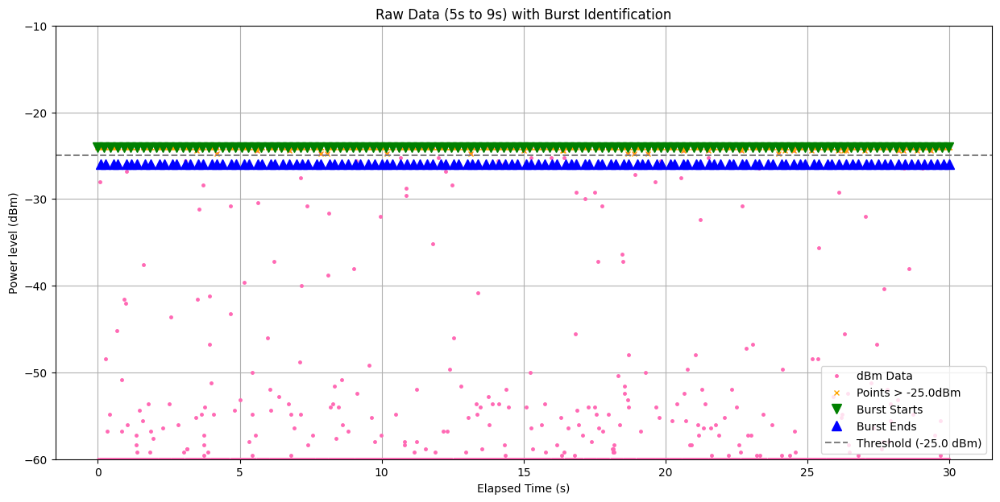

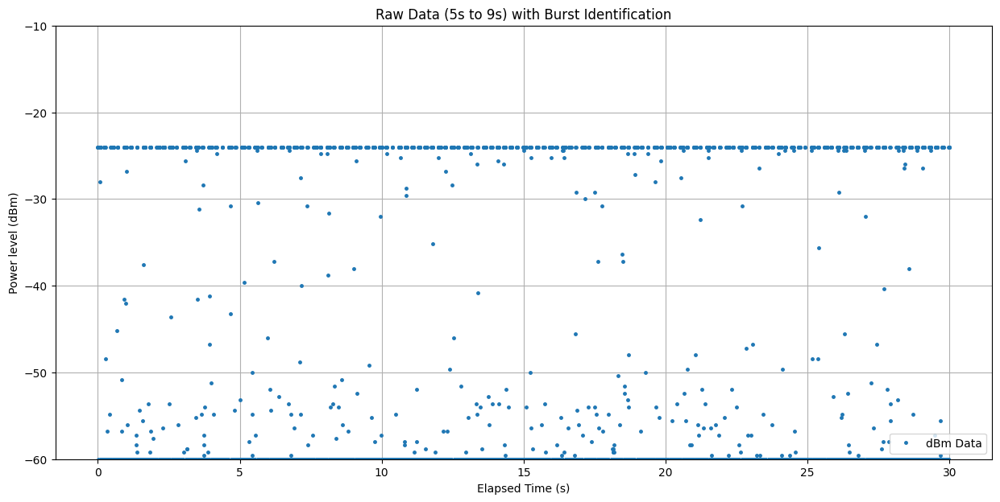


--- Burst Duration Statistics ---
Mean:    0.057328 s
Median:  0.060000 s
Std Dev: 0.032380 s
Min:     0.004000 s
Max:     0.107000 s
Number of points contributing to min duration burst: 2
Number of points contributing to max duration burst: 21


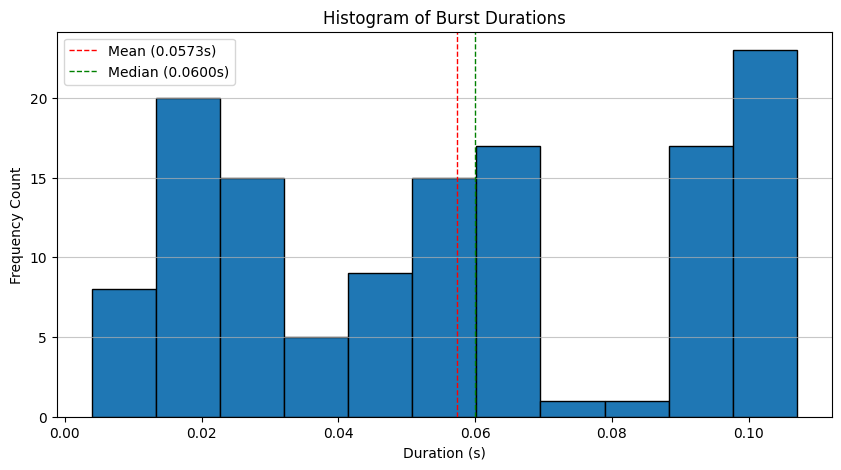

In [8]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import lombscargle
import warnings # Import warnings module

# Suppress specific FutureWarning from pandas if needed (optional)
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- Your existing code ---
def voltage_to_dbm(voltage):
    # Clamp voltage to expected range for the formula
    voltage = np.clip(voltage, 0.5, 2.0)
    return (voltage / -0.025) + 20.0

# Load data
csv_file = "raw-data/2025-04-01_17-38-18_telem-oneside-after-MP-3m-90-antenna-45-raw.csv"
try:
    df = pd.read_csv(csv_file)
except FileNotFoundError:
    print(f"Error: CSV file not found at '{os.path.abspath(csv_file)}'. Please check the path.")
    exit()

if not {"Elapsed Time (s)", "Value"}.issubset(df.columns):
    print("Error: Required columns 'Elapsed Time (s)' or 'Value' not found in CSV.")
    exit()

# Select the time window
start_time =  5
end_time = 9
df_filtered = df#[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()

if df_filtered.empty:
    print(f"Error: No data found in the specified time window ({start_time}s to {end_time}s).")
    exit()

# Calculate dBm
df_filtered["dBm"] = voltage_to_dbm(df_filtered["Value"])

# --- Burst Identification and Duration Analysis ---

threshold_dbm = -25.0
min_inter_sample_gap = 0.05 # Minimum time gap to consider points part of the SAME burst

# 1. Identify *all* points above threshold
burst_points_df = df_filtered[df_filtered["dBm"] > threshold_dbm].copy()
all_burst_times = burst_points_df["Elapsed Time (s)"].values # Get as numpy array
all_burst_dbm = burst_points_df["dBm"].values # Get corresponding dBm values

if len(all_burst_times) == 0:
    print(f"No points found above {threshold_dbm} dBm in the time window.")
    exit()

print(f"Found {len(all_burst_times)} points above {threshold_dbm} dBm.")

# 2. Group points into distinct bursts and calculate duration
burst_events = [] # List to store info for each burst (start_time, end_time, duration, points_df)
current_burst_indices = []

if len(all_burst_times) > 0:
    current_burst_indices.append(0) # Start with the first point

    for i in range(1, len(all_burst_times)):
        time_gap = all_burst_times[i] - all_burst_times[i-1]
        # If the gap is LARGER than threshold, the previous burst ended, start a new one
        if time_gap > min_inter_sample_gap + 1e-9: # Add small epsilon
            # Finalize the previous burst
            start_idx = current_burst_indices[0]
            end_idx = current_burst_indices[-1]
            start_t = all_burst_times[start_idx]
            end_t = all_burst_times[end_idx]
            duration = end_t - start_t
            # Store the actual data points for this burst
            burst_points_subset = burst_points_df.iloc[current_burst_indices]
            burst_events.append({
                "start_time": start_t,
                "end_time": end_t,
                "duration": duration,
                "num_points": len(current_burst_indices),
                "points_df": burst_points_subset # Store the subset of the DataFrame
            })
            # Start a new burst
            current_burst_indices = [i]
        else:
            # Add point to the current burst
            current_burst_indices.append(i)

    # Add the last burst after the loop finishes
    if current_burst_indices:
        start_idx = current_burst_indices[0]
        end_idx = current_burst_indices[-1]
        start_t = all_burst_times[start_idx]
        end_t = all_burst_times[end_idx]
        duration = end_t - start_t
        burst_points_subset = burst_points_df.iloc[current_burst_indices]
        burst_events.append({
            "start_time": start_t,
            "end_time": end_t,
            "duration": duration,
            "num_points": len(current_burst_indices),
            "points_df": burst_points_subset
        })

print(f"Grouped into {len(burst_events)} distinct burst events.")

# Extract relevant lists if needed
burst_start_times = np.array([event["start_time"] for event in burst_events])
burst_end_times = np.array([event["end_time"] for event in burst_events])
burst_durations = np.array([event["duration"] for event in burst_events])

# --- Plot Data with Identified Burst Starts and Ends ---
plt.figure(figsize=(15, 7)) # Wider figure
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="dBm Data", color='hotpink', markersize=5)
# Plot all points above threshold
plt.plot(all_burst_times, all_burst_dbm, "x", color='orange', markersize=5, label=f'Points > {threshold_dbm}dBm')
# Plot identified burst start and end markers
plt.plot(burst_start_times, np.full(burst_start_times.shape, threshold_dbm + 1), 'gv', markersize=8, label='Burst Starts') # Green triangle down
plt.plot(burst_end_times, np.full(burst_end_times.shape, threshold_dbm - 1), 'b^', markersize=8, label='Burst Ends') # Blue triangle up
plt.axhline(threshold_dbm, color='grey', linestyle='--', label=f'Threshold ({threshold_dbm} dBm)')

# # Optional: Add lines spanning the duration of each burst (can be cluttered)
# for event in burst_events:
#      plt.hlines(y=threshold_dbm - 3, xmin=event['start_time'], xmax=event['end_time'], color='purple', linewidth=1.5, alpha=0.6)

plt.title(f"Raw Data ({start_time}s to {end_time}s) with Burst Identification")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(-60, -10) # Adjusted ylim slightly
plt.grid(True)
plt.legend(loc='lower right')
plt.show()

# ------------------------------------------------------------------
plt.figure(figsize=(15, 7)) # Wider figure
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="dBm Data", markersize=5)
# Plot all points above threshold
# plt.plot(all_burst_times, all_burst_dbm, "x", color='orange', markersize=5, label=f'Points > {threshold_dbm}dBm')
# Plot identified burst start and end markers
# plt.plot(burst_start_times, np.full(burst_start_times.shape, threshold_dbm + 1), 'gv', markersize=8, label='Burst Starts') # Green triangle down
# plt.plot(burst_end_times, np.full(burst_end_times.shape, threshold_dbm - 1), 'b^', markersize=8, label='Burst Ends') # Blue triangle up
# plt.axhline(threshold_dbm, color='grey', linestyle='--', label=f'Threshold ({threshold_dbm} dBm)')

# # Optional: Add lines spanning the duration of each burst (can be cluttered)
# for event in burst_events:
#      plt.hlines(y=threshold_dbm - 3, xmin=event['start_time'], xmax=event['end_time'], color='purple', linewidth=1.5, alpha=0.6)

plt.title(f"Raw Data ({start_time}s to {end_time}s) with Burst Identification")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(-60, -10) # Adjusted ylim slightly
plt.grid(True)
plt.legend(loc='lower right')
plt.show()
# ------------------------------------------------------------------------


# --- Analysis of Burst Durations ---
if len(burst_durations) > 0:
    print("\n--- Burst Duration Statistics ---")
    mean_duration = np.mean(burst_durations)
    median_duration = np.median(burst_durations)
    std_duration = np.std(burst_durations)
    min_duration = np.min(burst_durations)
    max_duration = np.max(burst_durations)

    print(f"Mean:    {mean_duration:.6f} s") # More precision for potentially short durations
    print(f"Median:  {median_duration:.6f} s")
    print(f"Std Dev: {std_duration:.6f} s")
    print(f"Min:     {min_duration:.6f} s")
    print(f"Max:     {max_duration:.6f} s")
    print(f"Number of points contributing to min duration burst: {burst_events[np.argmin(burst_durations)]['num_points']}")
    print(f"Number of points contributing to max duration burst: {burst_events[np.argmax(burst_durations)]['num_points']}")


    plt.figure(figsize=(10, 5))
    # Choose bins appropriate for the duration range
    duration_range = max_duration - min_duration
    n_bins = min(50, max(10, int(np.sqrt(len(burst_durations))))) # Heuristic for bins
    if duration_range > 1e-9: # Avoid issues if all durations are identical
         plt.hist(burst_durations, bins=n_bins, edgecolor='black')
    else:
         plt.hist(burst_durations, bins=1, edgecolor='black') # Handle case of identical durations

    plt.title("Histogram of Burst Durations")
    plt.xlabel("Duration (s)")
    plt.ylabel("Frequency Count")
    plt.axvline(mean_duration, color='r', linestyle='dashed', linewidth=1, label=f'Mean ({mean_duration:.4f}s)')
    plt.axvline(median_duration, color='g', linestyle='dashed', linewidth=1, label=f'Median ({median_duration:.4f}s)')
    plt.legend()
    plt.grid(axis='y', alpha=0.7)
    plt.show()
else:
    print("\nNo bursts identified, skipping duration analysis.")


analyze further


<Axes: >

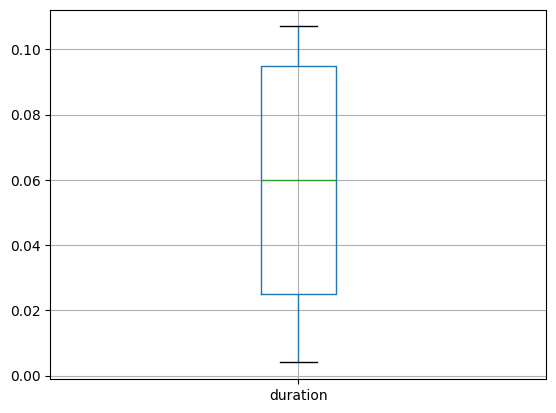

In [87]:
pd.DataFrame(burst_events).boxplot(column=["duration"])
    # if be["duration"]>=0.106:
    #     print(be)

<Axes: >

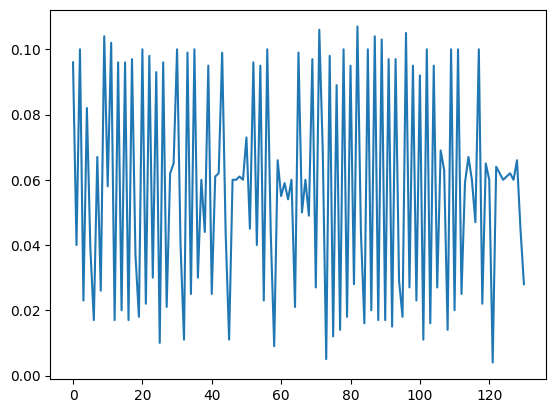

In [88]:
pd.DataFrame(burst_events).duration.plot()

In [16]:
burst_durations

array([0.004, 0.005, 0.009, 0.01 , 0.011, 0.011, 0.011, 0.012, 0.014,
       0.014, 0.015, 0.016, 0.016, 0.017, 0.017, 0.017, 0.017, 0.017,
       0.018, 0.018, 0.018, 0.02 , 0.02 , 0.02 , 0.021, 0.021, 0.022,
       0.022, 0.023, 0.023, 0.023, 0.025, 0.025, 0.025, 0.026, 0.027,
       0.027, 0.027, 0.028, 0.028, 0.029, 0.03 , 0.03 , 0.037, 0.039,
       0.04 , 0.04 , 0.04 , 0.044, 0.044, 0.044, 0.044, 0.045, 0.045,
       0.047, 0.049, 0.05 , 0.054, 0.055, 0.058, 0.059, 0.059, 0.06 ,
       0.06 , 0.06 , 0.06 , 0.06 , 0.06 , 0.06 , 0.06 , 0.06 , 0.06 ,
       0.061, 0.061, 0.061, 0.062, 0.062, 0.062, 0.062, 0.063, 0.064,
       0.065, 0.065, 0.066, 0.066, 0.067, 0.067, 0.069, 0.069, 0.073,
       0.082, 0.089, 0.092, 0.093, 0.095, 0.095, 0.095, 0.095, 0.095,
       0.096, 0.096, 0.096, 0.096, 0.096, 0.097, 0.097, 0.097, 0.097,
       0.098, 0.098, 0.099, 0.099, 0.099, 0.1  , 0.1  , 0.1  , 0.1  ,
       0.1  , 0.1  , 0.1  , 0.1  , 0.1  , 0.1  , 0.1  , 0.102, 0.103,
       0.104, 0.104,

telem affected signal

telemetry and rc combined

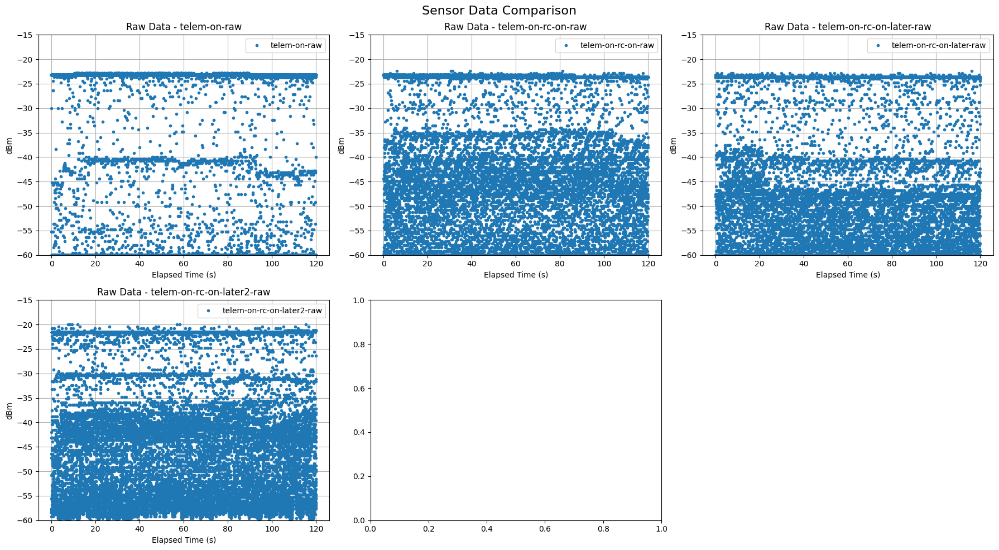

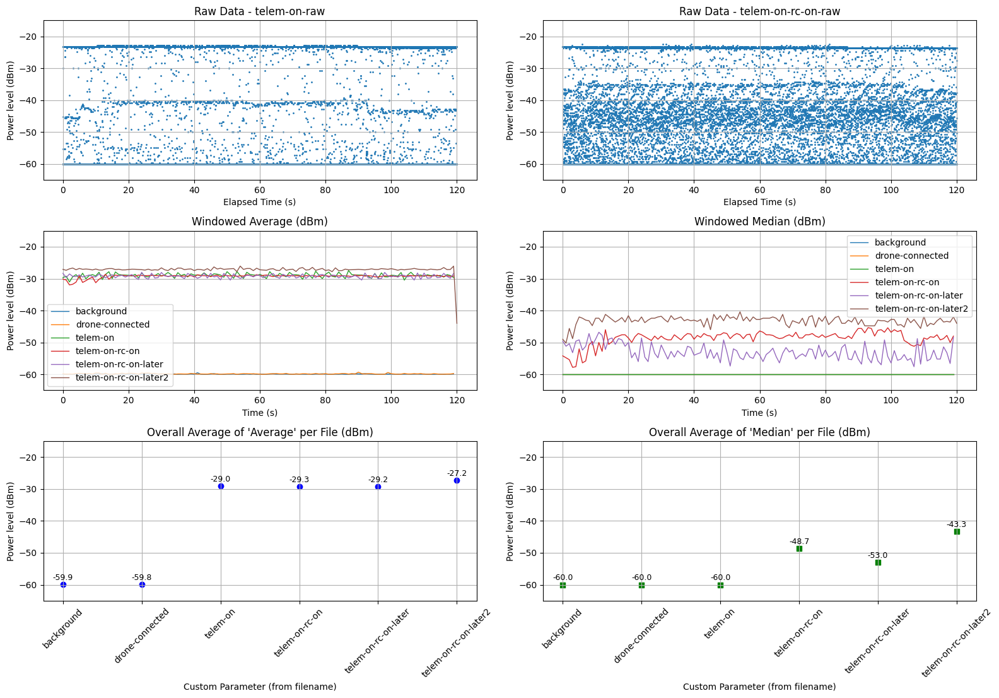

In [89]:
raw_files = [
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv",
    "raw-data\\2025-03-05_17-38-19_telem-on-rc-on-raw.csv",
    "raw-data\\2025-03-05_18-37-03_telem-on-rc-on-later-raw.csv",
    "raw-data\\2025-03-05_20-05-42_telem-on-rc-on-later2-raw.csv",
]

# labels=["rc-on-startup",
#         "drone-startup (rc off)",
#         "rc-startup (drone already powered on for ~30s)",
#         "rc-startup-second-half (drone off)",
#         "drone-startup-second-half (rc on)"
#         ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv",
    "raw-data\\2025-03-05_17-38-19_telem-on-rc-on-raw.csv",

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-03-05_17-23-07_drone-connected.csv",
    "processed-data\\2025-03-05_17-28-07_telem-on.csv",
    "processed-data\\2025-03-05_17-38-19_telem-on-rc-on.csv",
    "processed-data\\2025-03-05_18-37-03_telem-on-rc-on-later.csv",
    "processed-data\\2025-03-05_20-05-42_telem-on-rc-on-later2.csv",
]
make_plot(raw_files,processed_files)



When looking at the combination of telemetry with rc these experiments have to be redone, taking the next experiment into account.



redo


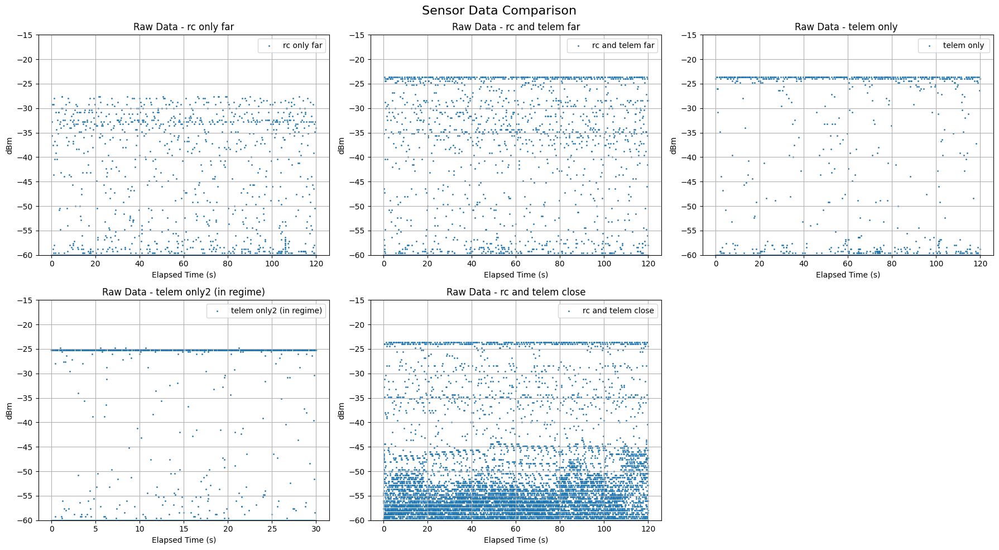

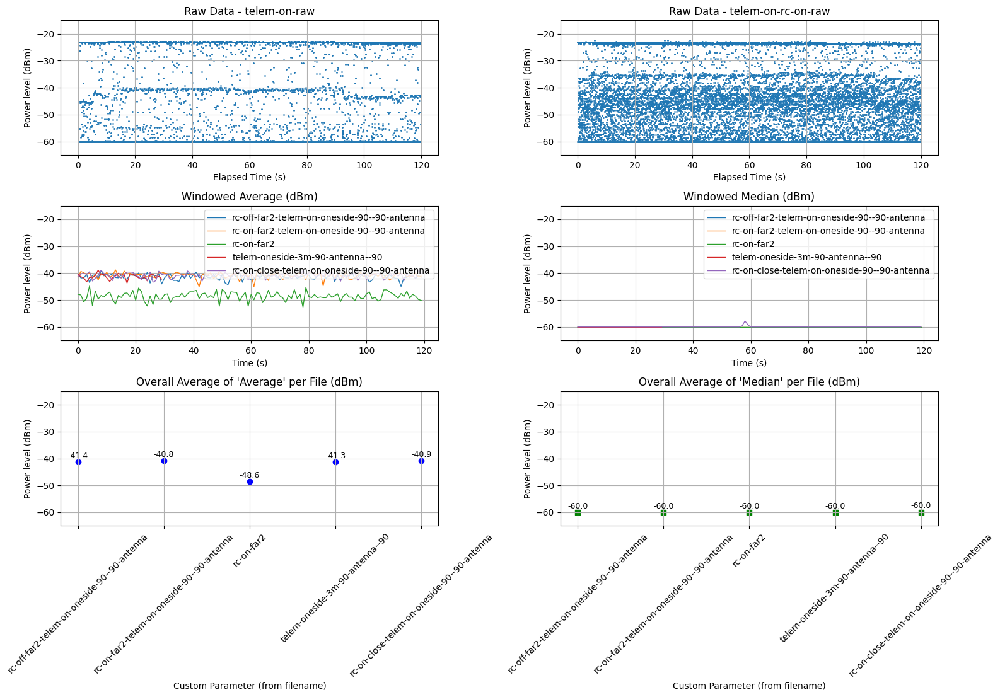

In [90]:
raw_files = [
    "raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv",
    "raw-data\\2025-03-31_15-11-50_rc-on-far2-telem-on-oneside-90--90-antenna-raw.csv",
    "raw-data\\2025-03-31_15-15-16_rc-off-far2-telem-on-oneside-90--90-antenna-raw.csv",
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-03-31_15-23-47_rc-on-close-telem-on-oneside-90--90-antenna-raw.csv"
]

labels=["rc only far",
        "rc and telem far",
        "telem only ",
        "telem only2 (in regime)",
        "rc and telem close",
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"],  label=labels[i], s=1)
        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


# Raw data files
raw_files = [
    "raw-data\\2025-03-05_17-28-07_telem-on-raw.csv",
    "raw-data\\2025-03-05_17-38-19_telem-on-rc-on-raw.csv",

]

# Processed data files
processed_files = [
    "processed-data\\2025-03-31_15-15-16_rc-off-far2-telem-on-oneside-90--90-antenna.csv",
    "processed-data\\2025-03-31_15-11-50_rc-on-far2-telem-on-oneside-90--90-antenna.csv",
    "processed-data\\2025-03-31_15-09-30_rc-on-far2.csv",
    "processed-data\\2025-03-31_13-00-16_telem-oneside-3m-90-antenna--90.csv",
    "processed-data\\2025-03-31_15-23-47_rc-on-close-telem-on-oneside-90--90-antenna.csv"

]
make_plot(raw_files,processed_files)



if telemetry and rc are both turned on, rc has no influence on the measured average.
median is not influenced by rc and telemetry
so in practice fly after signal strength is visible on controller. rc will have no efect on average if telemetry is on. 
both rc and telemetry will have no effect on median.
redo with telem in regime?


check median

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\2827675293.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


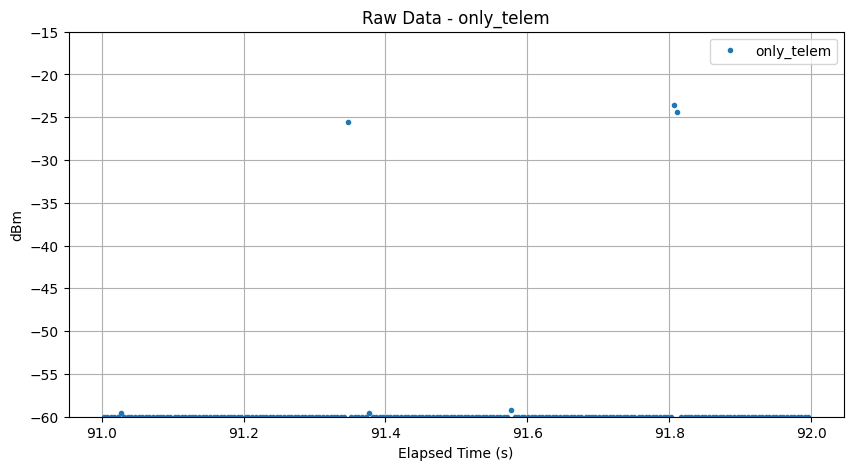

In [91]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the CSV file
df = pd.read_csv("raw-data\\2025-03-31_15-15-16_rc-off-far2-telem-on-oneside-90--90-antenna-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 91) & (df["Elapsed Time (s)"] < 92)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_telem", linewidth=0.5)
plt.title(f"Raw Data - {"only_telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\2737308896.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


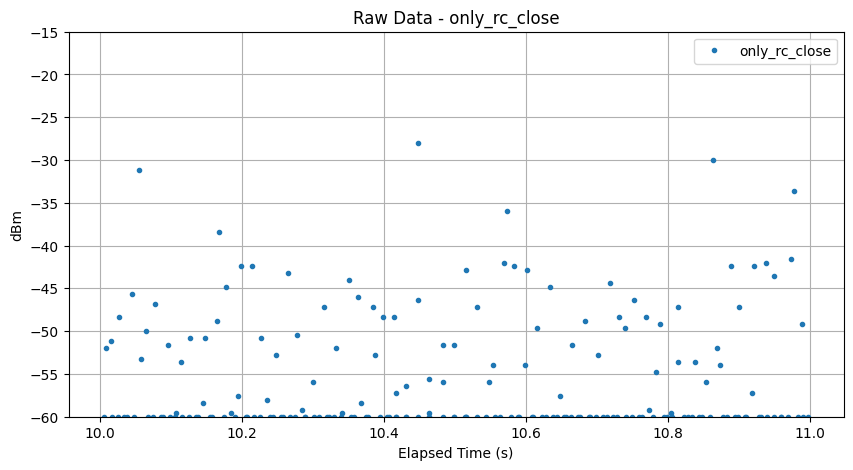

In [92]:
df = pd.read_csv("raw-data\\2025-03-31_14-50-59_rc-on-3m-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_rc_close", linewidth=0.5)
plt.title(f"Raw Data - {"only_rc_close"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3807061614.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


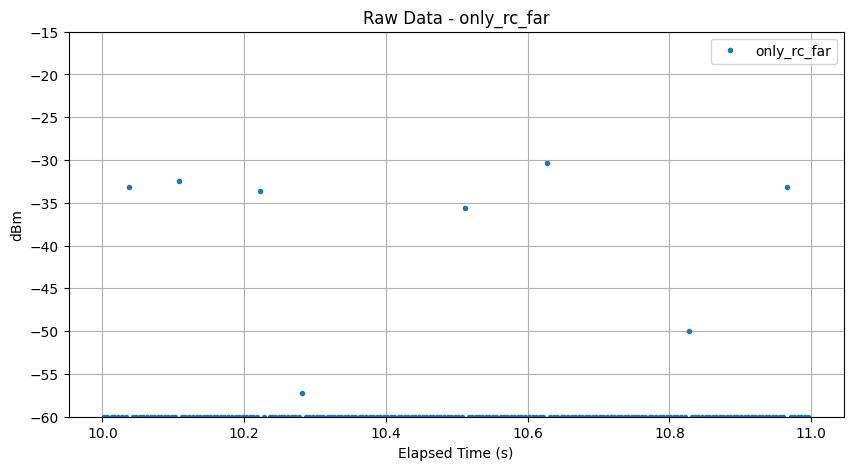

In [93]:
df = pd.read_csv("raw-data\\2025-03-31_15-09-30_rc-on-far2-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="only_rc_far", linewidth=0.5)
plt.title(f"Raw Data - {"only_rc_far"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3856571669.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


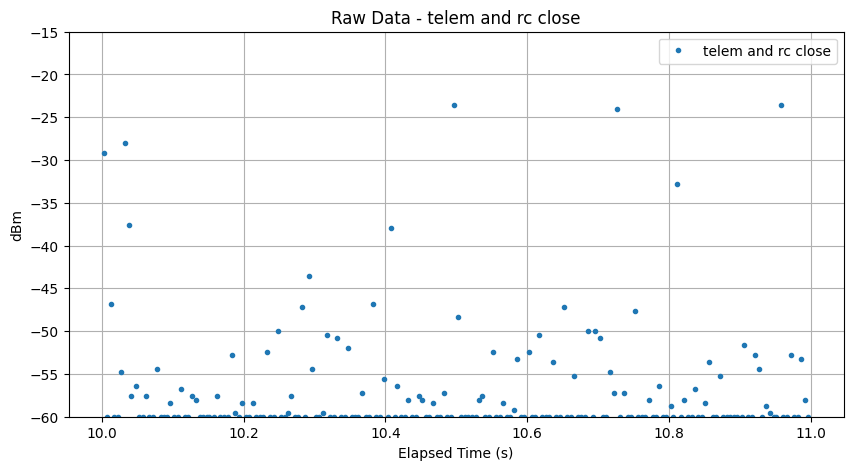

In [94]:
df = pd.read_csv("raw-data\\2025-03-31_15-23-47_rc-on-close-telem-on-oneside-90--90-antenna-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc close", linewidth=0.5)
plt.title(f"Raw Data - {"telem and rc close"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\2778007044.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


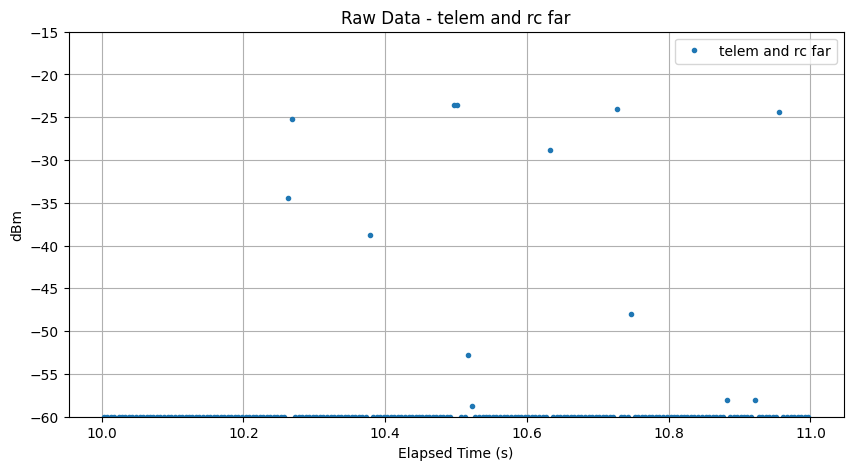

In [95]:
df = pd.read_csv("raw-data\\2025-03-31_15-11-50_rc-on-far2-telem-on-oneside-90--90-antenna-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
plt.title(f"Raw Data - {"telem and rc far"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


median looks like a goo option looking at these graphs

check weird telem behaviour

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\73408411.py:27: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


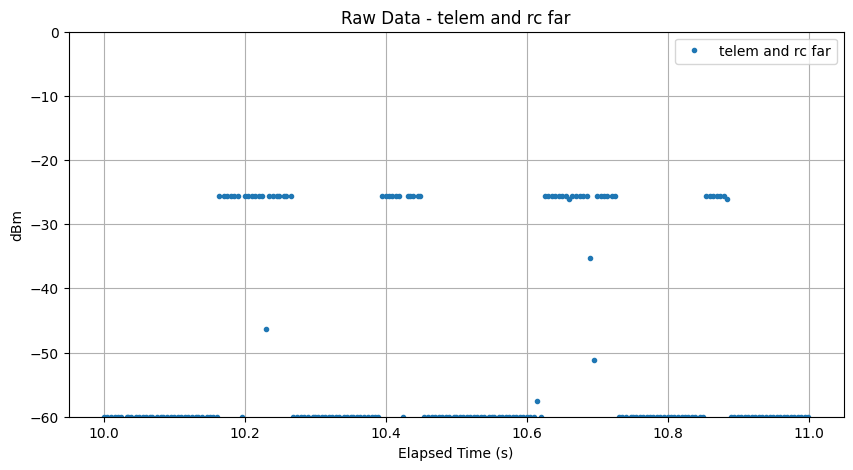

In [96]:
files=[
    # "raw-data\\2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90-raw.csv"
    "raw-data/2025-03-29_17-07-42_telem-oneside-3m-90-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-08-25_telem-oneside-3m-45-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-09-13_telem-oneside-3m-00-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-10-20_telem-oneside-3m--45-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-11-11_telem-oneside-3m--90-antenna-90-raw.csv",
    # "raw-data/2025-03-29_17-12-21_telem-oneside-3m-90-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-13-32_telem-oneside-3m-45-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-14-26_telem-oneside-3m-00-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-15-23_telem-oneside-3m--45-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-16-19_telem-oneside-3m--90-antenna-45-raw.csv",
    # "raw-data/2025-03-29_17-17-13_telem-oneside-3m--90-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-18-00_telem-oneside-3m--45-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-19-26_telem-oneside-3m-00-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-20-40_telem-oneside-3m-45-antenna-00-raw.csv",
    # "raw-data/2025-03-29_17-21-56_telem-oneside-3m-90-antenna-00-raw.csv",
]
for file in files:

    df = pd.read_csv(file)

    # Select only data where "Second" == 90
    df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
    plt.title(f"Raw Data - {"telem and rc far"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, 0)  
    plt.grid(True)
    plt.legend()


    plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\1239518883.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


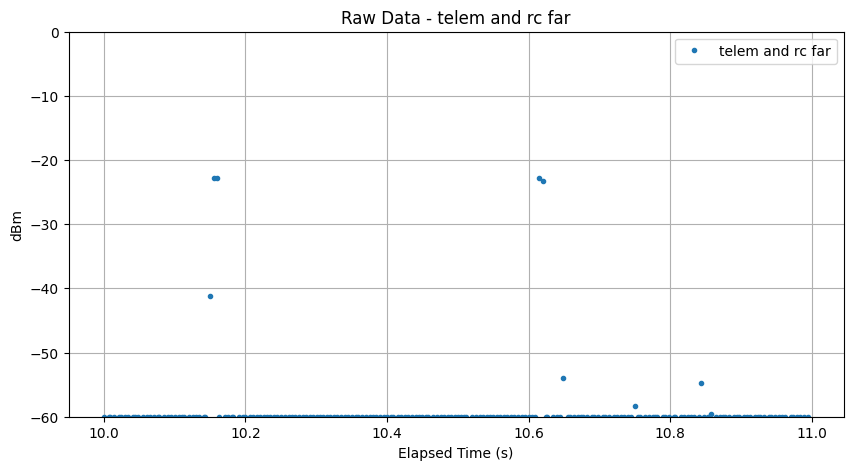

In [97]:
files=[
    "raw-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-49-41_telem-oneside-3m-45-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-50-31_telem-oneside-3m-00-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-51-37_telem-oneside-3m--45-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-52-23_telem-oneside-3m--90-antenna-90-raw.csv",
    # "raw-data\\2025-03-31_12-57-45_telem-oneside-3m-90-antenna-45-raw.csv",
    # "raw-data\\2025-03-31_12-58-30_telem-oneside-3m-90-antenna-00-raw.csv",
    # "raw-data\\2025-03-31_12-59-10_telem-oneside-3m-90-antenna--45-raw.csv",
    # "raw-data\\2025-03-31_13-00-16_telem-oneside-3m-90-antenna--90-raw.csv",
    # "raw-data\\2025-03-31_13-01-22_telem-oneside-3m--90-antenna-90-raw.csv",
]
for file in files:

    df = pd.read_csv(file)

    # Select only data where "Second" == 90
    df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
    plt.title(f"Raw Data - {"telem and rc far"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, 0)  
    plt.grid(True)
    plt.legend()


    plt.show()

die shift in data komt hierdoor maar waarom precies? kkijk eens of connectie met mission planner een effect heeft

In [98]:
# df = pd.read_csv("raw-data\\2025-03-29_16-25-54_telem-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv")

# df_filtered = df

# df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# # Plot the raw data
# plt.figure(figsize=(10, 5))
# # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm no telem", linewidth=0.5)
# plt.title(f"Raw Data - {"18dbm no telem"}")
# plt.xlabel("Elapsed Time (s)")
# plt.ylabel("dBm")
# plt.ylim(-60, -15)  
# plt.grid(True)
# plt.legend()


# plt.show()


# # Select only data where "Second" == 90
# for i in range(0,90,29):
#     df_filtered = df[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

#     df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

#     # Plot the raw data
#     plt.figure(figsize=(10, 5))
#     # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


#     plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm no telem", linewidth=0.5)
#     plt.title(f"Raw Data - {"18dbm no telem"}")
#     plt.xlabel("Elapsed Time (s)")
#     plt.ylabel("dBm")
#     plt.ylim(-60, -15)  
#     plt.grid(True)
#     plt.legend()


#     plt.show()


niet echt iets te besluiten shift was er al van in begin en connectie met mp of andere telemetry heeft geen effect gehad

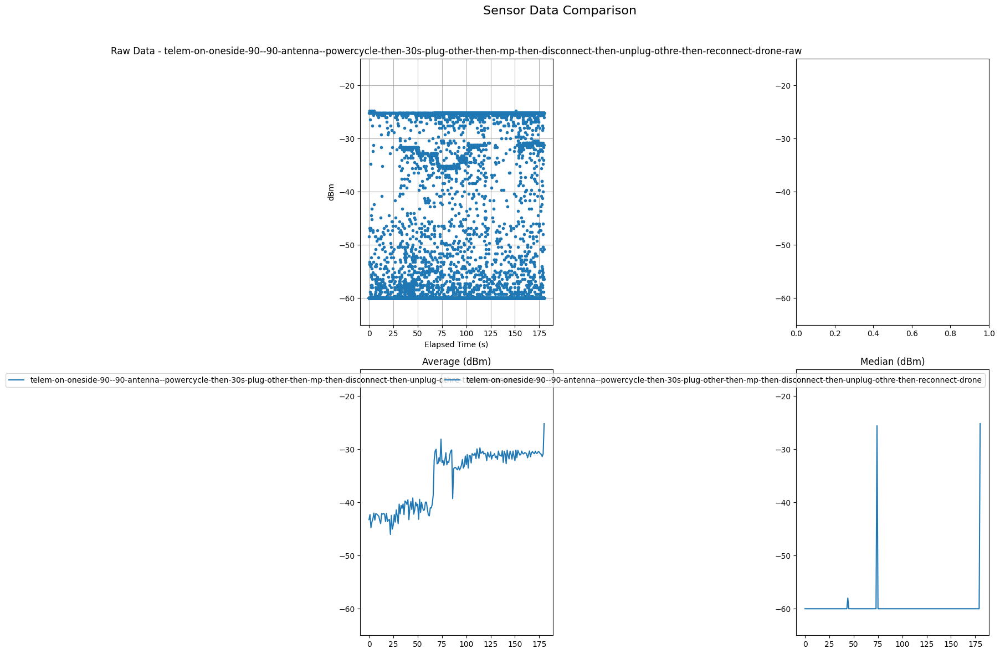

In [99]:
# Raw data files
raw_files = [
    "raw-data\\2025-04-01_16-49-36_telem-on-oneside-90--90-antenna--powercycle-then-30s-plug-other-then-mp-then-disconnect-then-unplug-othre-then-reconnect-drone-raw.csv",
    # "raw-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected-raw.csv",    # "processed-data\\2025-03-05_17-23-07_drone-connected.csv",,

]
#seconde 70 was mp conected en aan het downloaden
# Processed data files
processed_files = [
    # "processed-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected.csv",    # "processed-data\\2025-03-05_17-23-07_drone-connected.csv",,
    "processed-data\\2025-04-01_16-49-36_telem-on-oneside-90--90-antenna--powercycle-then-30s-plug-other-then-mp-then-disconnect-then-unplug-othre-then-reconnect-drone.csv"
    ]
    # data_dict = {}

# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]
    
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[0, i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[0, i].set_title(f"Raw Data - {custom_param}")
        axes[0, i].set_xlabel("Elapsed Time (s)")
        axes[0, i].set_ylabel("dBm")
        axes[0, i].set_ylim(-60, -15)
        axes[0, i].grid(True)

# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[1, 0].plot(df["Average"], label=custom_param)
        axes[1, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[1, 0].set_title("Average (dBm)")
        axes[1, 1].set_title("Median (dBm)")
        axes[1, 0].legend()
        axes[1, 1].legend()
        for i in range(2):
            for j in range(2):
                axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
# for file_name, avg_value in average_dbm_per_file.items():
#     axes[2, 0].scatter(file_name, avg_value, color="b", marker="o")
# axes[2, 0].set_title("Average of 'Average' per File (dBm)")
# axes[2, 0].set_xlabel("CSV File")
# axes[2, 0].set_ylabel("dBm")
# axes[2, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
# for file_name, avg_value in average_median_dbm_per_file.items():
#     axes[2, 1].scatter(file_name, avg_value, color="g", marker="s")
# axes[2, 1].set_title("Average of 'Median' per File (dBm)")
# axes[2, 1].set_xlabel("CSV File")
# axes[2, 1].set_ylabel("dBm")
# axes[2, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

oké dus vanaf dat je connect met MP gaat telemetry in ander regime werken en verschijnen die shifts. maakt niet uit of andere kant disconnect en of reconnect, die streepjes blijven.

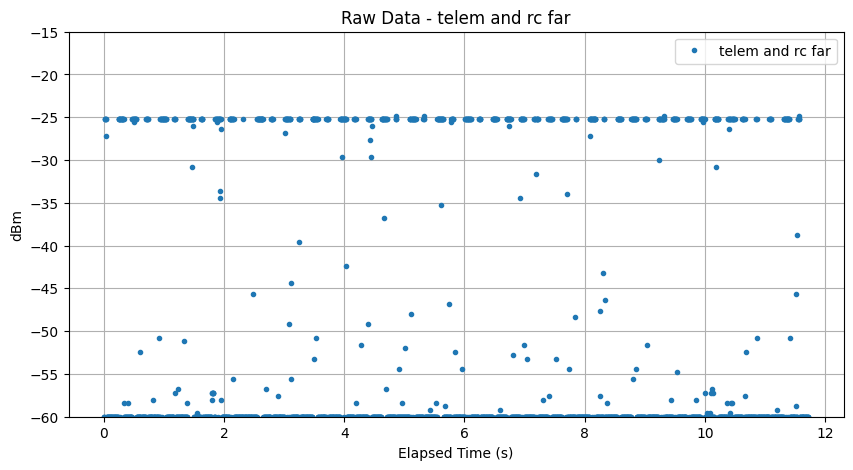

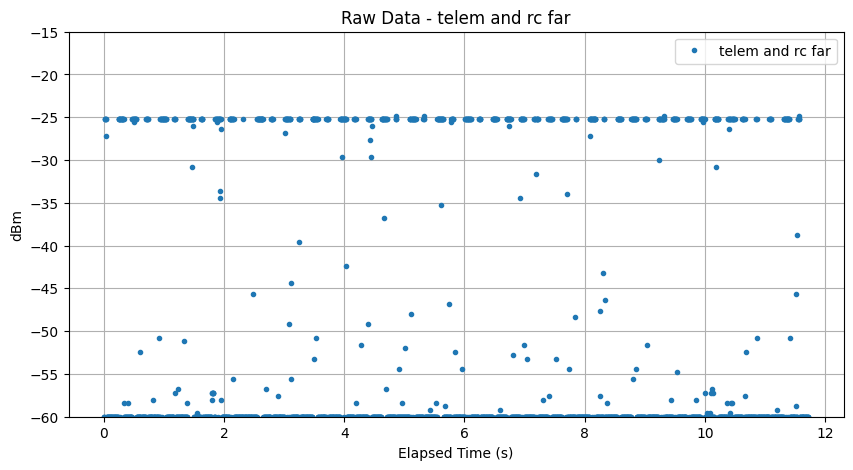

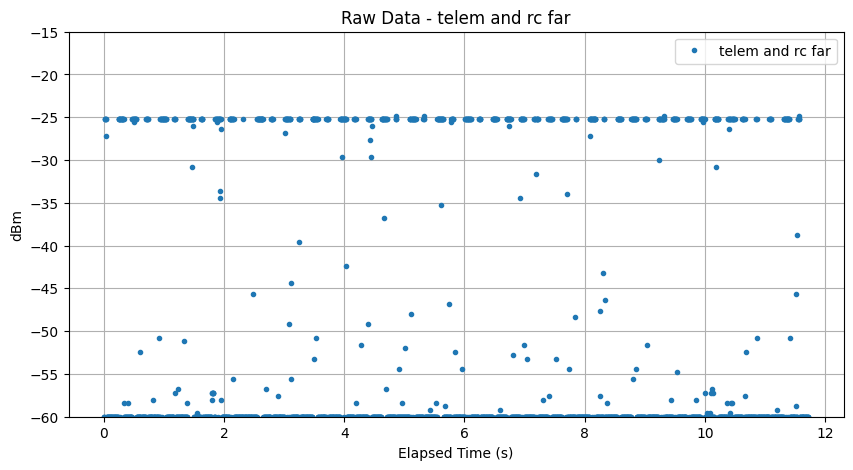

In [100]:
files=[
    "raw-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected-raw.csv"
]
for file in files:
    for i in range(0,30,10):
        df = pd.read_csv(file)

        # Select only data where "Second" == 90
        df_filtered = df#[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

        df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

        # Plot the raw data
        plt.figure(figsize=(10, 5))
        # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


        plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
        plt.title(f"Raw Data - {"telem and rc far"}")
        plt.xlabel("Elapsed Time (s)")
        plt.ylabel("dBm")
        plt.ylim(-60, -15)  
        plt.grid(True)
        plt.legend()


        plt.show()


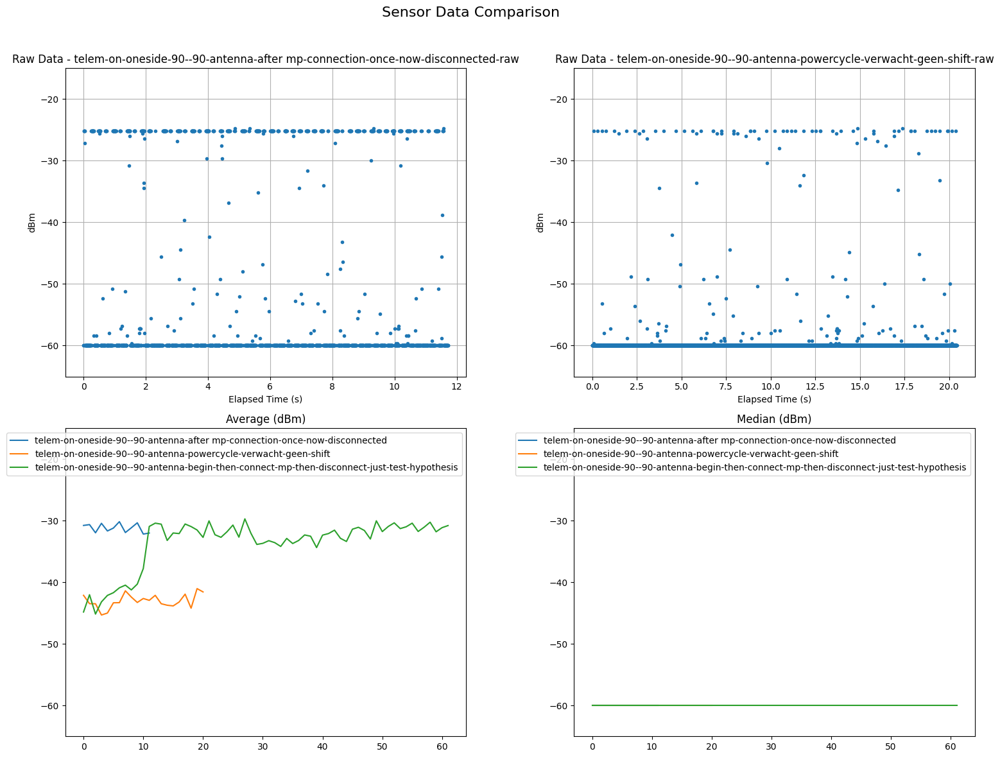

In [101]:
# Raw data files
raw_files = [
    "raw-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected-raw.csv",
    "raw-data\\2025-04-01_17-15-23_telem-on-oneside-90--90-antenna-powercycle-verwacht-geen-shift-raw.csv",
]
# Processed data files
processed_files = [
    "processed-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected.csv",
    "processed-data\\2025-04-01_17-15-23_telem-on-oneside-90--90-antenna-powercycle-verwacht-geen-shift.csv",    
    "processed-data\\2025-04-01_17-21-25_telem-on-oneside-90--90-antenna-begin-then-connect-mp-then-disconnect-just-test-hypothesis.csv"
    # data_dict = {}
]
# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]
    
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[0, i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[0, i].set_title(f"Raw Data - {custom_param}")
        axes[0, i].set_xlabel("Elapsed Time (s)")
        axes[0, i].set_ylabel("dBm")
        axes[0, i].set_ylim(-60, -15)
        axes[0, i].grid(True)

# Process and plot processed data
for file in processed_files:
    df = pd.read_csv(file)
    filename = os.path.basename(file)
    custom_param = filename.split("_")[-1].replace(".csv", "")
    
    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        average_median_dbm_per_file[custom_param] = df["Median"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes[1, 0].plot(df["Average"], label=custom_param)
        axes[1, 1].plot(df["Median"], label=custom_param)

        # Titles and legends
        axes[1, 0].set_title("Average (dBm)")
        axes[1, 1].set_title("Median (dBm)")
        axes[1, 0].legend()
        axes[1, 1].legend()
        for i in range(2):
            for j in range(2):
                axes[i,j].set_ylim([-65, -15])
                
# Plot average of "Average" per file
# for file_name, avg_value in average_dbm_per_file.items():
#     axes[2, 0].scatter(file_name, avg_value, color="b", marker="o")
# axes[2, 0].set_title("Average of 'Average' per File (dBm)")
# axes[2, 0].set_xlabel("CSV File")
# axes[2, 0].set_ylabel("dBm")
# axes[2, 0].tick_params(axis='x', rotation=45)

# Plot average of "Median" per file
# for file_name, avg_value in average_median_dbm_per_file.items():
#     axes[2, 1].scatter(file_name, avg_value, color="g", marker="s")
# axes[2, 1].set_title("Average of 'Median' per File (dBm)")
# axes[2, 1].set_xlabel("CSV File")
# axes[2, 1].set_ylabel("dBm")
# axes[2, 1].tick_params(axis='x', rotation=45)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

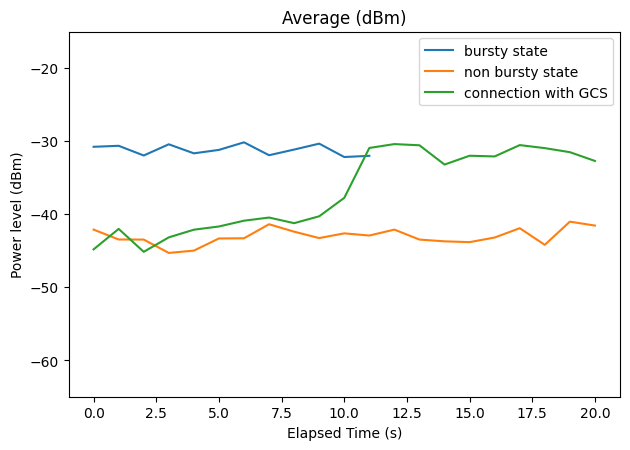

In [102]:
processed_files = [
    "processed-data\\2025-04-01_16-56-56_telem-on-oneside-90--90-antenna-after mp-connection-once-now-disconnected.csv",
    "processed-data\\2025-04-01_17-15-23_telem-on-oneside-90--90-antenna-powercycle-verwacht-geen-shift.csv",    
    "processed-data\\2025-04-01_17-21-25_telem-on-oneside-90--90-antenna-begin-then-connect-mp-then-disconnect-just-test-hypothesis.csv"
    # data_dict = {}
]
lebles=["bursty state","non bursty state","connection with GCS"]
# Dictionary to store averages
average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(1,1)
# fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot processed data
for i,file in enumerate(processed_files):
    df = pd.read_csv(file)
    df=df[df["Second"]<=20]
    filename = os.path.basename(file)
    custom_param =     lebles[i]

    if {"Average", "Median"}.issubset(df.columns):
        average_dbm_per_file[custom_param] = df["Average"].mean()
        # Plot each metric
        # for custom_param, df in data_dict.items():
        axes.plot(df["Average"], label=custom_param)
        axes.set_xlabel("Elapsed Time (s)")
        axes.set_ylabel("Power level (dBm)")
        # Titles and legends
        axes.set_title("Average (dBm)")
        axes.legend()
        axes.set_ylim([-65, -15])
                

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

Connecting to MP causes the 10db shift setting the telemetry in a bursty state. In following experiments to make them more realistic telemetry will first be set to a bursty state before condusting measurements. Additional experiments have shown this bursty state is semi permanent and any resets when Flight controller is rebooted. 

In [103]:
# files=[
#     "raw-data\\2025-04-01_16-49-36_telem-on-oneside-90--90-antenna--powercycle-then-30s-plug-other-then-mp-then-disconnect-then-unplug-othre-then-reconnect-drone-raw.csv"
# ]
# for file in files:
#     for i in range(0,181,10):
#         df = pd.read_csv(file)

#         # Select only data where "Second" == 90
#         df_filtered = df[(df["Elapsed Time (s)"] >= i) & (df["Elapsed Time (s)"] < i+1)]

#         df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

#         # Plot the raw data
#         plt.figure(figsize=(10, 5))
#         # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


#         plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
#         plt.title(f"Raw Data - {"telem and rc far"}")
#         plt.xlabel("Elapsed Time (s)")
#         plt.ylabel("dBm")
#         plt.ylim(-60, -15)  
#         plt.grid(True)
#         plt.legend()


#         plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\2015063923.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


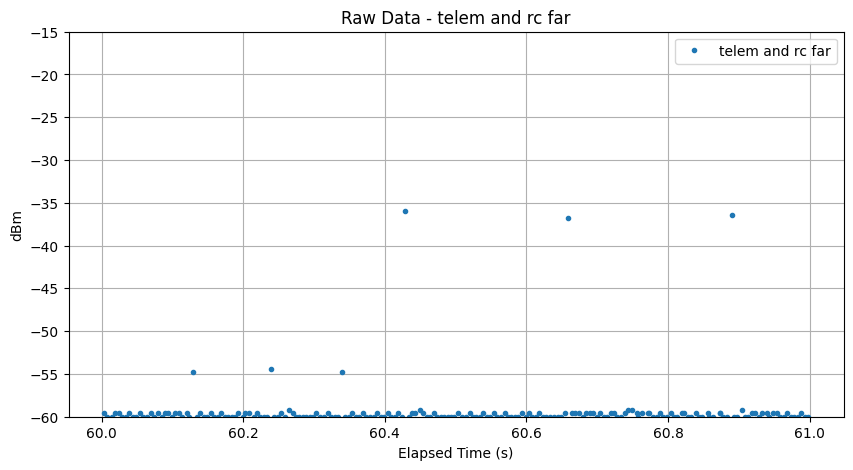

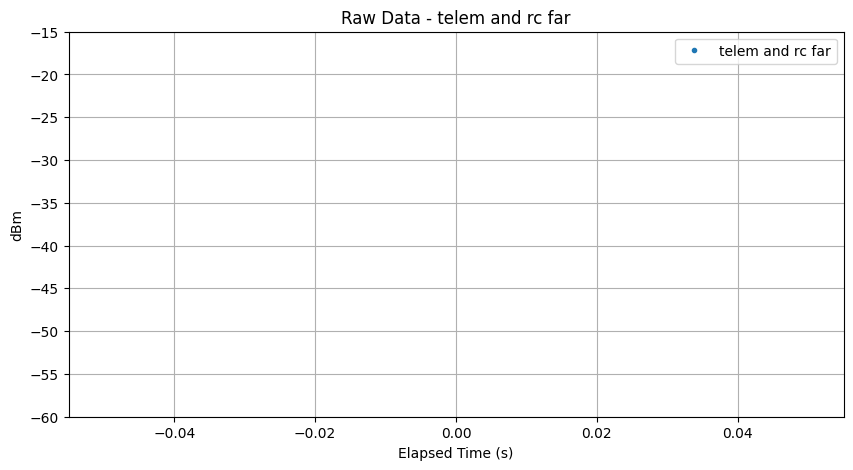

In [104]:
files=[
    "raw-data\\2025-03-29_16-33-08_telem-not-oneside-then-connect-laptop-finally-connect-mp-1m-raw.csv",
    "raw-data\\2025-03-31_12-48-50_telem-oneside-3m-90-antenna-90-raw.csv"
]
for file in files:

    df = pd.read_csv(file)

    # Select only data where "Second" == 90
    df_filtered = df[(df["Elapsed Time (s)"] >= 60) & (df["Elapsed Time (s)"] < 61)]

    df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

    # Plot the raw data
    plt.figure(figsize=(10, 5))
    # plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


    plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
    plt.title(f"Raw Data - {"telem and rc far"}")
    plt.xlabel("Elapsed Time (s)")
    plt.ylabel("dBm")
    plt.ylim(-60, -15)  
    plt.grid(True)
    plt.legend()


    plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3569666353.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


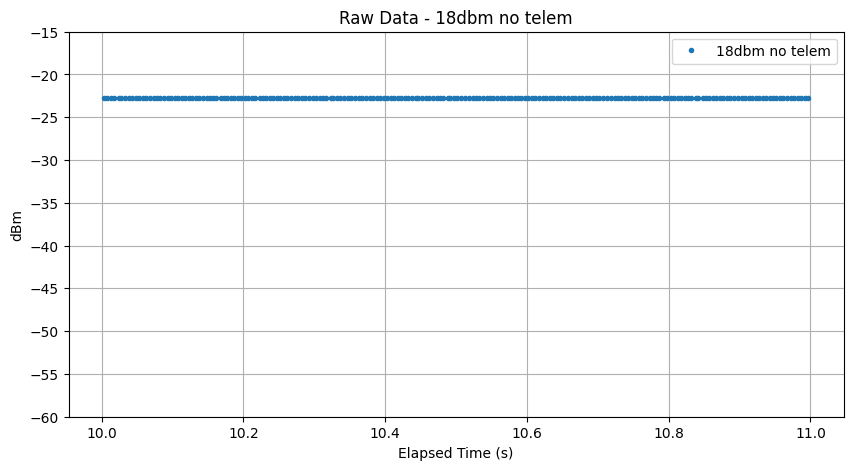

In [105]:
df = pd.read_csv("raw-data\\2025-03-29_17-46-31_antenna-00-18dbm-942.5hz-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm no telem", linewidth=0.5)
plt.title(f"Raw Data - {"18dbm no telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


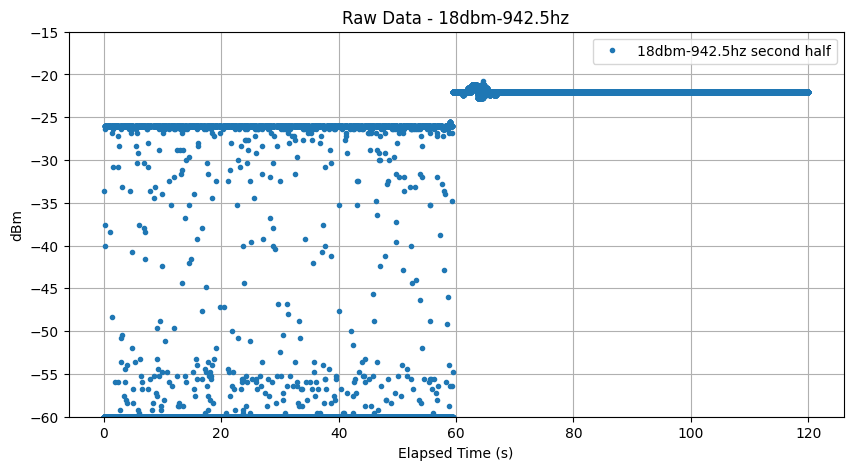

In [106]:
df = pd.read_csv("raw-data\\2025-03-29_17-42-46_telem-oneside-3m-90-antenna-00-second-half-18dbm-942.5hz-raw.csv")

# Select only data where "Second" == 90
df_filtered = df#[(df["Elapsed Time (s)"] >=100) & (df["Elapsed Time (s)"] < 101)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="18dbm-942.5hz second half", linewidth=0.5)
plt.title(f"Raw Data - {"18dbm-942.5hz"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\1313264818.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


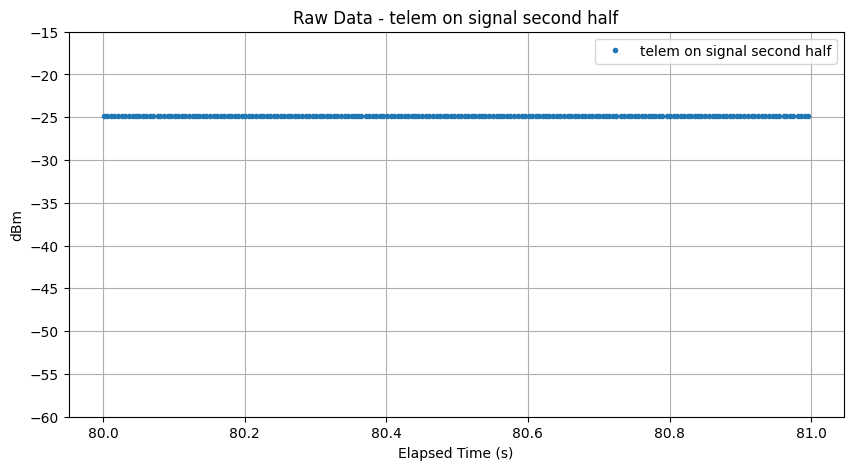

In [107]:
df = pd.read_csv("raw-data\\2025-03-29_17-39-16_telem-oneside-3m-90-antenna-00-second-half-15dbm-942.5hz-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >=80) & (df["Elapsed Time (s)"] < 81)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem on signal second half", linewidth=0.5)
plt.title(f"Raw Data - {"telem on signal second half"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()

nog geen verklaring kunnen vinden waarom die shift er is. De shift is er zowel als temeetry alleen is, als ook als er 2 telemetry radios met elkaar verbonden zijn, zie mss eens met opstart effect of dat dat er iets mee te maken heeft.

eens kijken naar background

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\1980398165.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


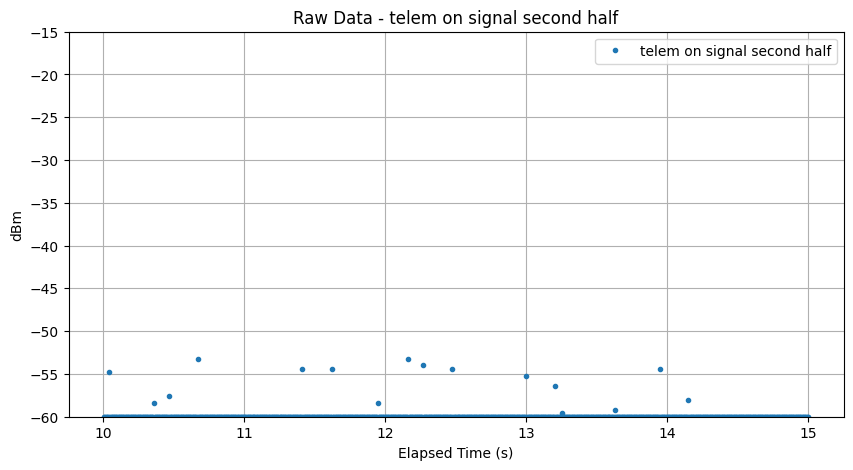

In [108]:
df = pd.read_csv("raw-data\\2025-03-05_17-19-04_background-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >=10) & (df["Elapsed Time (s)"] < 15)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem on signal second half", linewidth=0.5)
plt.title(f"Raw Data - {"telem on signal second half"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


0dbm source

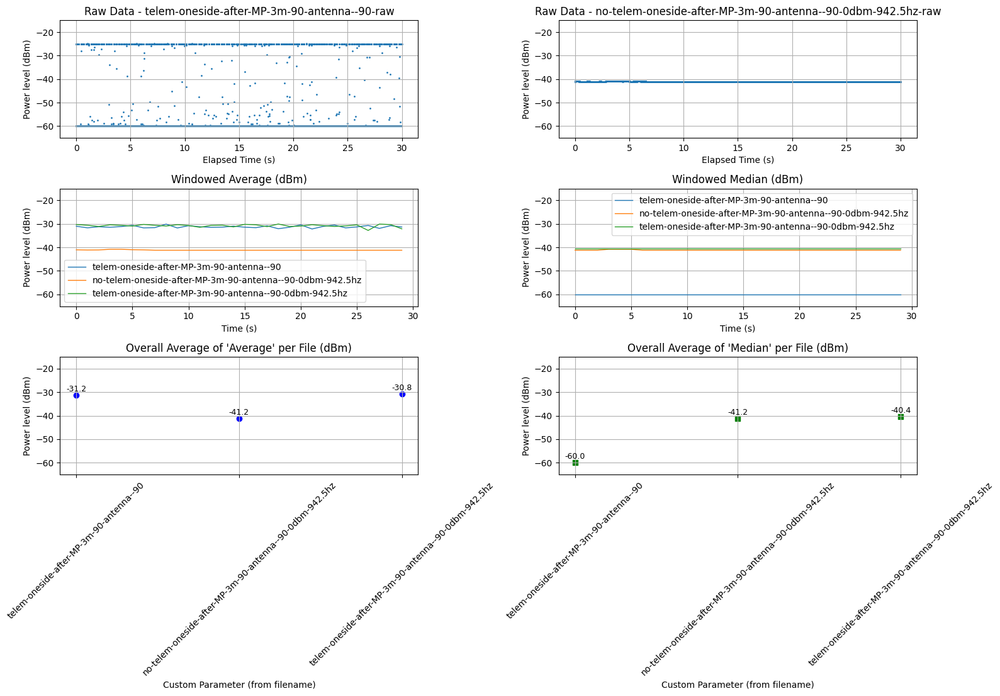

In [109]:

# Raw data files
raw_files = [
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-04-01_18-15-18_no-telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv"
]

# Processed data files
processed_files = [
    # "processed-data\\2025-03-05_17-19-04_background.csv",
    "processed-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90.csv",
    "processed-data\\2025-04-01_18-15-18_no-telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz.csv",
    "processed-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz.csv"

]
make_plot(raw_files,processed_files)



    Elapsed Time (s)  Value   dBm
0              0.000   1.51 -40.4
1              0.000   1.51 -40.4
2              0.000   1.51 -40.4
3              0.000   1.51 -40.4
4              0.000   1.51 -40.4
5              0.000   1.51 -40.4
6              0.000   1.51 -40.4
7              0.000   1.51 -40.4
8              0.000   1.51 -40.4
9              0.000   1.51 -40.4
10             0.000   1.51 -40.4
11             0.000   1.51 -40.4
12             0.015   1.51 -40.4
13             0.015   1.51 -40.4
14             0.016   1.51 -40.4
15             0.017   1.51 -40.4
16             0.017   1.51 -40.4
17             0.017   1.51 -40.4
18             0.018   1.51 -40.4
19             0.018   1.51 -40.4
20             0.019   1.51 -40.4
21             0.019   1.51 -40.4
22             0.020   1.51 -40.4
23             0.022   1.51 -40.4
24             0.030   1.19 -27.6
25             0.035   1.12 -24.8
26             0.040   1.12 -24.8
27             0.042   1.13 -25.2
28            

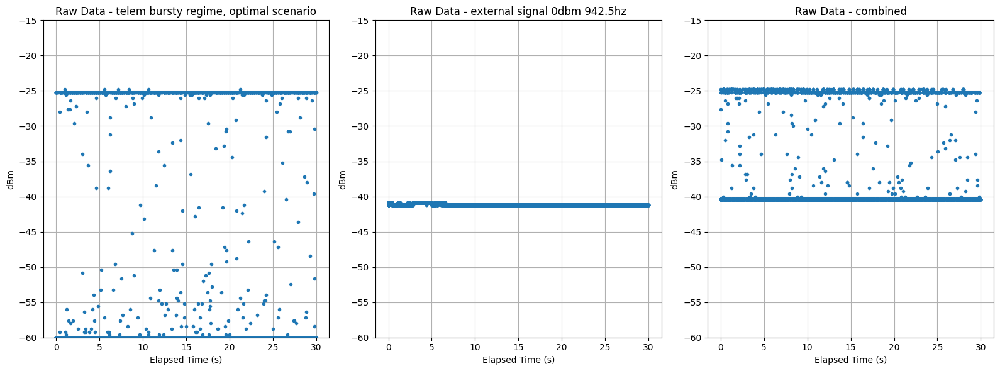

In [110]:
raw_files = [
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-04-01_18-15-18_no-telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv",
    "raw-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv"
]
titles=["telem bursty regime, optimal scenario","external signal 0dbm 942.5hz","combined"]

# Create subplots
fig, axes = plt.subplots(1, 3, figsize=(16, 6))  # Reduced height to fit single row
# fig.suptitle("Sensor Data Comparison", fontsize=16)

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]
    custom_param=titles[i]
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        if(i==2):
            print(df.head(50))
        axes[i].plot(df["Elapsed Time (s)"], df["dBm"], ".", label=custom_param, linewidth=0.5)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  # Fixed limit
        axes[i].grid(True)
        # axes[i].legend()

# Adjust layout
plt.tight_layout()
plt.show()

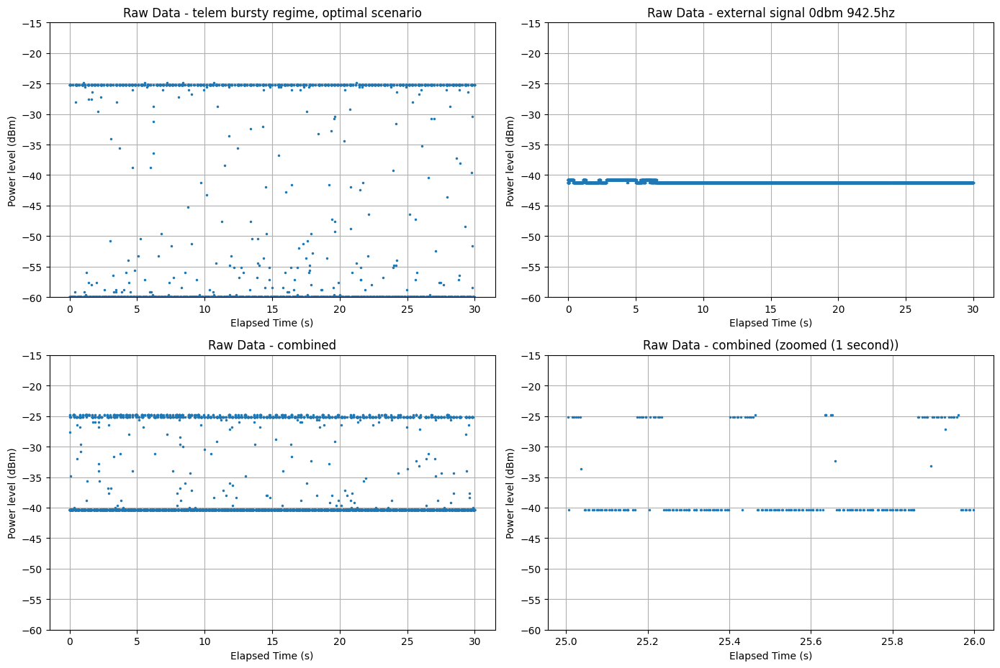

In [111]:

raw_files = [
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-04-01_18-15-18_no-telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv",
    "raw-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv"
]
titles = ["telem bursty regime, optimal scenario", "external signal 0dbm 942.5hz", "combined"]

# Create a 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(14, 10)) # Adjusted figsize for 2x2
# fig.suptitle("Sensor Data Comparison", fontsize=16) # Optional overall title

# Flatten the axes array for easier iteration if needed, or use 2D indexing
axes = axes.ravel() # Makes axes a 1D array [ax1, ax2, ax3, ax4]

# --- Process and plot the first three files ---
df_combined = None # Variable to store the combined dataframe for the zoom plot

for i, file in enumerate(raw_files):
    try:
        df = pd.read_csv(file)
    except FileNotFoundError:
        print(f"Warning: File not found {file}. Skipping.")
        axes[i].set_title(f"{titles[i]}\n(File Not Found)")
        axes[i].text(0.5, 0.5, 'Data Not Available', horizontalalignment='center', verticalalignment='center', transform=axes[i].transAxes)
        continue # Skip to the next file

    custom_param = titles[i]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)

        # Store the dataframe for the 'combined' plot to use later for zooming
        if i == 2:
            df_combined = df.copy() # Make a copy to avoid modifying it later unintentionally

        # --- Plotting ---
        ax = axes[i] # Select the correct subplot axis
        ax.plot(df["Elapsed Time (s)"], df["dBm"], ".", markersize=3) # Smaller markers might look better
        ax.set_title(f"Raw Data - {custom_param}")
        ax.set_xlabel("Elapsed Time (s)")
        ax.set_ylabel("Power level (dBm)")
        ax.set_ylim(-60, -15)  # Fixed limit
        ax.grid(True)
        # ax.legend() # Legends can clutter multi-plots, titles are usually enough
    else:
        print(f"Warning: Required columns not found in {file}. Skipping plot.")
        axes[i].set_title(f"{titles[i]}\n(Missing Columns)")
        axes[i].text(0.5, 0.5, 'Data Invalid', horizontalalignment='center', verticalalignment='center', transform=axes[i].transAxes)


# --- Create the fourth (zoomed) plot ---
ax_zoom = axes[3] # The fourth subplot axis

if df_combined is not None:
    # Filter the combined data for the time window 25s to 26s
    df_filtered = df_combined[(df_combined["Elapsed Time (s)"] >= 25) & (df_combined["Elapsed Time (s)"] < 26)].copy()

    if not df_filtered.empty:
        ax_zoom.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", markersize=3)
        ax_zoom.set_title("Raw Data - combined (zoomed (1 second))")
        ax_zoom.set_xlabel("Elapsed Time (s)")
        ax_zoom.set_ylabel("Power level (dBm)")
        ax_zoom.set_ylim(-60, -15) # Keep the same Y limits for comparison
        ax_zoom.grid(True)
    else:
        ax_zoom.set_title("Raw Data - combined (zoomed (1 second))")
        ax_zoom.text(0.5, 0.5, 'No data in this time window', horizontalalignment='center', verticalalignment='center', transform=ax_zoom.transAxes)
        ax_zoom.set_xlabel("Elapsed Time (s)")
        ax_zoom.set_ylabel("Power level (dBm)")
        ax_zoom.set_ylim(-60, -15)
        ax_zoom.grid(True)

else:
    # Handle case where the combined data file wasn't loaded successfully
    ax_zoom.set_title("Raw Data - combined (1 second)")
    ax_zoom.text(0.5, 0.5, 'Combined Data Unavailable', horizontalalignment='center', verticalalignment='center', transform=ax_zoom.transAxes)
    ax_zoom.set_xlabel("Elapsed Time (s)")
    ax_zoom.set_ylabel("Power level (dBm)")
    ax_zoom.set_ylim(-60, -15)
    ax_zoom.grid(True)


# Adjust layout to prevent overlapping titles/labels
plt.tight_layout(rect=[0, 0.03, 1, 0.97]) # Add rect to adjust for potential suptitle
plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\790279012.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


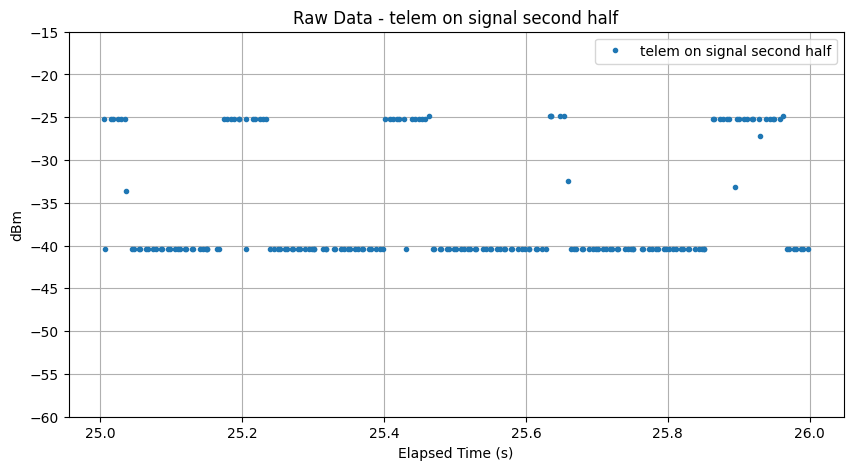

In [112]:
df = pd.read_csv("raw-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >=25) & (df["Elapsed Time (s)"] < 26)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem on signal second half", linewidth=0.5)
plt.title(f"Raw Data - {"telem on signal second half"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


shielding

Processing: 2025-03-29_11-45-52_so773mhz-18dbm.csv
Processing: 2025-03-29_12-17-02_so773mhz-15dbm.csv
Processing: 2025-03-29_12-34-24_so942.5mhz-18dbm.csv
Processing: 2025-03-29_12-45-44_so942.5mhz-15dbm.csv
Processing: 2025-03-29_12-52-44_so1842.5mhz-18dbm.csv
Processing: 2025-03-29_13-09-40_so1842.5mhz-15dbm.csv
Processing: 2025-03-29_13-16-46_so2140mhz-18dbm.csv
Processing: 2025-03-29_13-42-10_so2140mhz-15dbm.csv
Processing: 2025-03-29_13-48-49_so3600mhz-18dbm.csv
Processing: 2025-03-29_14-15-43_so3600mhz-15dbm.csv
Processing: 2025-03-29_14-31-01_1842.5mhz-15dbm.csv
Processing: 2025-03-29_14-49-49_1842.5mhz-18dbm.csv
Processing: 2025-03-29_14-59-21_773mhz-18dbm.csv
Processing: 2025-03-29_15-07-47_773mhz-15dbm.csv
Processing: 2025-03-29_15-15-41_942.5mhz-18dbm.csv
Processing: 2025-03-29_15-23-47_942.5mhz-15dbm.csv
Processing: 2025-03-29_15-35-43_2140mhz-18dbm.csv
Processing: 2025-03-29_15-42-41_2140mhz-15dbm.csv
Processing: 2025-03-29_16-02-31_3600mhz-18dbm.csv
Processing: 2025-03-29

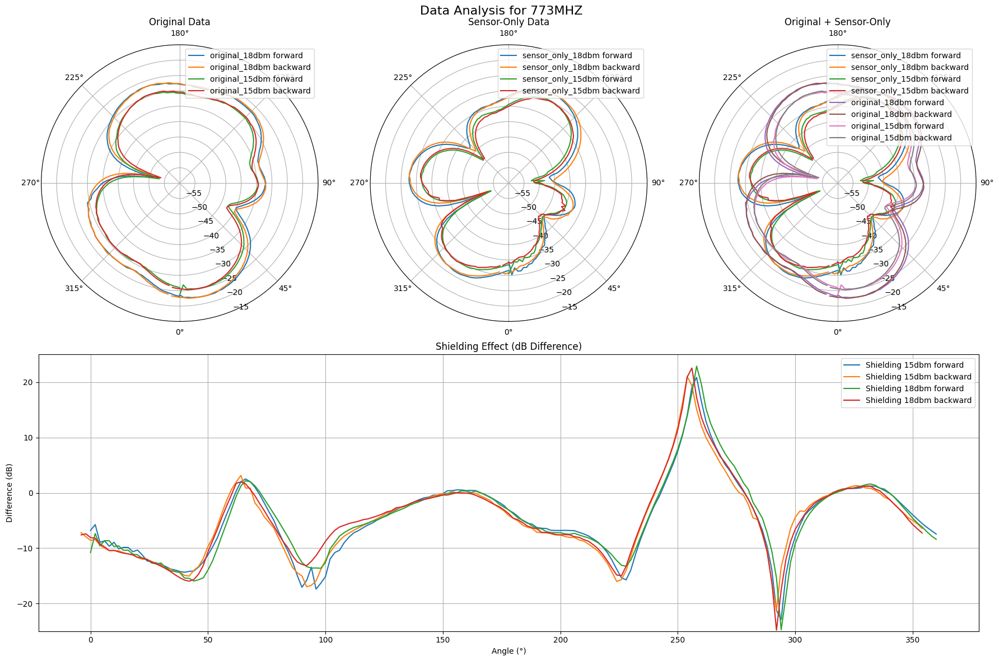

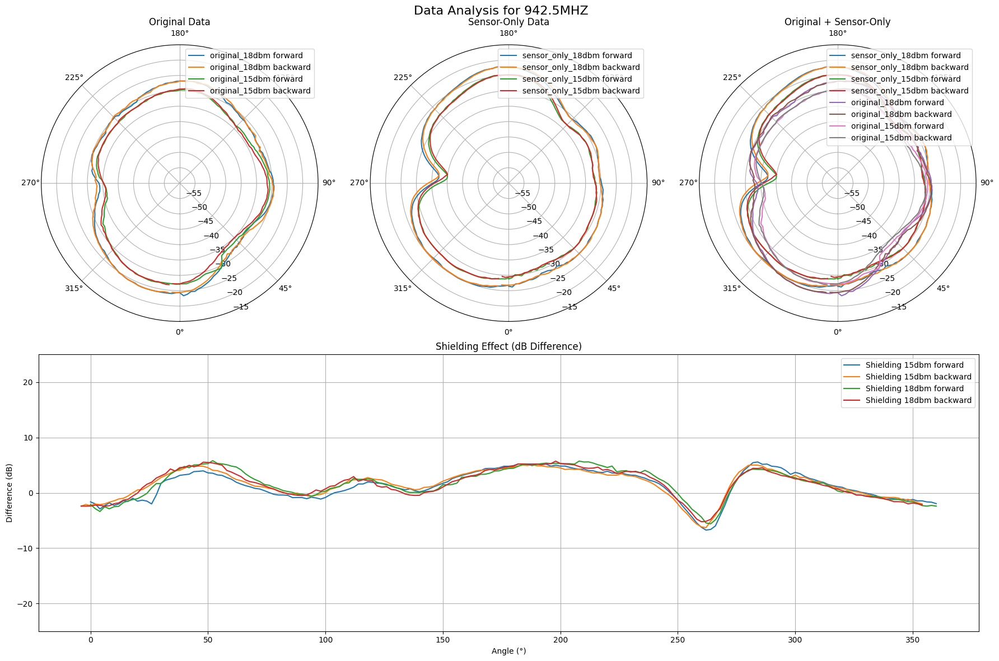

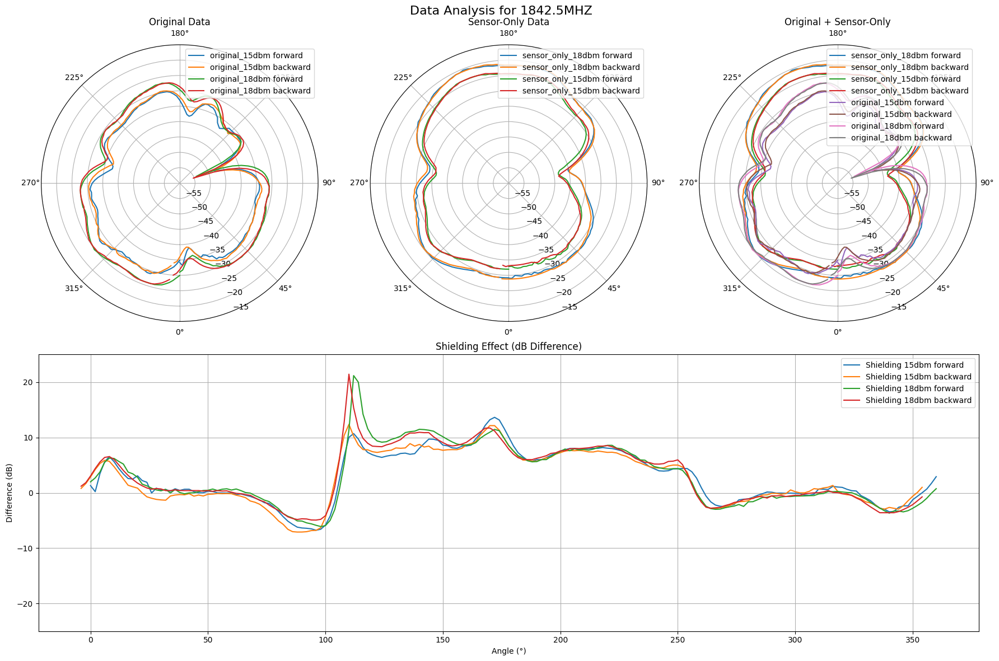

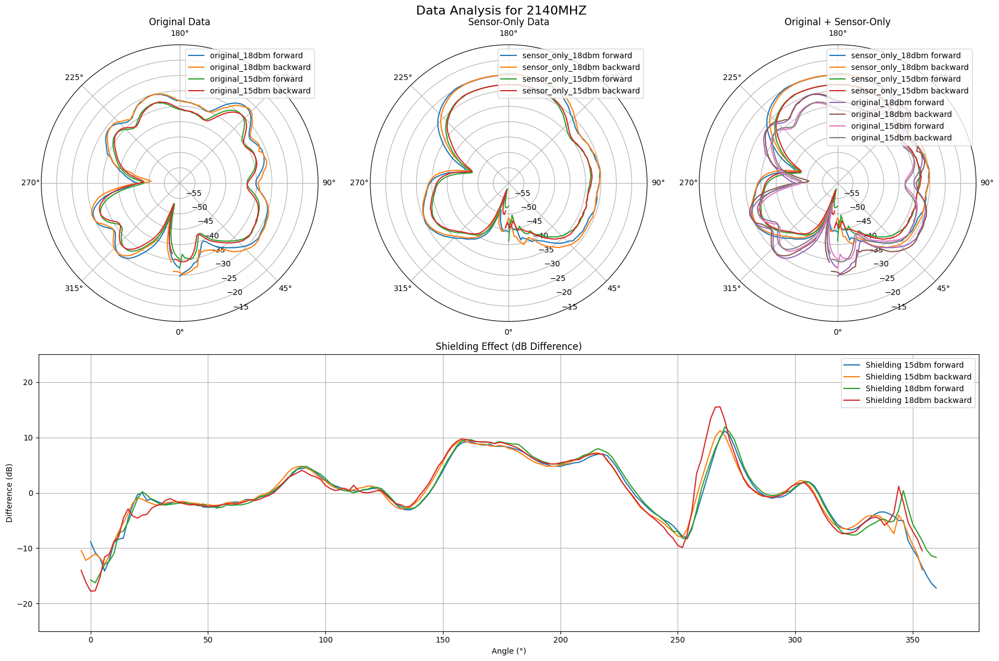

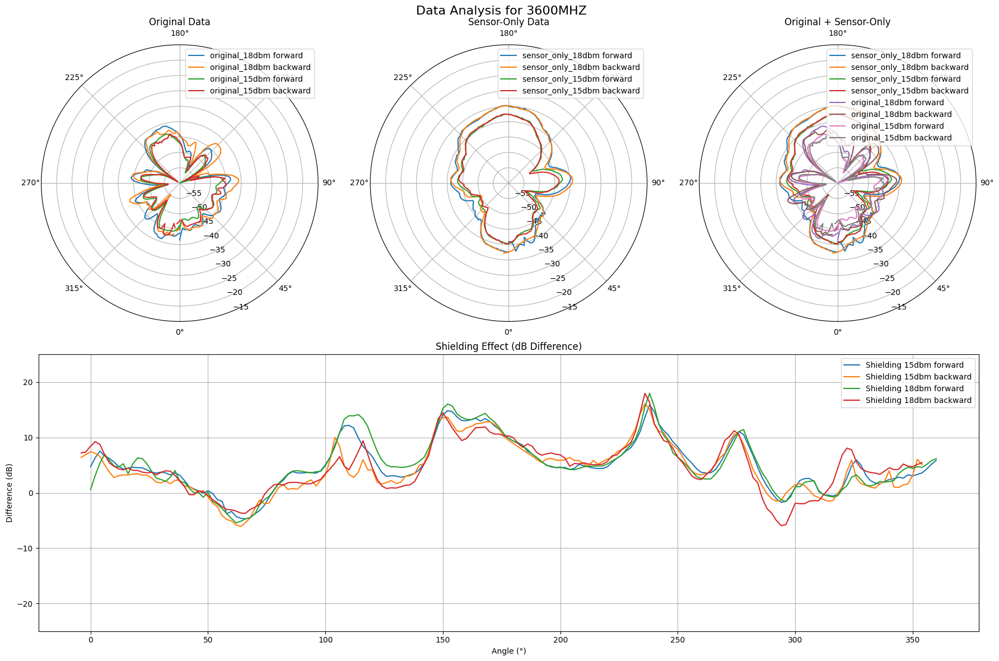

In [113]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Define the folder where CSV files are stored
csv_folder = "draaitafel-processed-data"

# Find all CSV files in the folder
csv_files = glob.glob(os.path.join(csv_folder, "*.csv"))

# Dictionary to store processed data grouped by frequency
data_dict = {}

# Read each CSV file and process the data
for file in csv_files:
    try:
        filename = os.path.basename(file)
        print(f"Processing: {filename}")

        parts = filename.split("_")
        if len(parts) < 3:
            print(f"Skipping {file}: Incorrect filename format")
            continue
        
        freq_dbm = parts[-1].replace(".csv", "")  
        frequency, source_dbm = freq_dbm.split("-")
        is_sensor_only = "so" in frequency
        if is_sensor_only:
            frequency = frequency[2:]

        df = pd.read_csv(file)

        required_columns = {"Second", "Average"}
        if required_columns.issubset(df.columns):
            df["Angle (°)"] = df["Second"] * 2
            
            df_forward = df[df["Second"] <= 180].copy()
            df_backward = df[df["Second"] > 181].copy()
            df_backward.loc[:, "Angle (°)"] = 720 - df_backward["Angle (°)"] - 2
            
            df_forward.loc[:, "Angle (rad)"] = np.radians(df_forward["Angle (°)"])
            df_backward.loc[:, "Angle (rad)"] = np.radians(df_backward["Angle (°)"])

            if frequency not in data_dict:
                data_dict[frequency] = {}

            key = f"{'sensor_only' if is_sensor_only else 'original'}_{source_dbm}"
            data_dict[frequency][key] = {
                "forward": df_forward,
                "backward": df_backward
            }
        
        else:
            print(f"Skipping {file}: Incorrect columns detected")

    except Exception as e:
        print(f"Error processing {file}: {e}")

if not data_dict:
    print("No valid CSV files found.")
    exit()

# Generate plots for each frequency
for frequency, dbm_data in data_dict.items():
    fig = plt.figure(figsize=(18, 12))
    gs = fig.add_gridspec(2, 3)  # Define a 2-row, 3-column grid

    # First row: Three separate polar plots
    axes = []
    for i in range(3):
        ax = fig.add_subplot(gs[0, i], projection='polar')  # Polar projection for top row
        axes.append(ax)

    # Second row: One wide Cartesian plot spanning all 3 columns
    ax_cartesian = fig.add_subplot(gs[1, :])  # Spans all columns

    fig.suptitle(f"Data Analysis for {frequency.upper()}", fontsize=16)

    # First plot: Original Data
    for key, df_dict in dbm_data.items():
        if "original" in key:
            for direction, df in df_dict.items():
                axes[0].plot(df["Angle (rad)"], df["Average"], label=f"{key} {direction}", linewidth=1.5)
    axes[0].set_title("Original Data")

    # Second plot: Sensor-Only Data
    for key, df_dict in dbm_data.items():
        if "sensor_only" in key:
            for direction, df in df_dict.items():
                axes[1].plot(df["Angle (rad)"], df["Average"], label=f"{key} {direction}", linewidth=1.5)
    axes[1].set_title("Sensor-Only Data")

    # Third plot: Original + Sensor-Only
    for key, df_dict in dbm_data.items():
        for direction, df in df_dict.items():
            axes[2].plot(df["Angle (rad)"], df["Average"], label=f"{key} {direction}", linewidth=1.5)
    axes[2].set_title("Original + Sensor-Only")

    # Formatting for polar plots
    for ax in axes:
        ax.set_theta_zero_location("S")
        ax.set_theta_direction(1)
        ax.set_xticks(np.radians([0, 45, 90, 135, 180, 225, 270, 315]))
        ax.set_xticklabels(["0°", "45°", "90°", "135°", "180°", "225°", "270°", "315°"])
        ax.set_ylim([-60, -15])
        ax.legend(loc="upper right")

    # Bottom row: Shielding Effect (Cartesian Plot)
    for source_dbm in ["15dbm", "18dbm"]:
        if f"original_{source_dbm}" in dbm_data and f"sensor_only_{source_dbm}" in dbm_data:
            for direction in ["forward", "backward"]:
                df_orig = dbm_data[f"original_{source_dbm}"][direction]
                df_sensor = dbm_data[f"sensor_only_{source_dbm}"][direction]
                
                if len(df_orig) == len(df_sensor):
                    shielding_effect = df_sensor["Average"].values - df_orig["Average"].values
                    ax_cartesian.plot(df_orig["Angle (°)"], shielding_effect, label=f"Shielding {source_dbm} {direction}", linewidth=1.5)
    
    ax_cartesian.set_title("Shielding Effect (dB Difference)")
    ax_cartesian.set_xlabel("Angle (°)")
    ax_cartesian.set_ylabel("Difference (dB)")
    ax_cartesian.set_ylim([-25,25])
    ax_cartesian.grid(True)
    ax_cartesian.legend()

    plt.tight_layout()
    plt.show()


bij frequenties 2140 en 1842.5 kunej effectief zien dat de versie met drone over algemeen amplitude verminderd. Als we kijken over de verschillende frequenties heen dan kun je zien dat er geen vast patroon is van shielding. mede omdat de antenne frequentie afhankelijk is. 

In [114]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

# Define the folder where CSV files are stored
csv_folder = "draaitafel-processed-data"

# Find all CSV files in the folder
csv_files = glob.glob(os.path.join(csv_folder, "*.csv"))

# Dictionary to store processed data grouped by frequency
data_dict = {}

# Read each CSV file and process the data
for file in csv_files:
    try:
        filename = os.path.basename(file)
        print(f"Processing: {filename}")

        parts = filename.split("_")
        if len(parts) < 3:
            print(f"Skipping {file}: Incorrect filename format")
            continue

        freq_dbm = parts[-1].replace(".csv", "")
        frequency, source_dbm = freq_dbm.split("-")
        is_sensor_only = "so" in frequency
        if is_sensor_only:
            frequency = frequency[2:] # Remove 'so' prefix

        df = pd.read_csv(file)

        required_columns = {"Second", "Average"}
        if required_columns.issubset(df.columns):
            # Calculate Angle from Second, assuming 2 degrees per second
            df["Angle (°)"] = df["Second"] * 2

            # Separate forward (0-360) and backward (360-0) sweeps
            # Adjust angle calculation for consistent 0-360 range
            df_forward = df[df["Second"] <= 180].copy() # 0 to 360 degrees

            # Backward sweep: map time > 181 back to 360 -> 0 degrees
            df_backward = df[df["Second"] > 180].copy() # Use > 180 to avoid overlap if exactly 180 exists
            # Example: Second=181 -> Angle=362 -> Mapped=(720-362) = 358
            # Example: Second=360 -> Angle=720 -> Mapped=(720-720) = 0
            # Corrected mapping: Should map 181 seconds (362 deg) close to 360, and 360 seconds (720 deg) close to 0.
            # The original mapping was slightly off: 720 - (Second * 2) - 2
            # Let's try: 360 - ( (Second - 180) * 2 ) -> simplifies to 720 - Second * 2
            # Test: Second=181 -> 720 - 362 = 358
            # Test: Second=360 -> 720 - 720 = 0
            df_backward.loc[:, "Angle (°)"] = 720 - df_backward["Angle (°)"]

            # Ensure angles are within 0-360 strictly for cleaner plotting if needed
            # df_forward.loc[:, "Angle (°)"] = df_forward["Angle (°)"] % 360 # Should already be 0-360
            # df_backward.loc[:, "Angle (°)"] = df_backward["Angle (°)"] % 360 # Should handle the 0 case correctly

            # Convert to radians for polar plots
            df_forward.loc[:, "Angle (rad)"] = np.radians(df_forward["Angle (°)"])
            df_backward.loc[:, "Angle (rad)"] = np.radians(df_backward["Angle (°)"])

            # --- Store data ---
            if frequency not in data_dict:
                data_dict[frequency] = {}

            key = f"{'sensor_only' if is_sensor_only else 'original'}_{source_dbm}"
            # Store both forward and backward dataframes
            data_dict[frequency][key] = {
                "forward": df_forward,
                "backward": df_backward
            }
            print(f"  Stored data for {frequency} - {key}") # Debug print

        else:
            print(f"Skipping {file}: Missing required columns ('Second', 'Average')")

    except Exception as e:
        print(f"Error processing {file}: {e}")

# --- Check if any data was loaded ---
if not data_dict:
    print("No valid CSV files processed successfully. Exiting.")
    exit()
else:
    print("\n--- Data Loading Summary ---")
    for freq, dbm_datasets in data_dict.items():
        print(f"Frequency: {freq}")
        for key in dbm_datasets.keys():
            print(f"  - {key}")
    print("--------------------------\n")


# --- Generate plots and find shielding angles ---
shielding_angles_dict = {} # Dictionary to store shielding angles

for frequency, dbm_data in data_dict.items():
    print(f"\n--- Processing Frequency: {frequency.upper()} ---")





    # --- Bottom row: Shielding Effect (Cartesian Plot) & Angle Extraction ---
    has_shielding_data = False
    if frequency not in shielding_angles_dict:
        shielding_angles_dict[frequency] = {}

    # Identify unique source_dbm values present for this frequency
    unique_source_dbms = set(key.split('_')[-1] for key in dbm_data.keys())

    for source_dbm in sorted(list(unique_source_dbms)): # Iterate through available dBm levels
        orig_key = f"original_{source_dbm}"
        sensor_key = f"sensor_only_{source_dbm}"

        # Check if both original and sensor_only data exist for this dbm level
        if orig_key in dbm_data and sensor_key in dbm_data:
            print(f"  Calculating shielding for {source_dbm}")

            for direction in ["forward", "backward"]:
                # Ensure data exists for the specific direction for both keys
                if direction in dbm_data[orig_key] and direction in dbm_data[sensor_key]:
                    df_orig = dbm_data[orig_key][direction]
                    df_sensor = dbm_data[sensor_key][direction]

                    # Crucial step: Align data based on Angle before comparing
                    # Use merge to ensure comparison happens at the same angle
                    merged_df = pd.merge(
                        df_orig[['Angle (°)', 'Average']],
                        df_sensor[['Angle (°)', 'Average']],
                        on='Angle (°)',
                        suffixes=('_orig', '_sensor'),
                        how='inner' # Only compare angles present in both datasets
                    )

                    if not merged_df.empty:
                        # Calculate shielding effect
                        shielding_effect = merged_df["Average_sensor"] - merged_df["Average_orig"]

                        # Plot the shielding effect
                        ax_cartesian.plot(merged_df["Angle (°)"], shielding_effect, label=f"Shielding {source_dbm} {direction}", linewidth=1.5)
                        has_shielding_data = True

                        # --- Find and store angles where shielding occurs ---
                        # Shielding occurs where sensor reading is higher (difference > 0)
                        shielded_rows = merged_df[shielding_effect > 0]

                        if not shielded_rows.empty:
                            shielded_angles = shielded_rows["Angle (°)"].round(1).tolist() # Get angles, round for clarity
                            storage_key = f"{source_dbm}_{direction}"
                            shielding_angles_dict[frequency][storage_key] = shielded_angles
                            print(f"    Found {len(shielded_angles)} shielding angles for {storage_key}")
                        else:
                            print(f"    No shielding detected for {source_dbm}_{direction}")
                    else:
                         print(f"    Skipping {source_dbm} {direction}: No common angles after merging.")

                else:
                    print(f"    Skipping {source_dbm} {direction}: Missing data for original or sensor_only.")
        else:
             print(f"  Skipping shielding calculation for {source_dbm}: Missing original or sensor_only data.")



# --- Print the extracted shielding angles ---
print("\n\n--- Shielding Angle Summary ---")
if not shielding_angles_dict:
    print("No shielding angles were identified.")
else:
    for frequency, angle_data in shielding_angles_dict.items():
        print(f"\nFrequency: {frequency.upper()}")
        if not angle_data:
            print("  No shielding detected for this frequency.")
            continue
        for key, angles in sorted(angle_data.items()):
            if angles:
                # Format angles for better readability
                angle_str_parts = []
                angles.sort()
                if len(angles) > 10: # If too many angles, show ranges or just count
                   angle_str_parts.append(f"{len(angles)} angles between {min(angles):.1f}° and {max(angles):.1f}°")
                else:
                    angle_str_parts = [f"{a:.1f}°" for a in angles]
                print(f"  {key}: {', '.join(angle_str_parts)}")
            # Optional: Add an else here if you want to explicitly state when a combination had 0 angles
            # else:
            #    print(f"  {key}: No shielding detected")

Processing: 2025-03-29_11-45-52_so773mhz-18dbm.csv
  Stored data for 773mhz - sensor_only_18dbm
Processing: 2025-03-29_12-17-02_so773mhz-15dbm.csv
  Stored data for 773mhz - sensor_only_15dbm
Processing: 2025-03-29_12-34-24_so942.5mhz-18dbm.csv
  Stored data for 942.5mhz - sensor_only_18dbm
Processing: 2025-03-29_12-45-44_so942.5mhz-15dbm.csv
  Stored data for 942.5mhz - sensor_only_15dbm
Processing: 2025-03-29_12-52-44_so1842.5mhz-18dbm.csv
  Stored data for 1842.5mhz - sensor_only_18dbm
Processing: 2025-03-29_13-09-40_so1842.5mhz-15dbm.csv
  Stored data for 1842.5mhz - sensor_only_15dbm
Processing: 2025-03-29_13-16-46_so2140mhz-18dbm.csv
  Stored data for 2140mhz - sensor_only_18dbm
Processing: 2025-03-29_13-42-10_so2140mhz-15dbm.csv
  Stored data for 2140mhz - sensor_only_15dbm
Processing: 2025-03-29_13-48-49_so3600mhz-18dbm.csv
  Stored data for 3600mhz - sensor_only_18dbm
Processing: 2025-03-29_14-15-43_so3600mhz-15dbm.csv
  Stored data for 3600mhz - sensor_only_15dbm
Processing: 



--- Generating Shielding Visualization Plots ---
Creating visualization for frequency: 773MHZ


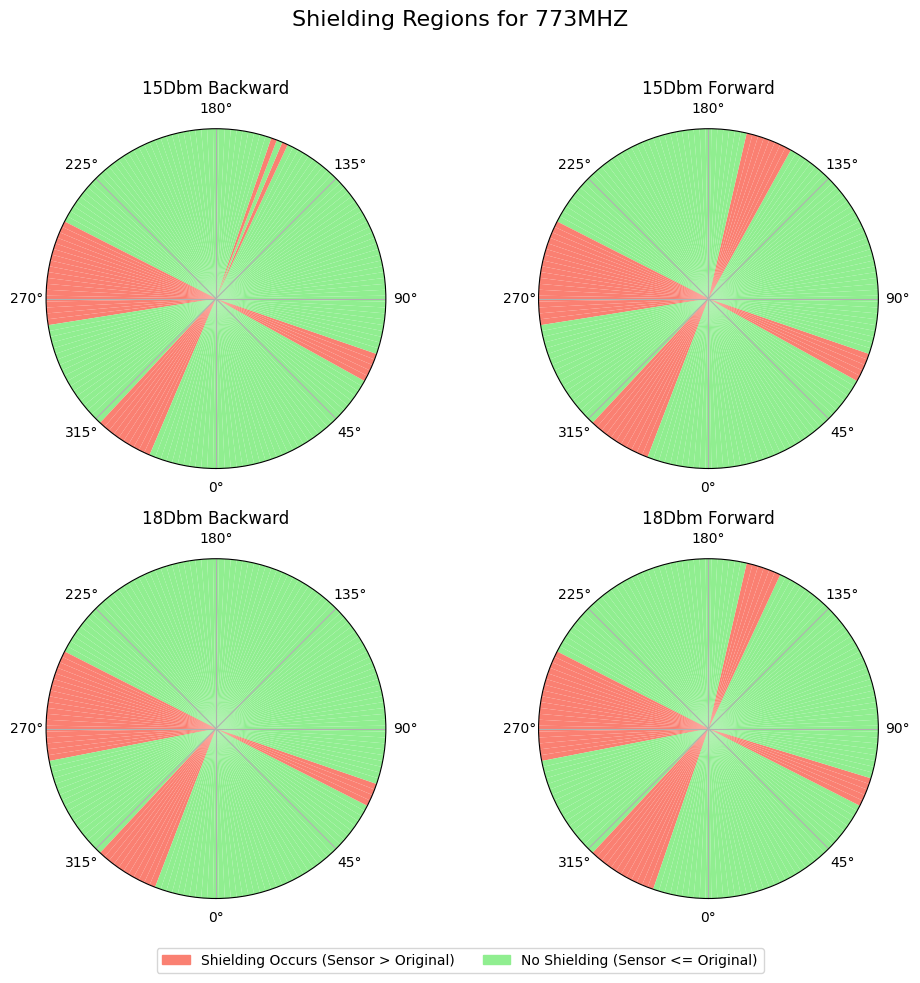

Creating visualization for frequency: 942.5MHZ


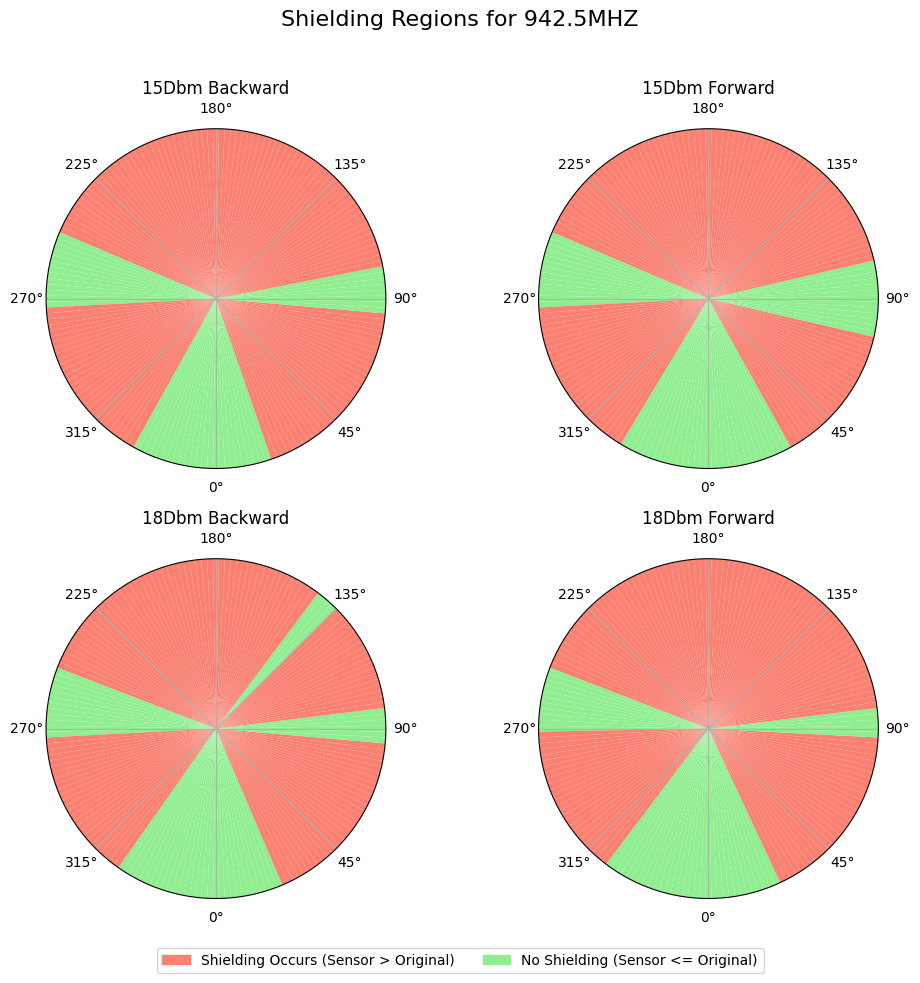

Creating visualization for frequency: 1842.5MHZ


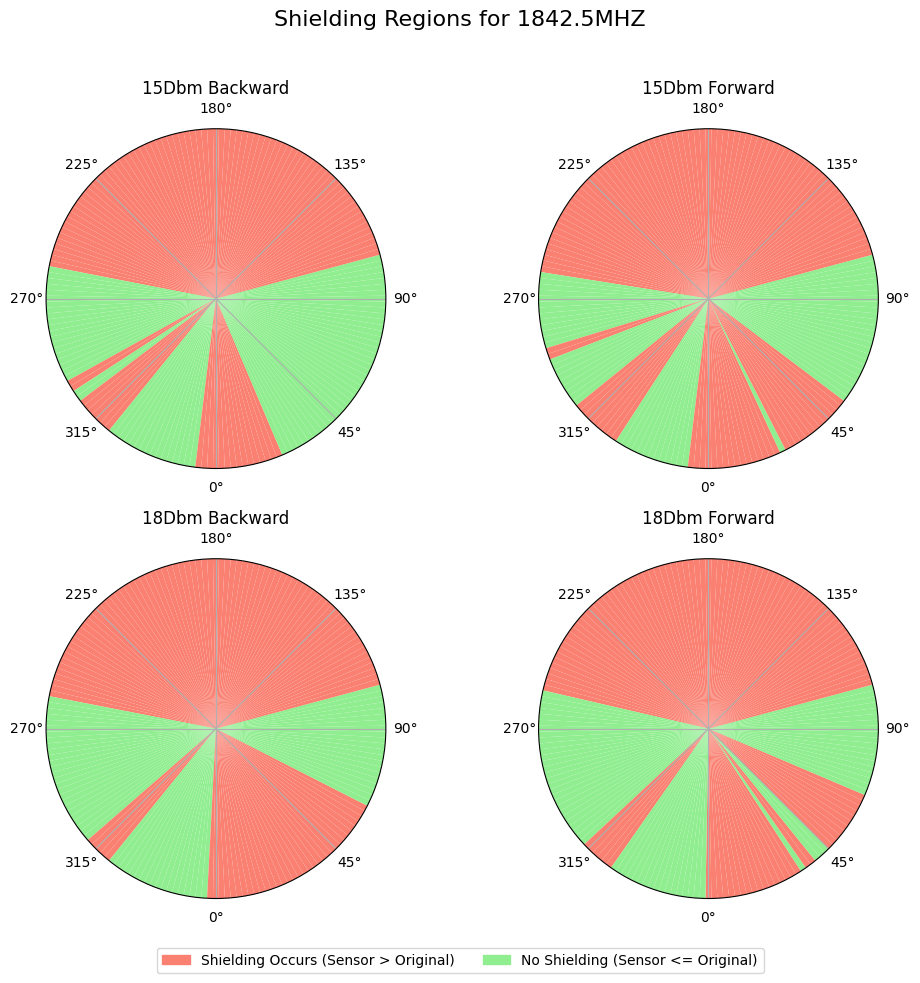

Creating visualization for frequency: 2140MHZ


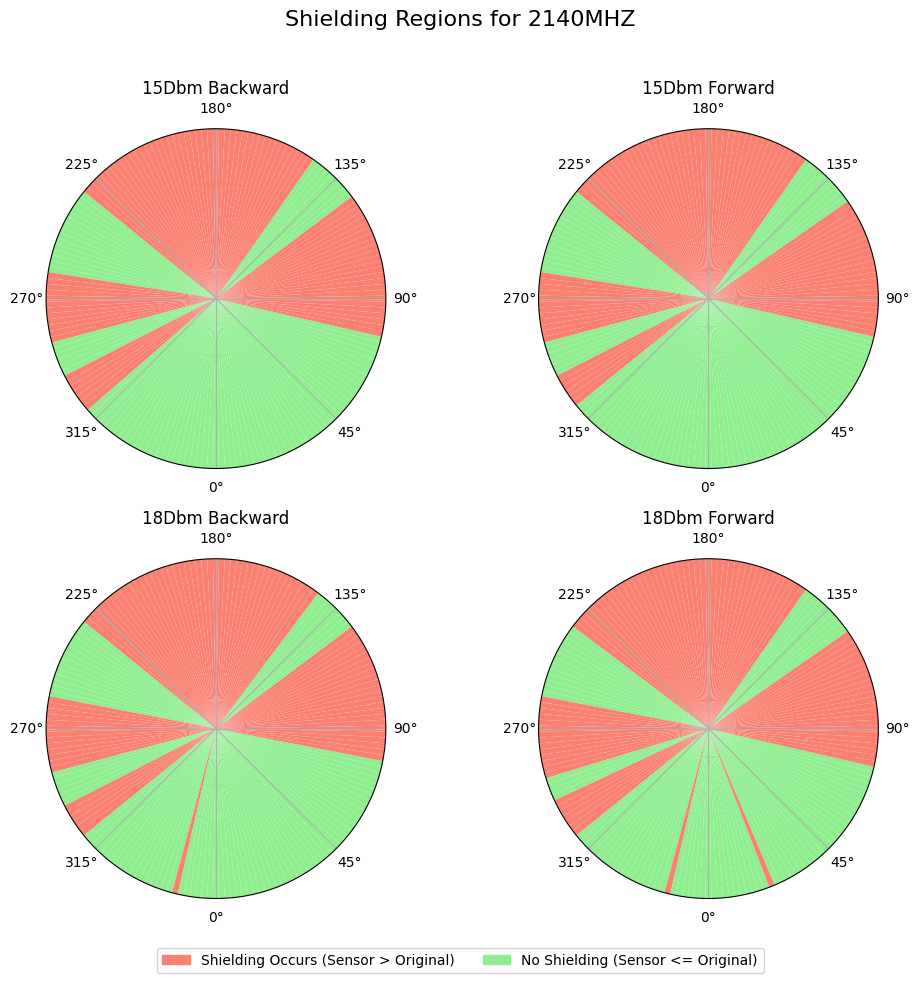

Creating visualization for frequency: 3600MHZ


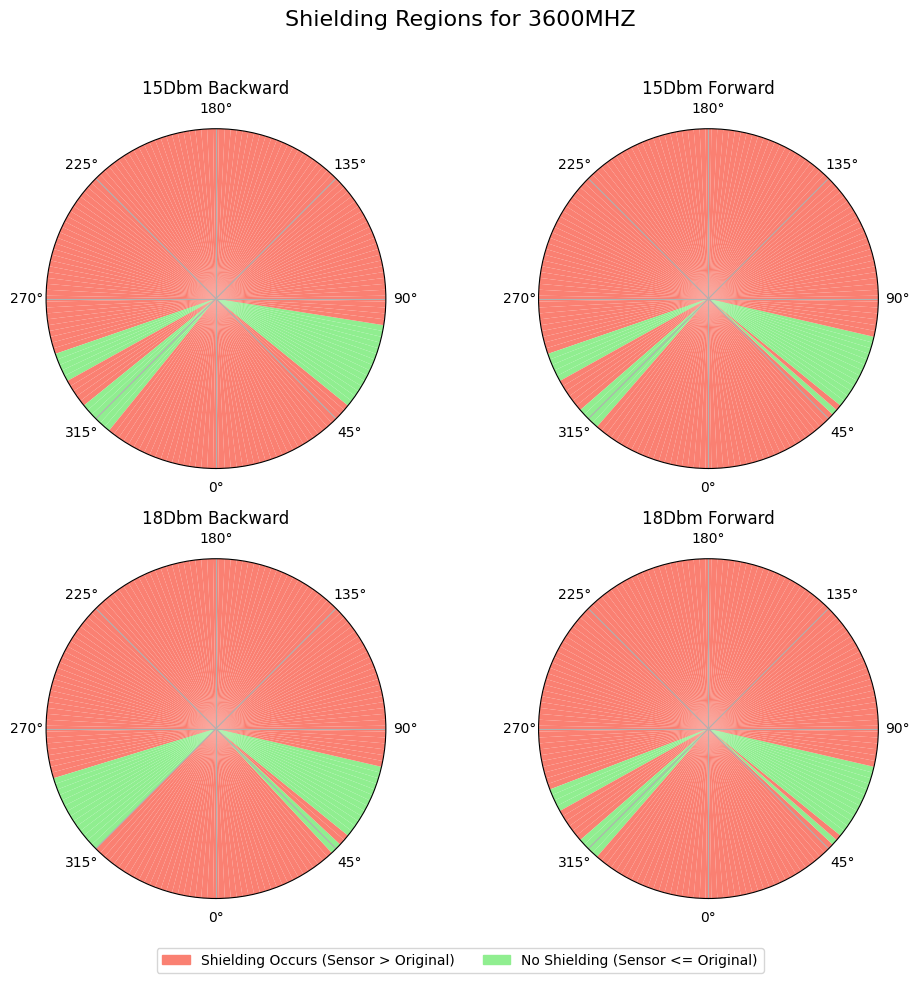

--- Shielding Visualization Complete ---


In [115]:
import math
import matplotlib.patches as mpatches # Needed for custom legend

# --- Generate Pie-Style Shielding Visualization Plots ---

print("\n\n--- Generating Shielding Visualization Plots ---")

# Define colors for the pie visualization
shielded_color = 'salmon'  # Color for angles WITH shielding (Sensor > Original)
non_shielded_color = 'lightgreen' # Color for angles WITHOUT shielding

# Assume a consistent angular resolution from your data (e.g., 2 degrees)
# If your 'Second' column doesn't always increment by 1, adjust this step.
angle_step = 2
all_angles_deg = np.arange(0, 360, angle_step)
all_angles_rad = np.radians(all_angles_deg)
bar_width = np.radians(angle_step) # Width of each 'wedge' in radians
bar_height = 1 # Fixed height for wedges to fill the plot radially

# Iterate through each frequency that has shielding data
for frequency, angle_data in shielding_angles_dict.items():
    if not angle_data: # Skip if no shielding data for this frequency
        print(f"Skipping visualization for {frequency.upper()}: No shielding data found.")
        continue

    print(f"Creating visualization for frequency: {frequency.upper()}")

    # Determine the number of subplots needed for this frequency
    plot_keys = sorted(angle_data.keys())
    n_plots = len(plot_keys)
    if n_plots == 0:
        continue

    # Calculate grid dimensions (prefer wider than tall)
    n_cols = math.ceil(math.sqrt(n_plots))
    n_rows = math.ceil(n_plots / n_cols)

    fig_pie, axes_pie = plt.subplots(
        n_rows, n_cols,
        figsize=(5 * n_cols, 5 * n_rows), # Adjust size as needed
        subplot_kw={'projection': 'polar'} # Create polar subplots
    )

    # Handle case where there's only one subplot (axes_pie is not an array)
    if n_plots == 1:
        axes_pie = np.array([axes_pie]) # Make it iterable

    # Flatten the axes array for easy iteration
    axes_pie = axes_pie.flatten()

    fig_pie.suptitle(f"Shielding Regions for {frequency.upper()}", fontsize=16)

    # Plot data for each combination (source_dbm + direction)
    for i, key in enumerate(plot_keys):
        ax = axes_pie[i]
        shielded_angles_list = angle_data[key]

        # Use a set for efficient checking of shielded angles
        # Round angles from the dict and the generated range to avoid float issues
        shielded_set = set(np.round(shielded_angles_list, 1))

        # Determine the color for each angle segment
        colors = []
        for angle_deg in all_angles_deg:
            if round(angle_deg, 1) in shielded_set:
                colors.append(shielded_color)
            else:
                colors.append(non_shielded_color)

        # Create the bars (wedges)
        # Use align='edge' if you want the bar to start AT the angle value
        # Use align='center' (default) if the angle value is the center of the bar
        ax.bar(
            all_angles_rad,    # Angular positions (centers)
            bar_height,        # Radial height (make it fill)
            width=bar_width,   # Angular width
            bottom=0,          # Start at the center
            color=colors,      # Color based on shielding
            edgecolor=colors,  # Make edge same color for solid look
            linewidth=0        # Remove bar edge lines for smoother look
            #align='edge' # Optional: see if 'edge' or 'center' looks better
        )

        # Configure the polar plot appearance
        ax.set_title(f"{key.replace('_', ' ').title()}")
        ax.set_theta_zero_location("S")  # 0 degrees at the bottom
        ax.set_theta_direction(1)       # Clockwise rotation
        ax.set_xticks(np.radians(np.arange(0, 360, 45))) # Ticks every 45 degrees
        ax.set_xticklabels([f"{deg}°" for deg in np.arange(0, 360, 45)])
        ax.set_yticks([]) # Hide radial ticks/labels, as height is arbitrary
        ax.set_rlim(0, bar_height) # Set radial limit to match bar height

    # --- Add a single legend for the figure ---
    shielded_patch = mpatches.Patch(color=shielded_color, label='Shielding Occurs (Sensor > Original)')
    non_shielded_patch = mpatches.Patch(color=non_shielded_color, label='No Shielding (Sensor <= Original)')
    fig_pie.legend(handles=[shielded_patch, non_shielded_patch], loc='lower center', ncol=2, bbox_to_anchor=(0.5, 0.01))

    # Hide any unused subplots
    for j in range(i + 1, len(axes_pie)):
        fig_pie.delaxes(axes_pie[j])

    plt.tight_layout(rect=[0, 0.05, 1, 0.96]) # Adjust layout for suptitle and legend
    plt.show()

print("--- Shielding Visualization Complete ---")

combine forward and backward angels



--- Generating COMBINED Shielding Visualization Plots ---
Creating combined visualization for frequency: 773MHZ


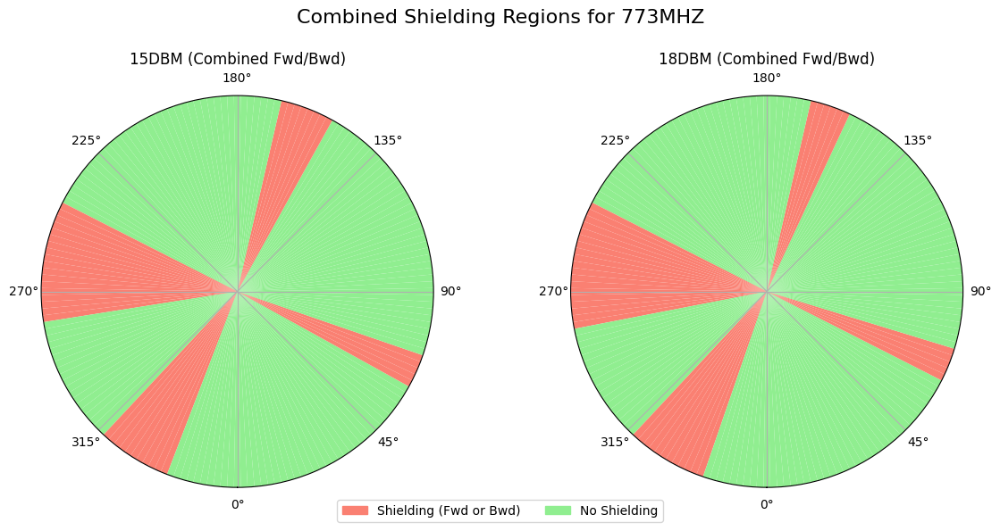

Creating combined visualization for frequency: 942.5MHZ


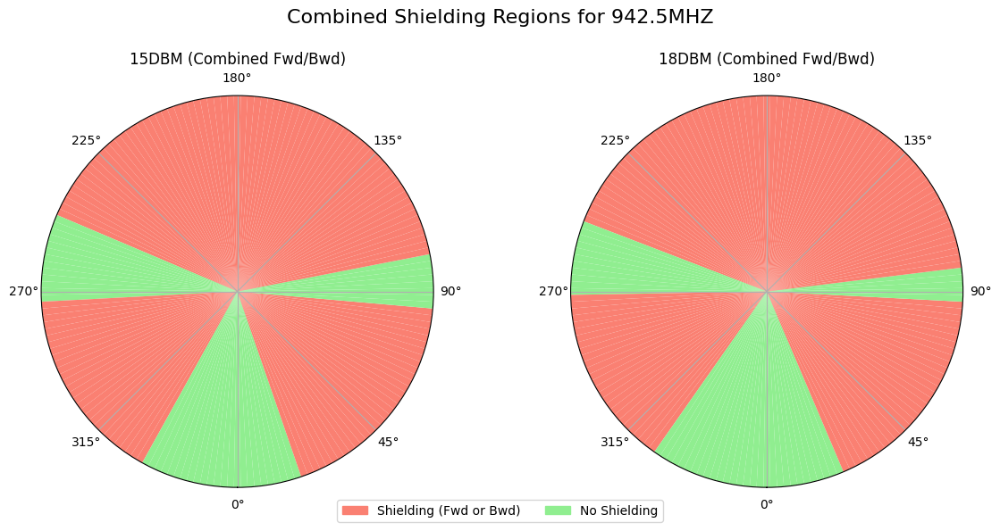

Creating combined visualization for frequency: 1842.5MHZ


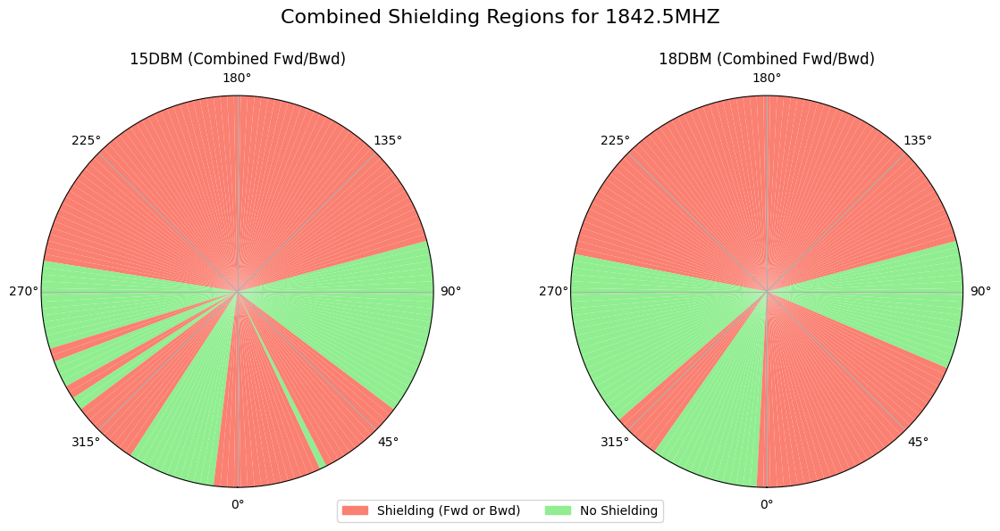

Creating combined visualization for frequency: 2140MHZ


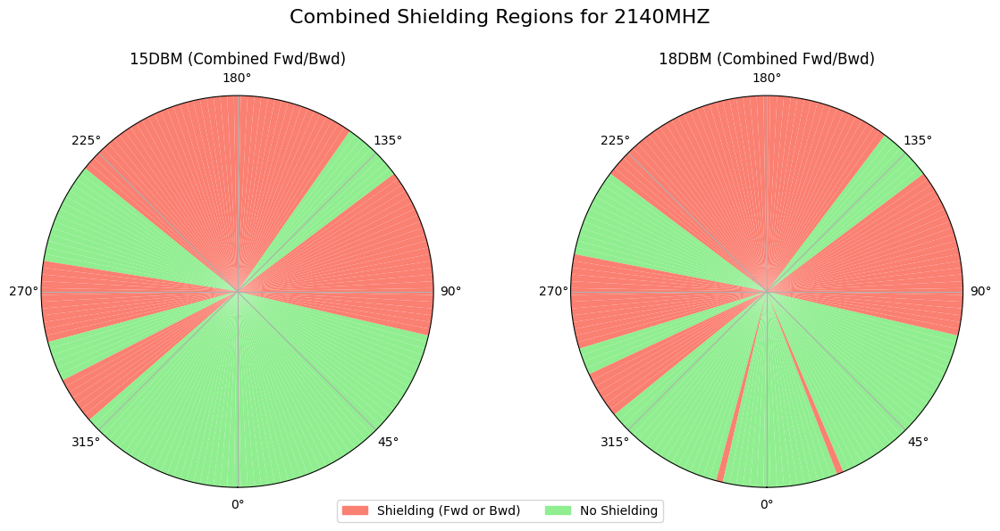

Creating combined visualization for frequency: 3600MHZ


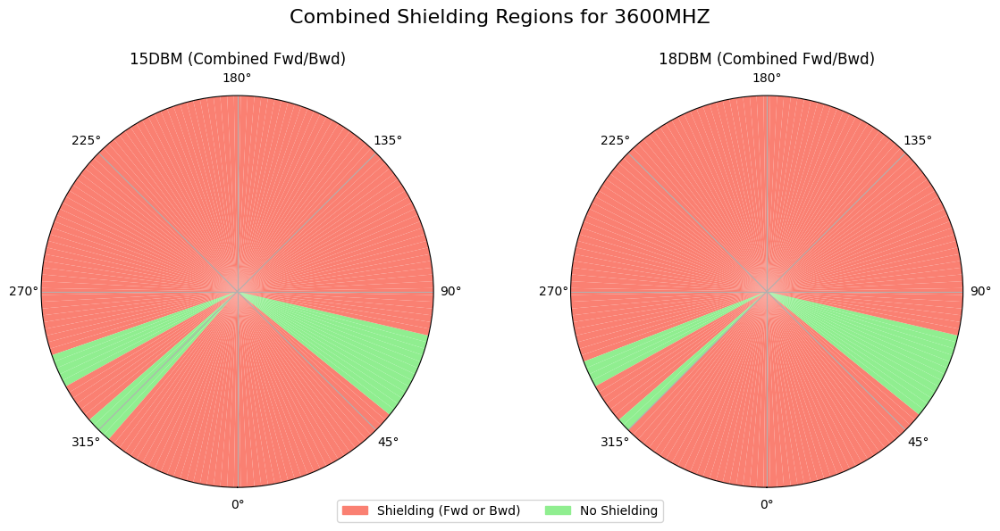

--- Combined Shielding Visualization Complete ---


In [116]:
import math
import matplotlib.patches as mpatches # Needed for custom legend
import numpy as np # Ensure numpy is imported if not already

# --- Generate COMBINED Pie-Style Shielding Visualization Plots ---

print("\n\n--- Generating COMBINED Shielding Visualization Plots ---")

# Define colors for the pie visualization
shielded_color = 'salmon'  # Color for angles WITH shielding (Sensor > Original)
non_shielded_color = 'lightgreen' # Color for angles WITHOUT shielding

# Assume a consistent angular resolution from your data (e.g., 2 degrees)
# If your 'Second' column doesn't always increment by 1, adjust this step.
angle_step = 2 # Degrees per step
# If data collection stops exactly at 360, use np.arange(0, 360, angle_step)
# If it might include 360, use np.arange(0, 360 + angle_step, angle_step)
# Let's stick to 0-358 for consistency with how arange works.
all_angles_deg = np.arange(0, 360, angle_step)
all_angles_rad = np.radians(all_angles_deg)
bar_width = np.radians(angle_step) # Width of each 'wedge' in radians
bar_height = 1 # Fixed height for wedges to fill the plot radially

# Iterate through each frequency that has shielding data
for frequency, angle_data in shielding_angles_dict.items():
    if not angle_data: # Skip if no shielding data for this frequency
        print(f"Skipping visualization for {frequency.upper()}: No shielding data found.")
        continue

    print(f"Creating combined visualization for frequency: {frequency.upper()}")

    # --- Identify unique source_dbm levels for this frequency ---
    unique_dbms = set()
    for key in angle_data.keys():
        # Extract the dbm part (e.g., '15dbm' from '15dbm_forward')
        parts = key.split('_')
        if len(parts) >= 1: # Check if key has at least one part
            unique_dbms.add(parts[0]) # Assumes format like '15dbm_forward' or '18dbm_backward'

    if not unique_dbms:
        print(f"  No valid source_dbm levels found for {frequency.upper()}. Skipping.")
        continue

    sorted_dbms = sorted(list(unique_dbms))
    n_plots = len(sorted_dbms)

    # Calculate grid dimensions (prefer wider than tall)
    n_cols = math.ceil(math.sqrt(n_plots))
    n_rows = math.ceil(n_plots / n_cols)

    fig_pie, axes_pie = plt.subplots(
        n_rows, n_cols,
        figsize=(6 * n_cols, 6 * n_rows), # Slightly larger default size
        subplot_kw={'projection': 'polar'} # Create polar subplots
    )

    # Handle case where there's only one subplot (axes_pie is not an array)
    if n_plots == 1:
        axes_pie = np.array([axes_pie]) # Make it iterable

    # Flatten the axes array for easy iteration
    axes_pie = axes_pie.flatten()

    fig_pie.suptitle(f"Combined Shielding Regions for {frequency.upper()}", fontsize=16, y=0.98)

    # --- Plot data for each source_dbm level ---
    plot_index = 0 # Keep track of which axis to use
    for dbm_level in sorted_dbms:
        ax = axes_pie[plot_index]

        # --- Combine forward and backward angles ---
        forward_key = f"{dbm_level}_forward"
        backward_key = f"{dbm_level}_backward"

        # Get angles, defaulting to empty list if a key doesn't exist
        forward_angles = angle_data.get(forward_key, [])
        backward_angles = angle_data.get(backward_key, [])

        # Combine using set union and round to handle potential float issues
        combined_shielded_set = set(np.round(forward_angles, 1)) | set(np.round(backward_angles, 1))

        if not combined_shielded_set:
             print(f"  No shielding detected for {dbm_level} (combined). Plotting all as non-shielded.")
             # Proceed to plot, but all angles will be non_shielded_color

        # --- Determine the color for each angle segment ---
        colors = []
        for angle_deg in all_angles_deg:
            # Check if the rounded angle exists in the combined set
            if round(angle_deg, 1) in combined_shielded_set:
                colors.append(shielded_color)
            else:
                colors.append(non_shielded_color)

        # --- Create the bars (wedges) ---
        ax.bar(
            all_angles_rad,    # Angular positions (centers)
            bar_height,        # Radial height (make it fill)
            width=bar_width,   # Angular width
            bottom=0,          # Start at the center
            color=colors,      # Color based on combined shielding
            edgecolor=colors,  # Make edge same color for solid look
            linewidth=0        # Remove bar edge lines
        )

        # --- Configure the polar plot appearance ---
        ax.set_title(f"{dbm_level.upper()} (Combined Fwd/Bwd)", fontsize=12)
        ax.set_theta_zero_location("S")  # 0 degrees at the bottom
        ax.set_theta_direction(1)       # Clockwise rotation
        ax.set_xticks(np.radians(np.arange(0, 360, 45))) # Ticks every 45 degrees
        ax.set_xticklabels([f"{deg}°" for deg in np.arange(0, 360, 45)])
        ax.set_yticks([]) # Hide radial ticks/labels
        ax.set_rlim(0, bar_height) # Set radial limit to match bar height

        plot_index += 1 # Move to the next subplot index

    # --- Add a single legend for the figure ---
    shielded_patch = mpatches.Patch(color=shielded_color, label='Shielding (Fwd or Bwd)')
    non_shielded_patch = mpatches.Patch(color=non_shielded_color, label='No Shielding')
    # Place legend below the plots
    fig_pie.legend(handles=[shielded_patch, non_shielded_patch], loc='lower center', ncol=2, bbox_to_anchor=(0.5, 0.01), fontsize='medium')

    # Hide any unused subplots
    for j in range(plot_index, len(axes_pie)):
        fig_pie.delaxes(axes_pie[j])

    plt.tight_layout(rect=[0, 0.05, 1, 0.95]) # Adjust layout for suptitle and legend
    plt.show()

print("--- Combined Shielding Visualization Complete ---")

shielding factor

In [117]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import math # Import math for ceiling function later if needed
import matplotlib.patches as mpatches # For legends

# --- Define Constants and Setup ---
CSV_FOLDER = "draaitafel-processed-data"
ANGLE_STEP = 2 # Assumed angle resolution in degrees from data (Second * 2)

# --- Find CSV Files ---
csv_files = glob.glob(os.path.join(CSV_FOLDER, "*.csv"))
if not csv_files:
    print(f"No CSV files found in folder: {CSV_FOLDER}")
    exit()

# --- Data Storage Dictionaries ---
data_dict = {}
shielding_metrics = {} # Store calculated metrics here

# --- Process Each CSV File ---
print("--- Processing CSV Files ---")
for file in csv_files:
    try:
        filename = os.path.basename(file)
        print(f"Processing: {filename}")

        parts = filename.split("_")
        if len(parts) < 3:
            print(f"  Skipping {file}: Incorrect filename format (expected at least 3 parts separated by '_')")
            continue

        # Extract frequency and source_dbm
        freq_dbm_part = parts[-1].replace(".csv", "")
        try:
            frequency, source_dbm = freq_dbm_part.split("-")
        except ValueError:
            print(f"  Skipping {file}: Could not split '{freq_dbm_part}' into frequency and source_dbm using '-'")
            continue

        is_sensor_only = "so" in frequency.lower() # Case-insensitive check
        if is_sensor_only:
            # Remove 'so' prefix, handle potential variations like 'SO', 'So'
            if frequency.lower().startswith('so'):
                 frequency = frequency[2:]
            else:
                 print(f"  Warning: 'so' found in '{frequency}' but not as a prefix. Treating as part of frequency name.")
                 # Decide how to handle this - maybe skip or keep as is? For now, keep as is.

        # --- Read and Validate CSV ---
        df = pd.read_csv(file)
        required_columns = {"Second", "Average"}
        if not required_columns.issubset(df.columns):
            print(f"  Skipping {file}: Missing required columns {required_columns - set(df.columns)}")
            continue
        if df.empty:
            print(f"  Skipping {file}: CSV file is empty.")
            continue

        # --- Calculate Angles ---
        df["Angle (°)"] = df["Second"] * ANGLE_STEP

        # Separate forward and backward sweeps carefully
        # Ensure seconds are numeric and handle potential NaNs
        df = df.dropna(subset=['Second'])
        df['Second'] = pd.to_numeric(df['Second'])

        # Define threshold slightly away from 180 to avoid boundary issues
        forward_threshold = 180
        backward_start_threshold = 180 # Adjust if needed, e.g., 180.1 or 181

        df_forward = df[df["Second"] <= forward_threshold].copy()
        # Use > threshold for backward to avoid overlap
        df_backward = df[df["Second"] > forward_threshold].copy() # Use > threshold strictly

        # Correct backward angle mapping: time > 180 maps to 360->0
        # Angle = 720 - (Second * ANGLE_STEP) -> this maps 180 sec to 360 deg, 360 sec to 0 deg
        if not df_backward.empty:
             # Check if the calculation was already done - avoid re-applying if script run multiple times on processed data
             if not all(df_backward["Angle (°)"] < 360): # Simple check if angles look like they might be > 360
                 df_backward.loc[:, "Angle (°)"] = 720 - df_backward["Angle (°)"]
             else:
                 print(f"  Skipping backward angle recalculation for {filename}, angles seem already mapped.")


        # Convert to radians for plotting
        if not df_forward.empty:
             df_forward.loc[:, "Angle (rad)"] = np.radians(df_forward["Angle (°)"])
        if not df_backward.empty:
             df_backward.loc[:, "Angle (rad)"] = np.radians(df_backward["Angle (°)"])


        # --- Store Processed Data ---
        if frequency not in data_dict:
            data_dict[frequency] = {}

        key = f"{'sensor_only' if is_sensor_only else 'original'}_{source_dbm}"

        # Store only if dataframes are not empty
        data_to_store = {}
        if not df_forward.empty:
            data_to_store["forward"] = df_forward
        if not df_backward.empty:
            data_to_store["backward"] = df_backward

        if data_to_store: # Only store if at least one direction has data
            data_dict[frequency][key] = data_to_store
            print(f"  Stored data for: {frequency} - {key} (Directions: {list(data_to_store.keys())})")
        else:
             print(f"  No valid forward or backward data found for {filename} after processing.")


    except pd.errors.EmptyDataError:
        print(f"  Skipping {file}: File is empty or contains no data.")
    except Exception as e:
        print(f"  ERROR processing {file}: {e}")
        import traceback
        traceback.print_exc() # Print full traceback for debugging complex errors

# --- Check if any data was loaded ---
if not data_dict:
    print("\n--- No valid data loaded from CSV files. Exiting. ---")
    exit()
else:
    print("\n--- Data Loading Summary ---")
    for freq, dbm_datasets in data_dict.items():
        print(f"Frequency: {freq}")
        keys = list(dbm_datasets.keys())
        print(f"  - Datasets loaded: {', '.join(keys) if keys else 'None'}")
    print("--------------------------\n")


# --- Calculate Shielding Effect and Metrics ---
print("--- Calculating Shielding Metrics ---")
shielding_angles_dict = {} # For the pie plots later

# Iterate through frequencies
for frequency, dbm_data in data_dict.items():
    if frequency not in shielding_metrics:
        shielding_metrics[frequency] = {}
    if frequency not in shielding_angles_dict:
         shielding_angles_dict[frequency] = {}

    # Identify unique source_dbm values present for this frequency
    unique_source_dbms = set()
    for key in dbm_data.keys():
         try:
            # Assumes key format 'type_dbmlevel' e.g. 'original_15dbm'
            parts = key.split('_')
            if len(parts) > 1:
                 # Combine potential multi-part dbm levels back (e.g., if dbm was '15-dbm') - less likely
                 dbm_level = '_'.join(parts[1:])
                 unique_source_dbms.add(dbm_level)
         except Exception as e:
            print(f"Warning: Could not parse dbm level from key '{key}' for frequency {frequency}. Error: {e}")


    # Iterate through identified power levels
    for source_dbm in sorted(list(unique_source_dbms)):
        orig_key = f"original_{source_dbm}"
        sensor_key = f"sensor_only_{source_dbm}"

        if orig_key not in dbm_data or sensor_key not in dbm_data:
            print(f"  Skipping {frequency} - {source_dbm}: Missing '{orig_key}' or '{sensor_key}' data.")
            continue

        if source_dbm not in shielding_metrics[frequency]:
             shielding_metrics[frequency][source_dbm] = {}

        # Iterate through directions
        for direction in ["forward", "backward"]:
            # Check if both original and sensor have data for this direction
            if direction not in dbm_data[orig_key] or direction not in dbm_data[sensor_key]:
                print(f"  Skipping {frequency} - {source_dbm} - {direction}: Missing data for this direction.")
                continue

            df_orig = dbm_data[orig_key][direction]
            df_sensor = dbm_data[sensor_key][direction]

            # Align dataframes by angle before calculating difference
            merged_df = pd.merge(
                df_orig[['Angle (°)', 'Average']],
                df_sensor[['Angle (°)', 'Average']],
                on='Angle (°)',
                suffixes=('_orig', '_sensor'),
                how='inner' # Important: only compare where angles match
            )

            if merged_df.empty:
                print(f"  Skipping {frequency} - {source_dbm} - {direction}: No overlapping angles found after merging.")
                continue

            # Calculate Shielding Effect (Sensor - Original)
            shielding_effect = merged_df["Average_sensor"] - merged_df["Average_orig"]
            # Convert to numpy array for calculations
            shielding_effect_np = shielding_effect.values

            # --- Calculate Metrics ---
            avg_shielding_db = np.mean(shielding_effect_np)
            median_shielding_db = np.median(shielding_effect_np)
            # Calculate percentage where Sensor > Original (shielding_effect > 0)
            percent_shielded = np.mean(shielding_effect_np > 0) * 100

            # Store metrics
            shielding_metrics[frequency][source_dbm][direction] = {
                'mean_dB': avg_shielding_db,
                'median_dB': median_shielding_db,
                'percent_shielded': percent_shielded
            }
            print(f"  Metrics for {frequency} - {source_dbm} - {direction}: "
                  f"Mean={avg_shielding_db:.2f}dB, Median={median_shielding_db:.2f}dB, "
                  f"Shielded={percent_shielded:.1f}%")

            # --- Store angles for Pie Plot (if needed) ---
            shielded_rows = merged_df[shielding_effect > 0]
            if not shielded_rows.empty:
                 storage_key = f"{source_dbm}_{direction}"
                 shielding_angles_dict[frequency][storage_key] = shielded_rows["Angle (°)"].round(1).tolist()


# --- Aggregate and Print Shielding Metrics Summary ---
print("\n\n--- Shielding Factor Summary ---")

overall_metrics = {
    'mean_dB': [],
    'median_dB': [],
    'percent_shielded': []
}
per_frequency_summary = {}

if not shielding_metrics:
    print("No shielding metrics were calculated.")
else:
    # Calculate Per-Frequency Averages
    for freq, dbm_dict in shielding_metrics.items():
        freq_metrics = {'mean_dB': [], 'median_dB': [], 'percent_shielded': []}
        for dbm, dir_dict in dbm_dict.items():
            for direction, metrics in dir_dict.items():
                freq_metrics['mean_dB'].append(metrics['mean_dB'])
                freq_metrics['median_dB'].append(metrics['median_dB'])
                freq_metrics['percent_shielded'].append(metrics['percent_shielded'])
                # Also add to overall list
                overall_metrics['mean_dB'].append(metrics['mean_dB'])
                overall_metrics['median_dB'].append(metrics['median_dB'])
                overall_metrics['percent_shielded'].append(metrics['percent_shielded'])

        # Calculate average for this frequency
        per_frequency_summary[freq] = {
            'avg_mean_dB': np.mean(freq_metrics['mean_dB']) if freq_metrics['mean_dB'] else np.nan,
            'avg_median_dB': np.mean(freq_metrics['median_dB']) if freq_metrics['median_dB'] else np.nan,
            'avg_percent_shielded': np.mean(freq_metrics['percent_shielded']) if freq_metrics['percent_shielded'] else np.nan,
            'count': len(freq_metrics['mean_dB']) # Number of measurements included
        }

    # Print Per-Frequency Summary
    print("\n-- Per-Frequency Shielding Summary (Averaged across power levels & directions) --")
    # Sort frequencies numerically if possible
    try:
         sorted_freqs = sorted(per_frequency_summary.keys(), key=lambda x: float(x.replace('mhz','').replace('ghz',''))) # Basic numeric sort
    except:
         sorted_freqs = sorted(per_frequency_summary.keys()) # Fallback to string sort

    for freq in sorted_freqs:
        summary = per_frequency_summary[freq]
        print(f"Frequency: {freq.upper():<10} "
              f"| Avg Shielding (Mean): {summary['avg_mean_dB']:>6.2f} dB "
              f"| Avg Shielding (Median): {summary['avg_median_dB']:>6.2f} dB "
              f"| Avg Pct Shielded: {summary['avg_percent_shielded']:>6.1f}% "
              f" (from {summary['count']} measurements)")

    # Calculate and Print Overall Summary
    print("\n-- Overall Shielding Summary (Averaged across all frequencies, power levels & directions) --")
    overall_avg_mean = np.mean(overall_metrics['mean_dB']) if overall_metrics['mean_dB'] else np.nan
    overall_avg_median = np.mean(overall_metrics['median_dB']) if overall_metrics['median_dB'] else np.nan
    overall_avg_percent = np.mean(overall_metrics['percent_shielded']) if overall_metrics['percent_shielded'] else np.nan
    total_measurements = len(overall_metrics['mean_dB'])

    print(f"Overall Average Shielding (Mean):   {overall_avg_mean:.2f} dB")
    print(f"Overall Average Shielding (Median): {overall_avg_median:.2f} dB")
    print(f"Overall Average Pct Shielded:     {overall_avg_percent:.1f}%")
    print(f"(Based on {total_measurements} total measurements)")


# --- PLOTTING CODE (Previous sections for Polar/Cartesian/Pie plots would go here) ---
# --- Example: Placeholder for where you'd put the first plot generation loop ---
# print("\n--- Generating Detailed Plots ---")
# for frequency, dbm_data in data_dict.items():
#      pass # Add your first plotting loop code here

# --- Example: Placeholder for where you'd put the pie plot generation ---
# print("\n--- Generating Shielding Visualization Plots ---")
# Pass shielding_angles_dict to the pie plot function/code block
# pie_plot_function(shielding_angles_dict)

print("\n--- Analysis Complete ---")

# Optional: If you want to define the pie plot function separately:
# def pie_plot_function(shielding_angles_dict):
#      # Paste the pie plot generation code here
#      pass

--- Processing CSV Files ---
Processing: 2025-03-29_11-45-52_so773mhz-18dbm.csv
  Stored data for: 773mhz - sensor_only_18dbm (Directions: ['forward', 'backward'])
Processing: 2025-03-29_12-17-02_so773mhz-15dbm.csv
  Stored data for: 773mhz - sensor_only_15dbm (Directions: ['forward', 'backward'])
Processing: 2025-03-29_12-34-24_so942.5mhz-18dbm.csv
  Stored data for: 942.5mhz - sensor_only_18dbm (Directions: ['forward', 'backward'])
Processing: 2025-03-29_12-45-44_so942.5mhz-15dbm.csv
  Stored data for: 942.5mhz - sensor_only_15dbm (Directions: ['forward', 'backward'])
Processing: 2025-03-29_12-52-44_so1842.5mhz-18dbm.csv
  Stored data for: 1842.5mhz - sensor_only_18dbm (Directions: ['forward', 'backward'])
Processing: 2025-03-29_13-09-40_so1842.5mhz-15dbm.csv
  Stored data for: 1842.5mhz - sensor_only_15dbm (Directions: ['forward', 'backward'])
Processing: 2025-03-29_13-16-46_so2140mhz-18dbm.csv
  Stored data for: 2140mhz - sensor_only_18dbm (Directions: ['forward', 'backward'])
Proc

In [118]:
import pandas as pd

# Define key angles in degrees
key_angles = [0,46, 90,90+46, 180,180+46, 270]

# List to store data for DataFrame
comparison_data = []

for frequency, dbm_data in data_dict.items():
    for source_dbm in ["15dbm", "18dbm"]:
        if f"original_{source_dbm}" in dbm_data and f"sensor_only_{source_dbm}" in dbm_data:
            for direction in ["forward", "backward"]:
                df_orig = dbm_data[f"original_{source_dbm}"][direction]
                df_sensor = dbm_data[f"sensor_only_{source_dbm}"][direction]

                if len(df_orig) == len(df_sensor):
                    # Extract dBm values at key angles
                    key_data_orig = df_orig[df_orig["Angle (°)"].isin(key_angles)]
                    key_data_sensor = df_sensor[df_sensor["Angle (°)"].isin(key_angles)]

                    # Ensure both dataframes have the same angles (just in case)
                    key_data = key_data_orig.merge(key_data_sensor, on="Angle (°)", suffixes=("_orig", "_sensor"))

                    # Add data to list
                    for _, row in key_data.iterrows():
                        comparison_data.append({
                            "Frequency": frequency,
                            "Source dBm": source_dbm,
                            "Direction": direction,
                            "Angle (°)": row["Angle (°)"],
                            "Original Median (dBm)": row["Median_orig"],
                            "Sensor Median (dBm)": row["Median_sensor"],
                            "Difference (Original - Sensor)": row["Median_orig"] - row["Median_sensor"]
                        })

# Convert list to DataFrame
comparison_df = pd.DataFrame(comparison_data)

# Display the DataFrame
comparison_df

,Frequency,Source dBm,Direction,Angle (°),Original Median (dBm),Sensor Median (dBm),Difference (Original - Sensor)
0,773mhz,15dbm,forward,0.0,-23.6,-30.4,6.8
1,773mhz,15dbm,forward,46.0,-30.8,-44.4,13.6
2,773mhz,15dbm,forward,90.0,-34.4,-51.2,16.8
3,773mhz,15dbm,forward,136.0,-30.0,-32.0,2.0
4,773mhz,15dbm,forward,180.0,-30.8,-34.4,3.6
...,...,...,...,...,...,...,...
135,3600mhz,18dbm,backward,180.0,-45.2,-34.8,-10.4
136,3600mhz,18dbm,backward,136.0,-42.4,-41.2,-1.2
137,3600mhz,18dbm,backward,90.0,-41.6,-40.0,-1.6
138,3600mhz,18dbm,backward,46.0,-44.4,-44.8,0.4


In [119]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import numpy as np

# # Group data by frequency and source power
# for (frequency, source_dbm), group in comparison_df.groupby(["Frequency", "Source dBm"]):
#     # Extract angles and shielding effect
#     angles = group["Angle (°)"]
#     shielding_effect = group["Difference (Original - Sensor)"]

#     # Print summary statistics
#     print(f"\n📊 Shielding Analysis for {frequency.upper()} - {source_dbm.upper()}")
#     print(group[["Angle (°)", "Difference (Original - Sensor)"]])
#     print("Mean Shielding:", shielding_effect.mean(), "dB")
#     print("Median Shielding:", shielding_effect.median(), "dB")
#     print("Max Shielding:", shielding_effect.max(), "dB at", angles[shielding_effect.idxmax()], "°")
#     print("Min Shielding:", shielding_effect.min(), "dB at", angles[shielding_effect.idxmin()], "°")

#     # 🌍 Bar Plot of Shielding Effect
#     plt.figure(figsize=(10, 5))
#     plt.bar(angles, shielding_effect, width=10, color="royalblue", alpha=0.7)
#     plt.xlabel("Angle (°)")
#     plt.ylabel("Shielding Effect (dB)")
#     plt.title(f"Shielding Effect at Key Angles ({frequency.upper()} - {source_dbm.upper()})")
#     plt.axhline(0, color="black", linestyle="dashed", linewidth=1)
#     plt.grid(True)
#     plt.show()

#     # 🌀 Polar Plot of Shielding Effect
#     plt.figure(figsize=(7, 7))
#     ax = plt.subplot(111, projection="polar")
#     theta = np.radians(angles)  # Convert degrees to radians
#     ax.plot(theta, shielding_effect, marker="o", linestyle="-", color="red", label="Shielding Effect")
#     ax.set_theta_zero_location("N")
#     ax.set_theta_direction(1)
#     ax.set_xticks(np.radians([0, 45, 90, 135, 180, 225, 270, 315]))
#     ax.set_xticklabels(["0°", "45°", "90°", "135°", "180°", "225°", "270°", "315°"])
#     ax.set_title(f"Directional Shielding Effect ({frequency.upper()} - {source_dbm.upper()})")
#     ax.legend()
#     plt.show()


In [120]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import numpy as np

# # Dictionary to store key angle results
# key_angles_dict = {}

# for (frequency, source_dbm), group in comparison_df.groupby(["Frequency", "Source dBm"]):
#     # Sort by angle
#     group = group.sort_values("Angle (°)")
    
#     # Extract angles and shielding effect
#     angles = group["Angle (°)"]
#     shielding_effect = group["Difference (Original - Sensor)"]

#     # Identify consistently positive and negative angles
#     always_positive = group[group["Difference (Original - Sensor)"] > 0]["Angle (°)"].tolist()
#     always_negative = group[group["Difference (Original - Sensor)"] < 0]["Angle (°)"].tolist()

#     # Save results
#     key_angles_dict[(frequency, source_dbm)] = {
#         "Always Positive (Shielding)": always_positive,
#         "Always Negative (Unexpected)": always_negative
#     }

#     # Print findings
#     print(f"\n📊 Shielding Trend Analysis for {frequency.upper()} - {source_dbm.upper()}")
#     print(f"✅ Angles where shielding is always positive (attenuation occurs): {always_positive}")
#     print(f"❌ Angles where shielding is always negative (unexpected gain): {always_negative}")

#     # 📈 Plot the shielding effect
#     plt.figure(figsize=(10, 5))
#     plt.plot(angles, shielding_effect, marker="o", linestyle="-", color="blue", label="Shielding Effect")
#     plt.axhline(0, color="black", linestyle="dashed", linewidth=1)
#     plt.xlabel("Angle (°)")
#     plt.ylabel("Shielding Effect (dB)")
#     plt.title(f"Shielding Trend Analysis ({frequency.upper()} - {source_dbm.upper()})")
#     plt.grid(True)
#     plt.legend()
#     plt.show()

# # Convert results to a DataFrame (optional)
# key_angles_df = pd.DataFrame.from_dict(key_angles_dict, orient="index")

# # Display extracted key angles
# key_angles_df


doe zelf eens kijk waar negatief shielding en kijk welke hoek altijd over alle/ of de meeste frequenties heen 

rc and telemetry

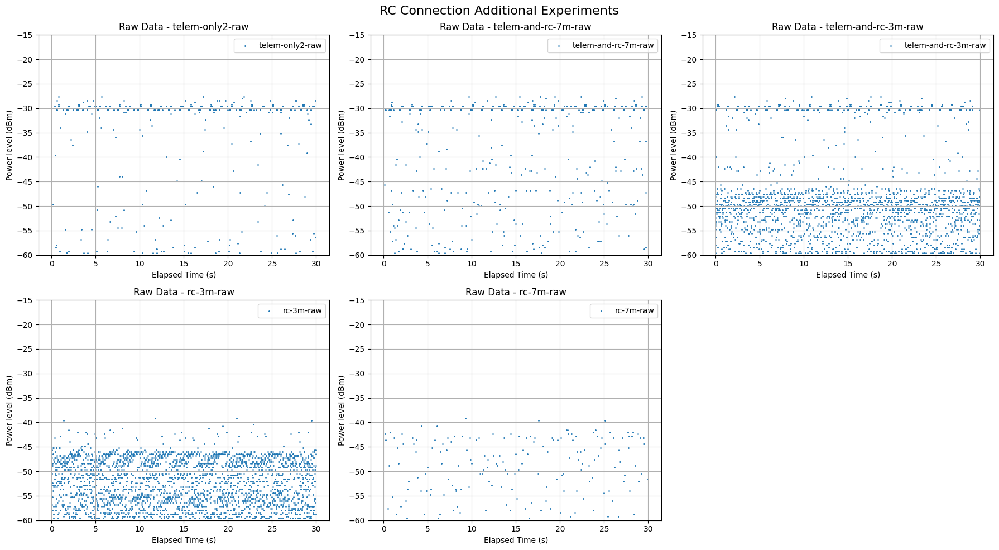

In [121]:
raw_files = [
    "raw-data\\2025-04-27_12-58-17_telem-only2-raw.csv",
    "raw-data\\2025-04-27_13-02-10_telem-and-rc-7m-raw.csv",
    "raw-data\\2025-04-27_13-03-14_telem-and-rc-3m-raw.csv",
    "raw-data\\2025-04-27_13-04-43_rc-3m-raw.csv",
    "raw-data\\2025-04-27_13-05-37_rc-7m-raw.csv"
]

# labels=["rc-on-startup",
#         "drone-startup (rc off)",
#         # "rc-startup (drone already powered on for ~30s)",
#         "rc-startup (drone already powered on for ~30s)",
#         "rc-startup-second-half (drone off)",
#         "drone-startup-second-half (rc on)"
#         ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))  
fig.suptitle("RC Connection Additional Experiments", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"], label=custom_param, s=1)
        axes[i].set_title(f"Raw Data - {custom_param}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("Power level (dBm)")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


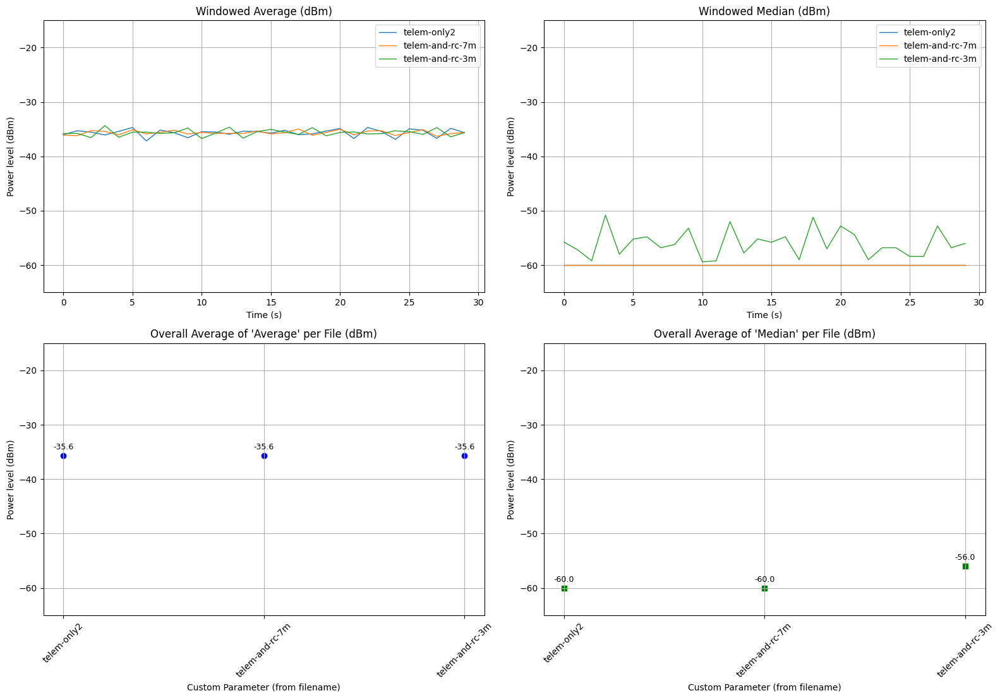

In [122]:
processed_files = [
"processed-data\\2025-04-27_12-58-17_telem-only2.csv",
"processed-data\\2025-04-27_13-02-10_telem-and-rc-7m.csv",
"processed-data\\2025-04-27_13-03-14_telem-and-rc-3m.csv",
# "processed-data\\2025-04-27_13-04-43_rc-3m.csv",
# "processed-data\\2025-04-27_13-05-37_rc-7m.csv"
]# Dictionary to store averages

# titles=["Baseline measurement","Drone powered on","Motor interference","Propeller vibration analysis"]

average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels


for i,file in enumerate(processed_files):
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")
        # custom_param = titles[i]
        
        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 1].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 0].set_ylabel("Power level (dBm)")
axes[0, 1].set_ylabel("Power level (dBm)")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("Power level (dBm)")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("Power level (dBm)")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\3078421048.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


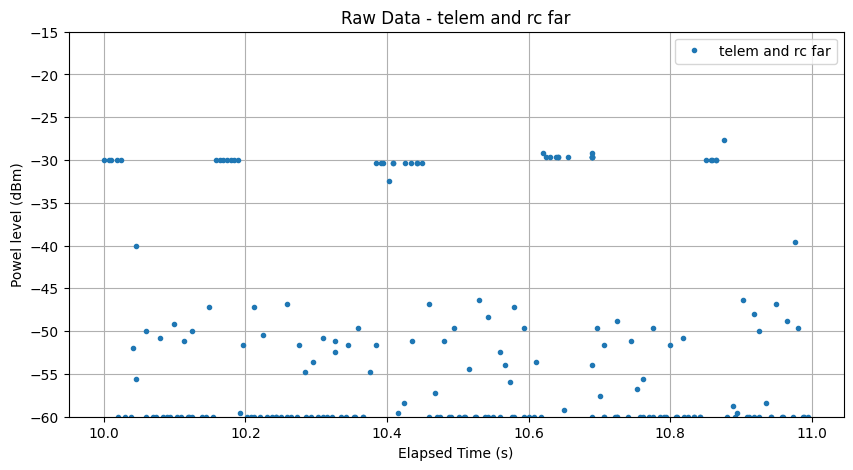

In [123]:
df = pd.read_csv("raw-data\\2025-04-27_13-03-14_telem-and-rc-3m-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
plt.title(f"Raw Data - {"telem and rc far"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Powel level (dBm)")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


outdoor flight

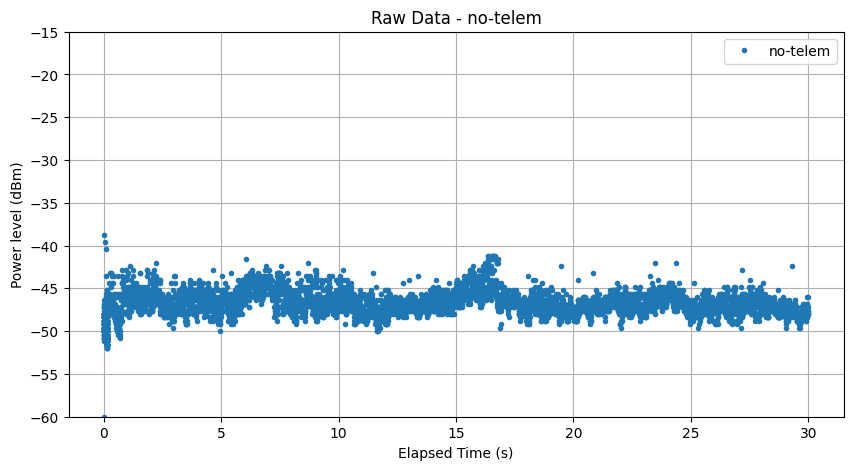

In [124]:
df = pd.read_csv("raw-flight-data\\no-telem-raw.csv")

# Select only data where "Second" == 90
df_filtered = df#[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="no-telem", linewidth=0.5)
plt.title(f"Raw Data - {"no-telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


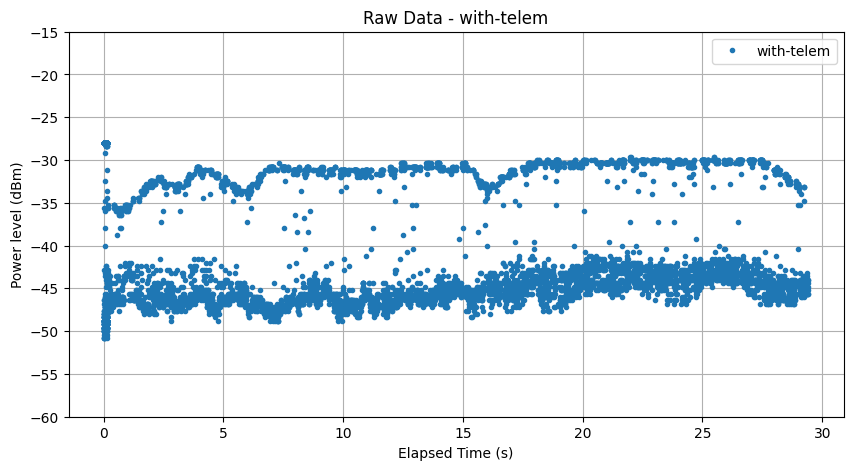

In [125]:
df = pd.read_csv("raw-flight-data\\with-telem-raw.csv")

# Select only data where "Second" == 90
df_filtered = df#[(df["Elapsed Time (s)"] >= 15) & (df["Elapsed Time (s)"] < 16)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="with-telem", linewidth=0.5)
plt.title(f"Raw Data - {"with-telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


burst filter

Loaded 6519 data points.
Found 2023 points initially above -40.0 dBm.
Grouped into 220 distinct potential burst events based on threshold and gap.
{'start_time': np.float64(0.007), 'end_time': np.float64(0.14), 'duration': np.float64(0.133), 'num_points': 217, 'original_indices': [np.int64(20), np.int64(23), np.int64(24), np.int64(25), np.int64(26), np.int64(28), np.int64(29), np.int64(30), np.int64(31), np.int64(32), np.int64(33), np.int64(42), np.int64(44), np.int64(45), np.int64(46), np.int64(47), np.int64(48), np.int64(49), np.int64(50), np.int64(51), np.int64(52), np.int64(53), np.int64(54), np.int64(55), np.int64(56), np.int64(57), np.int64(58), np.int64(59), np.int64(60), np.int64(62), np.int64(91), np.int64(112), np.int64(114), np.int64(115), np.int64(116), np.int64(117), np.int64(118), np.int64(119), np.int64(120), np.int64(121), np.int64(122), np.int64(123), np.int64(124), np.int64(126), np.int64(127), np.int64(128), np.int64(129), np.int64(130), np.int64(131), np.int64(132),

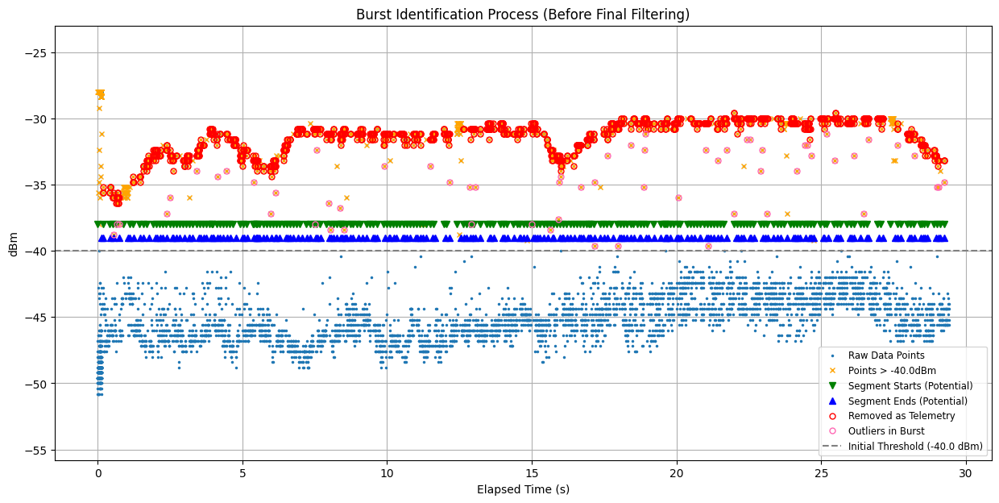

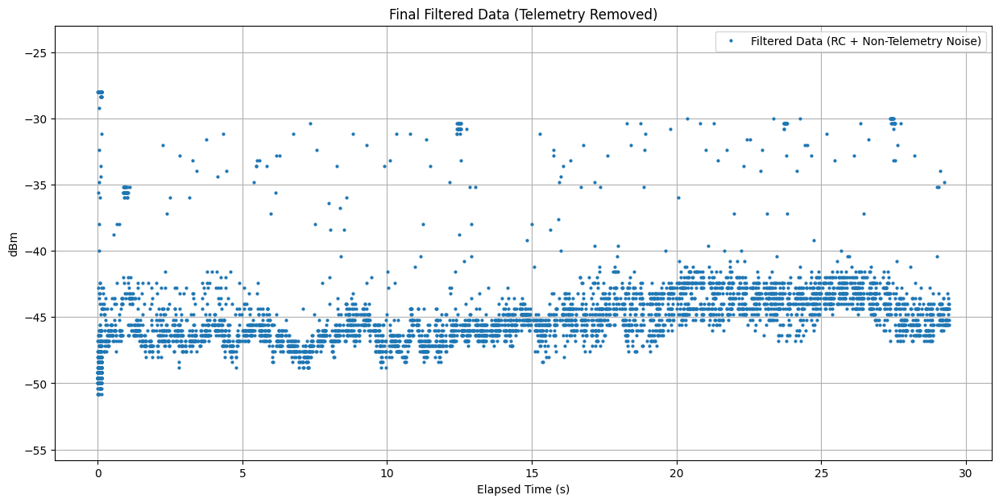


--- Statistics for ALL Segments Initially Identified ---
Mean Duration: 0.039723 s
Median Duration: 0.025000 s
Min Duration: 0.000000 s
Max Duration: 0.165000 s


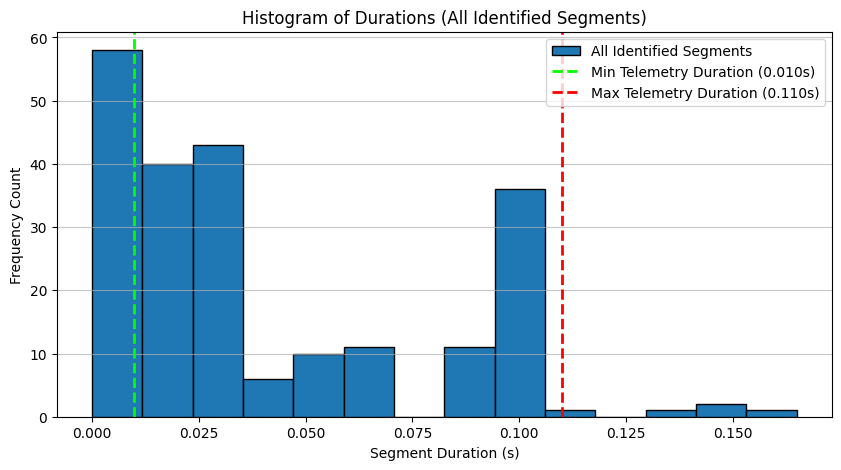

In [126]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# from scipy.signal import lombscargle # Not used in this part
import warnings # Import warnings module

# Suppress specific FutureWarning from pandas if needed (optional)
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- Parameters ---
csv_file = "raw-flight-data\\with-telem-raw.csv"
# start_time = 11.8 # Set to None or 0 to use all data initially
# end_time = 13.9   # Set to None to use all data initially
start_time = None # Set to None or 0 to use all data initially
end_time = None
# Parameters for Burst Identification
initial_threshold_dbm = -40.0 # Amplitude threshold to identify POTENTIAL burst points
max_intra_burst_gap = 0.01  # Max time gap WITHIN a single burst (tune based on sampling rate)

# Parameters for Filtering Identified Bursts by Duration
# *** Use values based on your "Histogram of Burst Durations" ***
min_acceptable_telemetry_duration = 0.0098 # Example: Lower bound from histogram
max_acceptable_telemetry_duration = 0.11 # Example: Upper bound from histogram

# ***----------------------------------------------------***


# --- Voltage to dBm Function ---
def voltage_to_dbm(voltage):
    voltage = np.clip(voltage, 0.5, 2.0) # Clamp voltage based on expected range
    return (voltage / -0.025) + 20.0

# --- Load and Prepare Data ---
try:
    df = pd.read_csv(csv_file)
except FileNotFoundError:
    print(f"Error: CSV file not found at '{os.path.abspath(csv_file)}'. Please check the path.")
    exit()

required_cols = {"Elapsed Time (s)", "Value"}
if not required_cols.issubset(df.columns):
    missing_cols = required_cols - set(df.columns)
    print(f"Error: Required columns {missing_cols} not found in CSV.")
    exit()

# Sort by time just in case
df = df.sort_values("Elapsed Time (s)").reset_index(drop=True)

# Apply time window if specified
if start_time is not None and end_time is not None:
    df_filtered = df[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()
    if df_filtered.empty:
        print(f"Error: No data found in the specified time window ({start_time}s to {end_time}s).")
        exit()
else:
     df_filtered = df.copy() # Use all data


# Calculate dBm
df_filtered["dBm"] = voltage_to_dbm(df_filtered["Value"])
print(f"Loaded {len(df_filtered)} data points.")

# --- Burst Identification (Based on your code structure) ---

# 1. Identify *all* points above the initial threshold
potential_burst_points_df = df_filtered[df_filtered["dBm"] > initial_threshold_dbm].copy()

if potential_burst_points_df.empty:
    print(f"No points found above initial threshold {initial_threshold_dbm} dBm. No filtering applied.")
    df_final_filtered = df_filtered.copy() # Keep all data
    burst_events = [] # No events to analyze
else:
    print(f"Found {len(potential_burst_points_df)} points initially above {initial_threshold_dbm} dBm.")
    all_burst_indices = potential_burst_points_df.index # Use original DataFrame indices
    all_burst_times = potential_burst_points_df["Elapsed Time (s)"].values
    all_burst_dbm = potential_burst_points_df["dBm"].values

    # 2. Group points into distinct bursts using max_intra_burst_gap
    burst_events = [] # List to store info for each identified segment
    current_burst_original_indices = []

    if len(all_burst_indices) > 0:
        current_burst_original_indices.append(all_burst_indices[0]) # Start with the first point's original index

        for i in range(1, len(all_burst_indices)):
            time_gap = all_burst_times[i] - all_burst_times[i-1]

            if time_gap > max_intra_burst_gap + 1e-9: # If gap is LARGER, previous burst ended
                # Finalize the previous burst segment
                start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
                end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])

                start_t = all_burst_times[start_idx_in_burst_points]
                end_t = all_burst_times[end_idx_in_burst_points]
                duration = end_t - start_t

                # Store the original indices for potential removal later
                burst_events.append({
                    "start_time": start_t,
                    "end_time": end_t,
                    "duration": duration,
                    "num_points": len(current_burst_original_indices),
                    "original_indices": list(current_burst_original_indices) # Store the indices from df_filtered
                })
                # Start a new burst
                current_burst_original_indices = [all_burst_indices[i]]
            else:
                # Add point's original index to the current burst
                current_burst_original_indices.append(all_burst_indices[i])

        # Add the last burst after the loop finishes
        if current_burst_original_indices:
            start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
            end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])
            start_t = all_burst_times[start_idx_in_burst_points]
            end_t = all_burst_times[end_idx_in_burst_points]
            duration = end_t - start_t

            burst_events.append({
                "start_time": start_t,
                "end_time": end_t,
                "duration": duration,
                "num_points": len(current_burst_original_indices),
                "original_indices": list(current_burst_original_indices)
            })

    print(f"Grouped into {len(burst_events)} distinct potential burst events based on threshold and gap.")

    # --- Filter Identified Bursts by Duration ---
    indices_to_remove = set() # Use a set for efficient addition of unique indices
    confirmed_telemetry_events = []
    outliers_not_removed=set()
    for event in burst_events:
        print(event)
        if min_acceptable_telemetry_duration <= event['duration'] <= max_acceptable_telemetry_duration:
            # This burst matches the telemetry duration profile

            # Extract the dBm values for this burst
            burst_points = df_filtered.loc[event['original_indices'], "dBm"]

            # --- Outlier Detection ---
            # Example: Define outliers as points > 2 standard deviations from mean
            # mean_dbm = burst_points.mean()
            # std_dbm = burst_points.std()

            # threshold = 2.0  
            median_dbm = burst_points.median()
            lower_bound = median_dbm - 1
            upper_bound = median_dbm + 1

            # Identify good points (NOT outliers)
            good_points_mask = (burst_points >= lower_bound) & (burst_points <= upper_bound)
            outliers_not_removed.update()
            good_indices = burst_points[good_points_mask].index.tolist()
            bad_indices = burst_points[~good_points_mask].index.tolist()
            # Update: Only remove the good (non-outlier) points
            indices_to_remove.update(good_indices)
            outliers_not_removed.update(bad_indices)
            # Also optionally store the filtered event if you want
            filtered_event = event.copy()
            filtered_event['original_indices'] = good_indices
            confirmed_telemetry_events.append(filtered_event)

    print(f"Identified {len(confirmed_telemetry_events)} events matching telemetry duration profile ({min_acceptable_telemetry_duration:.4f}s - {max_acceptable_telemetry_duration:.4f}s).")
    print(f"Removing {len(indices_to_remove)} points identified as telemetry (after outlier removal).")

    # --- Final Filtering ---
    if indices_to_remove:
        # Use drop for efficiency if indices are known
        df_final_filtered = df_filtered.drop(index=list(indices_to_remove))
    else:
        df_final_filtered = df_filtered.copy() # No points to remove

# --- Plotting ---

# Plot 1: Original Data with Burst Identification Markers (like your original plot)
plt.figure(figsize=(15, 7))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="Raw Data Points", markersize=3)

if not potential_burst_points_df.empty:
    # Plot all points initially above threshold
    plt.plot(potential_burst_points_df["Elapsed Time (s)"], potential_burst_points_df["dBm"], "x", color='orange', markersize=4, label=f'Points > {initial_threshold_dbm}dBm')

    # Plot start/end markers for *all* identified segments (before duration filtering)
    all_segment_start_times = np.array([event["start_time"] for event in burst_events])
    all_segment_end_times = np.array([event["end_time"] for event in burst_events])
    plt.plot(all_segment_start_times, np.full(all_segment_start_times.shape, initial_threshold_dbm + 2), 'gv', markersize=6, label='Segment Starts (Potential)')
    plt.plot(all_segment_end_times, np.full(all_segment_end_times.shape, initial_threshold_dbm + 1), 'b^', markersize=6, label='Segment Ends (Potential)')

    # Highlight the points that were actually removed (confirmed telemetry)
    if 'indices_to_remove' in locals() and indices_to_remove:
         removed_points_df = df_filtered.loc[list(indices_to_remove)]
         plt.plot(removed_points_df["Elapsed Time (s)"], removed_points_df["dBm"], "o", color='red', markersize=5, fillstyle='none', label='Removed as Telemetry')

    # Highlight the points that were not removed but within burst (outliers)
    if 'outliers_not_removed' in locals() and outliers_not_removed:
         outlier_points_df = df_filtered.loc[list(outliers_not_removed)]
         plt.plot(outlier_points_df["Elapsed Time (s)"], outlier_points_df["dBm"], "o", color='hotpink', markersize=5, fillstyle='none', label='Outliers in Burst')


plt.axhline(initial_threshold_dbm, color='grey', linestyle='--', label=f'Initial Threshold ({initial_threshold_dbm} dBm)')
plt.title("Burst Identification Process (Before Final Filtering)")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Dynamic ylim
plt.grid(True)
plt.legend(loc='lower right', fontsize='small')
plt.show()


# Plot 2: Final Filtered Data
plt.figure(figsize=(15, 7))
plt.plot(df_final_filtered["Elapsed Time (s)"], df_final_filtered["dBm"], ".", label="Filtered Data (RC + Non-Telemetry Noise)", markersize=4)
plt.title("Final Filtered Data (Telemetry Removed)")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Use same ylim as plot 1 for comparison
plt.grid(True)
plt.legend()
plt.show()


# Plot 3: Histogram of Durations of ALL identified segments (before duration filtering)
if burst_events:
    all_segment_durations = np.array([event["duration"] for event in burst_events])
    print("\n--- Statistics for ALL Segments Initially Identified ---")
    print(f"Mean Duration: {np.mean(all_segment_durations):.6f} s")
    print(f"Median Duration: {np.median(all_segment_durations):.6f} s")
    print(f"Min Duration: {np.min(all_segment_durations):.6f} s")
    print(f"Max Duration: {np.max(all_segment_durations):.6f} s")

    plt.figure(figsize=(10, 5))
    duration_range = np.max(all_segment_durations) - np.min(all_segment_durations)
    n_bins = min(50, max(10, int(np.sqrt(len(all_segment_durations)))))
    if duration_range > 1e-9:
         plt.hist(all_segment_durations, bins=n_bins, edgecolor='black', label='All Identified Segments')
    else:
         plt.hist(all_segment_durations, bins=1, edgecolor='black', label='All Identified Segments')

    # Add lines for the acceptable telemetry duration range
    plt.axvline(min_acceptable_telemetry_duration, color='lime', linestyle='--', linewidth=2, label=f'Min Telemetry Duration ({min_acceptable_telemetry_duration:.3f}s)')
    plt.axvline(max_acceptable_telemetry_duration, color='red', linestyle='--', linewidth=2, label=f'Max Telemetry Duration ({max_acceptable_telemetry_duration:.3f}s)')

    plt.title("Histogram of Durations (All Identified Segments)")
    plt.xlabel("Segment Duration (s)")
    plt.ylabel("Frequency Count")
    plt.legend()
    plt.grid(axis='y', alpha=0.7)
    plt.show()
else:
    print("\nNo potential burst events identified.")

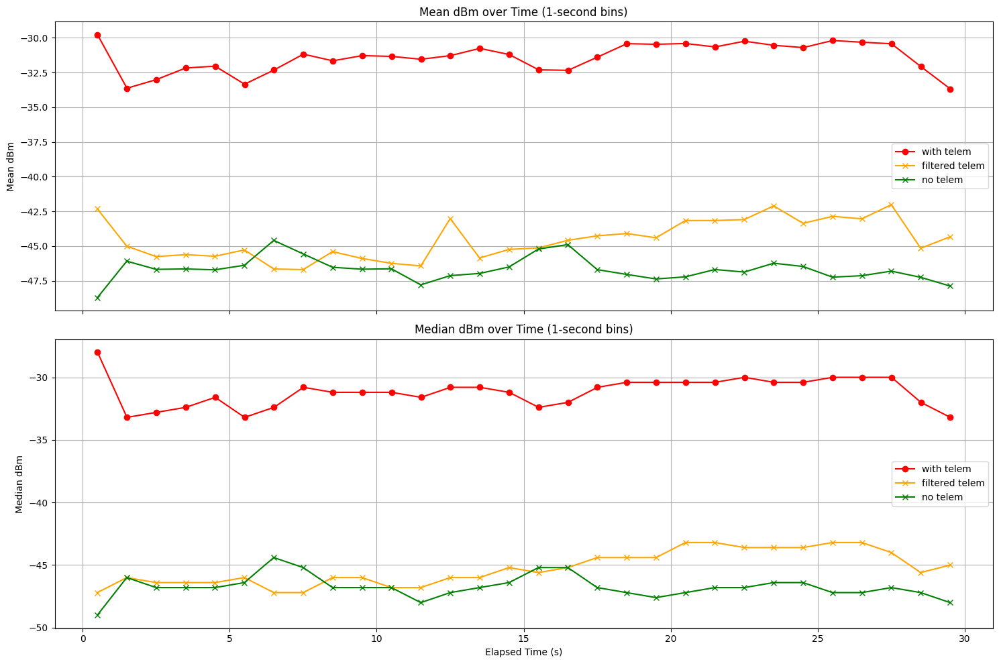

In [127]:
import matplotlib.pyplot as plt

# --- Binning Settings ---
bin_size_seconds = 1.0  # 1-second bins

# --- Function to Bin and Compute Mean/Median ---
def bin_and_aggregate(df, time_col, value_col, bin_size, agg_func):
    # Create bins
    min_time = df[time_col].min()
    max_time = df[time_col].max()
    bins = np.arange(min_time, max_time + bin_size, bin_size)
    
    # Bin the data
    binned = pd.cut(df[time_col], bins=bins, include_lowest=True)
    
    # Group by bins and apply aggregation
    result = df.groupby(binned)[value_col].agg(agg_func)
    
    # Use bin centers for plotting
    bin_centers = bins[:-1] + bin_size / 2
    result.index = bin_centers[:len(result)]
    
    return result

# --- Prepare Aggregated Data ---

# For potential_burst_points_df
mean_with_telem = bin_and_aggregate(potential_burst_points_df, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_potential = bin_and_aggregate(potential_burst_points_df, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)

# For df_final_filtered
mean_final = bin_and_aggregate(df_final_filtered, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_final = bin_and_aggregate(df_final_filtered, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)

# For df_final_filtered
df_no_telem = pd.read_csv("raw-flight-data\\no-telem-raw.csv")
df_no_telem["dBm"] = voltage_to_dbm(df_no_telem["Value"])

mean_no_telem = bin_and_aggregate(df_no_telem, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_no_telem = bin_and_aggregate(df_no_telem, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)


# --- Plotting ---

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Top plot: Mean
ax1.plot(mean_with_telem.index, mean_with_telem.values, label="with telem", color='red', marker='o')
ax1.plot(mean_final.index, mean_final.values, label="filtered telem", color='orange', marker='x')
ax1.plot(mean_no_telem.index, mean_no_telem.values, label="no telem", color='green', marker='x')
ax1.set_ylabel("Mean dBm")
ax1.set_title("Mean dBm over Time (1-second bins)")
ax1.grid(True)
ax1.legend()

# Bottom plot: Median
ax2.plot(median_potential.index, median_potential.values, label="with telem", color='red', marker='o')
ax2.plot(median_final.index, median_final.values, label="filtered telem", color='orange', marker='x')
ax2.plot(median_no_telem.index, median_no_telem.values, label="no telem", color='green', marker='x')
ax2.set_ylabel("Median dBm")
ax2.set_xlabel("Elapsed Time (s)")
ax2.set_title("Median dBm over Time (1-second bins)")
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()


In [128]:
# voltage_to_dbm(potential_burst_points_df.Value.mean())
print(voltage_to_dbm(df_final_filtered.Value.mean()))
print(voltage_to_dbm(potential_burst_points_df.Value.mean()))
print(voltage_to_dbm(df_no_telem.Value.mean()))


-44.199269480519476
-31.20276816608996
-47.33128297904416


In [129]:
average_average_dbm_per_file={"with telem":mean_with_telem.mean(),"filtered telem":mean_final.mean(),"no telem":mean_no_telem.mean()}
average_median_dbm_per_file={"with telem":median_potential.mean(),"filtered telem":median_final.mean(),"no telem":median_no_telem.mean()}



In [130]:
print("average of average")
print(average_average_dbm_per_file)
print("average of median")
print(average_median_dbm_per_file)

average of average
{'with telem': np.float64(-31.427559453862493), 'filtered telem': np.float64(-44.52801629654426), 'no telem': np.float64(-46.68393555176199)}
average of median
{'with telem': np.float64(-31.173333333333332), 'filtered telem': np.float64(-45.25999999999999), 'no telem': np.float64(-46.739999999999995)}


met andere signal


Loaded 24019 data points.
Found 15177 points initially above -40.0 dBm.
Grouped into 298 distinct potential burst events based on threshold and gap.
{'start_time': np.float64(0.003), 'end_time': np.float64(0.003), 'duration': np.float64(0.0), 'num_points': 1, 'original_indices': [np.int64(0)]}
{'start_time': np.float64(0.167), 'end_time': np.float64(0.227), 'duration': np.float64(0.06), 'num_points': 12, 'original_indices': [np.int64(33), np.int64(34), np.int64(35), np.int64(36), np.int64(37), np.int64(38), np.int64(39), np.int64(41), np.int64(42), np.int64(43), np.int64(44), np.int64(45)]}
{'start_time': np.float64(0.402), 'end_time': np.float64(0.464), 'duration': np.float64(0.062), 'num_points': 12, 'original_indices': [np.int64(80), np.int64(81), np.int64(82), np.int64(83), np.int64(84), np.int64(85), np.int64(87), np.int64(88), np.int64(89), np.int64(90), np.int64(91), np.int64(92)]}
{'start_time': np.float64(0.632), 'end_time': np.float64(0.692), 'duration': np.float64(0.05999999

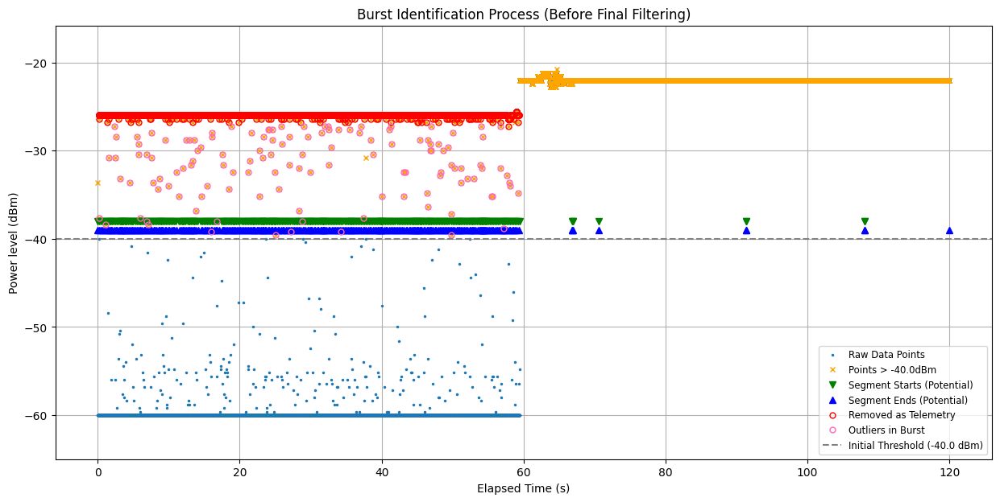

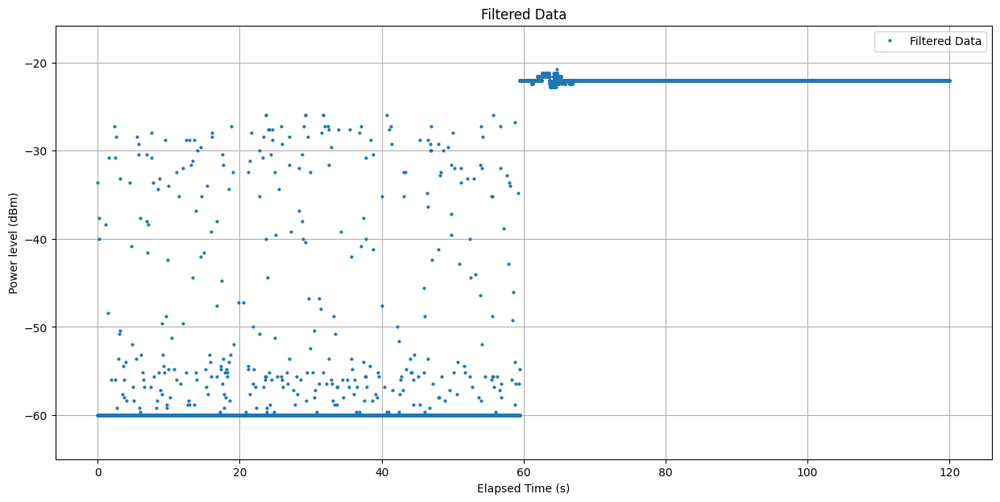

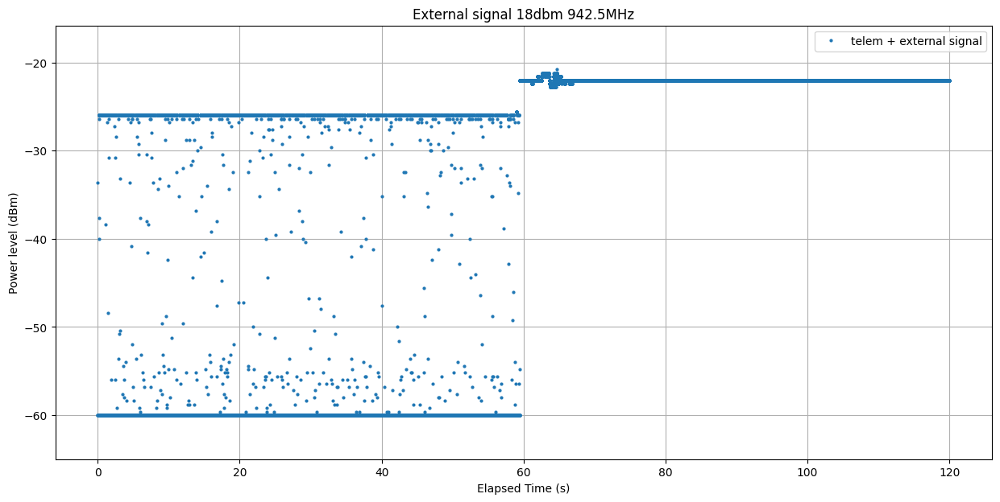


--- Statistics for ALL Segments Initially Identified ---
Mean Duration: 0.251527 s
Median Duration: 0.055000 s
Min Duration: 0.000000 s
Max Duration: 20.782000 s


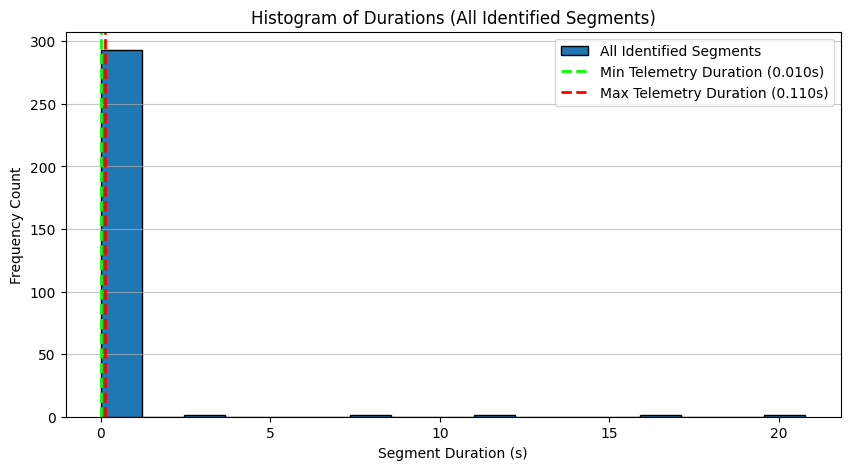

In [131]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# from scipy.signal import lombscargle # Not used in this part
import warnings # Import warnings module

# Suppress specific FutureWarning from pandas if needed (optional)
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- Parameters ---
csv_file = "raw-data\\2025-03-29_17-42-46_telem-oneside-3m-90-antenna-00-second-half-18dbm-942.5hz-raw.csv"
# start_time = 11.8 # Set to None or 0 to use all data initially
# end_time = 13.9   # Set to None to use all data initially
start_time = None # Set to None or 0 to use all data initially
end_time = None
# Parameters for Burst Identification
initial_threshold_dbm = -40.0 # Amplitude threshold to identify POTENTIAL burst points
max_intra_burst_gap = 0.01  # Max time gap WITHIN a single burst (tune based on sampling rate)

# Parameters for Filtering Identified Bursts by Duration
# *** Use values based on your "Histogram of Burst Durations" ***
min_acceptable_telemetry_duration = 0.0098 # Example: Lower bound from histogram
max_acceptable_telemetry_duration = 0.11 # Example: Upper bound from histogram

# ***----------------------------------------------------***


# --- Voltage to dBm Function ---
def voltage_to_dbm(voltage):
    voltage = np.clip(voltage, 0.5, 2.0) # Clamp voltage based on expected range
    return (voltage / -0.025) + 20.0

# --- Load and Prepare Data ---
try:
    df = pd.read_csv(csv_file)
except FileNotFoundError:
    print(f"Error: CSV file not found at '{os.path.abspath(csv_file)}'. Please check the path.")
    exit()

required_cols = {"Elapsed Time (s)", "Value"}
if not required_cols.issubset(df.columns):
    missing_cols = required_cols - set(df.columns)
    print(f"Error: Required columns {missing_cols} not found in CSV.")
    exit()

# Sort by time just in case
df = df.sort_values("Elapsed Time (s)").reset_index(drop=True)

# Apply time window if specified
if start_time is not None and end_time is not None:
    df_filtered = df[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()
    if df_filtered.empty:
        print(f"Error: No data found in the specified time window ({start_time}s to {end_time}s).")
        exit()
else:
     df_filtered = df.copy() # Use all data


# Calculate dBm
df_filtered["dBm"] = voltage_to_dbm(df_filtered["Value"])
print(f"Loaded {len(df_filtered)} data points.")

# --- Burst Identification (Based on your code structure) ---

# 1. Identify *all* points above the initial threshold
potential_burst_points_df = df_filtered[df_filtered["dBm"] > initial_threshold_dbm].copy()

if potential_burst_points_df.empty:
    print(f"No points found above initial threshold {initial_threshold_dbm} dBm. No filtering applied.")
    df_final_filtered = df_filtered.copy() # Keep all data
    burst_events = [] # No events to analyze
else:
    print(f"Found {len(potential_burst_points_df)} points initially above {initial_threshold_dbm} dBm.")
    all_burst_indices = potential_burst_points_df.index # Use original DataFrame indices
    all_burst_times = potential_burst_points_df["Elapsed Time (s)"].values
    all_burst_dbm = potential_burst_points_df["dBm"].values

    # 2. Group points into distinct bursts using max_intra_burst_gap
    burst_events = [] # List to store info for each identified segment
    current_burst_original_indices = []

    if len(all_burst_indices) > 0:
        current_burst_original_indices.append(all_burst_indices[0]) # Start with the first point's original index

        for i in range(1, len(all_burst_indices)):
            time_gap = all_burst_times[i] - all_burst_times[i-1]

            if time_gap > max_intra_burst_gap + 1e-9: # If gap is LARGER, previous burst ended
                # Finalize the previous burst segment
                start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
                end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])

                start_t = all_burst_times[start_idx_in_burst_points]
                end_t = all_burst_times[end_idx_in_burst_points]
                duration = end_t - start_t

                # Store the original indices for potential removal later
                burst_events.append({
                    "start_time": start_t,
                    "end_time": end_t,
                    "duration": duration,
                    "num_points": len(current_burst_original_indices),
                    "original_indices": list(current_burst_original_indices) # Store the indices from df_filtered
                })
                # Start a new burst
                current_burst_original_indices = [all_burst_indices[i]]
            else:
                # Add point's original index to the current burst
                current_burst_original_indices.append(all_burst_indices[i])

        # Add the last burst after the loop finishes
        if current_burst_original_indices:
            start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
            end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])
            start_t = all_burst_times[start_idx_in_burst_points]
            end_t = all_burst_times[end_idx_in_burst_points]
            duration = end_t - start_t

            burst_events.append({
                "start_time": start_t,
                "end_time": end_t,
                "duration": duration,
                "num_points": len(current_burst_original_indices),
                "original_indices": list(current_burst_original_indices)
            })

    print(f"Grouped into {len(burst_events)} distinct potential burst events based on threshold and gap.")

    # --- Filter Identified Bursts by Duration ---
    indices_to_remove = set() # Use a set for efficient addition of unique indices
    confirmed_telemetry_events = []
    outliers_not_removed=set()
    for event in burst_events:
        print(event)
        if min_acceptable_telemetry_duration <= event['duration'] <= max_acceptable_telemetry_duration:
            # This burst matches the telemetry duration profile

            # Extract the dBm values for this burst
            burst_points = df_filtered.loc[event['original_indices'], "dBm"]

            # --- Outlier Detection ---
            # Example: Define outliers as points > 2 standard deviations from mean
            # mean_dbm = burst_points.mean()
            # std_dbm = burst_points.std()

            # threshold = 2.0  
            median_dbm = burst_points.median()

            lower_bound = median_dbm - 1
            upper_bound = median_dbm + 1

            # Identify good points (NOT outliers)
            good_points_mask = (burst_points >= lower_bound) & (burst_points <= upper_bound)
            outliers_not_removed.update()
            good_indices = burst_points[good_points_mask].index.tolist()
            bad_indices = burst_points[~good_points_mask].index.tolist()
            # Update: Only remove the good (non-outlier) points
            indices_to_remove.update(good_indices)
            outliers_not_removed.update(bad_indices)
            # Also optionally store the filtered event if you want
            filtered_event = event.copy()
            filtered_event['original_indices'] = good_indices
            confirmed_telemetry_events.append(filtered_event)

    print(f"Identified {len(confirmed_telemetry_events)} events matching telemetry duration profile ({min_acceptable_telemetry_duration:.4f}s - {max_acceptable_telemetry_duration:.4f}s).")
    print(f"Removing {len(indices_to_remove)} points identified as telemetry (after outlier removal).")

    # --- Final Filtering ---
    if indices_to_remove:
        # Use drop for efficiency if indices are known
        df_final_filtered = df_filtered.drop(index=list(indices_to_remove))
    else:
        df_final_filtered = df_filtered.copy() # No points to remove

# --- Plotting ---

# Plot 1: Original Data with Burst Identification Markers (like your original plot)
plt.figure(figsize=(15, 7))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="Raw Data Points", markersize=3)

if not potential_burst_points_df.empty:
    # Plot all points initially above threshold
    plt.plot(potential_burst_points_df["Elapsed Time (s)"], potential_burst_points_df["dBm"], "x", color='orange', markersize=4, label=f'Points > {initial_threshold_dbm}dBm')

    # Plot start/end markers for *all* identified segments (before duration filtering)
    all_segment_start_times = np.array([event["start_time"] for event in burst_events])
    all_segment_end_times = np.array([event["end_time"] for event in burst_events])
    plt.plot(all_segment_start_times, np.full(all_segment_start_times.shape, initial_threshold_dbm + 2), 'gv', markersize=6, label='Segment Starts (Potential)')
    plt.plot(all_segment_end_times, np.full(all_segment_end_times.shape, initial_threshold_dbm + 1), 'b^', markersize=6, label='Segment Ends (Potential)')

    # Highlight the points that were actually removed (confirmed telemetry)
    if 'indices_to_remove' in locals() and indices_to_remove:
         removed_points_df = df_filtered.loc[list(indices_to_remove)]
         plt.plot(removed_points_df["Elapsed Time (s)"], removed_points_df["dBm"], "o", color='red', markersize=5, fillstyle='none', label='Removed as Telemetry')

    # Highlight the points that were not removed but within burst (outliers)
    if 'outliers_not_removed' in locals() and outliers_not_removed:
         outlier_points_df = df_filtered.loc[list(outliers_not_removed)]
         plt.plot(outlier_points_df["Elapsed Time (s)"], outlier_points_df["dBm"], "o", color='hotpink', markersize=5, fillstyle='none', label='Outliers in Burst')


plt.axhline(initial_threshold_dbm, color='grey', linestyle='--', label=f'Initial Threshold ({initial_threshold_dbm} dBm)')
plt.title("Burst Identification Process (Before Final Filtering)")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Dynamic ylim
plt.grid(True)
plt.legend(loc='lower right', fontsize='small')
plt.show()


# Plot 2: Final Filtered Data
plt.figure(figsize=(15, 7))
plt.plot(df_final_filtered["Elapsed Time (s)"], df_final_filtered["dBm"], ".", label="Filtered Data", markersize=4)
plt.title("Filtered Data")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Use same ylim as plot 1 for comparison
plt.grid(True)
plt.legend()
plt.show()

# Plot 2: Final Filtered Data
plt.figure(figsize=(15, 7))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem + external signal", markersize=4)
plt.title("External signal 18dbm 942.5MHz")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Use same ylim as plot 1 for comparison
plt.grid(True)
plt.legend()
plt.show()


# Plot 3: Histogram of Durations of ALL identified segments (before duration filtering)
if burst_events:
    all_segment_durations = np.array([event["duration"] for event in burst_events])
    print("\n--- Statistics for ALL Segments Initially Identified ---")
    print(f"Mean Duration: {np.mean(all_segment_durations):.6f} s")
    print(f"Median Duration: {np.median(all_segment_durations):.6f} s")
    print(f"Min Duration: {np.min(all_segment_durations):.6f} s")
    print(f"Max Duration: {np.max(all_segment_durations):.6f} s")

    plt.figure(figsize=(10, 5))
    duration_range = np.max(all_segment_durations) - np.min(all_segment_durations)
    n_bins = min(50, max(10, int(np.sqrt(len(all_segment_durations)))))
    if duration_range > 1e-9:
         plt.hist(all_segment_durations, bins=n_bins, edgecolor='black', label='All Identified Segments')
    else:
         plt.hist(all_segment_durations, bins=1, edgecolor='black', label='All Identified Segments')

    # Add lines for the acceptable telemetry duration range
    plt.axvline(min_acceptable_telemetry_duration, color='lime', linestyle='--', linewidth=2, label=f'Min Telemetry Duration ({min_acceptable_telemetry_duration:.3f}s)')
    plt.axvline(max_acceptable_telemetry_duration, color='red', linestyle='--', linewidth=2, label=f'Max Telemetry Duration ({max_acceptable_telemetry_duration:.3f}s)')

    plt.title("Histogram of Durations (All Identified Segments)")
    plt.xlabel("Segment Duration (s)")
    plt.ylabel("Frequency Count")
    plt.legend()
    plt.grid(axis='y', alpha=0.7)
    plt.show()
else:
    print("\nNo potential burst events identified.")

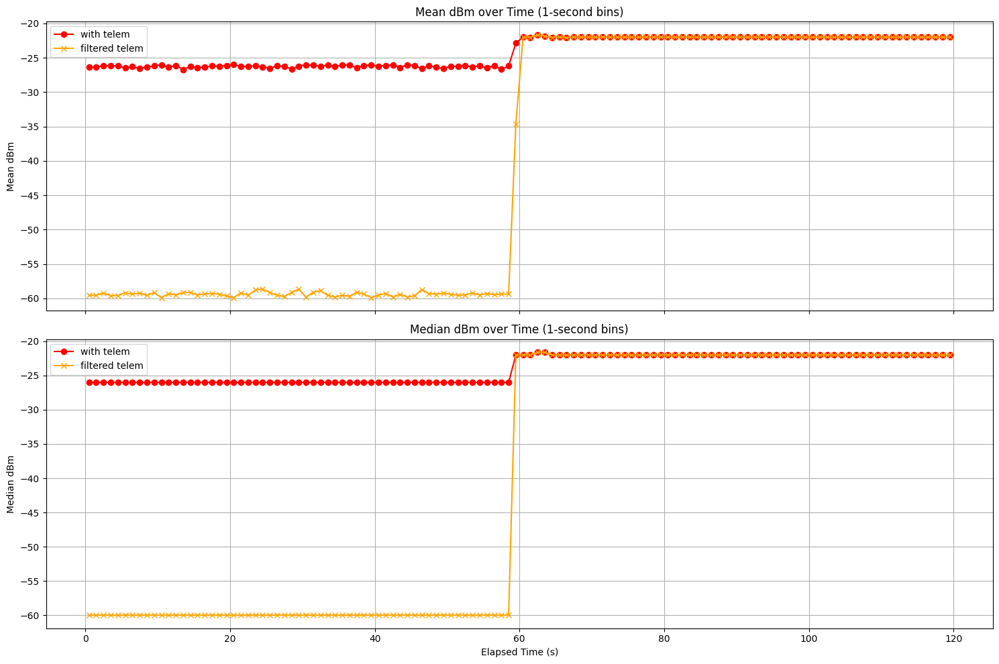

In [132]:
import matplotlib.pyplot as plt

# --- Binning Settings ---
bin_size_seconds = 1.0  # 1-second bins

# --- Function to Bin and Compute Mean/Median ---
def bin_and_aggregate(df, time_col, value_col, bin_size, agg_func):
    # Create bins
    min_time = df[time_col].min()
    max_time = df[time_col].max()
    bins = np.arange(min_time, max_time + bin_size, bin_size)
    
    # Bin the data
    binned = pd.cut(df[time_col], bins=bins, include_lowest=True)
    
    # Group by bins and apply aggregation
    result = df.groupby(binned)[value_col].agg(agg_func)
    
    # Use bin centers for plotting
    bin_centers = bins[:-1] + bin_size / 2
    result.index = bin_centers[:len(result)]
    
    return result

# --- Prepare Aggregated Data ---

# For potential_burst_points_df
mean_with_telem = bin_and_aggregate(potential_burst_points_df, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_potential = bin_and_aggregate(potential_burst_points_df, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)

# For df_final_filtered
mean_final = bin_and_aggregate(df_final_filtered, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_final = bin_and_aggregate(df_final_filtered, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)

# For df_final_filtered
df_no_telem = pd.read_csv("raw-flight-data\\no-telem-raw.csv")
df_no_telem["dBm"] = voltage_to_dbm(df_no_telem["Value"])


# --- Plotting ---

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Top plot: Mean
ax1.plot(mean_with_telem.index, mean_with_telem.values, label="with telem", color='red', marker='o')
ax1.plot(mean_final.index, mean_final.values, label="filtered telem", color='orange', marker='x')
ax1.set_ylabel("Mean dBm")
ax1.set_title("Mean dBm over Time (1-second bins)")
ax1.grid(True)
ax1.legend()

# Bottom plot: Median
ax2.plot(median_potential.index, median_potential.values, label="with telem", color='red', marker='o')
ax2.plot(median_final.index, median_final.values, label="filtered telem", color='orange', marker='x')
ax2.set_ylabel("Median dBm")
ax2.set_xlabel("Elapsed Time (s)")
ax2.set_title("Median dBm over Time (1-second bins)")
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()


Loaded 6029 data points.
Found 1597 points initially above -40.0 dBm.
Grouped into 198 distinct potential burst events based on threshold and gap.
{'start_time': np.float64(0.03), 'end_time': np.float64(0.06), 'duration': np.float64(0.03), 'num_points': 7, 'original_indices': [np.int64(24), np.int64(25), np.int64(26), np.int64(27), np.int64(28), np.int64(29), np.int64(30)]}
{'start_time': np.float64(0.261), 'end_time': np.float64(0.287), 'duration': np.float64(0.025999999999999968), 'num_points': 6, 'original_indices': [np.int64(71), np.int64(72), np.int64(73), np.int64(74), np.int64(75), np.int64(76)]}
{'start_time': np.float64(0.3), 'end_time': np.float64(0.364), 'duration': np.float64(0.064), 'num_points': 13, 'original_indices': [np.int64(78), np.int64(79), np.int64(80), np.int64(81), np.int64(82), np.int64(83), np.int64(85), np.int64(86), np.int64(87), np.int64(88), np.int64(89), np.int64(90), np.int64(91)]}
{'start_time': np.float64(0.491), 'end_time': np.float64(0.552), 'duratio

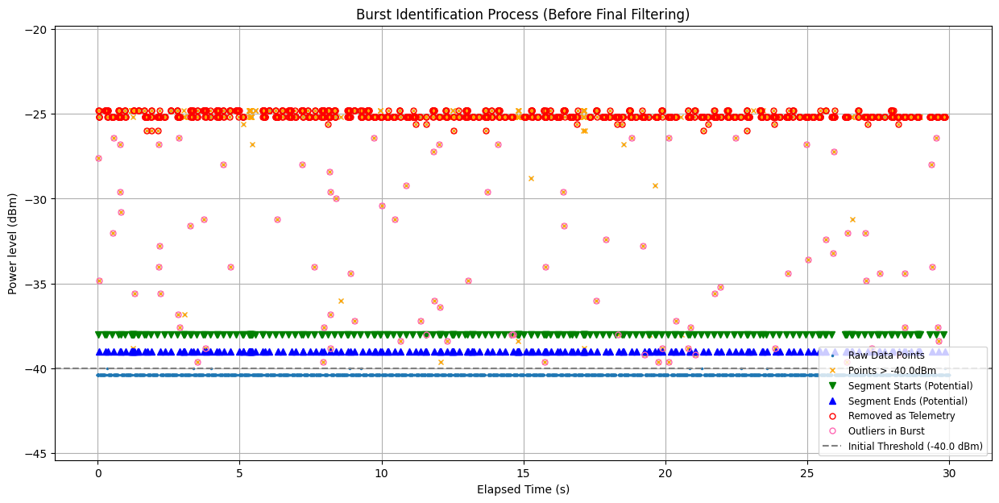

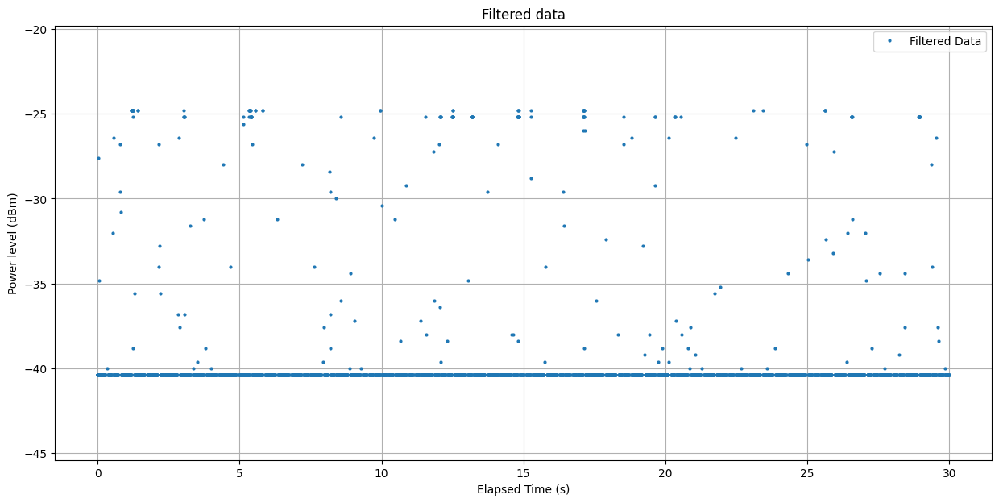

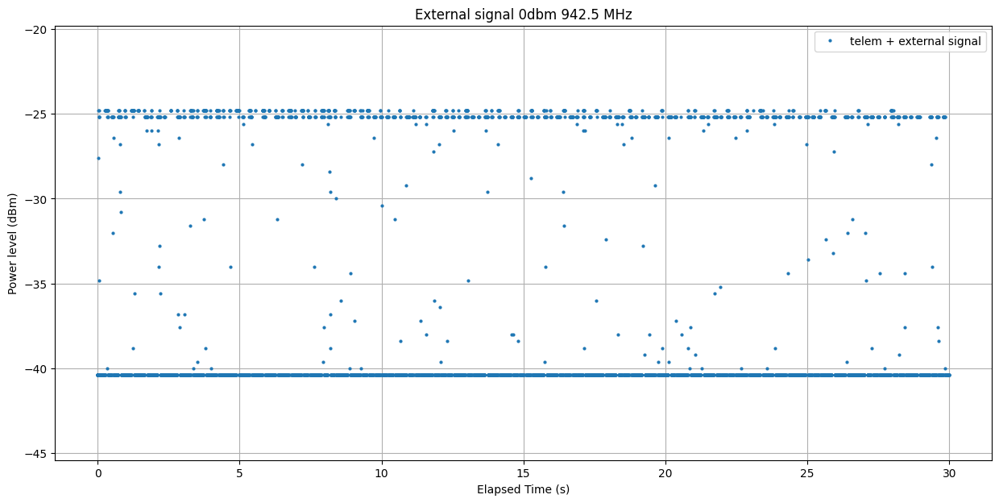


--- Statistics for ALL Segments Initially Identified ---
Mean Duration: 0.033889 s
Median Duration: 0.026000 s
Min Duration: 0.000000 s
Max Duration: 0.103000 s


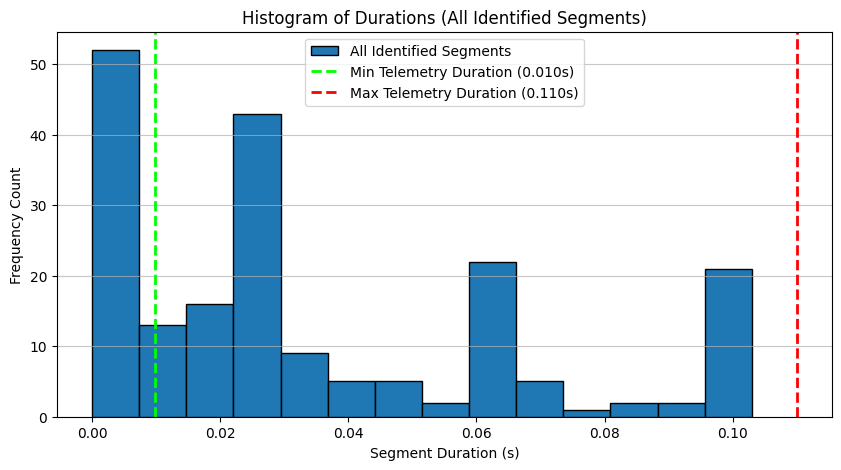

In [133]:


import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# from scipy.signal import lombscargle # Not used in this part
import warnings # Import warnings module

# Suppress specific FutureWarning from pandas if needed (optional)
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- Parameters ---
csv_file ="raw-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv"
# start_time = 11.8 # Set to None or 0 to use all data initially
# end_time = 13.9   # Set to None to use all data initially
start_time = None # Set to None or 0 to use all data initially
end_time = None
# Parameters for Burst Identification
initial_threshold_dbm = -40.0 # Amplitude threshold to identify POTENTIAL burst points
max_intra_burst_gap = 0.01  # Max time gap WITHIN a single burst (tune based on sampling rate)

# Parameters for Filtering Identified Bursts by Duration
# *** Use values based on your "Histogram of Burst Durations" ***
min_acceptable_telemetry_duration = 0.0098 # Example: Lower bound from histogram
max_acceptable_telemetry_duration = 0.11 # Example: Upper bound from histogram

# ***----------------------------------------------------***


# --- Voltage to dBm Function ---
def voltage_to_dbm(voltage):
    voltage = np.clip(voltage, 0.5, 2.0) # Clamp voltage based on expected range
    return (voltage / -0.025) + 20.0

# --- Load and Prepare Data ---
try:
    df = pd.read_csv(csv_file)
except FileNotFoundError:
    print(f"Error: CSV file not found at '{os.path.abspath(csv_file)}'. Please check the path.")
    exit()

required_cols = {"Elapsed Time (s)", "Value"}
if not required_cols.issubset(df.columns):
    missing_cols = required_cols - set(df.columns)
    print(f"Error: Required columns {missing_cols} not found in CSV.")
    exit()

# Sort by time just in case
df = df.sort_values("Elapsed Time (s)").reset_index(drop=True)

# Apply time window if specified
if start_time is not None and end_time is not None:
    df_filtered = df[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()
    if df_filtered.empty:
        print(f"Error: No data found in the specified time window ({start_time}s to {end_time}s).")
        exit()
else:
    df_filtered = df.copy() # Use all data


# Calculate dBm
df_filtered["dBm"] = voltage_to_dbm(df_filtered["Value"])
print(f"Loaded {len(df_filtered)} data points.")

# --- Burst Identification (Based on your code structure) ---

# 1. Identify *all* points above the initial threshold
potential_burst_points_df = df_filtered[df_filtered["dBm"] > initial_threshold_dbm].copy()

if potential_burst_points_df.empty:
    print(f"No points found above initial threshold {initial_threshold_dbm} dBm. No filtering applied.")
    df_final_filtered = df_filtered.copy() # Keep all data
    burst_events = [] # No events to analyze
else:
    print(f"Found {len(potential_burst_points_df)} points initially above {initial_threshold_dbm} dBm.")
    all_burst_indices = potential_burst_points_df.index # Use original DataFrame indices
    all_burst_times = potential_burst_points_df["Elapsed Time (s)"].values
    all_burst_dbm = potential_burst_points_df["dBm"].values

    # 2. Group points into distinct bursts using max_intra_burst_gap
    burst_events = [] # List to store info for each identified segment
    current_burst_original_indices = []

    if len(all_burst_indices) > 0:
        current_burst_original_indices.append(all_burst_indices[0]) # Start with the first point's original index

        for i in range(1, len(all_burst_indices)):
            time_gap = all_burst_times[i] - all_burst_times[i-1]

            if time_gap > max_intra_burst_gap + 1e-9: # If gap is LARGER, previous burst ended
                # Finalize the previous burst segment
                start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
                end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])

                start_t = all_burst_times[start_idx_in_burst_points]
                end_t = all_burst_times[end_idx_in_burst_points]
                duration = end_t - start_t

                # Store the original indices for potential removal later
                burst_events.append({
                    "start_time": start_t,
                    "end_time": end_t,
                    "duration": duration,
                    "num_points": len(current_burst_original_indices),
                    "original_indices": list(current_burst_original_indices) # Store the indices from df_filtered
                })
                # Start a new burst
                current_burst_original_indices = [all_burst_indices[i]]
            else:
                # Add point's original index to the current burst
                current_burst_original_indices.append(all_burst_indices[i])

        # Add the last burst after the loop finishes
        if current_burst_original_indices:
            start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
            end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])
            start_t = all_burst_times[start_idx_in_burst_points]
            end_t = all_burst_times[end_idx_in_burst_points]
            duration = end_t - start_t

            burst_events.append({
                "start_time": start_t,
                "end_time": end_t,
                "duration": duration,
                "num_points": len(current_burst_original_indices),
                "original_indices": list(current_burst_original_indices)
            })

    print(f"Grouped into {len(burst_events)} distinct potential burst events based on threshold and gap.")

    # --- Filter Identified Bursts by Duration ---
    indices_to_remove = set() # Use a set for efficient addition of unique indices
    confirmed_telemetry_events = []
    outliers_not_removed=set()
    for event in burst_events:
        print(event)
        if min_acceptable_telemetry_duration <= event['duration'] <= max_acceptable_telemetry_duration:
            # This burst matches the telemetry duration profile

            # Extract the dBm values for this burst
            burst_points = df_filtered.loc[event['original_indices'], "dBm"]

            # --- Outlier Detection ---
            # Example: Define outliers as points > 2 standard deviations from mean
            median_dbm = burst_points.median()

            lower_bound = median_dbm - 1
            upper_bound = median_dbm + 1

            # Identify good points (NOT outliers)
            good_points_mask = (burst_points >= lower_bound) & (burst_points <= upper_bound)
            outliers_not_removed.update()
            good_indices = burst_points[good_points_mask].index.tolist()
            bad_indices = burst_points[~good_points_mask].index.tolist()
            # Update: Only remove the good (non-outlier) points
            indices_to_remove.update(good_indices)
            outliers_not_removed.update(bad_indices)
            # Also optionally store the filtered event if you want
            filtered_event = event.copy()
            filtered_event['original_indices'] = good_indices
            confirmed_telemetry_events.append(filtered_event)

    print(f"Identified {len(confirmed_telemetry_events)} events matching telemetry duration profile ({min_acceptable_telemetry_duration:.4f}s - {max_acceptable_telemetry_duration:.4f}s).")
    print(f"Removing {len(indices_to_remove)} points identified as telemetry (after outlier removal).")

    # --- Final Filtering ---
    if indices_to_remove:
        # Use drop for efficiency if indices are known
        df_final_filtered = df_filtered.drop(index=list(indices_to_remove))
    else:
        df_final_filtered = df_filtered.copy() # No points to remove

# --- Plotting ---

# Plot 1: Original Data with Burst Identification Markers (like your original plot)
plt.figure(figsize=(15, 7))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="Raw Data Points", markersize=3)

if not potential_burst_points_df.empty:
    # Plot all points initially above threshold
    plt.plot(potential_burst_points_df["Elapsed Time (s)"], potential_burst_points_df["dBm"], "x", color='orange', markersize=4, label=f'Points > {initial_threshold_dbm}dBm')

    # Plot start/end markers for *all* identified segments (before duration filtering)
    all_segment_start_times = np.array([event["start_time"] for event in burst_events])
    all_segment_end_times = np.array([event["end_time"] for event in burst_events])
    plt.plot(all_segment_start_times, np.full(all_segment_start_times.shape, initial_threshold_dbm + 2), 'gv', markersize=6, label='Segment Starts (Potential)')
    plt.plot(all_segment_end_times, np.full(all_segment_end_times.shape, initial_threshold_dbm + 1), 'b^', markersize=6, label='Segment Ends (Potential)')

    # Highlight the points that were actually removed (confirmed telemetry)
    if 'indices_to_remove' in locals() and indices_to_remove:
        removed_points_df = df_filtered.loc[list(indices_to_remove)]
        plt.plot(removed_points_df["Elapsed Time (s)"], removed_points_df["dBm"], "o", color='red', markersize=5, fillstyle='none', label='Removed as Telemetry')

    # Highlight the points that were not removed but within burst (outliers)
    if 'outliers_not_removed' in locals() and outliers_not_removed:
        outlier_points_df = df_filtered.loc[list(outliers_not_removed)]
        plt.plot(outlier_points_df["Elapsed Time (s)"], outlier_points_df["dBm"], "o", color='hotpink', markersize=5, fillstyle='none', label='Outliers in Burst')


plt.axhline(initial_threshold_dbm, color='grey', linestyle='--', label=f'Initial Threshold ({initial_threshold_dbm} dBm)')
plt.title("Burst Identification Process (Before Final Filtering)")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Dynamic ylim
plt.grid(True)
plt.legend(loc='lower right', fontsize='small')
plt.show()


# Plot 2: Final Filtered Data
plt.figure(figsize=(15, 7))
plt.plot(df_final_filtered["Elapsed Time (s)"], df_final_filtered["dBm"], ".", label="Filtered Data", markersize=4)
plt.title("Filtered data")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Use same ylim as plot 1 for comparison
plt.grid(True)
plt.legend()
plt.show()

# Plot 2: Final Filtered Data
plt.figure(figsize=(15, 7))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem + external signal", markersize=4)
plt.title("External signal 0dbm 942.5 MHz")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Use same ylim as plot 1 for comparison
plt.grid(True)
plt.legend()
plt.show()


# Plot 3: Histogram of Durations of ALL identified segments (before duration filtering)
if burst_events:
    all_segment_durations = np.array([event["duration"] for event in burst_events])
    print("\n--- Statistics for ALL Segments Initially Identified ---")
    print(f"Mean Duration: {np.mean(all_segment_durations):.6f} s")
    print(f"Median Duration: {np.median(all_segment_durations):.6f} s")
    print(f"Min Duration: {np.min(all_segment_durations):.6f} s")
    print(f"Max Duration: {np.max(all_segment_durations):.6f} s")

    plt.figure(figsize=(10, 5))
    duration_range = np.max(all_segment_durations) - np.min(all_segment_durations)
    n_bins = min(50, max(10, int(np.sqrt(len(all_segment_durations)))))
    if duration_range > 1e-9:
        plt.hist(all_segment_durations, bins=n_bins, edgecolor='black', label='All Identified Segments')
    else:
        plt.hist(all_segment_durations, bins=1, edgecolor='black', label='All Identified Segments')

    # Add lines for the acceptable telemetry duration range
    plt.axvline(min_acceptable_telemetry_duration, color='lime', linestyle='--', linewidth=2, label=f'Min Telemetry Duration ({min_acceptable_telemetry_duration:.3f}s)')
    plt.axvline(max_acceptable_telemetry_duration, color='red', linestyle='--', linewidth=2, label=f'Max Telemetry Duration ({max_acceptable_telemetry_duration:.3f}s)')

    plt.title("Histogram of Durations (All Identified Segments)")
    plt.xlabel("Segment Duration (s)")
    plt.ylabel("Frequency Count")
    plt.legend()
    plt.grid(axis='y', alpha=0.7)
    plt.show()
else:
    print("\nNo potential burst events identified.")

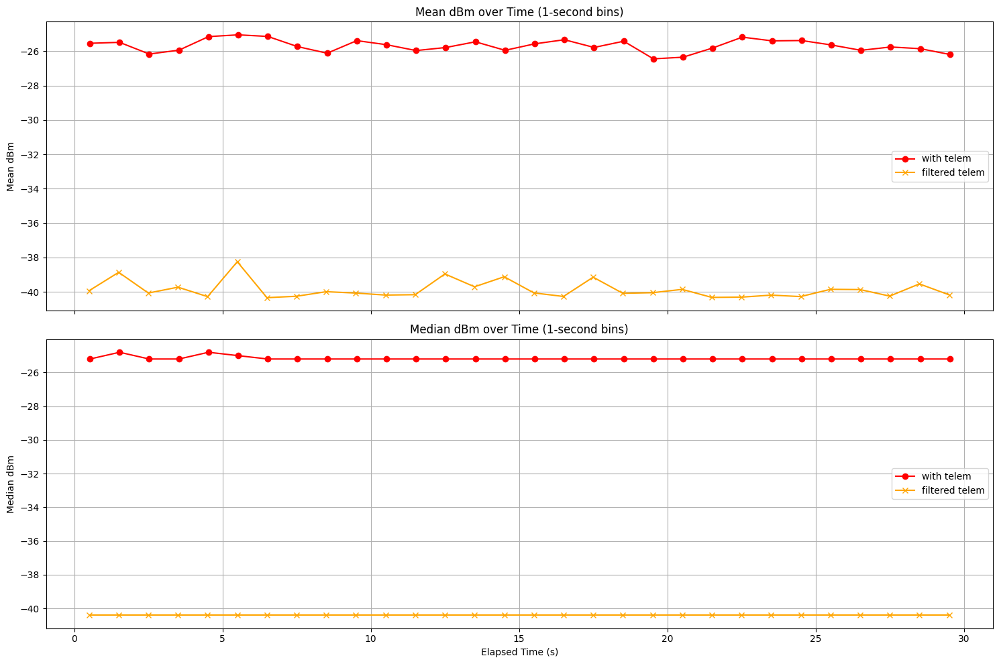

In [134]:
import matplotlib.pyplot as plt

# --- Binning Settings ---
bin_size_seconds = 1.0  # 1-second bins

# --- Function to Bin and Compute Mean/Median ---
def bin_and_aggregate(df, time_col, value_col, bin_size, agg_func):
    # Create bins
    min_time = df[time_col].min()
    max_time = df[time_col].max()
    bins = np.arange(min_time, max_time + bin_size, bin_size)
    
    # Bin the data
    binned = pd.cut(df[time_col], bins=bins, include_lowest=True)
    
    # Group by bins and apply aggregation
    result = df.groupby(binned)[value_col].agg(agg_func)
    
    # Use bin centers for plotting
    bin_centers = bins[:-1] + bin_size / 2
    result.index = bin_centers[:len(result)]
    
    return result

# --- Prepare Aggregated Data ---

# For potential_burst_points_df
mean_with_telem = bin_and_aggregate(potential_burst_points_df, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_potential = bin_and_aggregate(potential_burst_points_df, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)

# For df_final_filtered
mean_final = bin_and_aggregate(df_final_filtered, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_final = bin_and_aggregate(df_final_filtered, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)


mean_no_telem = bin_and_aggregate(df_no_telem, "Elapsed Time (s)", "dBm", bin_size_seconds, np.mean)
median_no_telem = bin_and_aggregate(df_no_telem, "Elapsed Time (s)", "dBm", bin_size_seconds, np.median)


# --- Plotting ---

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Top plot: Mean
ax1.plot(mean_with_telem.index, mean_with_telem.values, label="with telem", color='red', marker='o')
ax1.plot(mean_final.index, mean_final.values, label="filtered telem", color='orange', marker='x')
ax1.set_ylabel("Mean dBm")
ax1.set_title("Mean dBm over Time (1-second bins)")
ax1.grid(True)
ax1.legend()

# Bottom plot: Median
ax2.plot(median_potential.index, median_potential.values, label="with telem", color='red', marker='o')
ax2.plot(median_final.index, median_final.values, label="filtered telem", color='orange', marker='x')
ax2.set_ylabel("Median dBm")
ax2.set_xlabel("Elapsed Time (s)")
ax2.set_title("Median dBm over Time (1-second bins)")
ax2.grid(True)
ax2.legend()

plt.tight_layout()
plt.show()


fft proberen

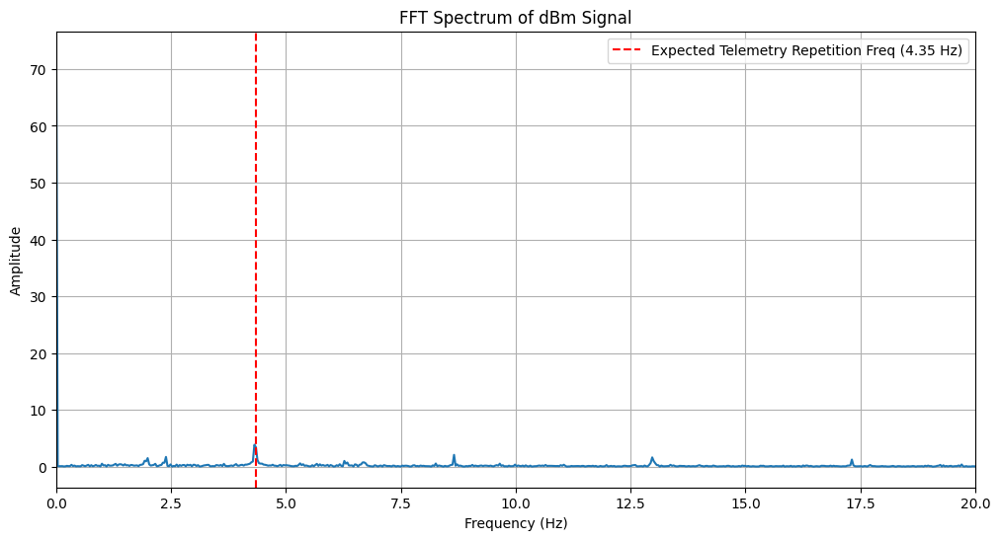

Notching out frequencies around 4.35 Hz


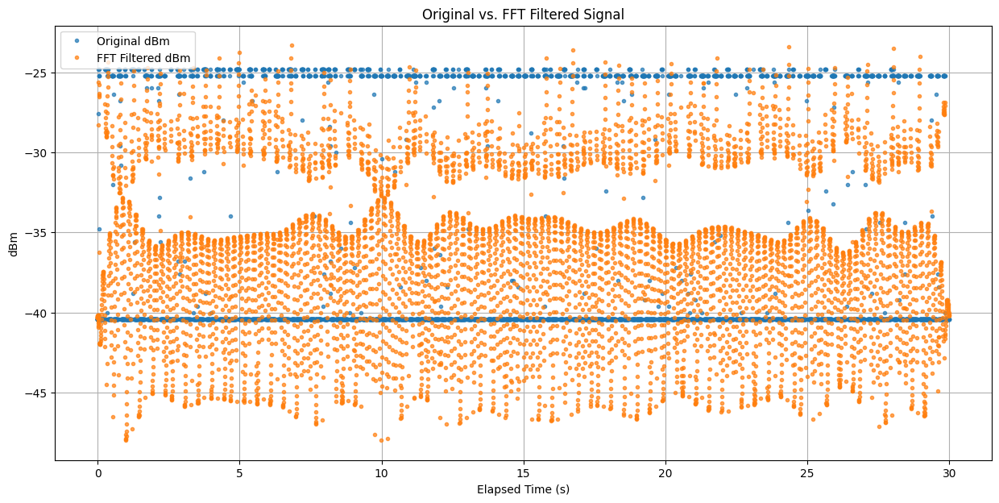

In [135]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.fft import fft, ifft, fftfreq

# Assume df_final_filtered is your data BEFORE trying to remove telemetry,
# and df_filtered contains the data where telemetry should be removed
# For this example, let's use df_filtered from your previous code.

# --- Parameters ---
csv_file ="raw-data\\2025-04-01_18-21-52_telem-oneside-after-MP-3m-90-antenna--90-0dbm-942.5hz-raw.csv"

# --- Load and Prepare Data ---
try:
    df = pd.read_csv(csv_file)
except FileNotFoundError:
    print(f"Error: CSV file not found at '{os.path.abspath(csv_file)}'. Please check the path.")
    exit()

required_cols = {"Elapsed Time (s)", "Value"}
if not required_cols.issubset(df.columns):
    missing_cols = required_cols - set(df.columns)
    print(f"Error: Required columns {missing_cols} not found in CSV.")
    exit()

# Sort by time just in case
df = df.sort_values("Elapsed Time (s)").reset_index(drop=True)

df_filtered = df.copy() # Use all data


# Calculate dBm
df_filtered["dBm"] = voltage_to_dbm(df_filtered["Value"])


# --- Parameters ---
sampling_rate = 1/0.005 # YOU NEED TO DETERMINE THIS!
# Estimate from your "Elapsed Time (s)" data.
# e.g., if time differences are mostly 0.001s, sampling_rate = 1/0.001 = 1000 Hz
time_values = df_filtered["Elapsed Time (s)"].values
dbm_values = df_filtered["dBm"].values

N = len(dbm_values)

# 1. Perform FFT
# Apply a window function if desired (e.g., Hann)
# window = np.hanning(N)
# yf = fft(dbm_values * window)
yf = fft(dbm_values)
xf = fftfreq(N, 1 / sampling_rate) # Frequency bins

# Plot the spectrum (magnitude)
plt.figure(figsize=(12, 6))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2])) # Plot positive frequencies
plt.title("FFT Spectrum of dBm Signal")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.xlim(0, 20) # Zoom in on lower frequencies
plt.axvline(1/0.23, color='r', linestyle='--', label='Expected Telemetry Repetition Freq (4.35 Hz)')
plt.legend()
plt.show()

# 2. Design a filter (Example: Notch filter for 4.35 Hz if it's prominent)
# THIS IS THE TRICKY PART and highly dependent on what you see in the spectrum
yf_filtered = yf.copy()
telemetry_repetition_freq = 1/0.23 # approx 4.35 Hz
freq_tolerance = 0.5 # Hz, how wide the notch is

# Find indices corresponding to the frequency to notch
# Be careful with floating point comparisons
notch_indices_positive = np.where((xf >= telemetry_repetition_freq - freq_tolerance) & \
                                  (xf <= telemetry_repetition_freq + freq_tolerance))[0]
notch_indices_negative = np.where((xf >= -telemetry_repetition_freq - freq_tolerance) & \
                                  (xf <= -telemetry_repetition_freq + freq_tolerance))[0]

if len(notch_indices_positive) > 0 or len(notch_indices_negative) > 0:
    print(f"Notching out frequencies around {telemetry_repetition_freq:.2f} Hz")
    yf_filtered[notch_indices_positive] = 0
    yf_filtered[notch_indices_negative] = 0 # Remember FFT is symmetric for real signals
else:
    print(f"No frequencies found in the notch range around {telemetry_repetition_freq:.2f} Hz")


# 3. Perform Inverse FFT
dbm_values_fft_filtered = ifft(yf_filtered)
dbm_values_fft_filtered = np.real(dbm_values_fft_filtered) # Should be real if input was real and filter symmetric

# 4. Plot original vs FFT-filtered
plt.figure(figsize=(15, 7))
plt.plot(time_values, dbm_values, ".",label="Original dBm", alpha=0.7)
plt.plot(time_values, dbm_values_fft_filtered, ".",label="FFT Filtered dBm", alpha=0.7)
plt.title("Original vs. FFT Filtered Signal")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.legend()
plt.grid(True)
plt.show()

new flightlog chart

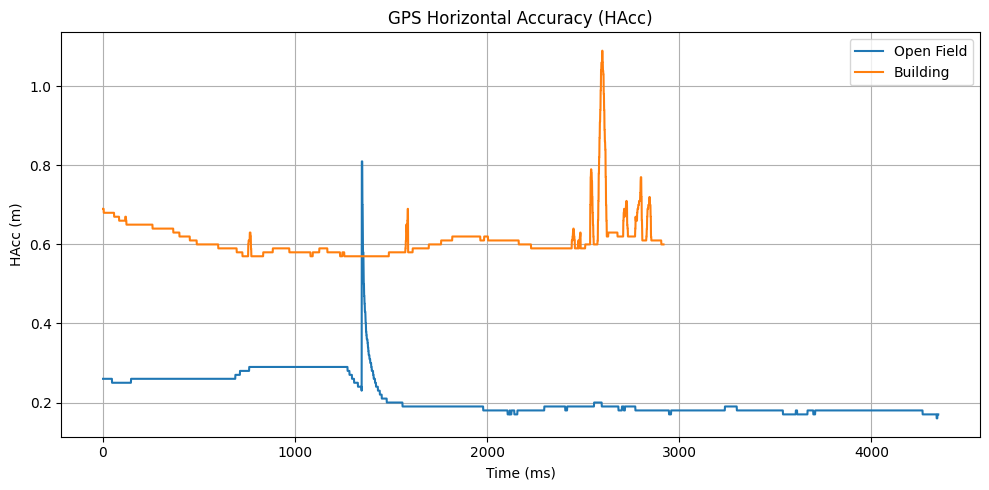

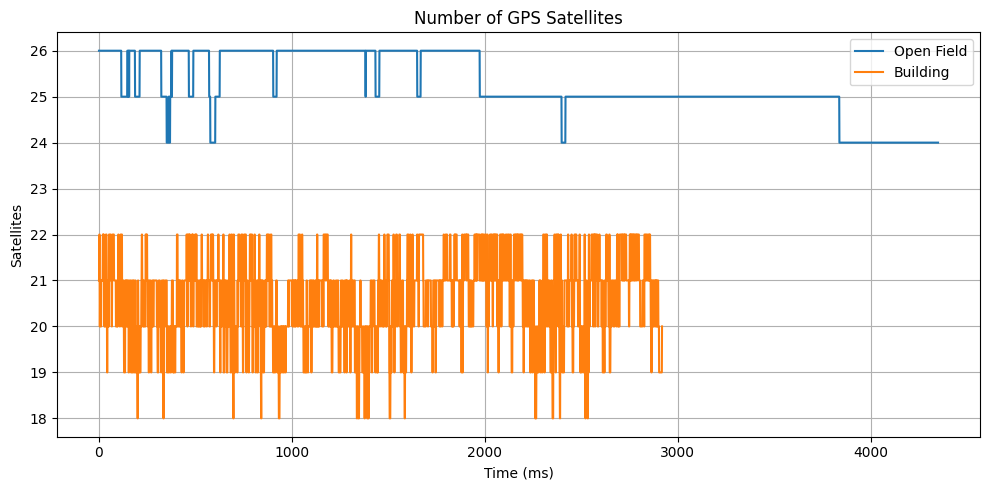

In [136]:
import pandas as pd
import matplotlib.pyplot as plt

# Load CSV files
openfield = pd.read_csv("open_field.csv")
building = pd.read_csv("surrounded_by_buildings.csv")

# Convert timestamp from ms to seconds for better plotting
openfield['Time (s)'] = openfield['timestamp(ms)'] / 1000
building['Time (s)'] = building['timestamp(ms)'] / 1000

# Plot HAcc
plt.figure(figsize=(10, 5))
plt.plot( openfield['GPA[0].HAcc'], label='Open Field')
plt.plot(building['GPA[0].HAcc'], label='Building')
plt.title('GPS Horizontal Accuracy (HAcc)')
plt.xlabel('Time (ms)')
plt.ylabel('HAcc (m)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# Plot NSats
plt.figure(figsize=(10, 5))
plt.plot( openfield['GPS[0].NSats'], label='Open Field')
plt.plot(building['GPS[0].NSats'], label='Building')
plt.title('Number of GPS Satellites')
plt.xlabel('Time (ms)')
plt.ylabel('Satellites')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

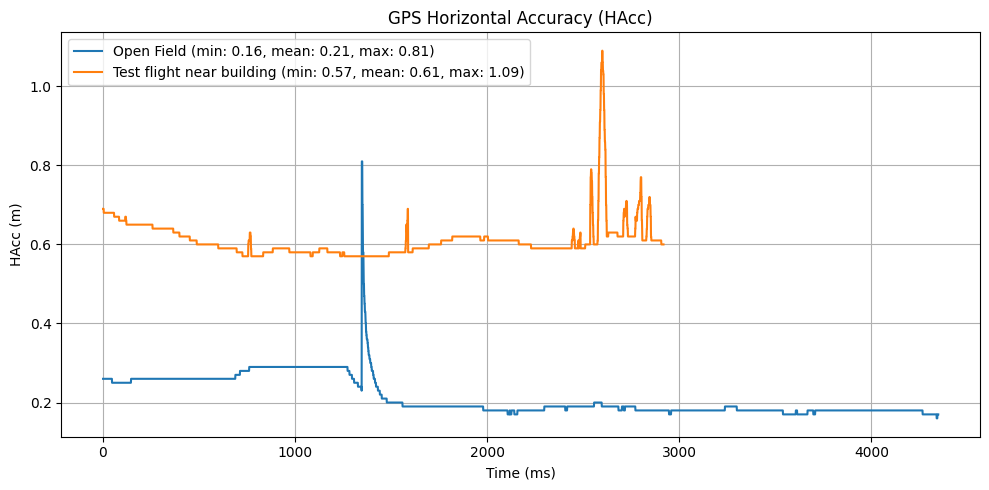

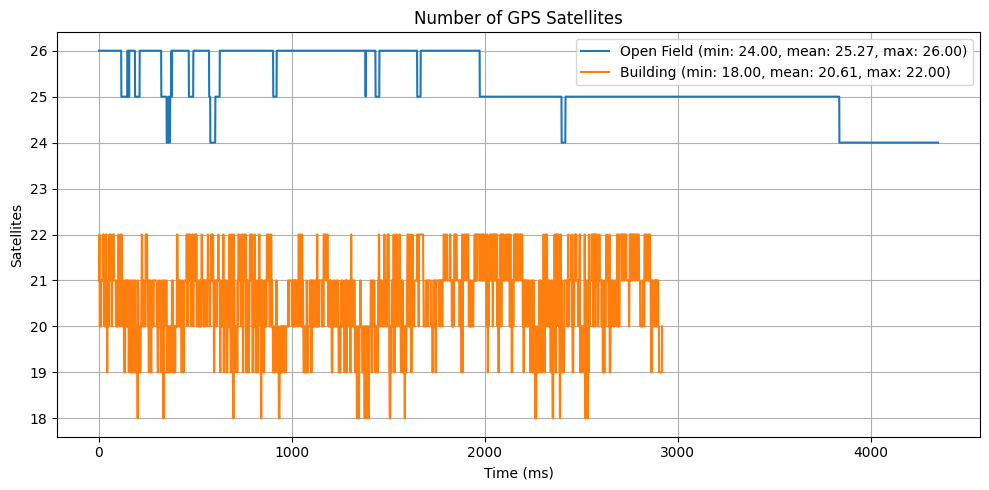

In [137]:
import pandas as pd
import matplotlib.pyplot as plt

# Load CSV files
openfield = pd.read_csv("open_field.csv")
building = pd.read_csv("surrounded_by_buildings.csv")

# Convert timestamp from ms to seconds
openfield['Time (s)'] = openfield['timestamp(ms)'] / 1000
building['Time (s)'] = building['timestamp(ms)'] / 1000

# Helper to create label with stats
def label_with_stats(name, series):
    return f"{name} (min: {series.min():.2f}, mean: {series.mean():.2f}, max: {series.max():.2f})"

# --- Plot HAcc ---
plt.figure(figsize=(10, 5))
plt.plot(
    openfield['GPA[0].HAcc'], 
    label=label_with_stats("Open Field", openfield['GPA[0].HAcc'])
)
plt.plot(
    building['GPA[0].HAcc'], 
    label=label_with_stats("Test flight near building", building['GPA[0].HAcc'])
)
plt.title('GPS Horizontal Accuracy (HAcc)')
plt.xlabel('Time (ms)')
plt.ylabel('HAcc (m)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

# --- Plot NSats ---
plt.figure(figsize=(10, 5))
plt.plot(
    openfield['GPS[0].NSats'], 
    label=label_with_stats("Open Field", openfield['GPS[0].NSats'])
)
plt.plot(
    
    building['GPS[0].NSats'], 
    label=label_with_stats("Building", building['GPS[0].NSats'])
)
plt.title('Number of GPS Satellites')
plt.xlabel('Time (ms)')
plt.ylabel('Satellites')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


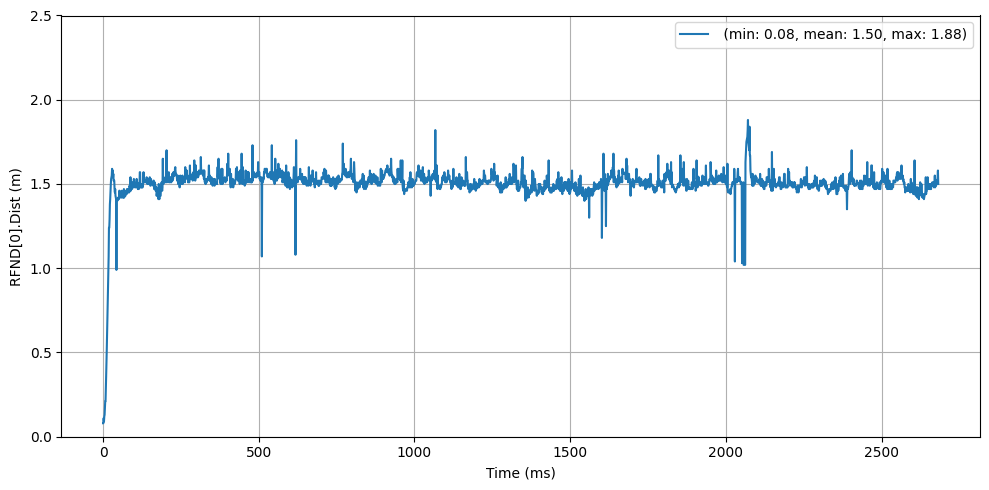

In [138]:
calm = pd.read_csv("sonarrange_calm.csv")
# --- Plot HAcc ---
calm['Time (s)'] = calm['timestamp(ms)'] / 1000

plt.figure(figsize=(10, 5))
plt.plot(
    calm['RFND[0].Dist'], 
    label=label_with_stats("", calm['RFND[0].Dist'])
)
# plt.plot(
#     building['GPA[0].HAcc'], 
#     label=label_with_stats("Building", building['GPA[0].HAcc'])
# )
plt.ylim([0,2.5])
plt.xlabel('Time (ms)')
plt.ylabel('RFND[0].Dist (m)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

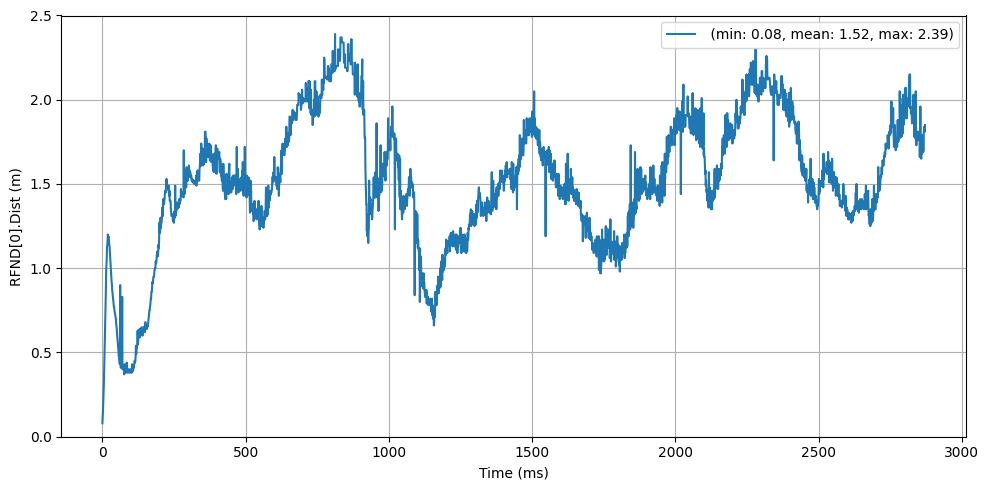

In [139]:
windy = pd.read_csv("sonarrange_windy.csv")
# --- Plot HAcc ---
windy['Time (s)'] = windy['timestamp(ms)'] / 1000

plt.figure(figsize=(10, 5))
plt.plot(
    windy['RFND[0].Dist'], 
    label=label_with_stats("", windy['RFND[0].Dist'])
)
# plt.plot(
#     building['GPA[0].HAcc'], 
#     label=label_with_stats("Building", building['GPA[0].HAcc'])
# )
plt.ylim([0,2.5])
plt.xlabel('Time (ms)')
plt.ylabel('RFND[0].Dist (m)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

telem en rc opnieuw

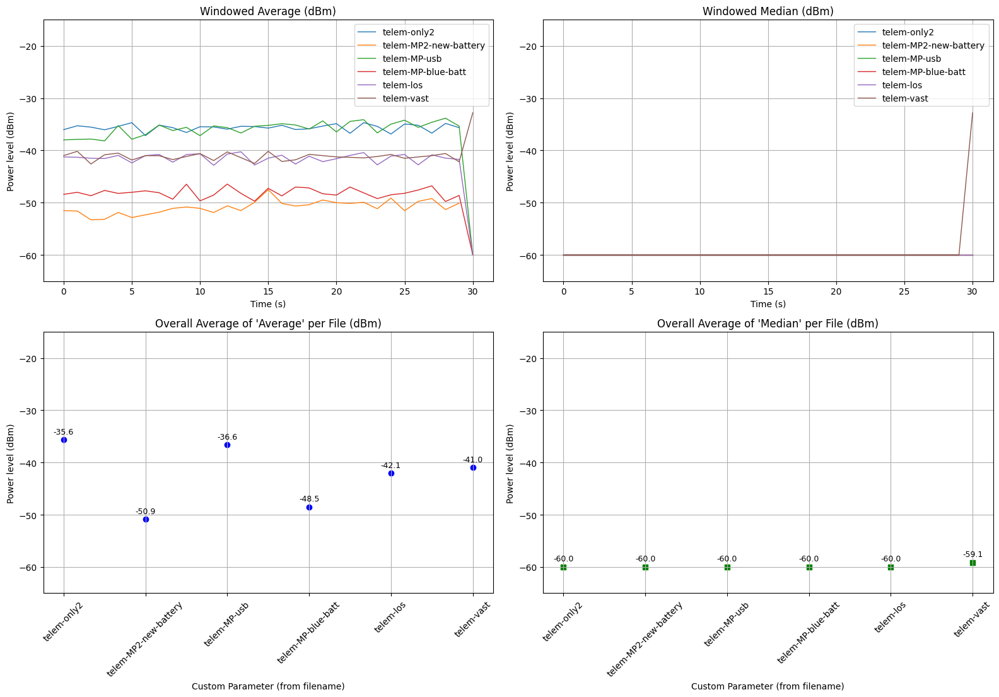

In [140]:
processed_files = [
"processed-data\\2025-04-27_12-58-17_telem-only2.csv",
# "processed-data\\2025-05-15_14-30-58_telem-MP.csv",
# "processed-data\\2025-05-15_15-06-32_telem-no-MP2-new-battery.csv",
"processed-data\\2025-05-15_15-09-32_telem-MP2-new-battery.csv",
# "processed-data\\2025-05-15_15-17-59_telem-no-MP-usb.csv",
"processed-data\\2025-05-15_15-19-01_telem-MP-usb.csv",
# "processed-data\\2025-05-15_15-26-06_telem-no-MP-blue-batt.csv",
"processed-data\\2025-05-15_15-27-59_telem-MP-blue-batt.csv",
"processed-data\\2025-05-15_15-48-58_telem-los.csv",
"processed-data\\2025-05-15_15-50-04_telem-vast.csv",
# "processed-data\\2025-05-15_15-39-03_telem-oneside-after-MP-3m-90-antenna-90.csv",
# "processed-data\\2025-05-15_15-39-47_telem-oneside-after-MP-3m-45-antenna-90.csv",
# "processed-data\\2025-05-15_15-40-58_telem-oneside-after-MP-3m-00-antenna-90.csv",
# "processed-data\\2025-05-15_15-41-52_telem-oneside-after-MP-3m--45-antenna-90.csv",
# "processed-data\\2025-05-15_15-42-32_telem-oneside-after-MP-3m--90-antenna-90.csv"

# "processed-data\\2025-04-27_13-02-10_telem-and-rc-7m.csv",
# "processed-data\\2025-04-27_13-03-14_telem-and-rc-3m.csv",
# "processed-data\\2025-04-27_13-04-43_rc-3m.csv",
# "processed-data\\2025-04-27_13-05-37_rc-7m.csv"
]# Dictionary to store averages

# titles=["Baseline measurement","Drone powered on","Motor interference","Propeller vibration analysis"]

average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels


for i,file in enumerate(processed_files):
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")
        # custom_param = titles[i]
        
        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 1].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 0].set_ylabel("Power level (dBm)")
axes[0, 1].set_ylabel("Power level (dBm)")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("Power level (dBm)")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("Power level (dBm)")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()

C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\2513583399.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)


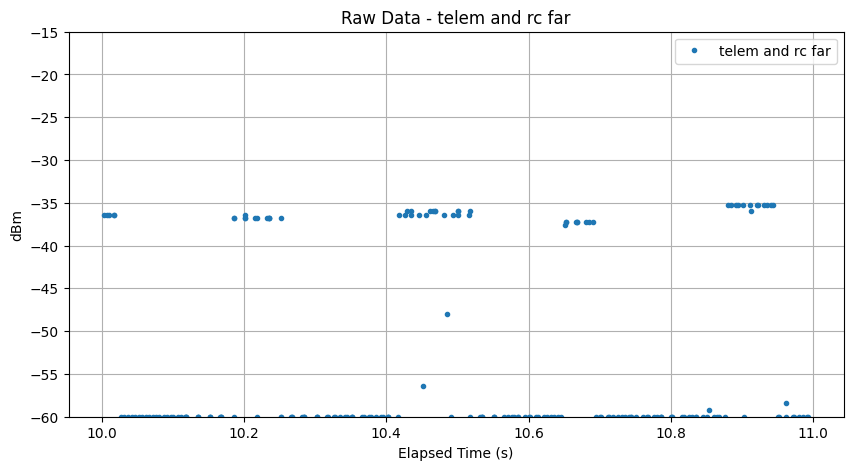

In [141]:
df = pd.read_csv("raw-data\\2025-05-15_16-03-32_telem-oneside-after-MP-3m-00-antenna-90-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 10) & (df["Elapsed Time (s)"] < 11)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5)
plt.title(f"Raw Data - {"telem and rc far"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


C:\Users\Raman\AppData\Local\Temp\ipykernel_4252\2254072809.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20' if len(unique_orientations) > 10 else 'tab10') # Choose based on number


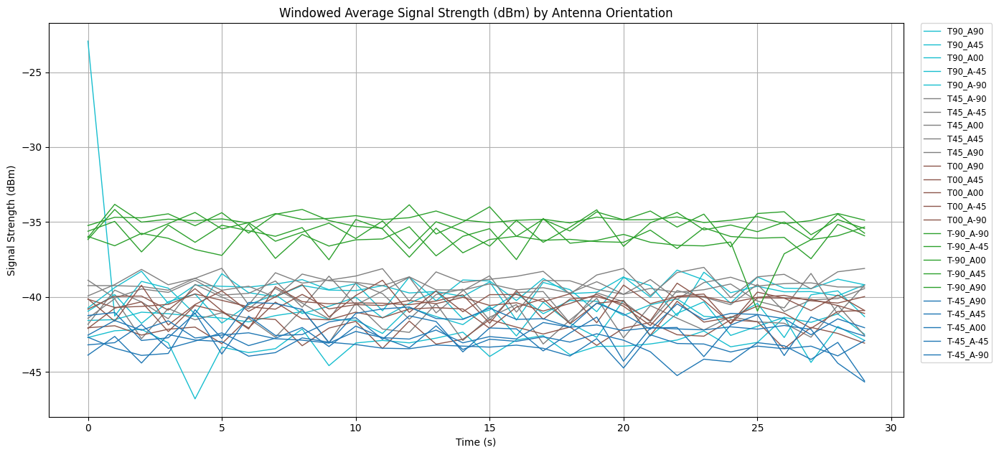

In [142]:

# Processed data files
processed_files = [
    "processed-data\\2025-05-15_15-55-33_telem-oneside-after-MP-3m-90-antenna-90.csv",
"processed-data\\2025-05-15_15-57-18_telem-oneside-after-MP-3m-90-antenna-45.csv",
"processed-data\\2025-05-15_15-57-51_telem-oneside-after-MP-3m-90-antenna-00.csv",
"processed-data\\2025-05-15_15-58-28_telem-oneside-after-MP-3m-90-antenna--45.csv",
"processed-data\\2025-05-15_15-59-02_telem-oneside-after-MP-3m-90-antenna--90.csv",
"processed-data\\2025-05-15_15-59-41_telem-oneside-after-MP-3m-45-antenna--90.csv",
"processed-data\\2025-05-15_16-00-16_telem-oneside-after-MP-3m-45-antenna--45.csv",
"processed-data\\2025-05-15_16-00-57_telem-oneside-after-MP-3m-45-antenna-00.csv",
"processed-data\\2025-05-15_16-01-37_telem-oneside-after-MP-3m-45-antenna-45.csv",
"processed-data\\2025-05-15_16-02-26_telem-oneside-after-MP-3m-45-antenna-90.csv",
"processed-data\\2025-05-15_16-03-32_telem-oneside-after-MP-3m-00-antenna-90.csv",
"processed-data\\2025-05-15_16-04-18_telem-oneside-after-MP-3m-00-antenna-45.csv",
"processed-data\\2025-05-15_16-04-59_telem-oneside-after-MP-3m-00-antenna-00.csv",
"processed-data\\2025-05-15_16-05-54_telem-oneside-after-MP-3m-00-antenna--45.csv",
"processed-data\\2025-05-15_16-06-35_telem-oneside-after-MP-3m-00-antenna--90.csv",
"processed-data\\2025-05-15_16-07-48_telem-oneside-after-MP-3m--90-antenna--90.csv",
"processed-data\\2025-05-15_16-08-47_telem-oneside-after-MP-3m--90-antenna--45.csv",
"processed-data\\2025-05-15_16-09-39_telem-oneside-after-MP-3m--90-antenna-00.csv",
"processed-data\\2025-05-15_16-10-16_telem-oneside-after-MP-3m--90-antenna-45.csv",
"processed-data\\2025-05-15_16-13-41_telem-oneside-after-MP-3m--90-antenna-90.csv",
"processed-data\\2025-05-15_16-14-23_telem-oneside-after-MP-3m--45-antenna-90.csv",
"processed-data\\2025-05-15_16-14-56_telem-oneside-after-MP-3m--45-antenna-45.csv",
"processed-data\\2025-05-15_16-15-39_telem-oneside-after-MP-3m--45-antenna-00.csv",
"processed-data\\2025-05-15_16-16-16_telem-oneside-after-MP-3m--45-antenna--45.csv",
"processed-data\\2025-05-15_16-16-51_telem-oneside-after-MP-3m--45-antenna--90.csv",
]
# --- Pre-calculate colors based on antenna orientation ---
antenna_orientations = set()
orientation_parts = {} # Store parts for label generation later

for file_path in processed_files:
    filename = os.path.basename(file_path)
    parts = filename.replace(".csv", "").split("3m")
    # Assuming format ..._telemOrientation_antenna-Orientation.csv
    telem_orient = parts[-1][1:parts[-1].index("antenna")-1] # e.g., '90', '45', '00', '-45', '-90'
    antenna_orient = parts[-1][parts[-1].index("antenna")+8:] # e.g., 'antenna-90'
    antenna_orientations.add(antenna_orient)
    orientation_parts[filename] = (telem_orient, antenna_orient)
    
import matplotlib.cm as cm # Import colormaps
import numpy as np
# Create a color map
unique_orientations = sorted(list(antenna_orientations))
# Use a colormap like 'tab10' or 'tab20' for distinct categorical colors
# cmap = cm.get_cmap('tab10', len(unique_orientations)) # Older Matplotlib
cmap = cm.get_cmap('tab20' if len(unique_orientations) > 10 else 'tab10') # Choose based on number
colors = cmap(np.linspace(0, 1, len(unique_orientations)))
color_map = {orient: color for orient, color in zip(unique_orientations, colors)}
# Add a fallback color for unknown orientations
color_map["unknown"] = 'grey'
# --- End Color Calculation ---


# --- Create Figure and Axes BEFORE the loop ---
fig, ax = plt.subplots(figsize=(14, 7)) # Adjust size as needed

# Check if there are any files to process
if not processed_files:
    print("No processed CSV files to plot.")
else:
    for file in processed_files:
        filename = os.path.basename(file)
        try:
            df = pd.read_csv(file)

            # Get pre-parsed orientations and determine color
            telem_orient, antenna_orient = orientation_parts.get(filename, (filename.replace(".csv",""), "unknown"))
            plot_color = color_map.get(telem_orient, 'grey') # Use grey if somehow missed

            if {"Average"}.issubset(df.columns): # Only need Average now
                # --- Plot on the Axes object 'ax' using the assigned color ---
                # Create a more descriptive label
                label = f"T{telem_orient}_A{antenna_orient}" # e.g., "T90_90 Avg"
                ax.plot(df.index, df["Average"], label=label, linewidth=1, color=plot_color)

            else:
                print(f"Warning: Column 'Average' not found in {filename}")

        except FileNotFoundError:
             print(f"Error: File not found {file}")
             continue # Skip to the next file
        except pd.errors.EmptyDataError:
            print(f"Warning: File is empty {filename}")
            continue # Skip empty files
        except Exception as e:
            print(f"Error processing file {filename}: {e}")
            continue # Skip to the next file if reading/processing fails


    # --- Configure the plot using 'ax' AFTER the loop ---
    ax.set_title("Windowed Average Signal Strength (dBm) by Antenna Orientation")
    ax.set_xlabel("Time (s)") # Changed label
    ax.set_ylabel("Signal Strength (dBm)")

    # Get handles and labels to check if anything was plotted
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        # Place legend outside the plot if it gets too crowded
        # Adjust bbox_to_anchor (x, y) location and loc parameter as needed.
        # (1.02, 1) means slightly to the right (1.02*width) and aligned top (1*height)
        ax.legend(fontsize='small', loc='upper left', bbox_to_anchor=(1.02, 1.0), borderaxespad=0.)
    else:
         print("No data was plotted.")

    ax.grid(True)
    # ax.set_ylim([-15,-35])

    # Adjust layout and show plot
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust rect top value slightly if title is still cut off
    plt.show()


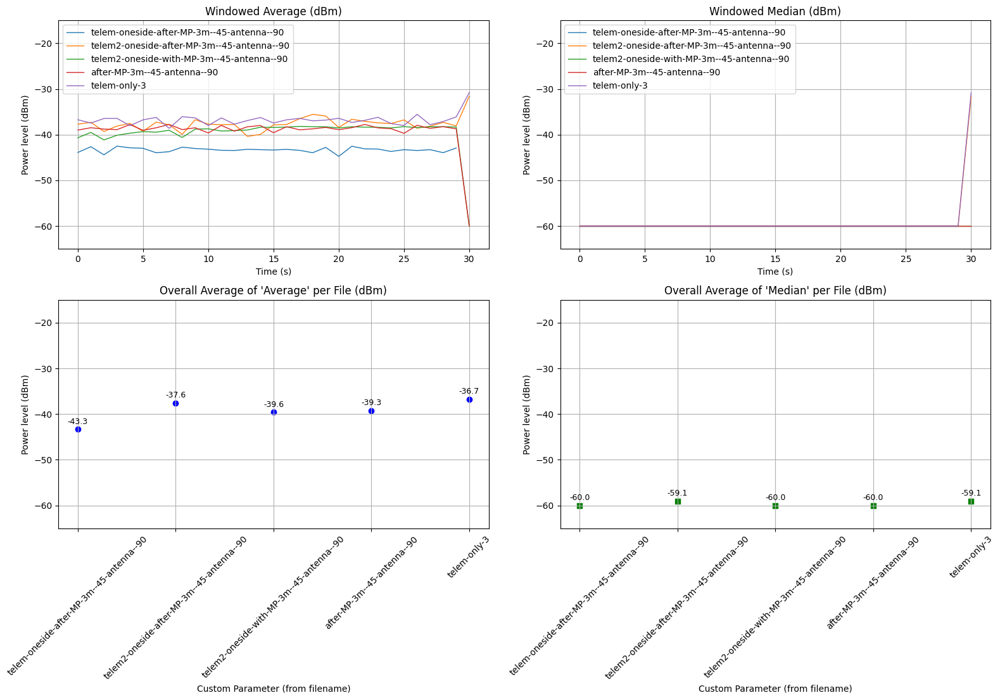

In [143]:
processed_files = [
"processed-data\\2025-05-15_16-16-51_telem-oneside-after-MP-3m--45-antenna--90.csv",
"processed-data\\2025-05-15_16-41-50_telem2-oneside-after-MP-3m--45-antenna--90.csv",
"processed-data\\2025-05-15_16-43-24_telem2-oneside-with-MP-3m--45-antenna--90.csv",
"processed-data\\2025-05-15_16-44-03_telem2-oneside-really_after-MP-3m--45-antenna--90.csv",
"processed-data\\2025-05-15_16-53-06_telem-only-3.csv",
# "processed-data\\2025-05-15_15-39-03_telem-oneside-after-MP-3m-90-antenna-90.csv",
# "processed-data\\2025-05-15_15-39-47_telem-oneside-after-MP-3m-45-antenna-90.csv",
# "processed-data\\2025-05-15_15-40-58_telem-oneside-after-MP-3m-00-antenna-90.csv",
# "processed-data\\2025-05-15_15-41-52_telem-oneside-after-MP-3m--45-antenna-90.csv",
# "processed-data\\2025-05-15_15-42-32_telem-oneside-after-MP-3m--90-antenna-90.csv"

# "processed-data\\2025-04-27_13-02-10_telem-and-rc-7m.csv",
# "processed-data\\2025-04-27_13-03-14_telem-and-rc-3m.csv",
# "processed-data\\2025-04-27_13-04-43_rc-3m.csv",
# "processed-data\\2025-04-27_13-05-37_rc-7m.csv"
]# Dictionary to store averages

# titles=["Baseline measurement","Drone powered on","Motor interference","Propeller vibration analysis"]

average_dbm_per_file = {}
average_median_dbm_per_file = {}

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(16, 12)) # Increased height slightly for labels


for i,file in enumerate(processed_files):
    try:
        df = pd.read_csv(file)
        filename = os.path.basename(file)
        custom_param = filename.split("_")[-1].replace(".csv", "")
        # custom_param = titles[i]
        
        if {"Average", "Median"}.issubset(df.columns):
            # Calculate overall average/median for the summary plots later
            # Using .mean() on the columns assumes each row in the processed file
            # represents a window/segment. If the processed file *already* contains
            # the single overall average/median, this calculation might be wrong.
            # Assuming the former (multiple rows per file):
            file_avg_average = df["Average"].mean()
            file_avg_median = df["Median"].mean()
            
            # Check for NaN/infinite values which can cause issues
            if pd.notna(file_avg_average) and pd.notna(file_avg_median):
                    average_dbm_per_file[custom_param] = file_avg_average
                    average_median_dbm_per_file[custom_param] = file_avg_median
            else:
                print(f"Warning: NaN or infinite values encountered calculating average/median for {file}. Skipping summary plots for this file.")
                continue # Skip plotting this file if averages are invalid

            # Plot the time series (or index series) of Average and Median
            # Assuming the index represents time or sequence if no specific time column exists
            axes[0, 0].plot(df.index, df["Average"], label=custom_param, linewidth=1)
            axes[0, 1].plot(df.index, df["Median"], label=custom_param, linewidth=1)

        else:
            print(f"Warning: Columns 'Average' or 'Median' not found in {file}")
            # Potentially disable the plot for this file if columns are missing

    except Exception as e:
        print(f"Error processing file {file}: {e}")
        continue # Skip to the next file if reading/processing fails


# Titles and legends for processed data plots
axes[0, 0].set_title("Windowed Average (dBm)")
axes[0, 1].set_title("Windowed Median (dBm)")
axes[0, 0].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 1].set_xlabel("Time (s)") # Or Time if applicable
axes[0, 0].set_ylabel("Power level (dBm)")
axes[0, 1].set_ylabel("Power level (dBm)")
if processed_files: # Only add legend if there's data
    axes[0, 0].legend()
    axes[0, 1].legend()
axes[0, 0].grid(True)
axes[0, 1].grid(True)


# --- Plot average of "Average" per file ---
# Get the file names (categories) and values for the plot
avg_file_names = list(average_dbm_per_file.keys())
avg_values = list(average_dbm_per_file.values())

axes[1, 0].scatter(avg_file_names, avg_values, color="b", marker="o")
# Add text labels above markers
for file_name, avg_value in average_dbm_per_file.items():
    axes[1, 0].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 0].set_title("Overall Average of 'Average' per File (dBm)")
axes[1, 0].set_xlabel("Custom Parameter (from filename)")
axes[1, 0].set_ylabel("Power level (dBm)")
axes[1, 0].tick_params(axis='x', rotation=45)
axes[1, 0].grid(True)


# --- Plot average of "Median" per file ---
    # Get the file names (categories) and values for the plot
med_file_names = list(average_median_dbm_per_file.keys())
med_values = list(average_median_dbm_per_file.values())

axes[1, 1].scatter(med_file_names, med_values, color="g", marker="s")
# Add text labels above markers
for file_name, avg_value in average_median_dbm_per_file.items():
    axes[1, 1].text(file_name, avg_value + 0.8, f"{avg_value:.1f}", # x, y, text
                        ha='center',    # Horizontal alignment
                        va='bottom',    # Vertical alignment
                        fontsize=9)     # Adjust font size as needed

axes[1, 1].set_title("Overall Average of 'Median' per File (dBm)")
axes[1, 1].set_xlabel("Custom Parameter (from filename)")
axes[1, 1].set_ylabel("Power level (dBm)")
axes[1, 1].tick_params(axis='x', rotation=45)
axes[1, 1].grid(True)

# Set common y-limits for all plots for better comparison
common_ylim = (-65, -15)
for i in range(2):
    for j in range(2):
        if axes[i,j].has_data(): # Only set ylim if plot has data
            axes[i,j].set_ylim(common_ylim)

# Adjust layout and show plot
plt.tight_layout(rect=[0, 0.03, 1, 0.96]) # Adjust rect to prevent title overlap
plt.show()

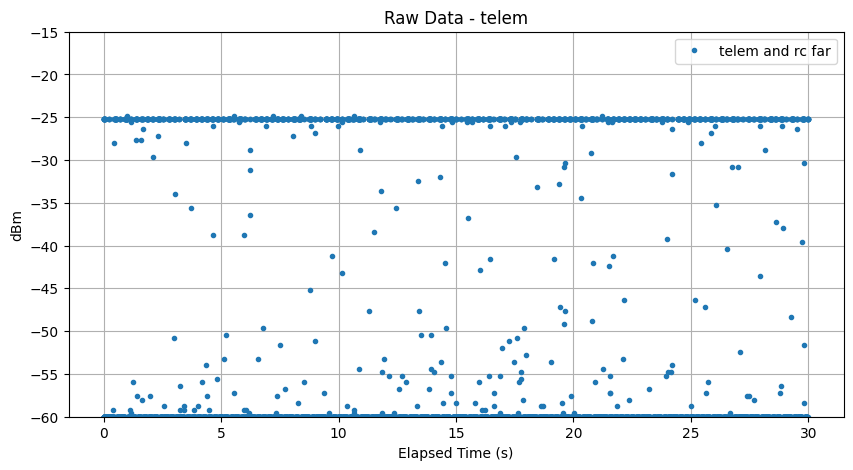

In [144]:

df = pd.read_csv("raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv")

# Select only data where "Second" == 90
df_filtered = df[(df["Elapsed Time (s)"] >= 0) & (df["Elapsed Time (s)"] < 30)]

df_filtered["dBm"] = df_filtered["Value"].apply(voltage_to_dbm)

# Plot the raw data
plt.figure(figsize=(10, 5))
# plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["Value"],".", label="dBm", linewidth=1.5)


plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem and rc far", linewidth=0.5,)
plt.title(f"Raw Data - {"telem"}")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("dBm")
plt.ylim(-60, -15)  
plt.grid(True)
plt.legend()


plt.show()


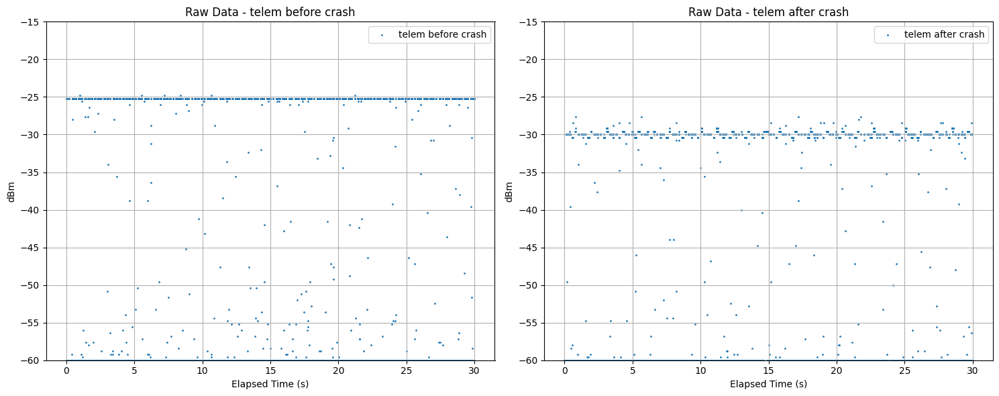

In [145]:
raw_files=[
    "raw-data\\2025-04-01_17-58-33_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    # "raw-data\\2025-05-15_15-59-02_telem-oneside-after-MP-3m-90-antenna--90-raw.csv",
    "raw-data\\2025-04-27_12-58-17_telem-only2-raw.csv"]
labels=["telem before crash",
        "telem after crash"
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(1, 2, figsize=(15, 6))  
# fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)
        axes[i].scatter(df["Elapsed Time (s)"], df["dBm"],  label=labels[i], s=1)
        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)  
        axes[i].grid(True)
        axes[i].legend()

# Hide any unused subplot (last subplot in row 2)
# axes[-1].set_visible(False)  

# Adjust layout
plt.tight_layout()
plt.show()


In [146]:
df=pd.read_csv( "raw-data\\2025-04-27_12-58-17_telem-only2-raw.csv")
df["dBm"] = df["Value"].apply(voltage_to_dbm)
df.dBm.max()

np.float64(-27.599999999999994)

In [154]:
def filter_burst(data_dict):

    # --- Parameters ---
    # start_time = 11.8 # Set to None or 0 to use all data initially
    # end_time = 13.9   # Set to None to use all data initially
    start_time = None # Set to None or 0 to use all data initially
    end_time = None
    # Parameters for Burst Identification
    initial_threshold_dbm = -40.0 # Amplitude threshold to identify POTENTIAL burst points
    max_intra_burst_gap = 0.01  # Max time gap WITHIN a single burst (tune based on sampling rate)

    # Parameters for Filtering Identified Bursts by Duration
    # *** Use values based on your "Histogram of Burst Durations" ***
    min_acceptable_telemetry_duration = 0.0098 # Example: Lower bound from histogram
    max_acceptable_telemetry_duration = 0.11 # Example: Upper bound from histogram

    # ***----------------------------------------------------***


    # --- Voltage to dBm Function ---
    def voltage_to_dbm(voltage):
        voltage = np.clip(voltage, 0.5, 2.0) # Clamp voltage based on expected range
        return (voltage / -0.025) + 20.0

    # --- Load and Prepare Data ---
    df = pd.DataFrame(data_dict)

    required_cols = {"Elapsed Time (s)", "Value"}
    if not required_cols.issubset(df.columns):
        missing_cols = required_cols - set(df.columns)
        print(f"Error: Required columns {missing_cols} not found in CSV.")
        return 0

    # Sort by time just in case
    df = df.sort_values("Elapsed Time (s)").reset_index(drop=True)

    # Apply time window if specified
    if start_time is not None and end_time is not None:
        df_filtered = df[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()
        if df_filtered.empty:
            print(f"Error: No data found in the specified time window ({start_time}s to {end_time}s).")
            return 0
    else:
        df_filtered = df.copy() # Use all data


    # Calculate dBm
    df_filtered["dBm"] = voltage_to_dbm(df_filtered["Value"])
    print(f"Loaded {len(df_filtered)} data points.")

    # --- Burst Identification (Based on your code structure) ---

    # 1. Identify *all* points above the initial threshold
    potential_burst_points_df = df_filtered[df_filtered["dBm"] > initial_threshold_dbm].copy()

    if potential_burst_points_df.empty:
        print(f"No points found above initial threshold {initial_threshold_dbm} dBm. No filtering applied.")
        df_final_filtered = df_filtered.copy() # Keep all data
        burst_events = [] # No events to analyze
    else:
        print(f"Found {len(potential_burst_points_df)} points initially above {initial_threshold_dbm} dBm.")
        all_burst_indices = potential_burst_points_df.index # Use original DataFrame indices
        all_burst_times = potential_burst_points_df["Elapsed Time (s)"].values
        all_burst_dbm = potential_burst_points_df["dBm"].values

        # 2. Group points into distinct bursts using max_intra_burst_gap
        burst_events = [] # List to store info for each identified segment
        current_burst_original_indices = []

        if len(all_burst_indices) > 0:
            current_burst_original_indices.append(all_burst_indices[0]) # Start with the first point's original index

            for i in range(1, len(all_burst_indices)):
                time_gap = all_burst_times[i] - all_burst_times[i-1]

                if time_gap > max_intra_burst_gap + 1e-9: # If gap is LARGER, previous burst ended
                    # Finalize the previous burst segment
                    start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
                    end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])

                    start_t = all_burst_times[start_idx_in_burst_points]
                    end_t = all_burst_times[end_idx_in_burst_points]
                    duration = end_t - start_t

                    # Store the original indices for potential removal later
                    burst_events.append({
                        "start_time": start_t,
                        "end_time": end_t,
                        "duration": duration,
                        "num_points": len(current_burst_original_indices),
                        "original_indices": list(current_burst_original_indices) # Store the indices from df_filtered
                    })
                    # Start a new burst
                    current_burst_original_indices = [all_burst_indices[i]]
                else:
                    # Add point's original index to the current burst
                    current_burst_original_indices.append(all_burst_indices[i])

            # Add the last burst after the loop finishes
            if current_burst_original_indices:
                start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
                end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])
                start_t = all_burst_times[start_idx_in_burst_points]
                end_t = all_burst_times[end_idx_in_burst_points]
                duration = end_t - start_t

                burst_events.append({
                    "start_time": start_t,
                    "end_time": end_t,
                    "duration": duration,
                    "num_points": len(current_burst_original_indices),
                    "original_indices": list(current_burst_original_indices)
                })

        print(f"Grouped into {len(burst_events)} distinct potential burst events based on threshold and gap.")

        # --- Filter Identified Bursts by Duration ---
        indices_to_remove = set() # Use a set for efficient addition of unique indices
        confirmed_telemetry_events = []
        outliers_not_removed=set()
        for event in burst_events:
            if min_acceptable_telemetry_duration <= event['duration'] <= max_acceptable_telemetry_duration:
                # This burst matches the telemetry duration profile

                # Extract the dBm values for this burst
                burst_points = df_filtered.loc[event['original_indices'], "dBm"]

                # --- Outlier Detection ---
                # Example: Define outliers as points > 2 standard deviations from mean
                median_dbm = burst_points.median()

                threshold = 1  
                lower_bound = median_dbm - threshold
                upper_bound = median_dbm + threshold

                # Identify good points (NOT outliers)
                good_points_mask = (burst_points >= lower_bound) & (burst_points <= upper_bound)
                outliers_not_removed.update()
                good_indices = burst_points[good_points_mask].index.tolist()
                bad_indices = burst_points[~good_points_mask].index.tolist()
                # Update: Only remove the good (non-outlier) points
                indices_to_remove.update(good_indices)
                outliers_not_removed.update(bad_indices)
                # Also optionally store the filtered event if you want
                filtered_event = event.copy()
                filtered_event['original_indices'] = good_indices
                confirmed_telemetry_events.append(filtered_event)

        print(f"Identified {len(confirmed_telemetry_events)} events matching telemetry duration profile ({min_acceptable_telemetry_duration:.4f}s - {max_acceptable_telemetry_duration:.4f}s).")
        print(f"Removing {len(indices_to_remove)} points identified as telemetry (after outlier removal).")

        # --- Final Filtering ---
        if indices_to_remove:
            # Use drop for efficiency if indices are known
            df_final_filtered = df_filtered.drop(index=list(indices_to_remove))
        else:
            df_final_filtered = df_filtered.copy() # No points to remove

    return df_final_filtered, df_filtered.loc[list(indices_to_remove)]


Loaded 6006 data points.
Found 6006 points initially above -40.0 dBm.
Grouped into 66 distinct potential burst events based on threshold and gap.
Identified 10 events matching telemetry duration profile (0.0098s - 0.1100s).
Removing 65 points identified as telemetry (after outlier removal).
Loaded 6007 data points.
Found 6007 points initially above -40.0 dBm.
Grouped into 73 distinct potential burst events based on threshold and gap.
Identified 11 events matching telemetry duration profile (0.0098s - 0.1100s).
Removing 75 points identified as telemetry (after outlier removal).
Loaded 6010 data points.
Found 6010 points initially above -40.0 dBm.
Grouped into 87 distinct potential burst events based on threshold and gap.
Identified 28 events matching telemetry duration profile (0.0098s - 0.1100s).
Removing 203 points identified as telemetry (after outlier removal).
Loaded 6003 data points.
Found 6003 points initially above -40.0 dBm.
Grouped into 70 distinct potential burst events based

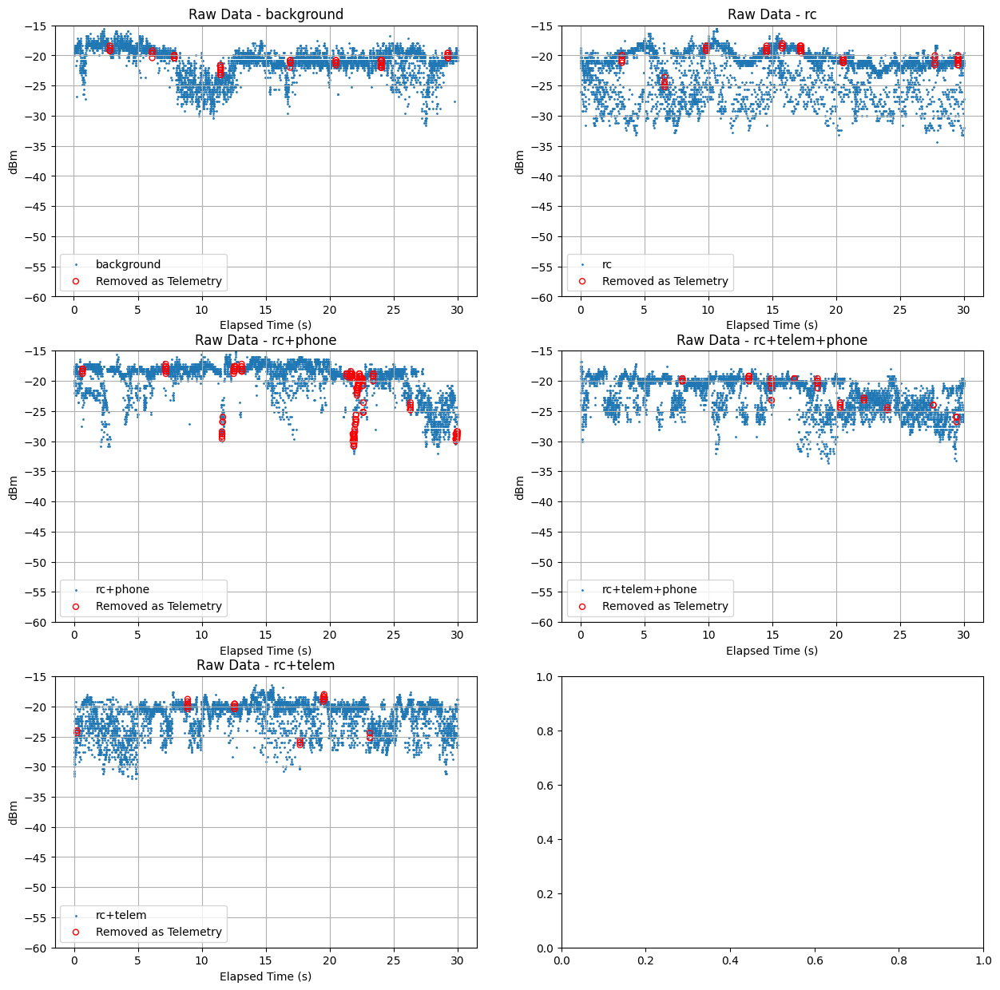

In [158]:
raw_files=[
    # "raw-data\\2025-05-16_16-25-28_bs-telem-no-phone-raw.csv",
    "raw-data\\2025-05-16_16-26-00_bs-telem-no-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-27-42_bs-telem-with-phone-raw.csv",
    # "raw-data\\2025-05-16_16-28-13_bs-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-29-19_bs-no-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-29-56_bs-no-telem-with-phone-raw.csv",
    # "raw-data\\2025-05-16_16-30-46_bs-no-telem-no-phone-raw.csv",
    # "raw-data\\2025-05-16_16-31-26_bs-no-telem-no-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-33-18_bs-with-rc-no-telem-no-phone-raw.csv",
    "raw-data\\2025-05-16_16-33-51_bs-with-rc-no-telem-no-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-34-58_bs-with-rc-no-telem-with-phone-raw.csv",
    "raw-data\\2025-05-16_16-35-29_bs-with-rc-no-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-36-49_bs-with-rc-with-telem-with-phone-raw.csv",
    "raw-data\\2025-05-16_16-37-21_bs-with-rc-with-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-38-17_bs-with-rc-with-telem-no-phone-raw.csv",
    "raw-data\\2025-05-16_16-38-49_bs-with-rc-with-telem-no-phone2-raw.csv",
    ]

labels=["background",
        "rc",
        "rc+phone",
        "rc+telem+phone",
        "rc+telem"
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(3, 2, figsize=(15, 15))  
# fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

# Process and plot raw data
for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    filename = os.path.basename(file).replace(".csv", "")
    custom_param = filename.split("_")[-1]

    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)

        # Apply burst filtering
        filtered_df, removed_points_df = filter_burst(df)

        # Plot the full data (filtered version)
        axes[i].scatter(filtered_df["Elapsed Time (s)"], filtered_df["dBm"], label=labels[i], s=1)

        # Highlight removed telemetry points
        axes[i].scatter(
            removed_points_df["Elapsed Time (s)"],
            removed_points_df["dBm"],
            marker='o',
            edgecolors='red',
            facecolors='none',
            s=25,
            label='Removed as Telemetry'
        )

        axes[i].set_title(f"Raw Data - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("dBm")
        axes[i].set_ylim(-60, -15)
        axes[i].grid(True)
        axes[i].legend()


Loaded 6006 data points.
Found 6006 points initially above -40.0 dBm.
Grouped into 66 distinct potential burst events based on threshold and gap.
Identified 10 events matching telemetry duration profile (0.0098s - 0.1100s).
Removing 65 points identified as telemetry (after outlier removal).
Loaded 6007 data points.
Found 6007 points initially above -40.0 dBm.
Grouped into 73 distinct potential burst events based on threshold and gap.
Identified 11 events matching telemetry duration profile (0.0098s - 0.1100s).
Removing 75 points identified as telemetry (after outlier removal).
Loaded 6010 data points.
Found 6010 points initially above -40.0 dBm.
Grouped into 87 distinct potential burst events based on threshold and gap.
Identified 28 events matching telemetry duration profile (0.0098s - 0.1100s).
Removing 203 points identified as telemetry (after outlier removal).
Loaded 6003 data points.
Found 6003 points initially above -40.0 dBm.
Grouped into 70 distinct potential burst events based

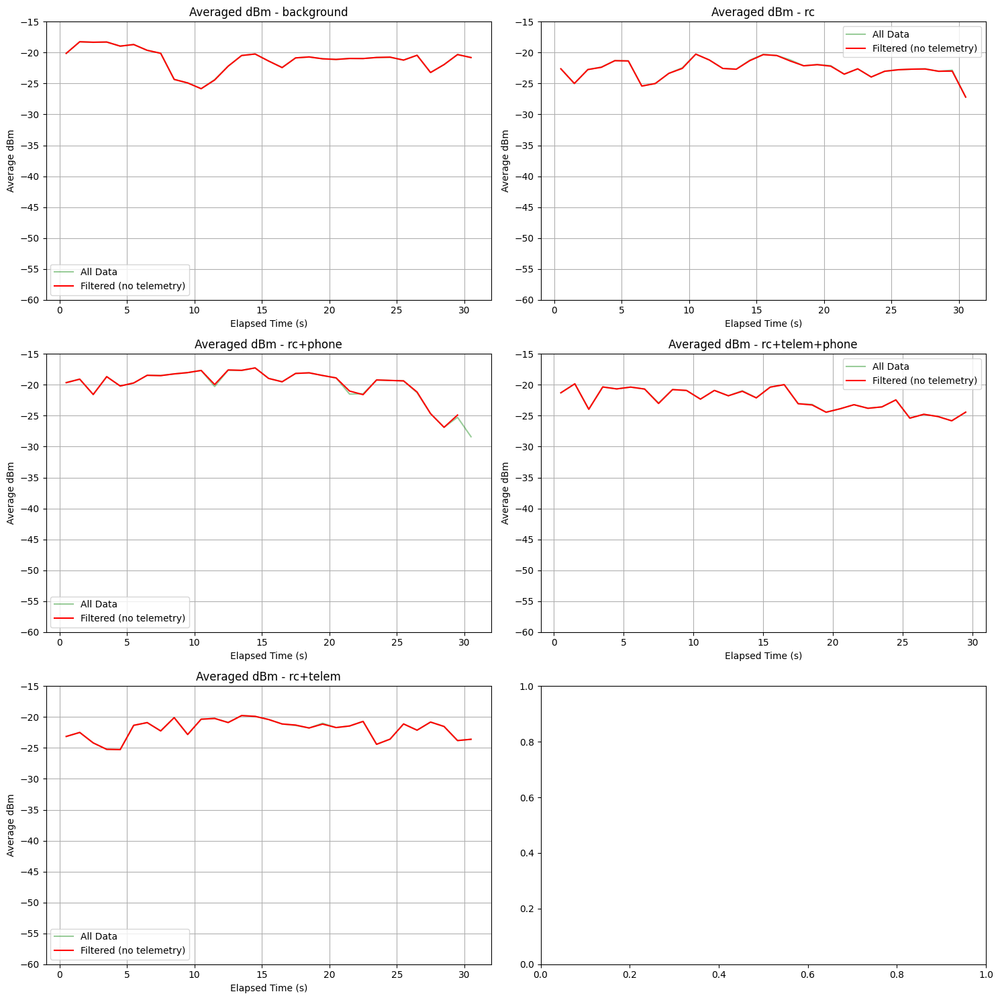

In [163]:
raw_files=[
    # "raw-data\\2025-05-16_16-25-28_bs-telem-no-phone-raw.csv",
    "raw-data\\2025-05-16_16-26-00_bs-telem-no-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-27-42_bs-telem-with-phone-raw.csv",
    # "raw-data\\2025-05-16_16-28-13_bs-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-29-19_bs-no-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-29-56_bs-no-telem-with-phone-raw.csv",
    # "raw-data\\2025-05-16_16-30-46_bs-no-telem-no-phone-raw.csv",
    # "raw-data\\2025-05-16_16-31-26_bs-no-telem-no-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-33-18_bs-with-rc-no-telem-no-phone-raw.csv",
    "raw-data\\2025-05-16_16-33-51_bs-with-rc-no-telem-no-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-34-58_bs-with-rc-no-telem-with-phone-raw.csv",
    "raw-data\\2025-05-16_16-35-29_bs-with-rc-no-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-36-49_bs-with-rc-with-telem-with-phone-raw.csv",
    "raw-data\\2025-05-16_16-37-21_bs-with-rc-with-telem-with-phone2-raw.csv",
    # "raw-data\\2025-05-16_16-38-17_bs-with-rc-with-telem-no-phone-raw.csv",
    "raw-data\\2025-05-16_16-38-49_bs-with-rc-with-telem-no-phone2-raw.csv",
    ]

labels=["background",
        "rc",
        "rc+phone",
        "rc+telem+phone",
        "rc+telem"
        ]

# Create subplots (2 rows, 3 columns)
fig, axes = plt.subplots(3, 2, figsize=(15, 15))  
# fig.suptitle("Sensor Data Comparison", fontsize=16)

# Flatten axes array for easy iteration
axes = axes.flatten()

bin_size = 1  # Bin size in seconds
# fig, axes = plt.subplots(len(raw_files), 1, figsize=(15, len(raw_files) * 5))

for i, file in enumerate(raw_files):
    df = pd.read_csv(file)
    if {"Elapsed Time (s)", "Value"}.issubset(df.columns):
        df["dBm"] = df["Value"].apply(voltage_to_dbm)

        # Apply burst filtering
        filtered_df, removed_points_df = filter_burst(df)

        # Perform windowed averaging
        avg_all = bin_and_aggregate(df, "Elapsed Time (s)", "dBm", bin_size, np.mean)
        avg_filtered = bin_and_aggregate(filtered_df, "Elapsed Time (s)", "dBm", bin_size, np.mean)

        # Plot both series
        axes[i].plot(avg_all.index, avg_all.values, label="All Data", alpha=0.4, color="green")
        axes[i].plot(avg_filtered.index, avg_filtered.values, label="Filtered (no telemetry)", color="red")

        axes[i].set_title(f"Averaged dBm - {labels[i]}")
        axes[i].set_xlabel("Elapsed Time (s)")
        axes[i].set_ylabel("Average dBm")
        axes[i].grid(True)
        axes[i].legend()
        axes[i].set_ylim([-60,-15])

plt.tight_layout()
plt.show()


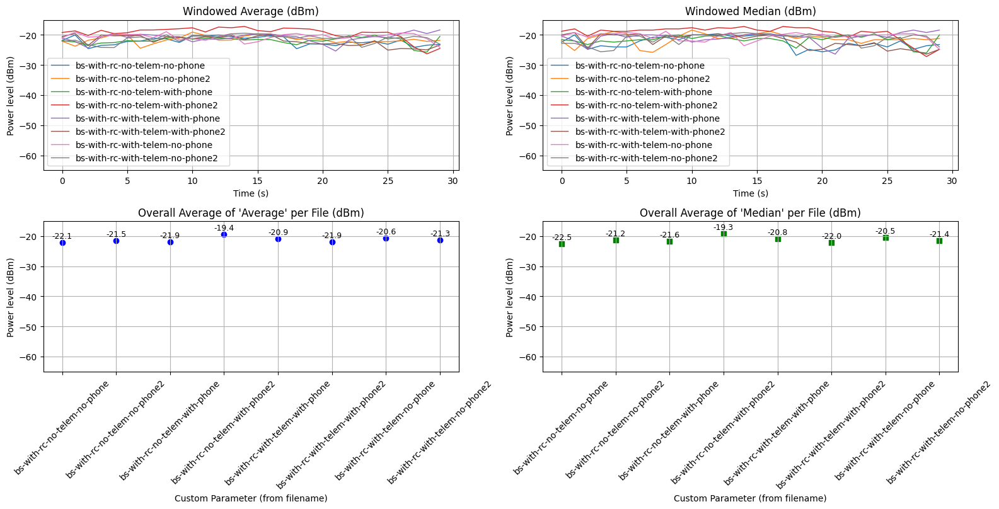

In [149]:

# Raw data files
raw_files = [
    # "raw-data\\2025-03-05_17-43-51_sweep-rpm-1070-1300-raw.csv",",
    # "raw-data\\2025-03-05_17-31-05_rc-on-startup-raw.csv","
]

# Processed data files
processed_files = [
    # "processed-data\\2025-05-16_16-25-28_bs-telem-no-phone.csv",
    # # "processed-data\\2025-05-16_16-26-00_bs-telem-no-phone2.csv",
    # "processed-data\\2025-05-16_16-27-42_bs-telem-with-phone.csv",
    # # "processed-data\\2025-05-16_16-28-13_bs-telem-with-phone2.csv",
    # # "processed-data\\2025-05-16_16-29-19_bs-no-telem-with-phone2.csv",
    # "processed-data\\2025-05-16_16-29-56_bs-no-telem-with-phone.csv",
    # "processed-data\\2025-05-16_16-30-46_bs-no-telem-no-phone.csv",
    # "processed-data\\2025-05-16_16-31-26_bs-no-telem-no-phone2.csv",
    "processed-data\\2025-05-16_16-33-18_bs-with-rc-no-telem-no-phone.csv",
    "processed-data\\2025-05-16_16-33-51_bs-with-rc-no-telem-no-phone2.csv",
    "processed-data\\2025-05-16_16-34-58_bs-with-rc-no-telem-with-phone.csv",
    "processed-data\\2025-05-16_16-35-29_bs-with-rc-no-telem-with-phone2.csv",
    "processed-data\\2025-05-16_16-36-49_bs-with-rc-with-telem-with-phone.csv",
    "processed-data\\2025-05-16_16-37-21_bs-with-rc-with-telem-with-phone2.csv",
    "processed-data\\2025-05-16_16-38-17_bs-with-rc-with-telem-no-phone.csv",
    "processed-data\\2025-05-16_16-38-49_bs-with-rc-with-telem-no-phone2.csv",
]
titles_raw=["Propeller vibration analysis","RC connection"]
titles_processed=["Baseline measurement","Drone powered on","Motor interference","Propeller vibration analysis","RC connection"]

make_plot(raw_files,processed_files)


Loaded 296 data points.
Found 296 points initially above -40.0 dBm.
Grouped into 296 distinct potential burst events based on threshold and gap.
{'start_time': np.float64(0.0), 'end_time': np.float64(0.0), 'duration': np.float64(0.0), 'num_points': 1, 'original_indices': [0]}
{'start_time': np.float64(0.2033898305084746), 'end_time': np.float64(0.2033898305084746), 'duration': np.float64(0.0), 'num_points': 1, 'original_indices': [1]}
{'start_time': np.float64(0.4067796610169492), 'end_time': np.float64(0.4067796610169492), 'duration': np.float64(0.0), 'num_points': 1, 'original_indices': [2]}
{'start_time': np.float64(0.6101694915254238), 'end_time': np.float64(0.6101694915254238), 'duration': np.float64(0.0), 'num_points': 1, 'original_indices': [3]}
{'start_time': np.float64(0.8135593220338984), 'end_time': np.float64(0.8135593220338984), 'duration': np.float64(0.0), 'num_points': 1, 'original_indices': [4]}
{'start_time': np.float64(1.0169491525423728), 'end_time': np.float64(1.016

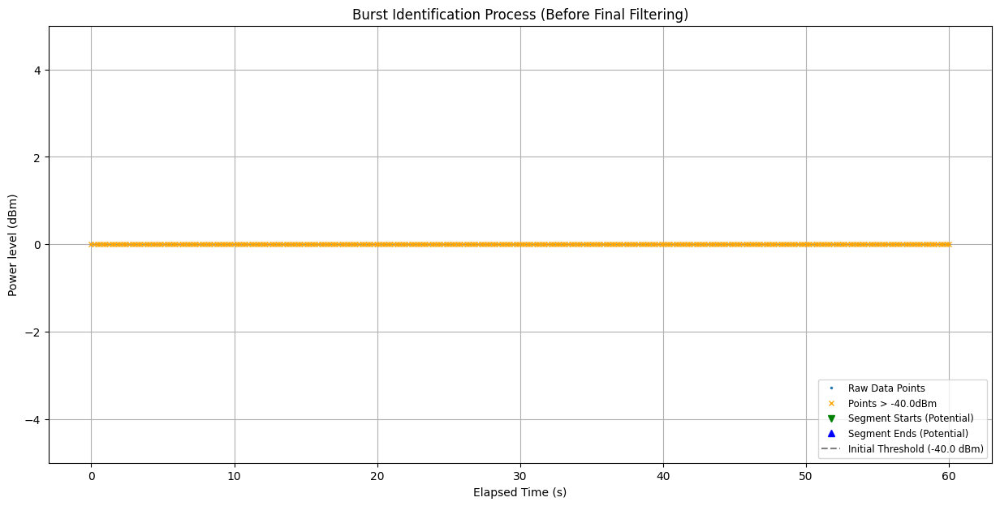

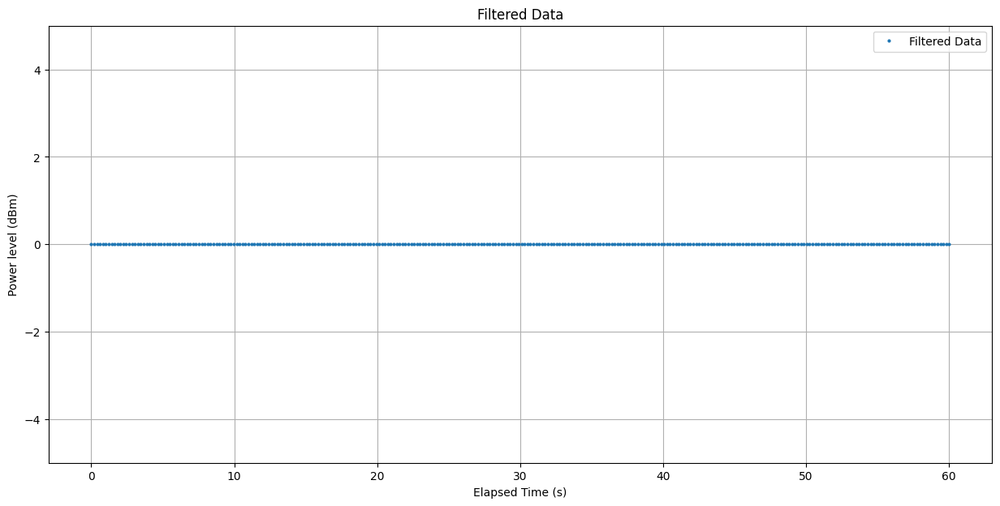

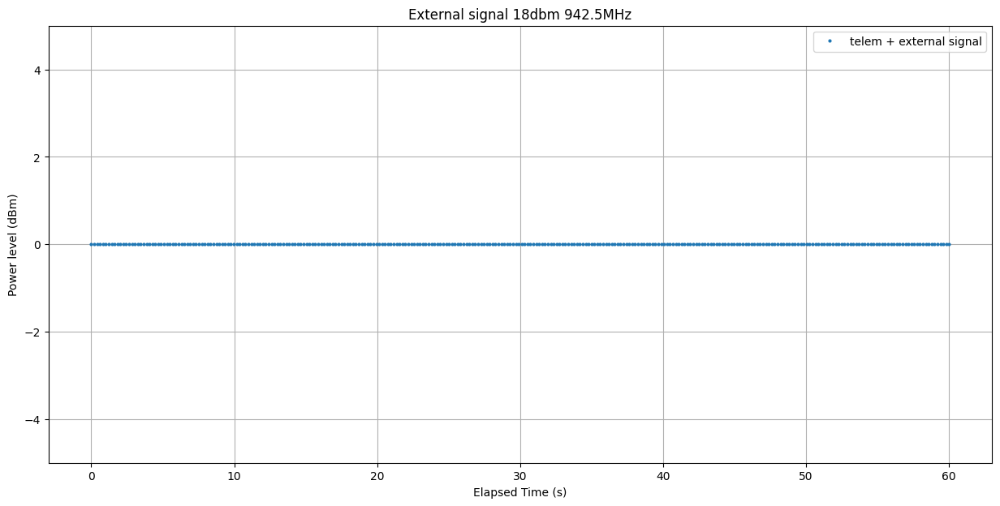


--- Statistics for ALL Segments Initially Identified ---
Mean Duration: 0.000000 s
Median Duration: 0.000000 s
Min Duration: 0.000000 s
Max Duration: 0.000000 s


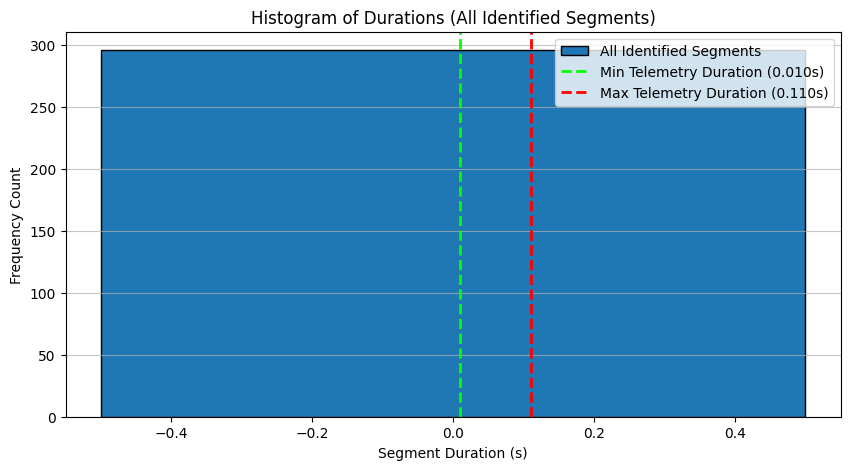

In [150]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
# from scipy.signal import lombscargle # Not used in this part
import warnings # Import warnings module

# Suppress specific FutureWarning from pandas if needed (optional)
warnings.simplefilter(action='ignore', category=FutureWarning)

# --- Parameters ---
csv_file = "raw-data\\2025-05-16_16-38-17_bs-with-rc-with-telem-no-phone-raw.csv"
# start_time = 11.8 # Set to None or 0 to use all data initially
# end_time = 13.9   # Set to None to use all data initially
start_time = None # Set to None or 0 to use all data initially
end_time = None
# Parameters for Burst Identification
initial_threshold_dbm = -40.0 # Amplitude threshold to identify POTENTIAL burst points
max_intra_burst_gap = 0.01  # Max time gap WITHIN a single burst (tune based on sampling rate)

# Parameters for Filtering Identified Bursts by Duration
# *** Use values based on your "Histogram of Burst Durations" ***
min_acceptable_telemetry_duration = 0.0098 # Example: Lower bound from histogram
max_acceptable_telemetry_duration = 0.11 # Example: Upper bound from histogram

# ***----------------------------------------------------***


# --- Voltage to dBm Function ---
def voltage_to_dbm(voltage):
    voltage = np.clip(voltage, 0.5, 2.0) # Clamp voltage based on expected range
    return (voltage / -0.025) + 20.0

# --- Load and Prepare Data ---
try:
    df = pd.read_csv(csv_file)
except FileNotFoundError:
    print(f"Error: CSV file not found at '{os.path.abspath(csv_file)}'. Please check the path.")
    exit()

required_cols = {"Elapsed Time (s)", "Value"}
if not required_cols.issubset(df.columns):
    missing_cols = required_cols - set(df.columns)
    print(f"Error: Required columns {missing_cols} not found in CSV.")
    exit()

# Sort by time just in case
df = df.sort_values("Elapsed Time (s)").reset_index(drop=True)

# Apply time window if specified
if start_time is not None and end_time is not None:
    df_filtered = df[(df["Elapsed Time (s)"] >= start_time) & (df["Elapsed Time (s)"] < end_time)].copy()
    if df_filtered.empty:
        print(f"Error: No data found in the specified time window ({start_time}s to {end_time}s).")
        exit()
else:
     df_filtered = df.copy() # Use all data


# Calculate dBm
df_filtered["dBm"] = voltage_to_dbm(df_filtered["Value"])
print(f"Loaded {len(df_filtered)} data points.")

# --- Burst Identification (Based on your code structure) ---

# 1. Identify *all* points above the initial threshold
potential_burst_points_df = df_filtered[df_filtered["dBm"] > initial_threshold_dbm].copy()

if potential_burst_points_df.empty:
    print(f"No points found above initial threshold {initial_threshold_dbm} dBm. No filtering applied.")
    df_final_filtered = df_filtered.copy() # Keep all data
    burst_events = [] # No events to analyze
else:
    print(f"Found {len(potential_burst_points_df)} points initially above {initial_threshold_dbm} dBm.")
    all_burst_indices = potential_burst_points_df.index # Use original DataFrame indices
    all_burst_times = potential_burst_points_df["Elapsed Time (s)"].values
    all_burst_dbm = potential_burst_points_df["dBm"].values

    # 2. Group points into distinct bursts using max_intra_burst_gap
    burst_events = [] # List to store info for each identified segment
    current_burst_original_indices = []

    if len(all_burst_indices) > 0:
        current_burst_original_indices.append(all_burst_indices[0]) # Start with the first point's original index

        for i in range(1, len(all_burst_indices)):
            time_gap = all_burst_times[i] - all_burst_times[i-1]

            if time_gap > max_intra_burst_gap + 1e-9: # If gap is LARGER, previous burst ended
                # Finalize the previous burst segment
                start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
                end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])

                start_t = all_burst_times[start_idx_in_burst_points]
                end_t = all_burst_times[end_idx_in_burst_points]
                duration = end_t - start_t

                # Store the original indices for potential removal later
                burst_events.append({
                    "start_time": start_t,
                    "end_time": end_t,
                    "duration": duration,
                    "num_points": len(current_burst_original_indices),
                    "original_indices": list(current_burst_original_indices) # Store the indices from df_filtered
                })
                # Start a new burst
                current_burst_original_indices = [all_burst_indices[i]]
            else:
                # Add point's original index to the current burst
                current_burst_original_indices.append(all_burst_indices[i])

        # Add the last burst after the loop finishes
        if current_burst_original_indices:
            start_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[0])
            end_idx_in_burst_points = all_burst_indices.get_loc(current_burst_original_indices[-1])
            start_t = all_burst_times[start_idx_in_burst_points]
            end_t = all_burst_times[end_idx_in_burst_points]
            duration = end_t - start_t

            burst_events.append({
                "start_time": start_t,
                "end_time": end_t,
                "duration": duration,
                "num_points": len(current_burst_original_indices),
                "original_indices": list(current_burst_original_indices)
            })

    print(f"Grouped into {len(burst_events)} distinct potential burst events based on threshold and gap.")

    # --- Filter Identified Bursts by Duration ---
    indices_to_remove = set() # Use a set for efficient addition of unique indices
    confirmed_telemetry_events = []
    outliers_not_removed=set()
    for event in burst_events:
        print(event)
        if min_acceptable_telemetry_duration <= event['duration'] <= max_acceptable_telemetry_duration:
            # This burst matches the telemetry duration profile

            # Extract the dBm values for this burst
            burst_points = df_filtered.loc[event['original_indices'], "dBm"]

            # --- Outlier Detection ---
            # Example: Define outliers as points > 2 standard deviations from mean
            # mean_dbm = burst_points.mean()
            # std_dbm = burst_points.std()

            # threshold = 2.0  
            median_dbm = burst_points.median()
            lower_bound = median_dbm - 1 
            upper_bound = median_dbm + 1

            # Identify good points (NOT outliers)
            good_points_mask = (burst_points >= lower_bound) & (burst_points <= upper_bound)
            outliers_not_removed.update()
            good_indices = burst_points[good_points_mask].index.tolist()
            bad_indices = burst_points[~good_points_mask].index.tolist()
            # Update: Only remove the good (non-outlier) points
            indices_to_remove.update(good_indices)
            outliers_not_removed.update(bad_indices)
            # Also optionally store the filtered event if you want
            filtered_event = event.copy()
            filtered_event['original_indices'] = good_indices
            confirmed_telemetry_events.append(filtered_event)

    print(f"Identified {len(confirmed_telemetry_events)} events matching telemetry duration profile ({min_acceptable_telemetry_duration:.4f}s - {max_acceptable_telemetry_duration:.4f}s).")
    print(f"Removing {len(indices_to_remove)} points identified as telemetry (after outlier removal).")

    # --- Final Filtering ---
    if indices_to_remove:
        # Use drop for efficiency if indices are known
        df_final_filtered = df_filtered.drop(index=list(indices_to_remove))
    else:
        df_final_filtered = df_filtered.copy() # No points to remove

# --- Plotting ---

# Plot 1: Original Data with Burst Identification Markers (like your original plot)
plt.figure(figsize=(15, 7))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="Raw Data Points", markersize=3)

if not potential_burst_points_df.empty:
    # Plot all points initially above threshold
    plt.plot(potential_burst_points_df["Elapsed Time (s)"], potential_burst_points_df["dBm"], "x", color='orange', markersize=4, label=f'Points > {initial_threshold_dbm}dBm')

    # Plot start/end markers for *all* identified segments (before duration filtering)
    all_segment_start_times = np.array([event["start_time"] for event in burst_events])
    all_segment_end_times = np.array([event["end_time"] for event in burst_events])
    plt.plot(all_segment_start_times, np.full(all_segment_start_times.shape, initial_threshold_dbm + 2), 'gv', markersize=6, label='Segment Starts (Potential)')
    plt.plot(all_segment_end_times, np.full(all_segment_end_times.shape, initial_threshold_dbm + 1), 'b^', markersize=6, label='Segment Ends (Potential)')

    # Highlight the points that were actually removed (confirmed telemetry)
    if 'indices_to_remove' in locals() and indices_to_remove:
         removed_points_df = df_filtered.loc[list(indices_to_remove)]
         plt.plot(removed_points_df["Elapsed Time (s)"], removed_points_df["dBm"], "o", color='red', markersize=5, fillstyle='none', label='Removed as Telemetry')

    # Highlight the points that were not removed but within burst (outliers)
    if 'outliers_not_removed' in locals() and outliers_not_removed:
         outlier_points_df = df_filtered.loc[list(outliers_not_removed)]
         plt.plot(outlier_points_df["Elapsed Time (s)"], outlier_points_df["dBm"], "o", color='hotpink', markersize=5, fillstyle='none', label='Outliers in Burst')


plt.axhline(initial_threshold_dbm, color='grey', linestyle='--', label=f'Initial Threshold ({initial_threshold_dbm} dBm)')
plt.title("Burst Identification Process (Before Final Filtering)")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Dynamic ylim
plt.grid(True)
plt.legend(loc='lower right', fontsize='small')
plt.show()


# Plot 2: Final Filtered Data
plt.figure(figsize=(15, 7))
plt.plot(df_final_filtered["Elapsed Time (s)"], df_final_filtered["dBm"], ".", label="Filtered Data", markersize=4)
plt.title("Filtered Data")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Use same ylim as plot 1 for comparison
plt.grid(True)
plt.legend()
plt.show()

# Plot 2: Final Filtered Data
plt.figure(figsize=(15, 7))
plt.plot(df_filtered["Elapsed Time (s)"], df_filtered["dBm"], ".", label="telem + external signal", markersize=4)
plt.title("External signal 18dbm 942.5MHz")
plt.xlabel("Elapsed Time (s)")
plt.ylabel("Power level (dBm)")
plt.ylim(df_filtered["dBm"].min() - 5, df_filtered["dBm"].max() + 5) # Use same ylim as plot 1 for comparison
plt.grid(True)
plt.legend()
plt.show()


# Plot 3: Histogram of Durations of ALL identified segments (before duration filtering)
if burst_events:
    all_segment_durations = np.array([event["duration"] for event in burst_events])
    print("\n--- Statistics for ALL Segments Initially Identified ---")
    print(f"Mean Duration: {np.mean(all_segment_durations):.6f} s")
    print(f"Median Duration: {np.median(all_segment_durations):.6f} s")
    print(f"Min Duration: {np.min(all_segment_durations):.6f} s")
    print(f"Max Duration: {np.max(all_segment_durations):.6f} s")

    plt.figure(figsize=(10, 5))
    duration_range = np.max(all_segment_durations) - np.min(all_segment_durations)
    n_bins = min(50, max(10, int(np.sqrt(len(all_segment_durations)))))
    if duration_range > 1e-9:
         plt.hist(all_segment_durations, bins=n_bins, edgecolor='black', label='All Identified Segments')
    else:
         plt.hist(all_segment_durations, bins=1, edgecolor='black', label='All Identified Segments')

    # Add lines for the acceptable telemetry duration range
    plt.axvline(min_acceptable_telemetry_duration, color='lime', linestyle='--', linewidth=2, label=f'Min Telemetry Duration ({min_acceptable_telemetry_duration:.3f}s)')
    plt.axvline(max_acceptable_telemetry_duration, color='red', linestyle='--', linewidth=2, label=f'Max Telemetry Duration ({max_acceptable_telemetry_duration:.3f}s)')

    plt.title("Histogram of Durations (All Identified Segments)")
    plt.xlabel("Segment Duration (s)")
    plt.ylabel("Frequency Count")
    plt.legend()
    plt.grid(axis='y', alpha=0.7)
    plt.show()
else:
    print("\nNo potential burst events identified.")